In [1]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.distributions as D
import torch.optim as optim
import numpy as np
import matplotlib.pyplot as plt
import math
import pylab as pl
from IPython import display
from IPython.core.display import HTML
from IPython.core.display import display as html_width
html_width(HTML("<style>.container { width:90% !important; }</style>"))

/tmp/ipykernel_3009/37510669.py:12: DeprecationWarning: Importing display from IPython.core.display is deprecated since IPython 7.14, please import from IPython display
  from IPython.core.display import display as html_width


In [2]:
suffix_name="9_trajects6D+tp_just_condition" #used to save the network with different names among notebooks

### Generating a sample training distribution

These demonstrations are used in the first experiment of the __Conditional Neural Movement Primitives (RSS 2019) by Yunus Seker, Mert Imre, Justus Piater and Emre Ugur__

In __CNMP__, trajectories are defined as f(X) = Y where
  * __X__: includes time and task parameter information
  * __Y__: includes corresponding output (joint, endpoint, image, motor, etc.) for the given time and task parameters

This experiment does not involve external task parameters. 6 training and 4 validation trajectories are plotted below

### Initialization

Input Requirements:

  * __obs_max__: Hyperparameter that decides to the maximum number of observations CNMP uses. In this experiment, it is set to 5

  * __d_N__: Number of demonstrations

  * __d_x__: X vector feature dim (*NOTE THAT*: task parameters are assumed to be inside of the X vector, concatenated to time value. This experiment does not use external parameters so d_x = 1)

  * __d_y__: Y vector feature dim (In this experiment the output of trajectories are 1D single values so d_y = 1)

  * __time_len__: length of the demonstrations, if all demonstrations does not have same length, use array and edit methods using time_len, or preprocess your data to interpolate into same time length (check numpy.interp)

  * __X__: shape=(d_N,time_len,d_x) --- time (and external parameter) values for each timestep for ith demonstration. d_x = 1+d_external_parameters

  * __Y__: shape=(d_N,time_len,d_y) --- corresponding values of f(X) for ith demonstration

loading ./long_data_record_jump_train.csv
(200, 18) added data
loading ./long_data_record_tunnel_train.csv
(200, 18) added data
X shape old  (2, 200, 1)
X data: (2, 200, 2)
Y data: (2, 200, 6)
an X data: [0. 1.]
d_N = 2
obs_max = 5
X = (2, 200, 2)
Y = (2, 200, 6)
d_x = 2
d_y = 6
time_len = 200


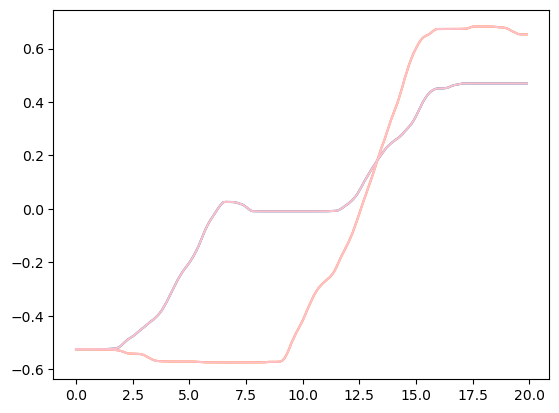

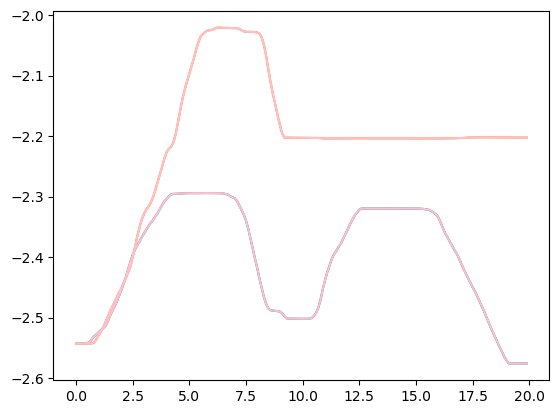

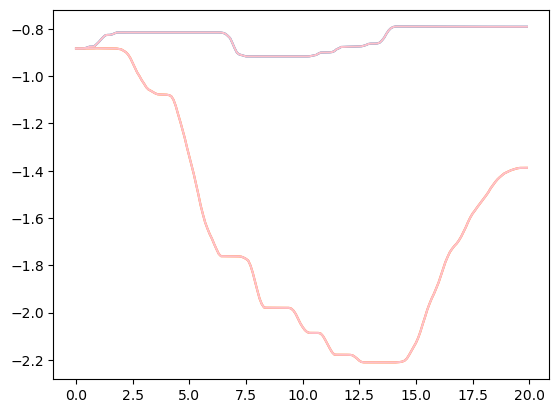

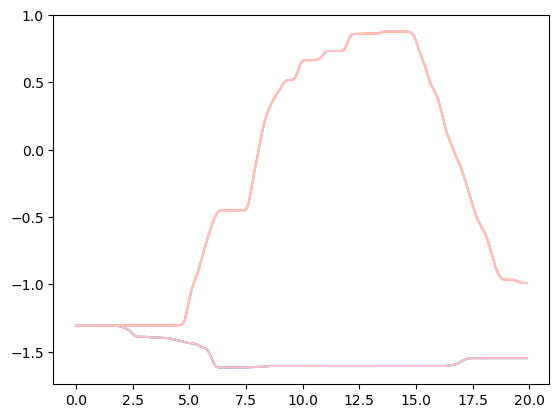

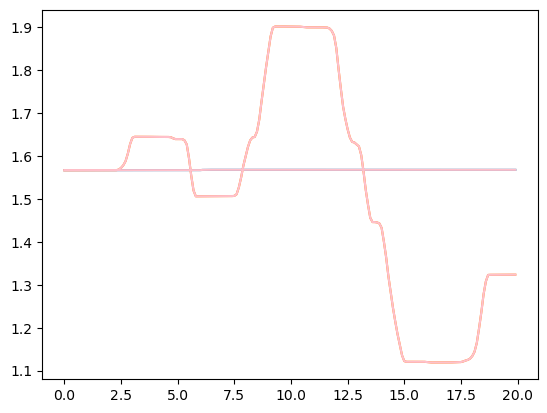

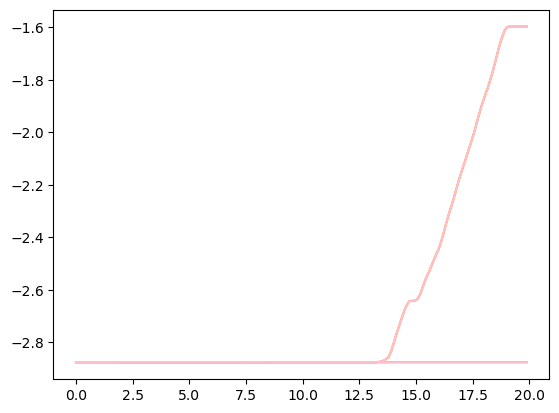

In [62]:
import os
folder_path="."

arrays=[]
for filename in os.listdir(folder_path):
    if filename.endswith('train.csv'):
        file_path = os.path.join(folder_path, filename)
        print("loading "+file_path)
        # Use numpy to load the CSV file into an array
        data = np.genfromtxt(file_path, delimiter=',', skip_header=1)
        print(str(data.shape)+" added data")
        arrays.append(data)
        
array_data = np.array(arrays)
X = array_data[:, :, 0] #column 0 is time
X = X[..., np.newaxis]  # add new axis from (2, 200) to (2, 200,1)
# append TP coulimn at the end of all demonstrations
print('X shape old ', X.shape)
new_col= np.zeros((2,200,1)) 
X = np.append(X, new_col, axis=2)
X[0,:,1]=1
X[1,:,1]=2
print("X data: "+str(X.shape))
Y = array_data[:, :, 12:18] #columns 12 to 17 are position joints
#Y = array_data[:, :, [10, 12,13,14,15,16,17,18]] #columns 10 gripper opening 12 to 18 joints
print("Y data: "+str(Y.shape))
# normalize time
times_original_ms_array=X[0,:,0].copy()
X[:,:,0]=X[:,:,0]/1000
print("an X data: "+str(X[0,0]))


# validation
v_X = X
v_Y = Y


obs_max = 5
d_N = X.shape[0] 
d_x , d_y = (X.shape[-1] , Y.shape[-1])
time_len = X.shape[1] 

print('d_N = %d'%d_N)
print('obs_max = %d'%obs_max)
print('X = %s'%(X.shape,))
print('Y = %s'%(Y.shape,))
print('d_x = %d'%d_x)
print('d_y = %d'%d_y)
print('time_len = %d'%time_len)

# plot
for i in range(d_y): #for every feature in Y vector we are plotting training data and its prediction
    for j in range(d_N):
        plt.plot(X[j,:,0],Y[j,:,i]) # plot training data assuming X[j,:,0] is time
    for k in range(v_X.shape[0]):
        plt.plot(v_X[k,:,0],v_Y[k,:,i], color='pink') # plot validation data assuming vX[j,:,0] is time
    plt.show()  
    
#save
#np.save('training_X',X)
#np.save('training_Y',Y)
#np.save('validation_X',v_X)
#np.save('validation_Y',v_Y)

# Conditional Neural Movement Primitives

### get_train_sample():

* Selects a random observation number __n__

* Selects a random demonstration id __d__

* Permutes demonstration __d__, so the first __n__ data can be sampled as __observations__. Selects __(n+1)th__ data to be the __target point__ that __CNMP__ will try to predict

* Returns:
  * __observations__: A batch that includes sampled observations
  * __target_X__: A batch that includes all target timesteps
  * __target_Y__: A batch that includes corresponding output for sampled __target_X__ timestep

__NOTICE__: In training, the size of the __target_X__ batch is set to __1__. But in test time, __any size__ of multiple timesteps can be queried as a batch. This allows __whole trajectory prediction at once__.

In [5]:
def get_train_sample():
    n = np.random.randint(0,obs_max)+1
    d = np.random.randint(0, d_N)
    
    observations = np.zeros((n,d_x+d_y)) 
    target_X = np.zeros((1,d_x))
    target_Y = np.zeros((1,d_y))
      
    perm = np.random.permutation(time_len)
    operm = np.random.permutation(time_len)
    observations[:n,:d_x] = X[d,operm[:n]]
    observations[:n,d_x:d_x+d_y] = Y[d,operm[:n]]
    target_X[0] = X[d,perm[n]]
    target_Y[0] = Y[d,perm[n]]
    return torch.from_numpy(observations), torch.from_numpy(target_X[:,0]).unsqueeze(0), torch.from_numpy(target_Y) # edit here to pass only the x query without tp
 

In [6]:
# example training sample
o,tx,ty = get_train_sample()
print(str(len(o))+" observations")
print("\n Observations (x+y): \n"+str(o))
print("\n Tensor X (query): \n"+str(tx))
print("\n Tensor Y (to guess): \n"+str(ty))

5 observations

 Observations (x+y): 
tensor([[ 6.8000e+00,  1.0000e+00,  2.5731e-02, -2.2987e+00, -8.3932e-01,
         -1.6172e+00,  1.5681e+00, -2.8761e+00],
        [ 1.6000e+01,  1.0000e+00,  4.5110e-01, -2.3345e+00, -7.9113e-01,
         -1.6063e+00,  1.5680e+00, -2.8762e+00],
        [ 1.3900e+01,  1.0000e+00,  2.4534e-01, -2.3192e+00, -7.9701e-01,
         -1.6064e+00,  1.5680e+00, -2.8762e+00],
        [ 1.2000e+01,  1.0000e+00,  1.8084e-02, -2.3531e+00, -8.7573e-01,
         -1.6065e+00,  1.5681e+00, -2.8761e+00],
        [ 6.3000e+00,  1.0000e+00,  5.5652e-03, -2.2938e+00, -8.1520e-01,
         -1.6170e+00,  1.5680e+00, -2.8761e+00]], dtype=torch.float64)

 Tensor X (query): 
tensor([[9.7000]], dtype=torch.float64)

 Tensor Y (to guess): 
tensor([[-0.0092, -2.5014, -0.9167, -1.6060,  1.5680, -2.8761]],
       dtype=torch.float64)


### predict_model(observations, target_X, plot):
Predicts outputs according to the given __observations__ and __target_X batch__.

* __observations__: Batch of observations. Dimensions = (obs_n, d_x+d_y) where __obs_n__ is the number of observations will ve used for this prediction
* __target_X__: Batch of time points to be predicted. Dimension = (target_n, d_x) where __target_n__ is the number of points to predict

*For whole trajectory prediction give all X points through time length as a batch (for ex. the first demonstration = X[0])*

* __prediction__: Predicted __means__ and __standart deviations__ for each time point in the X. Later splitted into __predicted_Y__ and __predicted_std__
* __plot__: if __True__, plots demonstrations and predicted distribution

In [7]:
def predict_model(observations, target_X, plot = True):
    predicted_Y = np.zeros((time_len,d_y))
    predicted_std = np.zeros((time_len,d_y))
    with torch.no_grad():
        prediction = model(torch.from_numpy(observations),torch.from_numpy(target_X)).numpy()
    predicted_Y = prediction[:,:d_y]
    predicted_std = np.log(1+np.exp(prediction[:,d_y:]))
    if plot: # We highly recommend that you customize your own plot function, but you can use this function as default
        for i in range(d_y): #for every feature in Y vector we are plotting training data and its prediction
            fig = plt.figure(figsize=(15,5))
            plt.subplot(121)
            for j in range(d_N):
                plt.plot(X[j,:,0],Y[j,:,i]) # plot training data assuming X[j,:,0] is time
            for k in range(v_X.shape[0]):
                plt.plot(v_X[k,:,0],v_Y[k,:,i], color='pink') # plot validation data assuming vX[j,:,0] is time
            #plt.plot(X[j,:,0],predicted_Y[:,i],marker="o",color='red')
            plt.errorbar(X[j,:,0],predicted_Y[:,i],yerr=predicted_std[:,i],color = 'black',alpha=0.4)
            plt.scatter(observations[:,0],observations[:,d_x+i],marker="X",color='black')
            plt.subplot(122)
            for j in range(d_N):
                plt.plot(X[j,:,0],Y[j,:,i]) # plot training data assuming X[j,:,0] is time
            for k in range(v_X.shape[0]):
                plt.plot(v_X[k,:,0],v_Y[k,:,i], color='pink') # plot validation data assuming vX[j,:,0] is time
            #plt.plot(X[j,:,0],predicted_Y[:,i],marker="o",color='red')
            plt.errorbar(X[j,:,0],predicted_Y[:,i],yerr=predicted_std[:,i],color = 'black',alpha=0.4)
            plt.scatter(observations[:,0],observations[:,d_x+i],marker="X",color='black')
            plt.ylim(-1, 1)
            plt.show() 
    return predicted_Y, predicted_std

### custom_loss(output, target):

Calculates __log probability__ of the true value of the target point according to the __multivariate Gaussian__ constructed by __predicted means__ and __stds__

Returns minus of that value

In [8]:
def log_prob_loss(output, target):
    mean, sigma = output.chunk(2, dim = -1)
    sigma = F.softplus(sigma)
    dist = D.Independent(D.Normal(loc=mean, scale=sigma), 1)
    return -torch.mean(dist.log_prob(target))

### CNMP Module

* __encoder__: Observation encoder module that takes a batch of __observations__ and converts each of them to their latent space representations

* __decoder__: Decoder module that takes the batch of __r_mean__ and __target_t__ tuples and produces mean and std values for each dimension of the output

*NOTICE: __Observation encoding__ is a __parallelized operation__ which __none__ of the inputs are dependent on each other and __none__ of the outputs are affected by the values of others in the batch*

In [9]:
class CNMP(nn.Module):
    
    def __init__(self):
        super(CNMP, self).__init__()
        
        # Encoder takes observations which are (X,Y) tuples and produces latent representations for each of them
        self.encoder = nn.Sequential(
        nn.Linear(d_x+d_y,128),nn.ReLU(),
        nn.Linear(128,128),nn.ReLU(),
        nn.Linear(128,128)
        )
        
        #Decoder takes the (r_mean, target_t) tuple and produces mean and std values for each dimension of the output
        self.decoder = nn.Sequential(
        nn.Linear(128+d_x-1,128),nn.ReLU(), #edit here to pass only x without tp
        nn.Linear(128,128),nn.ReLU(),
        nn.Linear(128,2*d_y)
        )
        
    def forward(self,observations,target_t):
        r = self.encoder(observations) # Generating observations
        r_mean = torch.mean(r,dim=0) # Taking mean and generating the general representation
        r_mean = r_mean.repeat(target_t.shape[0],1) # Duplicating general representation for every target_t
        concat = torch.cat((r_mean,target_t),dim=-1) # Concatenating each target_t with general representation
        output = self.decoder(concat) # Producing mean and std values for each target_t
        return output

### Initializing the model

In [10]:
model = CNMP().double()
learning_rate = 1e-4
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)

### Training the CNMP

<Figure size 640x480 with 0 Axes>

990000 Step


<Figure size 640x480 with 0 Axes>

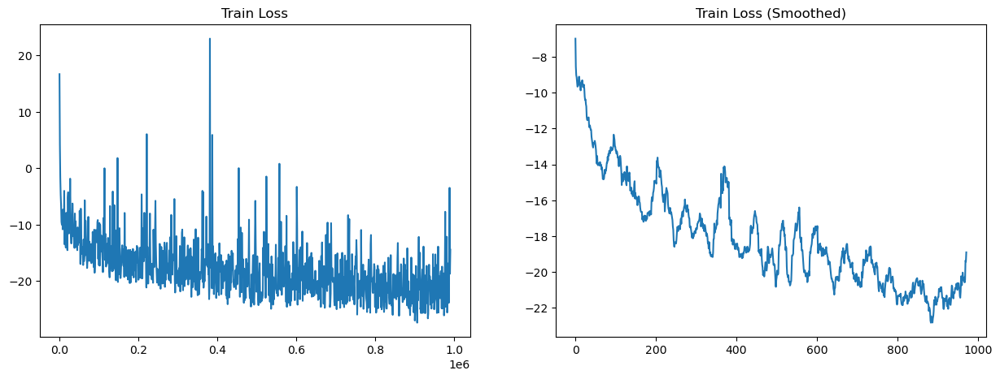

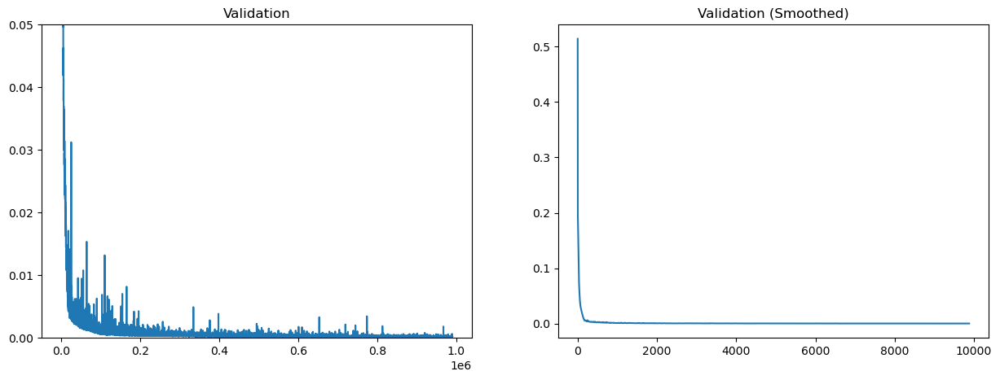

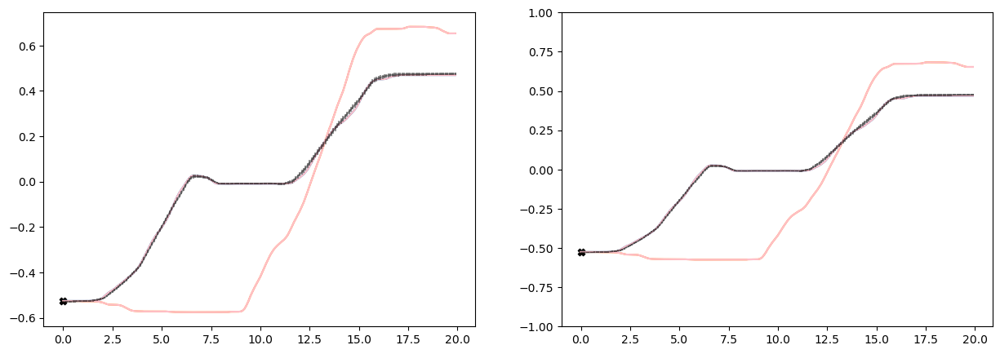

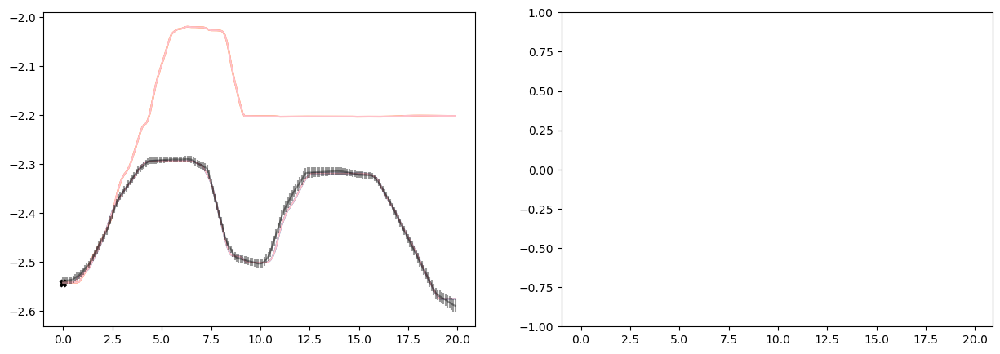

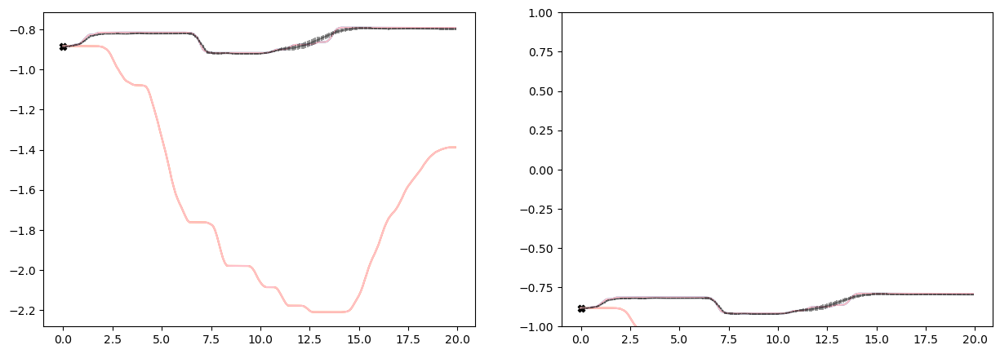

...

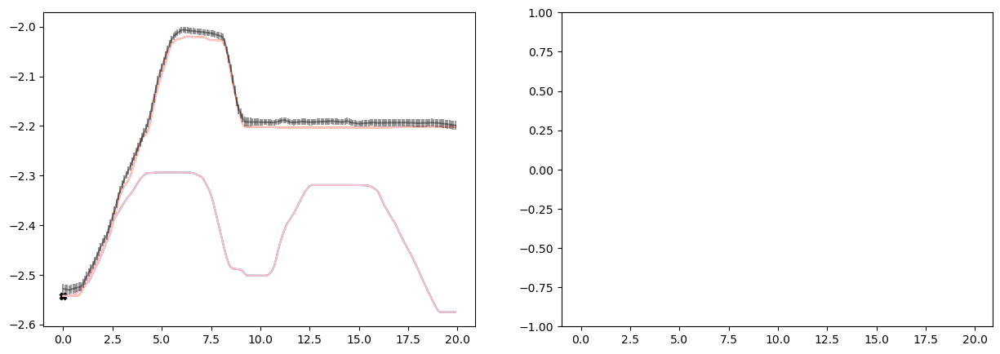

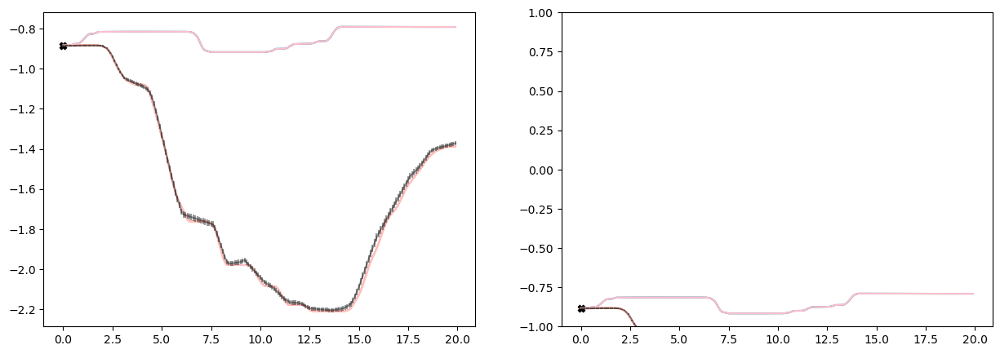

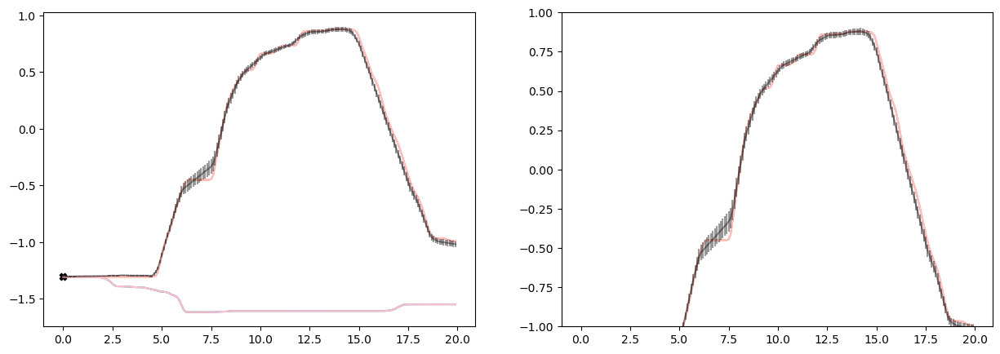

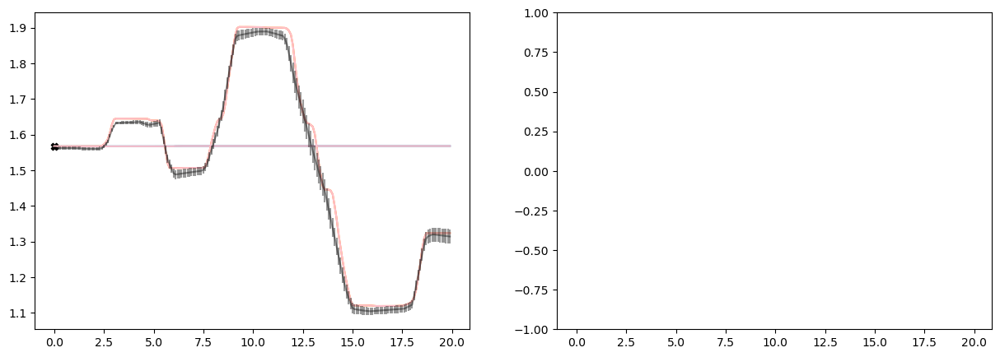

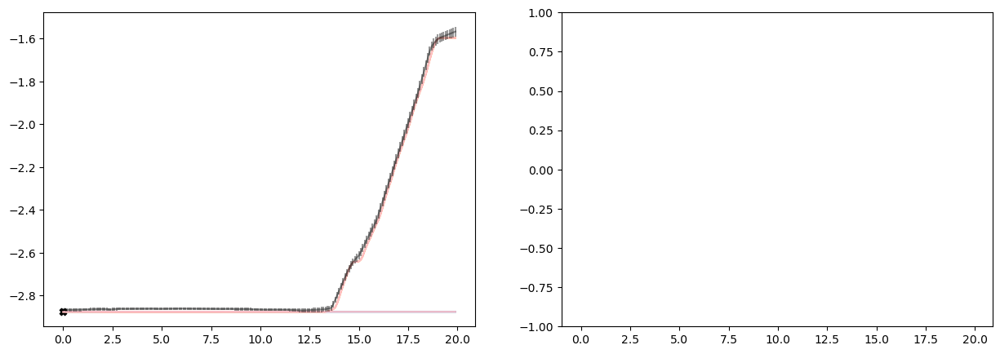

Finished Training


In [93]:
epochs = 1000000
loss_checkpoint = 1000
plot_checkpoint = 10000
validation_checkpoint = 100
validation_best_error = 9999999
losses = []
validations = []

for step in range(epochs):  # loop over the dataset multiple times
    observations, target_t, target_output = get_train_sample()
    
    optimizer.zero_grad()

    output = model(observations, target_t)
    loss = log_prob_loss(output, target_output)
    loss.backward()
    optimizer.step()
    
    if step % loss_checkpoint == 0:
        losses.append([step,loss.data])
    
    if step % validation_checkpoint == 0:
        validation_current_error = 0
        for i in range(v_X.shape[0]):
            predicted_Y,predicted_std = predict_model(np.array([np.concatenate((v_X[i,0],v_Y[i,0]))]), np.delete(v_X[i], 1, axis=1), plot= False) #edit here to pass v_X only with first element and not tp
            validation_current_error += np.mean((predicted_Y - v_Y[i,:])**2) / v_X.shape[0]
        validations.append([step,validation_current_error])
        if validation_current_error < validation_best_error and step>20000:
            validation_best_error = validation_current_error
            torch.save(model.state_dict(), 'cnmp_best_validation'+suffix_name+str(step)+'.h5')
            print(' New validation best. Error is ', validation_current_error)
        
    if step % plot_checkpoint == 0:
        #clearing output cell
        display.clear_output(wait=True)
        display.display(pl.gcf())
        
        print(step,'Step')
        #plotting training examples and smoothed losses
        plt.figure(figsize=(15,5))
        plt.subplot(121)
        plt.title('Train Loss')
        plt.plot(np.array(losses)[:,0],np.array(losses)[:,1])
        plt.subplot(122)
        plt.title('Train Loss (Smoothed)')
        kernel_size = 20
        cumsum = np.cumsum(np.insert(np.array(losses)[:,1], 0, 0)) 
        smoothed = (cumsum[kernel_size:] - cumsum[:-kernel_size]) / float(kernel_size)
        plt.plot(range(len(smoothed)),smoothed)
        plt.show()
        #plot validation
        plt.figure(figsize=(15,5))
        plt.subplot(121)
        plt.title('Validation')
        plt.plot(np.array(validations)[:,0],np.array(validations)[:,1])
        plt.ylim(0, 0.05)
        plt.subplot(122)
        plt.title('Validation (Smoothed)')
        kernel_size = 20
        cumsum = np.cumsum(np.insert(np.array(validations)[:,1], 0, 0)) 
        smoothed = (cumsum[kernel_size:] - cumsum[:-kernel_size]) / float(kernel_size)
        plt.plot(range(len(smoothed)),smoothed)
        plt.show()
        
        #plotting validation cases
        for i in range(v_X.shape[0]):
            predict_model(np.array([np.concatenate((v_X[i,0],v_Y[i,0]))]), np.delete(v_X[i], 1, axis=1)) #edit here to pass v_X only with first element and not tp
        

print('Finished Training')
torch.save(model.state_dict(), 'cnmp_best_validation'+suffix_name+'LAST.h5')

### Loading Best Model

In [11]:
model = CNMP().double()
model.load_state_dict(torch.load('cnmp_best_validation'+suffix_name+'LAST.h5'))
model.eval()

CNMP(
  (encoder): Sequential(
    (0): Linear(in_features=8, out_features=128, bias=True)
    (1): ReLU()
    (2): Linear(in_features=128, out_features=128, bias=True)
    (3): ReLU()
    (4): Linear(in_features=128, out_features=128, bias=True)
  )
  (decoder): Sequential(
    (0): Linear(in_features=129, out_features=128, bias=True)
    (1): ReLU()
    (2): Linear(in_features=128, out_features=128, bias=True)
    (3): ReLU()
    (4): Linear(in_features=128, out_features=12, bias=True)
  )
)

### Testing the Model

In [12]:
time_queries=np.delete(v_X[0], 1, axis=1)
print(time_queries.shape)

(200, 1)


#### Normal prediction

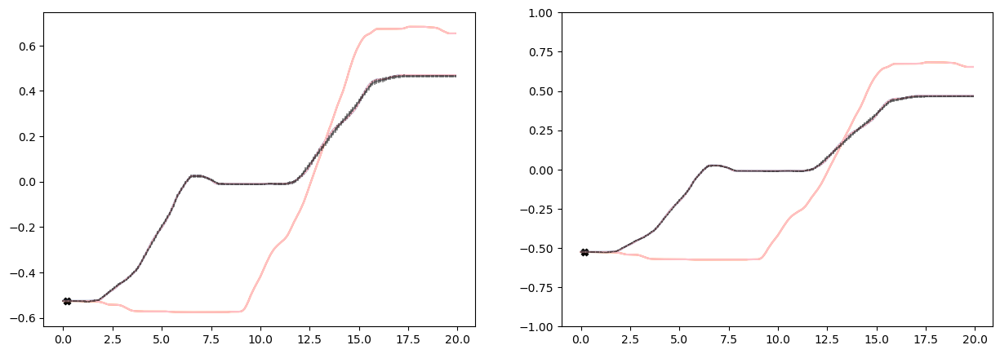

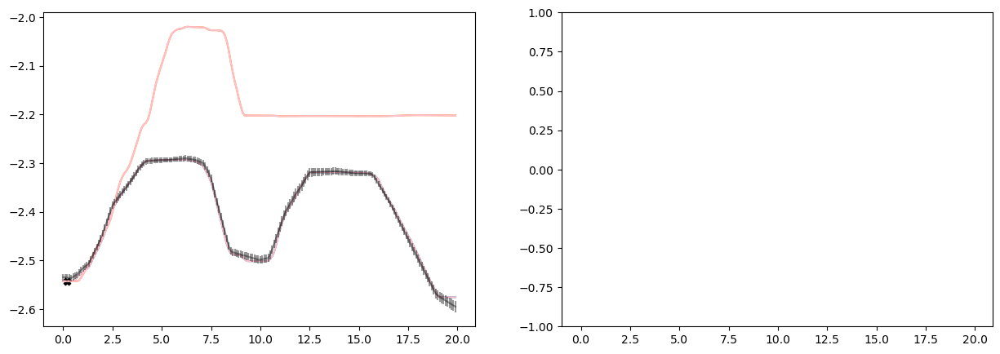

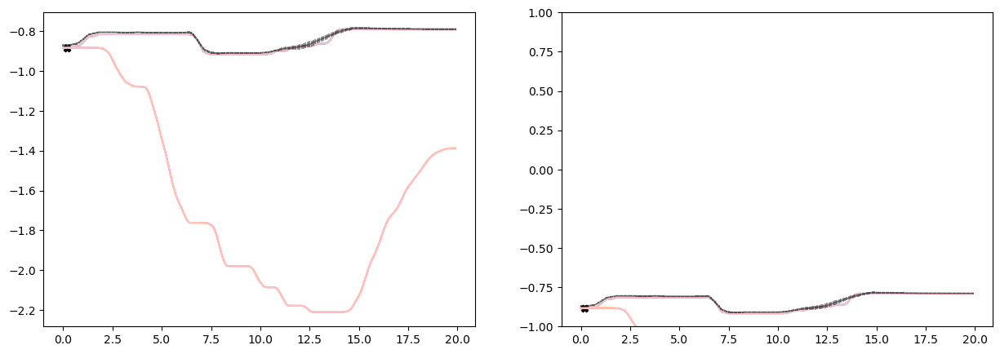

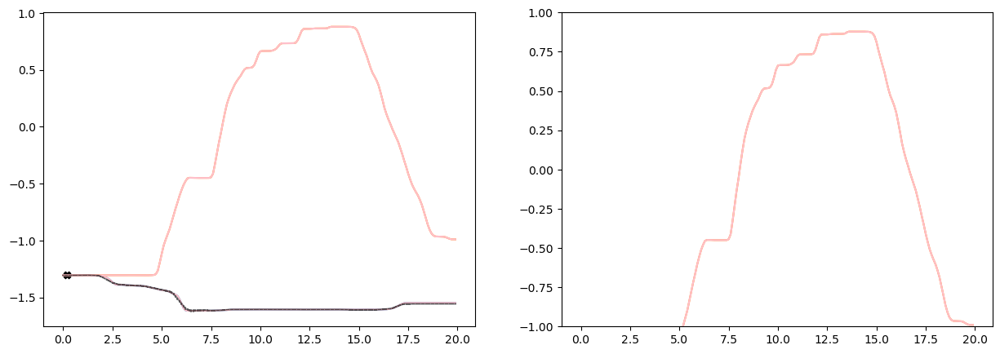

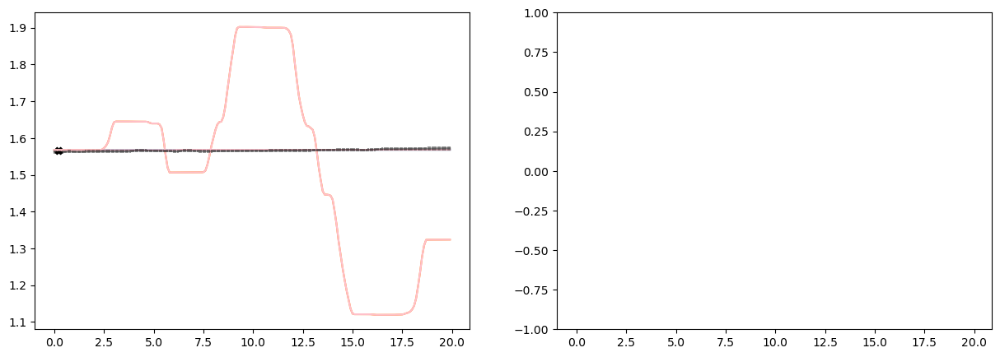

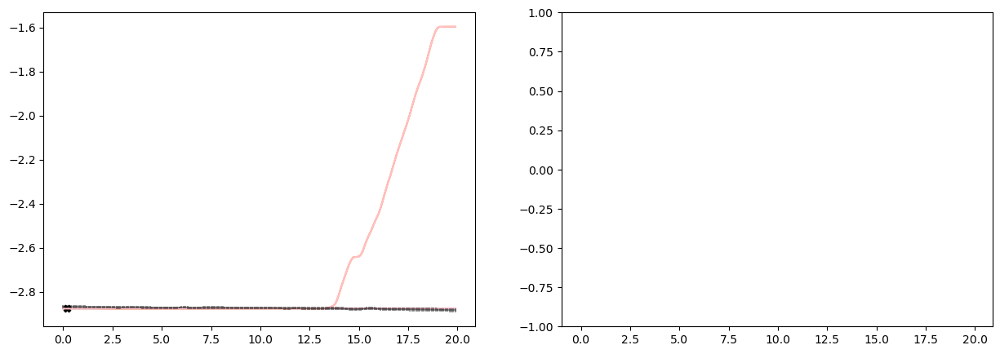

In [13]:
predicted_Y,predicted_std = predict_model(observations=np.array([[ 0.2000,  1, -0.5258, -2.5425, -0.8834, -1.3051,  1.5671, -2.8763]]), target_X=time_queries)

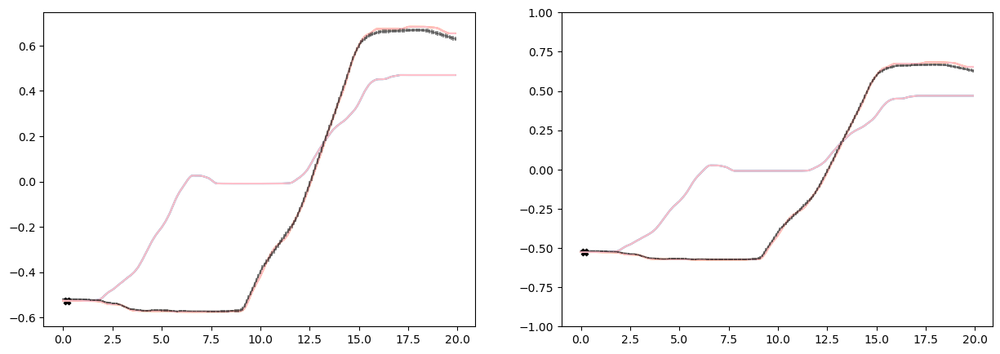

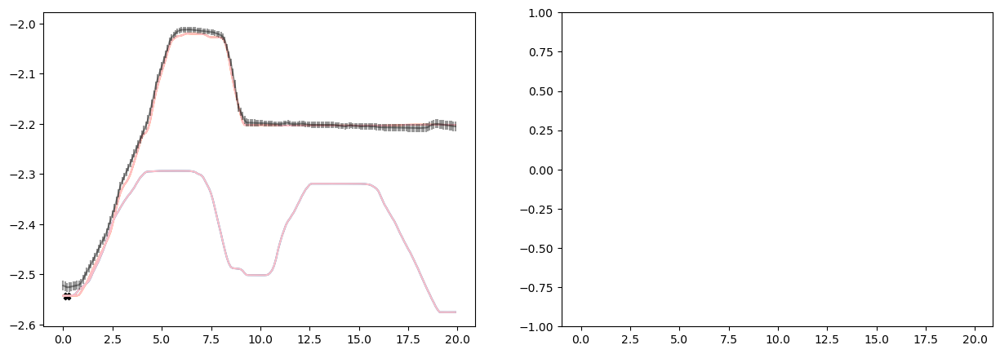

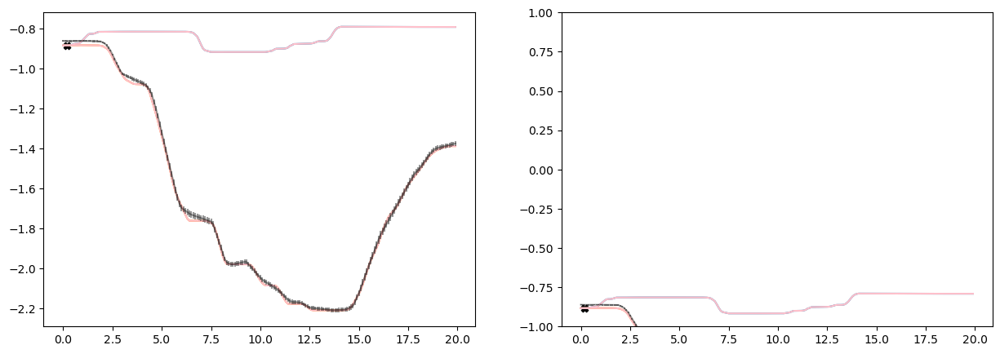

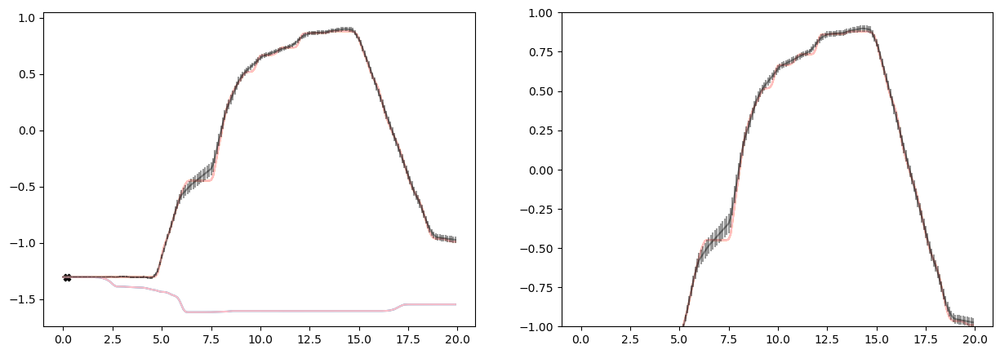

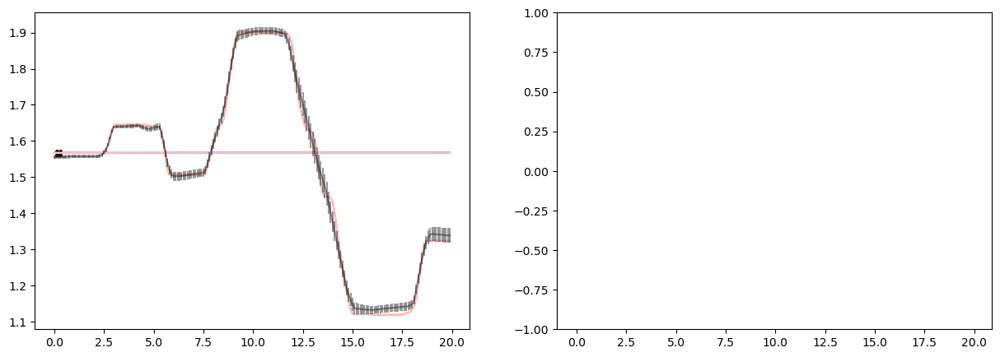

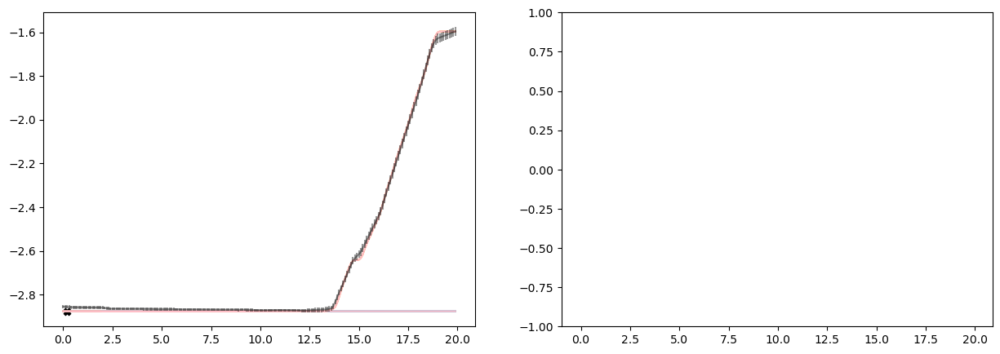

In [14]:
predicted_Y,predicted_std = predict_model(observations=np.array([[ 0.200,  2, -0.5258, -2.5425, -0.8834, -1.3051,  1.5671, -2.8763]]), target_X=time_queries)

#### Uncertain Prediction not existing in this case

because it has tps

#### More observations

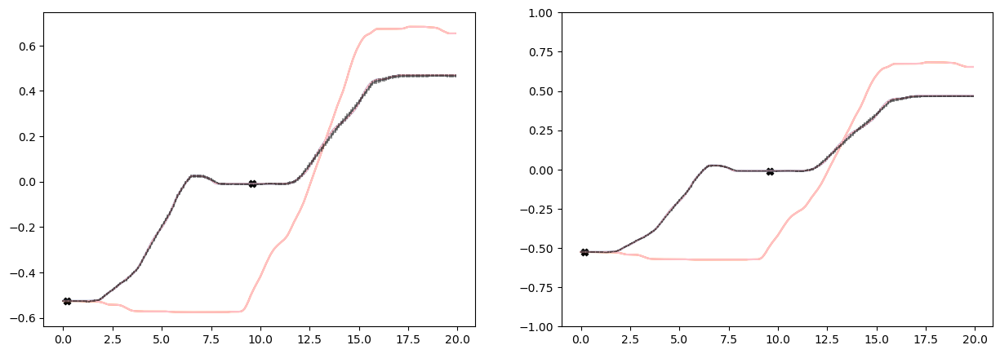

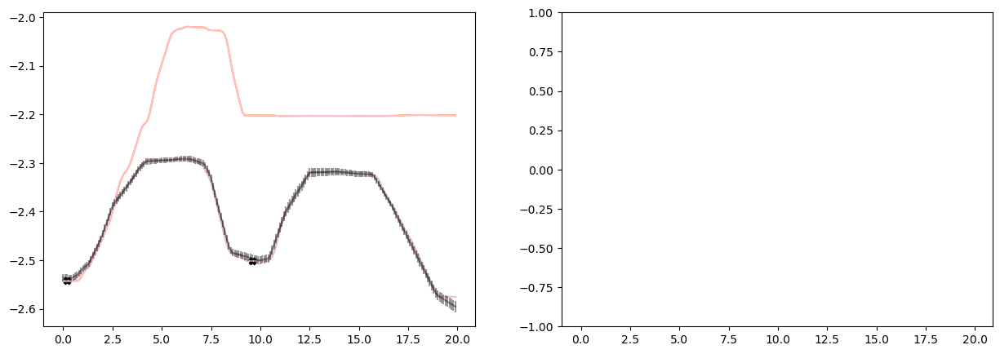

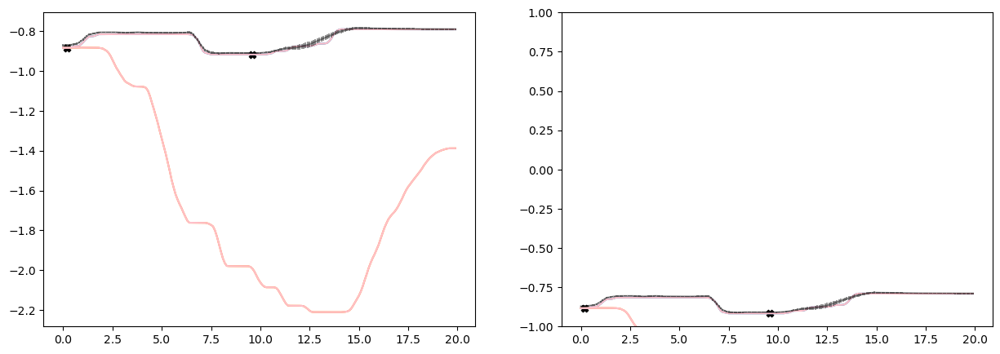

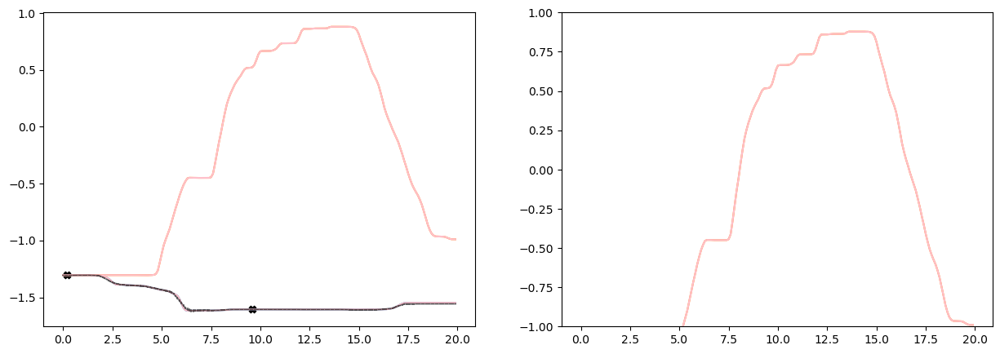

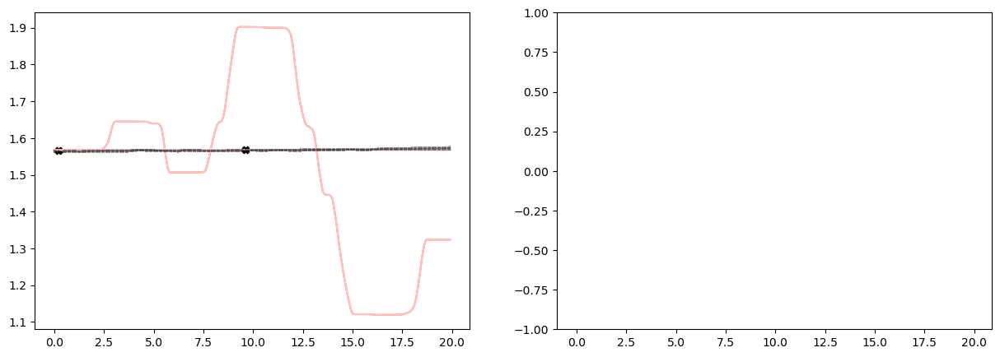

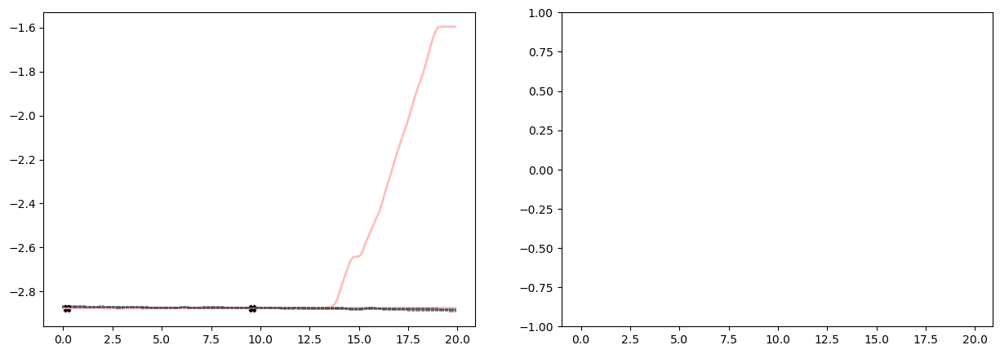

In [15]:
predicted_Y,predicted_std = predict_model(observations=np.array([
    [ 0.2000,  1, -0.5258, -2.5425, -0.8834, -1.3051,  1.5671, -2.8763],
    [ 9.6000,  1, -9.2033e-03, -2.5014e+00, -9.1668e-01, -1.6060e+00,  1.5680e+00, -2.8762e+00],
                                          ]), target_X=time_queries)

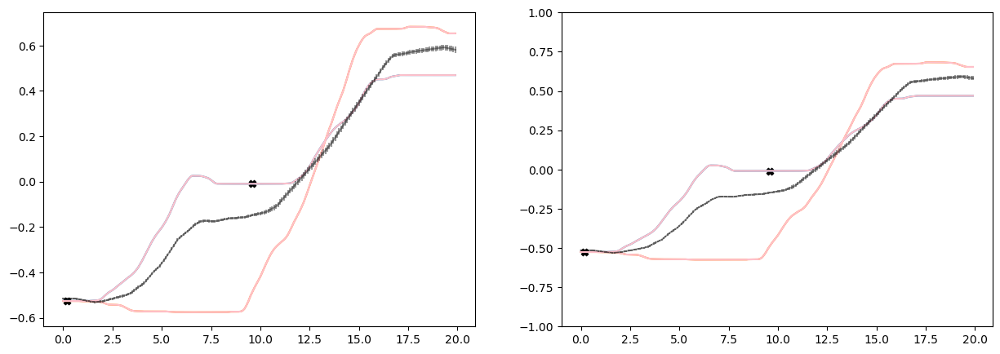

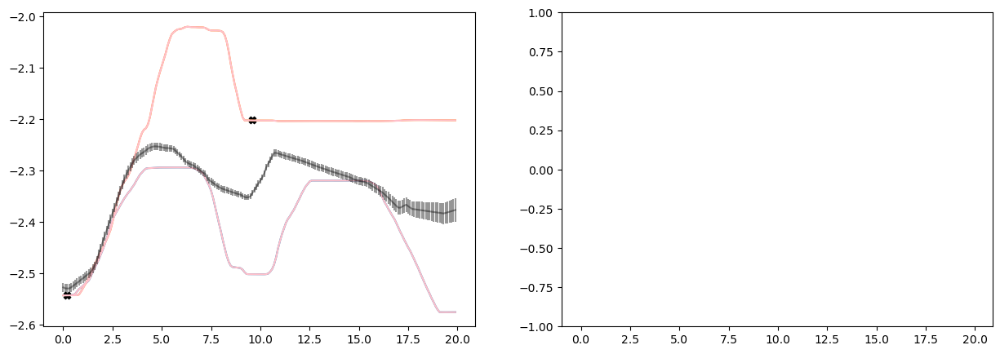

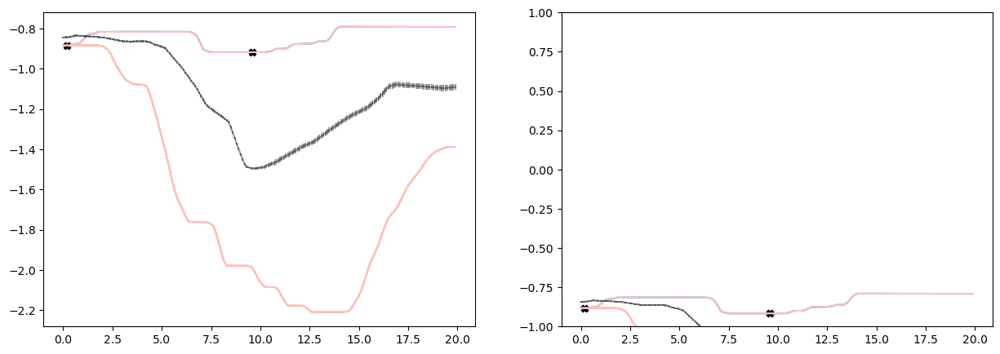

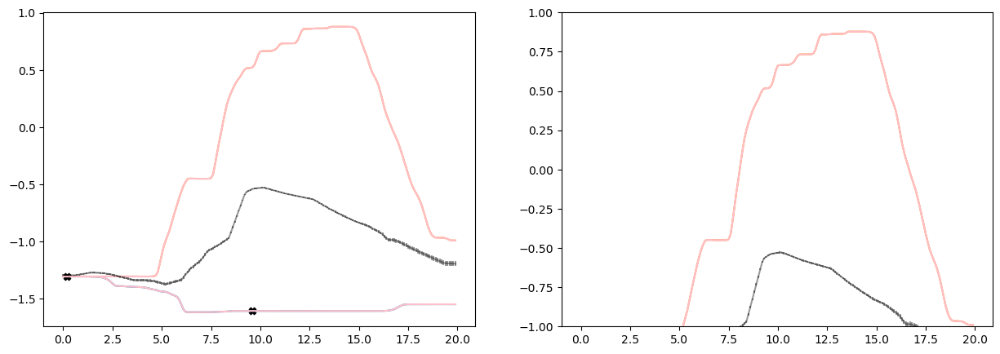

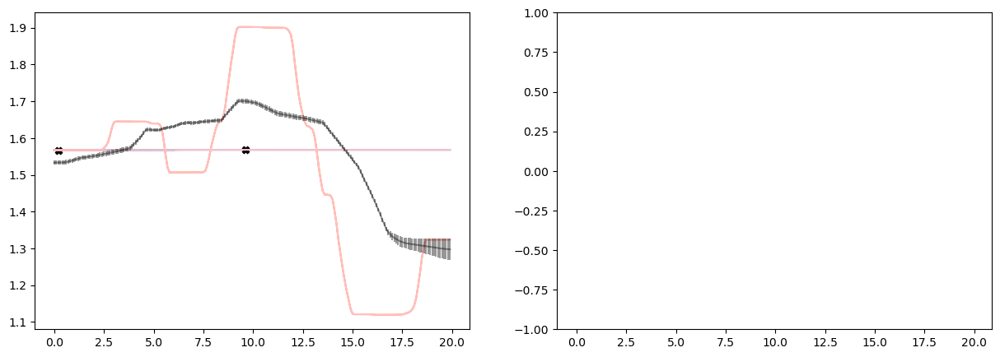

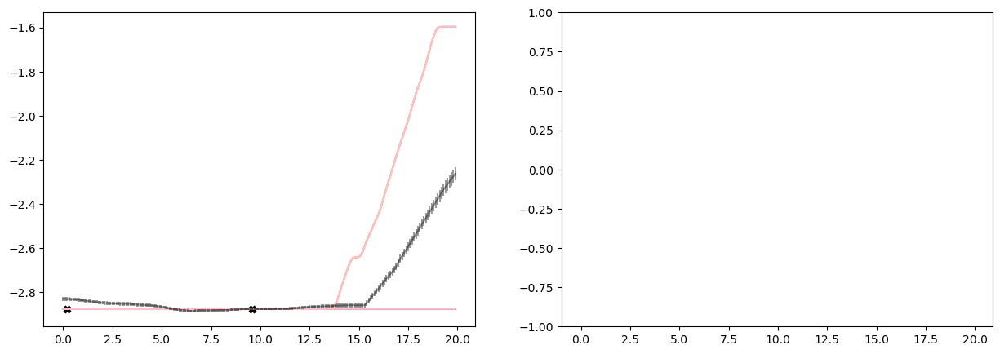

In [121]:
predicted_Y,predicted_std = predict_model(observations=np.array([
    [ 0.2000,  1.5, -0.5258, -2.5425, -0.8834, -1.3051,  1.5671, -2.8763],
    [ 9.6000,  1.5, -9.2033e-03, -2.2014, -9.1668e-01, -1.6060,  1.5680e+00, -2.8762],
                                          ]), target_X=time_queries)

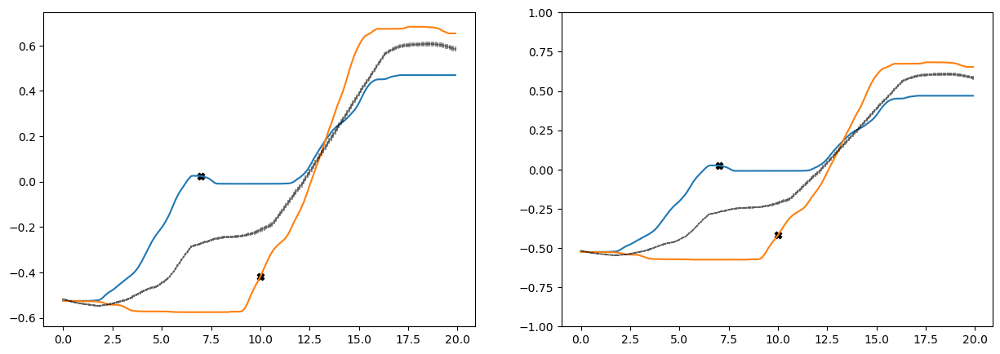

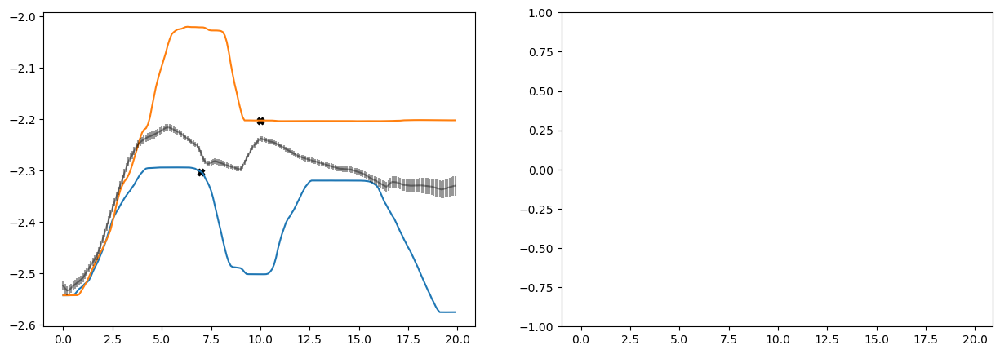

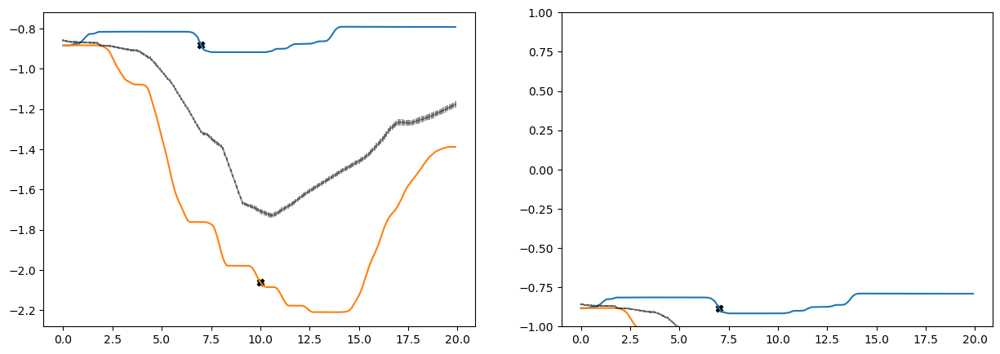

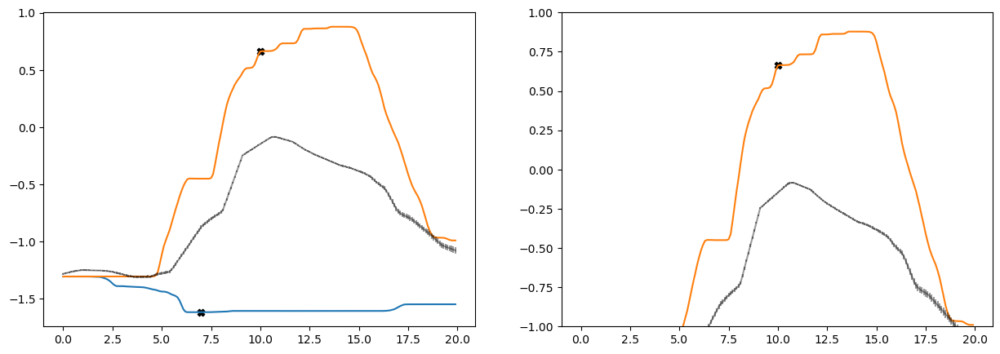

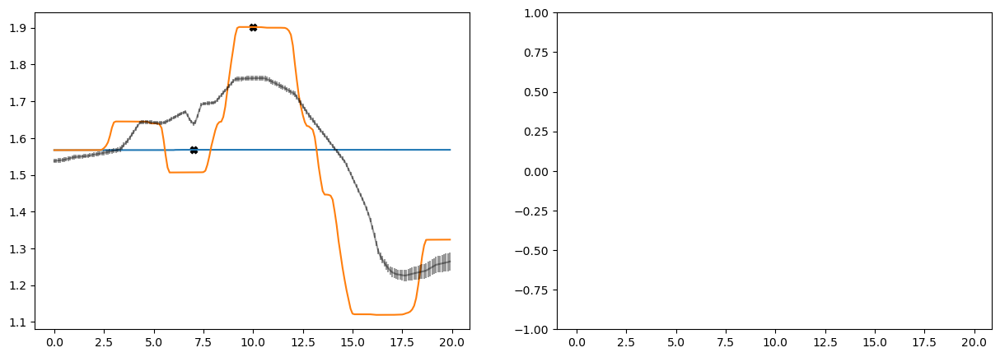

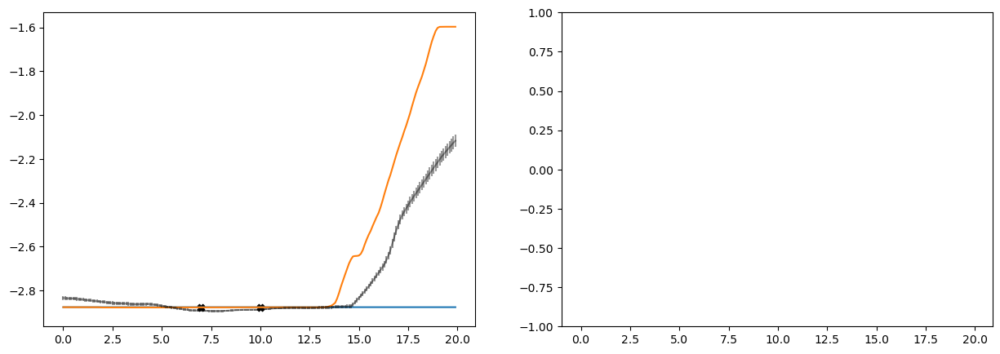

In [378]:
# normal Cnmp fails in conditions with different TPs
predicted_Y,predicted_std = predict_model(observations=np.array([
    [ 7,  1,  0.02484592, -2.30220443, -0.88180715, -1.61691314,  1.56809616, -2.87615139] ,
    [10.        ,  2.        , -0.41872102, -2.20221073, -2.06107456,     0.66206133,  1.90193808, -2.87669069],
                                          ]), target_X=time_queries)

## Free out-of-bound prediction

In [16]:
def predict_model_free(observations, target_Xs, plot = True):
    predicted_Y = np.zeros((target_Xs.shape[0],d_y)) #number of Xs of dimension of Y elems
    predicted_std = np.zeros((target_Xs.shape[0],d_y))
    with torch.no_grad():
        prediction = model(torch.from_numpy(observations),torch.from_numpy(target_Xs)).numpy()
    predicted_Y = prediction[:,:d_y]
    predicted_std = np.log(1+np.exp(prediction[:,d_y:]))
    if plot: 
        for i in range(d_y): #for every dimension in Y vector we are plotting training data and prediction
            fig = plt.figure(figsize=(8,8))
            for dem in range(d_N): #for all demonstration
                plt.plot(X[dem,:,0],Y[dem,:,i]) # plot training data
            plt.scatter(observations[:,0],observations[:,d_x+i],marker="X",color='black') #plot observations
            #plot preditions
            #plt.plot(target_Xs,predicted_Y[:,i],marker="X",color='red',markersize=2)
            plt.errorbar(target_Xs[:,0],predicted_Y[:,i],yerr=predicted_std[:,i],color = 'black',alpha=0.4)
            plt.show()  
    return predicted_Y, predicted_std

In [17]:
lol=np.linspace(-20,40,200) # 200 elems from to 
pred_range = np.zeros((200,2))
pred_range[:, 0]= lol #now each of the 200 elems has an elem that has the range
pred_range[:,1] = 1 # to all 200 times in second dimension put the first goal
#pred_range
pred_range=np.delete(pred_range, 1, axis=1)
print(pred_range.shape)
print(X[0].shape)
print(time_queries)

(200, 1)
(200, 2)
[[ 0. ]
 [ 0.1]
 [ 0.2]
 [ 0.3]
 [ 0.4]
 [ 0.5]
 [ 0.6]
 [ 0.7]
 [ 0.8]
 [ 0.9]
 [ 1. ]
 [ 1.1]
 [ 1.2]
 [ 1.3]
 [ 1.4]
 [ 1.5]
 [ 1.6]
 [ 1.7]
 [ 1.8]
 [ 1.9]
 [ 2. ]
 [ 2.1]
 [ 2.2]
 [ 2.3]
 [ 2.4]
 [ 2.5]
 [ 2.6]
 [ 2.7]
 [ 2.8]
 [ 2.9]
 [ 3. ]
 [ 3.1]
 [ 3.2]
 [ 3.3]
 [ 3.4]
 [ 3.5]
 [ 3.6]
 [ 3.7]
 [ 3.8]
 [ 3.9]
 [ 4. ]
 [ 4.1]
 [ 4.2]
 [ 4.3]
 [ 4.4]
 [ 4.5]
 [ 4.6]
 [ 4.7]
 [ 4.8]
 [ 4.9]
 [ 5. ]
 [ 5.1]
 [ 5.2]
 [ 5.3]
 [ 5.4]
 [ 5.5]
 [ 5.6]
 [ 5.7]
 [ 5.8]
 [ 5.9]
 [ 6. ]
 [ 6.1]
 [ 6.2]
 [ 6.3]
 [ 6.4]
 [ 6.5]
 [ 6.6]
 [ 6.7]
 [ 6.8]
 [ 6.9]
 [ 7. ]
 [ 7.1]
 [ 7.2]
 [ 7.3]
 [ 7.4]
 [ 7.5]
 [ 7.6]
 [ 7.7]
 [ 7.8]
 [ 7.9]
 [ 8. ]
 [ 8.1]
 [ 8.2]
 [ 8.3]
 [ 8.4]
 [ 8.5]
 [ 8.6]
 [ 8.7]
 [ 8.8]
 [ 8.9]
 [ 9. ]
 [ 9.1]
 [ 9.2]
 [ 9.3]
 [ 9.4]
 [ 9.5]
 [ 9.6]
 [ 9.7]
 [ 9.8]
 [ 9.9]
 [10. ]
 [10.1]
 [10.2]
 [10.3]
 [10.4]
 [10.5]
 [10.6]
 [10.7]
 [10.8]
 [10.9]
 [11. ]
 [11.1]
 [11.2]
 [11.3]
 [11.4]
 [11.5]
 [11.6]
 [11.7]
 [11.8]
 [11.9]
 [12. ]
 [12.1]
 [12.2

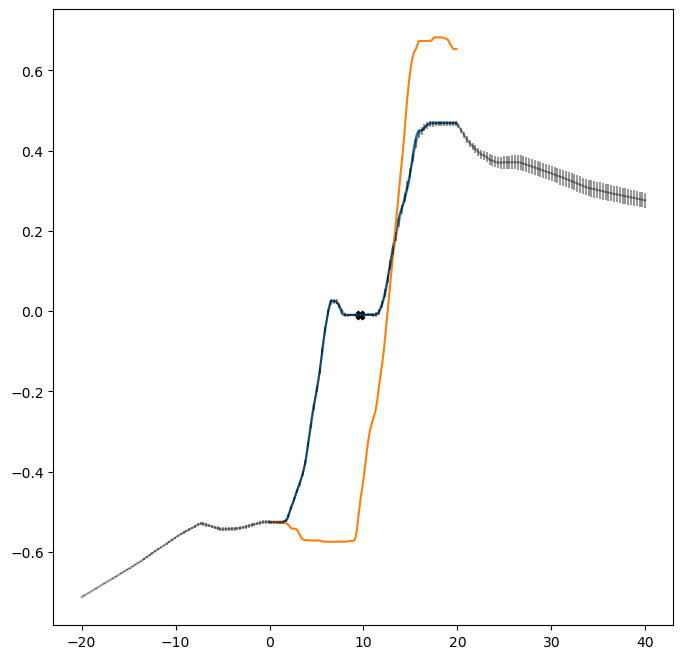

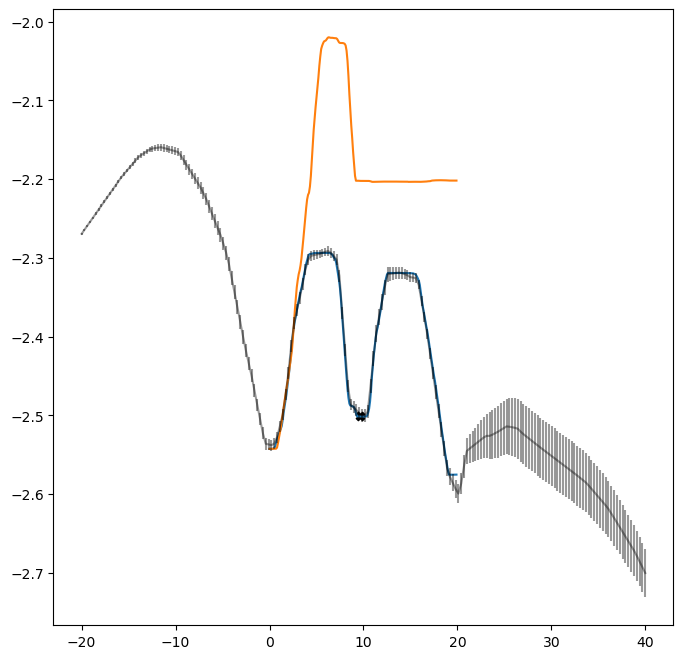

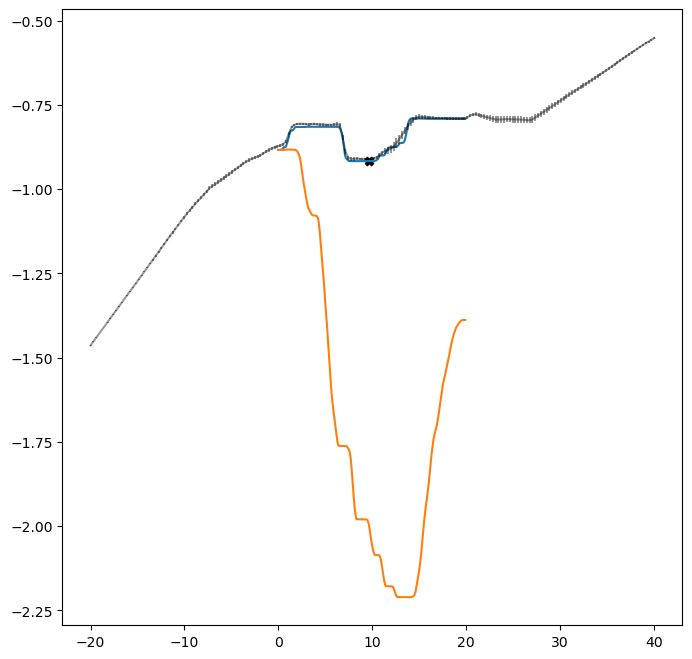

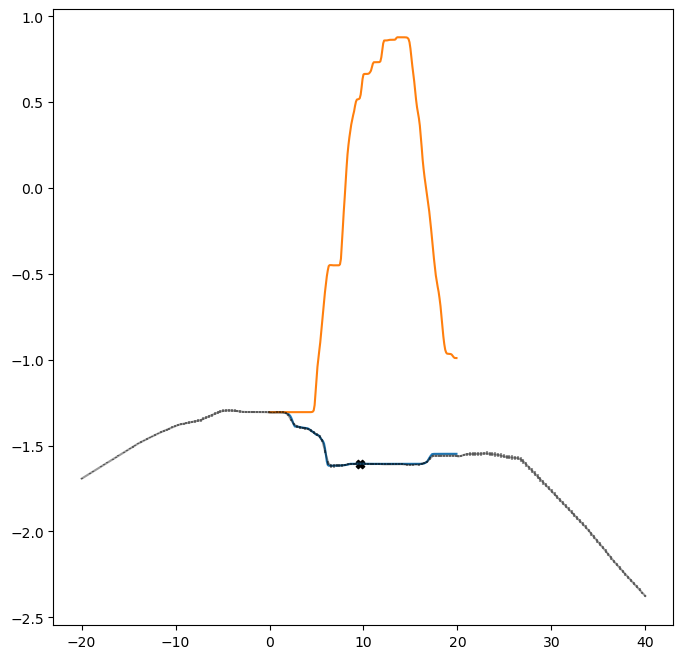

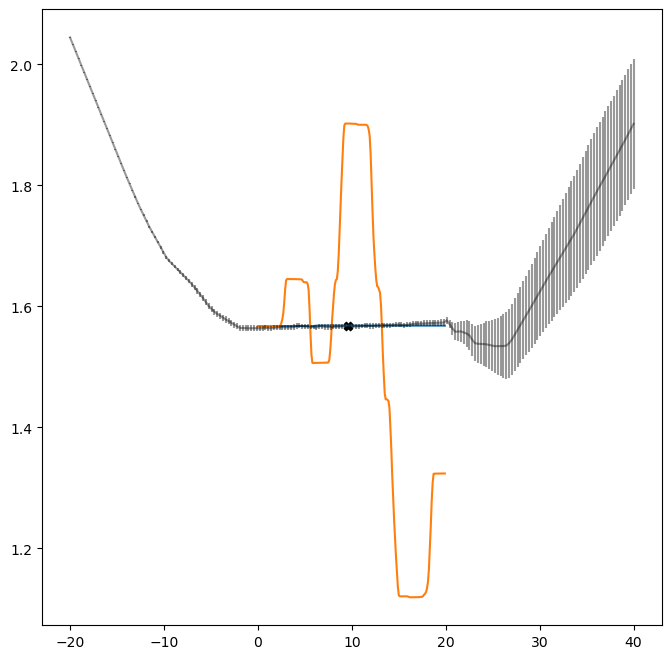

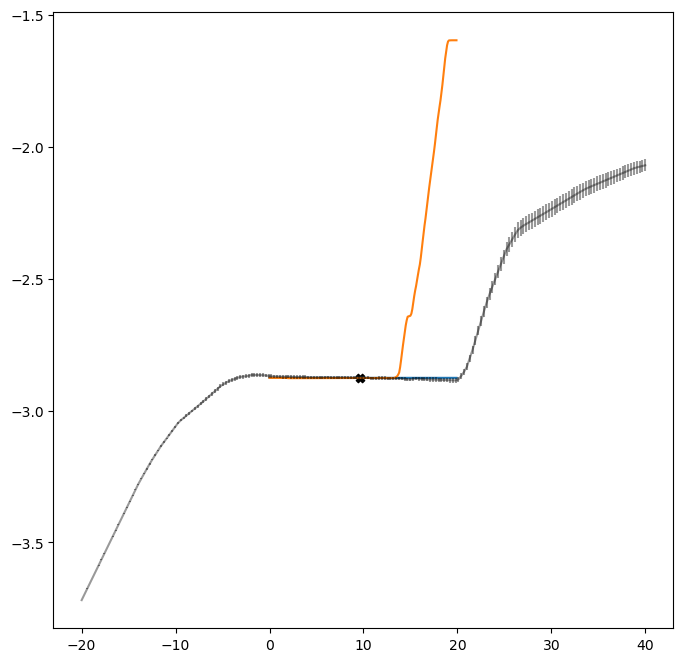

In [18]:
#RUN THE MODEL PREDICTIONS UNBOUNDED
predicted_Y,predicted_std = predict_model_free(np.array([[ 9.6000,  1, -9.2033e-03, -2.5014e+00, -9.1668e-01, -1.6060e+00,  1.5680e+00, -2.8762e+00]]), pred_range)

# 3D Plot of the Interpolation TP surface

In [19]:
num_tp_samples=34#17
min_tp=1
max_tp=2
all_tp = np.zeros((num_tp_samples,2))
all_tp[:,0] = np.linspace(0,num_tp_samples-1,num_tp_samples) #indexes in first place
all_tp[:,1] = np.linspace(min_tp,max_tp,num_tp_samples) #tps in second place
tp_value_array = all_tp[:,1] #array of task parameters only
print(all_tp)
# index   task parameter

[[ 0.          1.        ]
 [ 1.          1.03030303]
 [ 2.          1.06060606]
 [ 3.          1.09090909]
 [ 4.          1.12121212]
 [ 5.          1.15151515]
 [ 6.          1.18181818]
 [ 7.          1.21212121]
 [ 8.          1.24242424]
 [ 9.          1.27272727]
 [10.          1.3030303 ]
 [11.          1.33333333]
 [12.          1.36363636]
 [13.          1.39393939]
 [14.          1.42424242]
 [15.          1.45454545]
 [16.          1.48484848]
 [17.          1.51515152]
 [18.          1.54545455]
 [19.          1.57575758]
 [20.          1.60606061]
 [21.          1.63636364]
 [22.          1.66666667]
 [23.          1.6969697 ]
 [24.          1.72727273]
 [25.          1.75757576]
 [26.          1.78787879]
 [27.          1.81818182]
 [28.          1.84848485]
 [29.          1.87878788]
 [30.          1.90909091]
 [31.          1.93939394]
 [32.          1.96969697]
 [33.          2.        ]]


In [20]:
num_time_samples=200
time_queries = np.zeros((num_time_samples,2)) # 2 dimensions (time and tp)
time_queries[:,0] = np.linspace(0,20,num_time_samples) #times in first place
time_queries[:,1] = -1 #task parameter will be filled later with each one desired
time_queries=np.delete(time_queries, 1, axis=1)
print(time_queries)
#time        task parameter

[[ 0.        ]
 [ 0.10050251]
 [ 0.20100503]
 [ 0.30150754]
 [ 0.40201005]
 [ 0.50251256]
 [ 0.60301508]
 [ 0.70351759]
 [ 0.8040201 ]
 [ 0.90452261]
 [ 1.00502513]
 [ 1.10552764]
 [ 1.20603015]
 [ 1.30653266]
 [ 1.40703518]
 [ 1.50753769]
 [ 1.6080402 ]
 [ 1.70854271]
 [ 1.80904523]
 [ 1.90954774]
 [ 2.01005025]
 [ 2.11055276]
 [ 2.21105528]
 [ 2.31155779]
 [ 2.4120603 ]
 [ 2.51256281]
 [ 2.61306533]
 [ 2.71356784]
 [ 2.81407035]
 [ 2.91457286]
 [ 3.01507538]
 [ 3.11557789]
 [ 3.2160804 ]
 [ 3.31658291]
 [ 3.41708543]
 [ 3.51758794]
 [ 3.61809045]
 [ 3.71859296]
 [ 3.81909548]
 [ 3.91959799]
 [ 4.0201005 ]
 [ 4.12060302]
 [ 4.22110553]
 [ 4.32160804]
 [ 4.42211055]
 [ 4.52261307]
 [ 4.62311558]
 [ 4.72361809]
 [ 4.8241206 ]
 [ 4.92462312]
 [ 5.02512563]
 [ 5.12562814]
 [ 5.22613065]
 [ 5.32663317]
 [ 5.42713568]
 [ 5.52763819]
 [ 5.6281407 ]
 [ 5.72864322]
 [ 5.82914573]
 [ 5.92964824]
 [ 6.03015075]
 [ 6.13065327]
 [ 6.23115578]
 [ 6.33165829]
 [ 6.4321608 ]
 [ 6.53266332]
 [ 6.63316

In [21]:
graph = np.zeros((num_tp_samples,num_time_samples,2+d_y)) # for every tp ask the network for every time queries, store the following data:
graph[:,:,0]=time_queries[:,0] #first position time
repeated_tp_value_array=np.tile(tp_value_array, (num_time_samples,1)) # many times the tp array
graph[:,:,1]=repeated_tp_value_array.T #second position task parameter
# in other positions [3,4,...] will be filled with values based on d_y}
print(graph.shape)
print(graph)
graph_std=graph.copy()

(34, 200, 8)
[[[ 0.          1.          0.         ...  0.          0.
    0.        ]
  [ 0.10050251  1.          0.         ...  0.          0.
    0.        ]
  [ 0.20100503  1.          0.         ...  0.          0.
    0.        ]
  ...
  [19.79899497  1.          0.         ...  0.          0.
    0.        ]
  [19.89949749  1.          0.         ...  0.          0.
    0.        ]
  [20.          1.          0.         ...  0.          0.
    0.        ]]

 [[ 0.          1.03030303  0.         ...  0.          0.
    0.        ]
  [ 0.10050251  1.03030303  0.         ...  0.          0.
    0.        ]
  [ 0.20100503  1.03030303  0.         ...  0.          0.
    0.        ]
  ...
  [19.79899497  1.03030303  0.         ...  0.          0.
    0.        ]
  [19.89949749  1.03030303  0.         ...  0.          0.
    0.        ]
  [20.          1.03030303  0.         ...  0.          0.
    0.        ]]

 [[ 0.          1.06060606  0.         ...  0.          0.
    0.      


Current TP, and predicitons below for all output dimensions
1.0


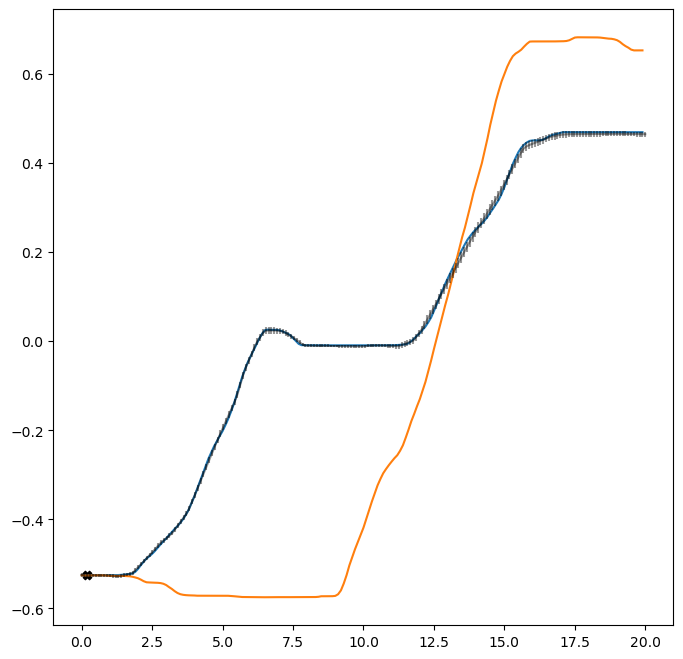

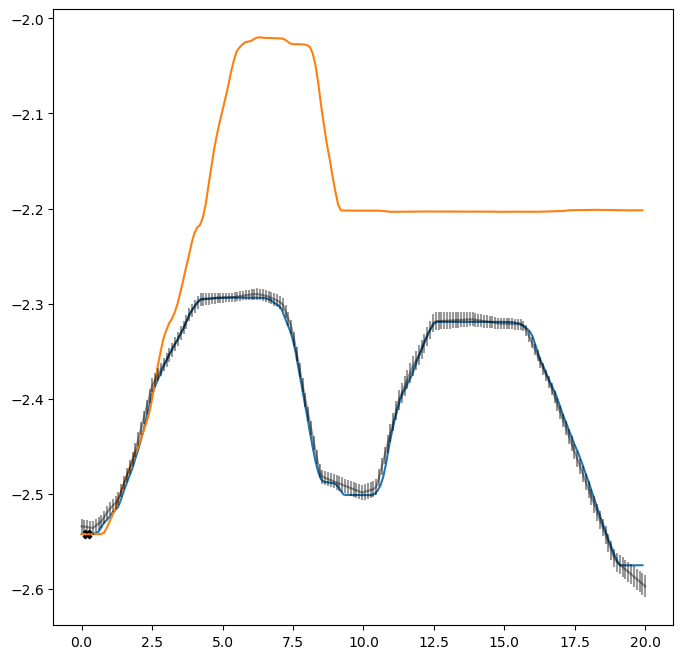

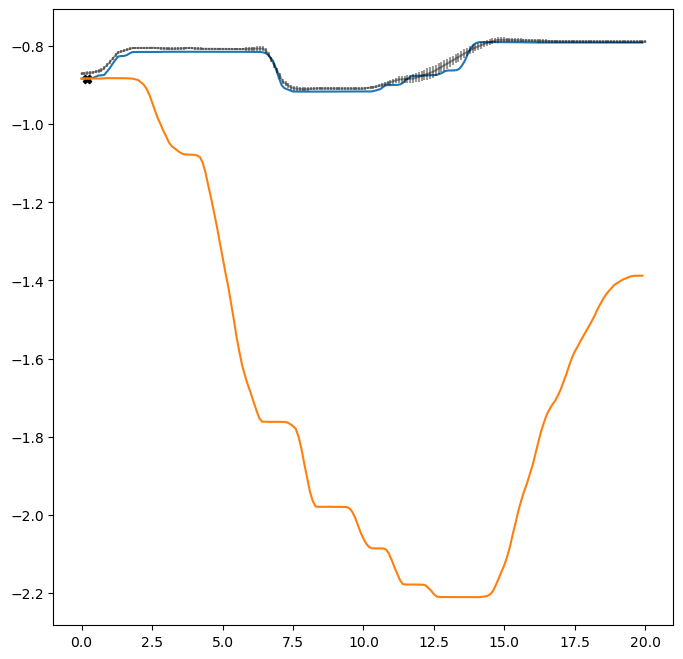

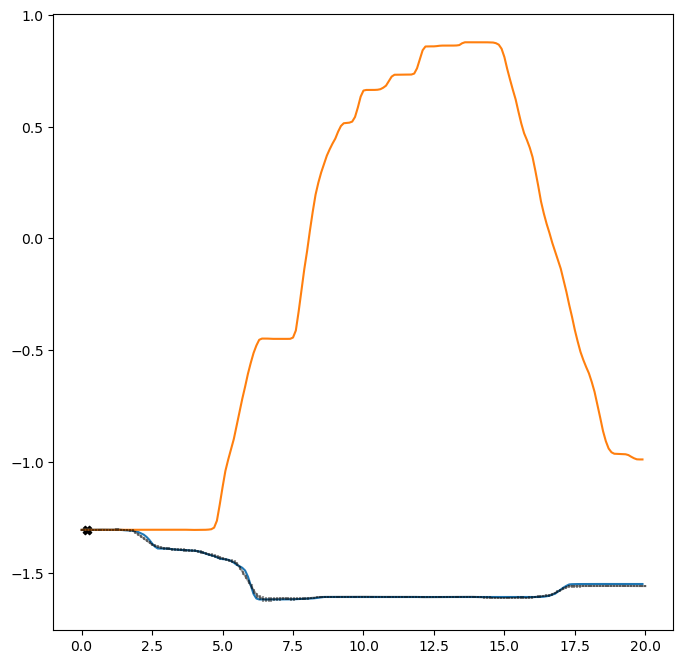

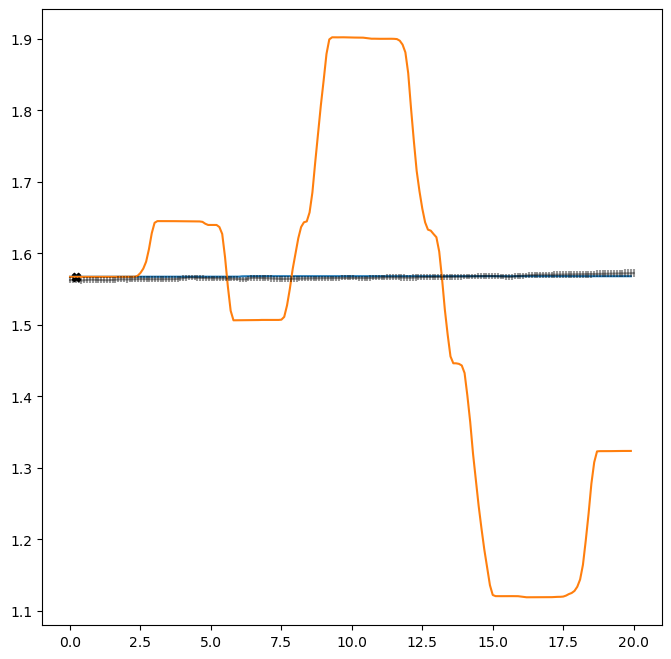

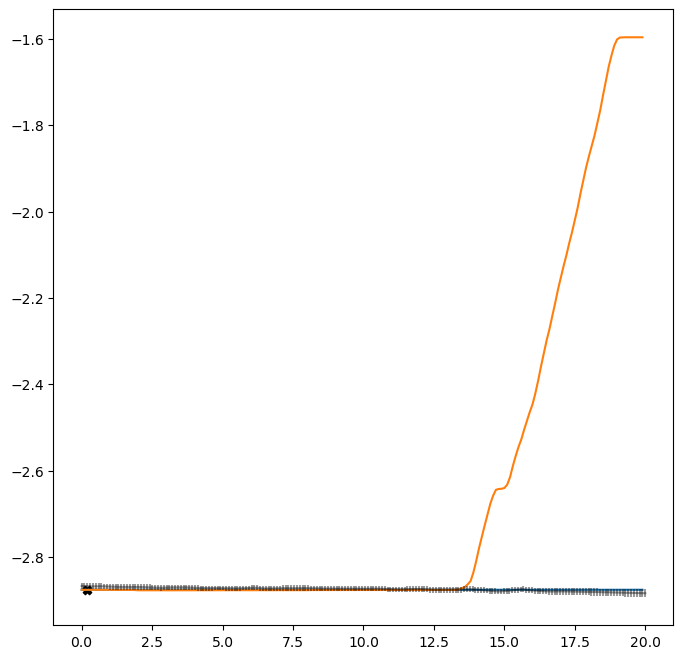

(200, 6)

Current TP, and predicitons below for all output dimensions
1.0303030303030303


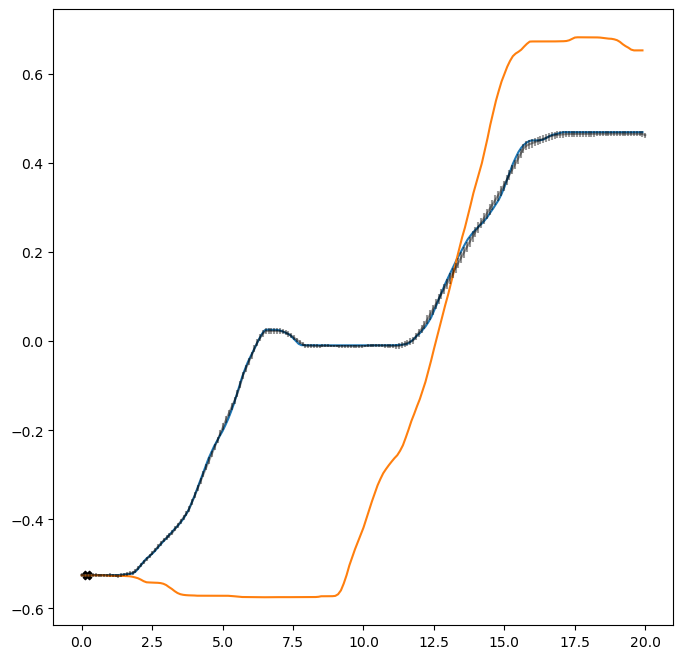

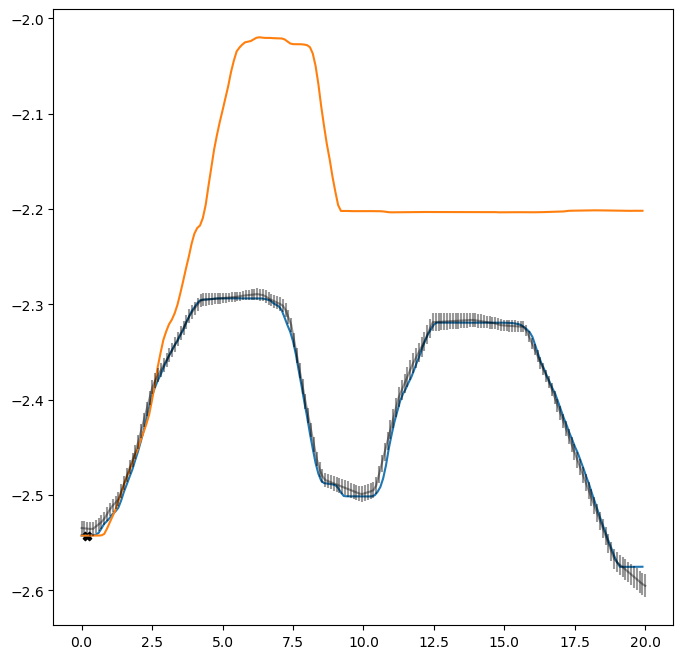

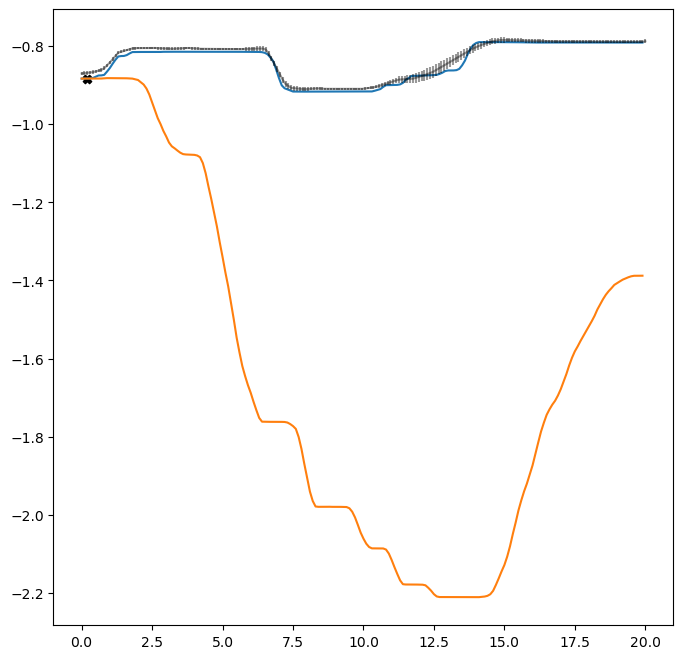

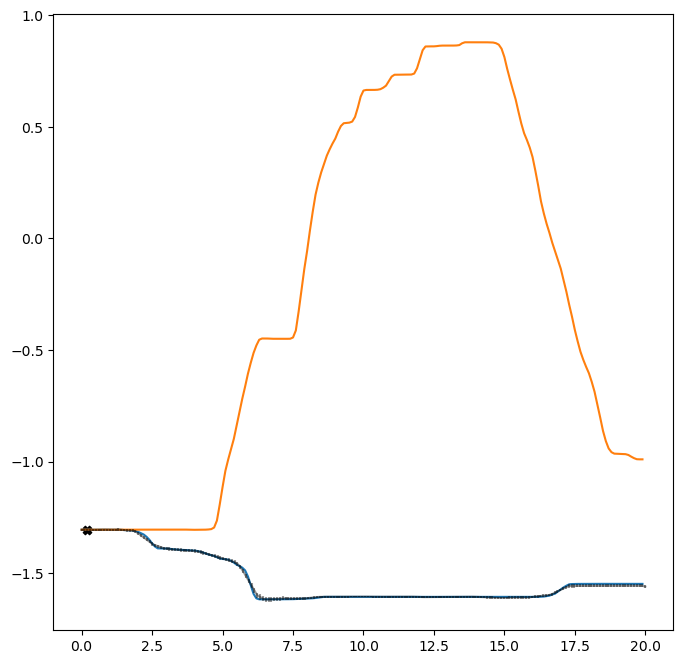

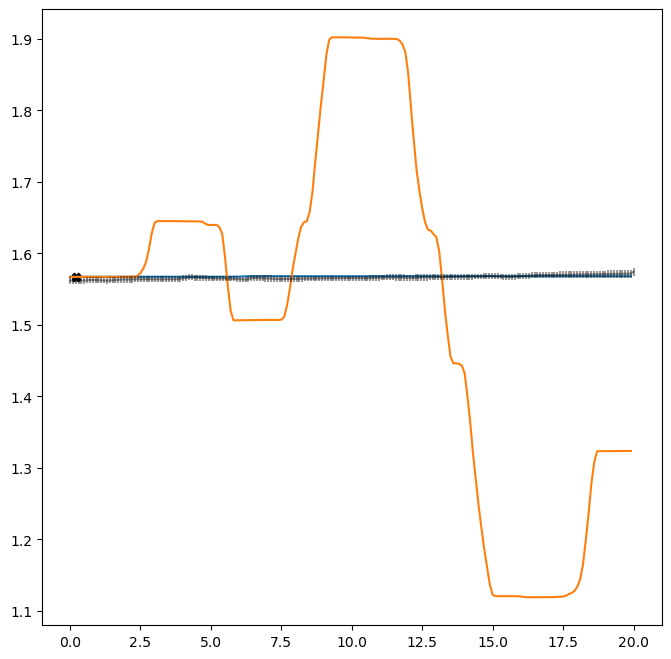

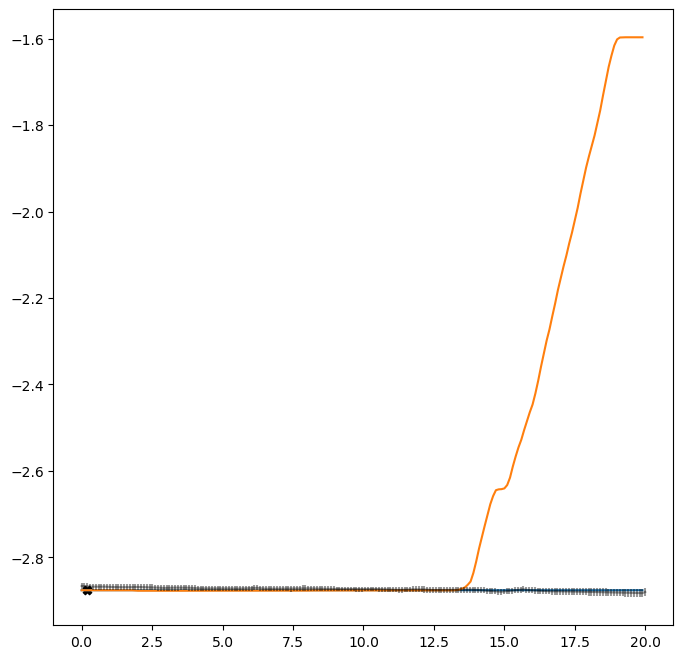

(200, 6)

Current TP, and predicitons below for all output dimensions
1.0606060606060606


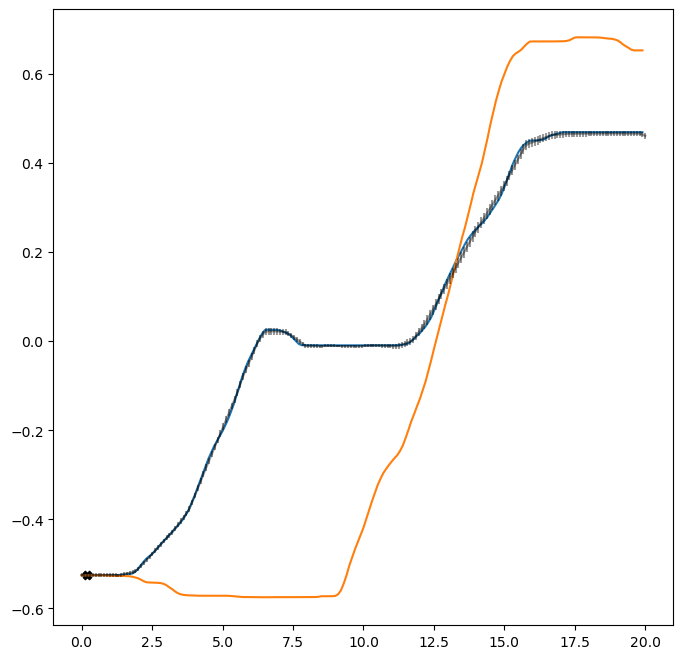

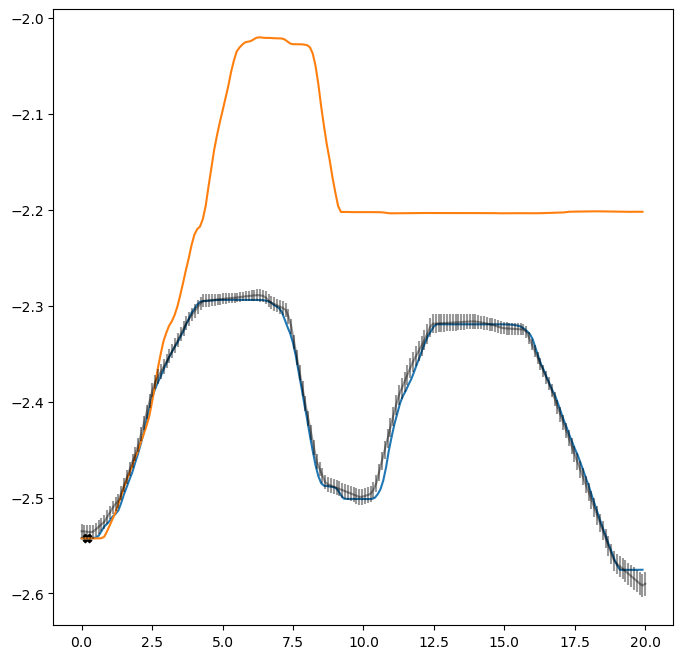

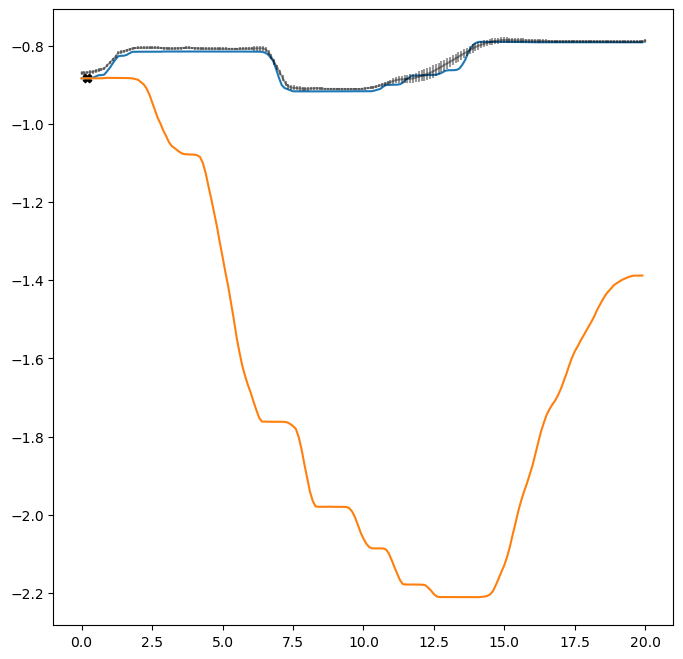

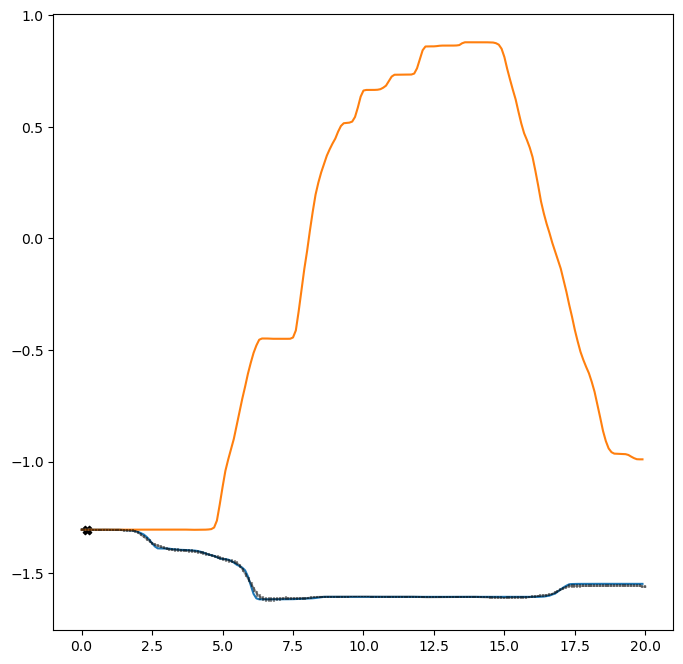

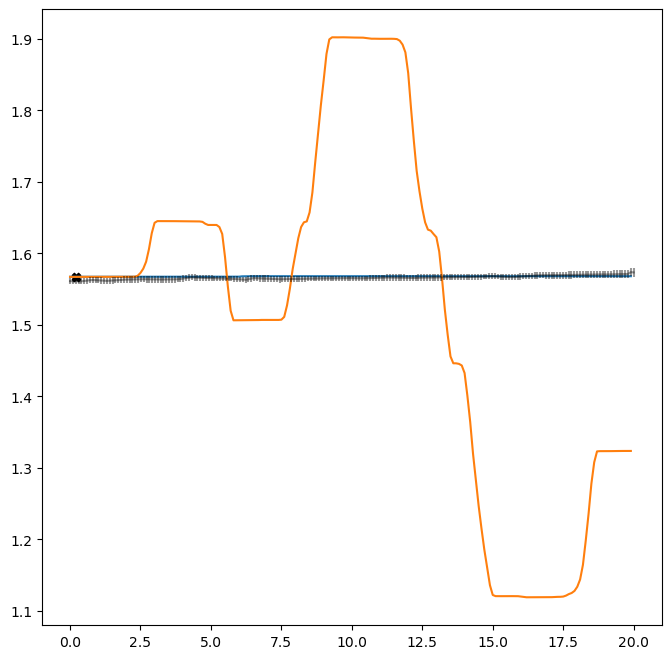

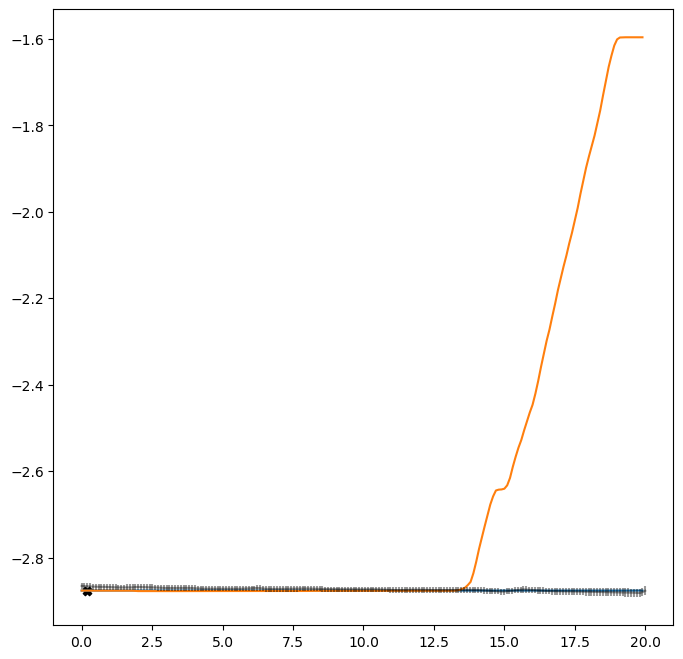

(200, 6)

Current TP, and predicitons below for all output dimensions
1.0909090909090908


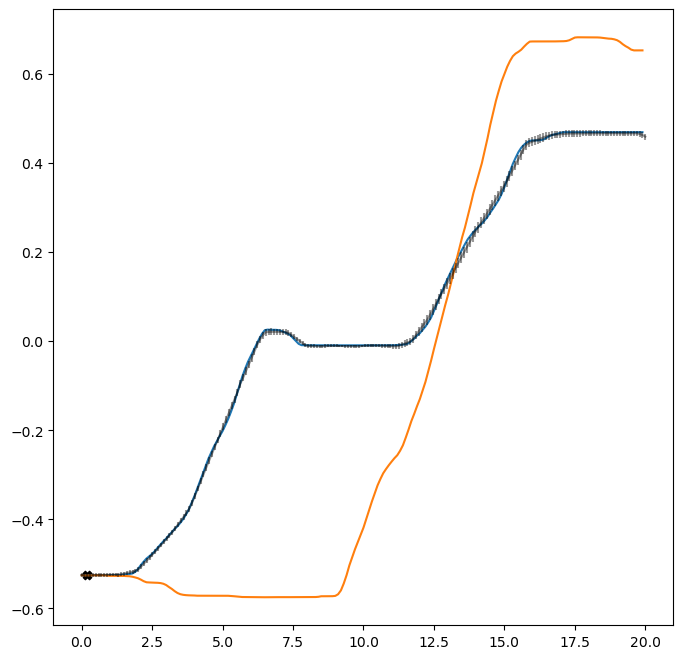

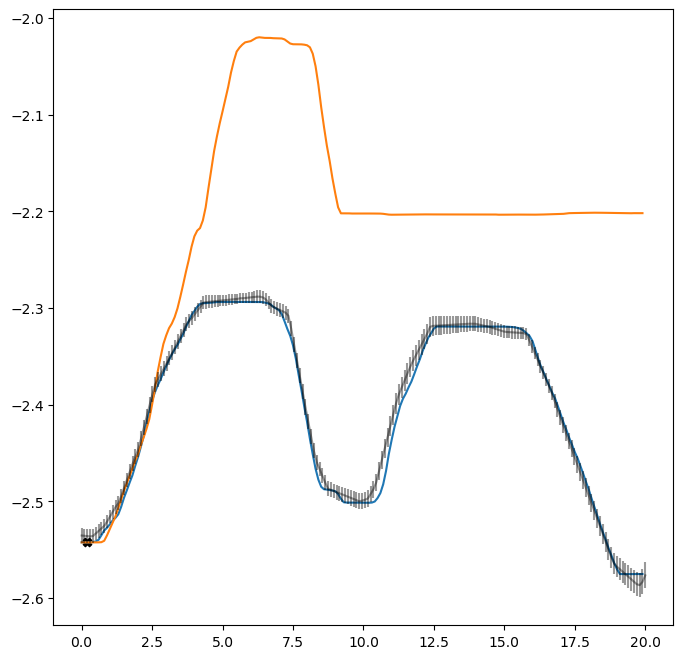

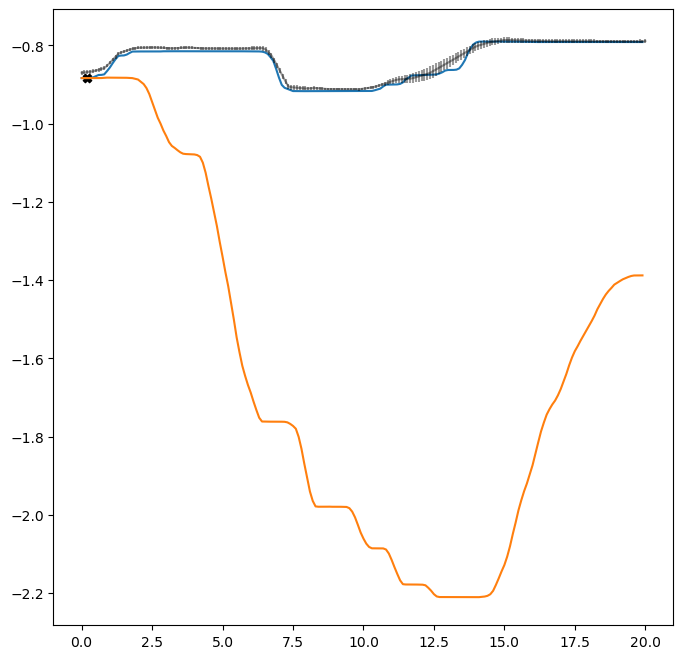

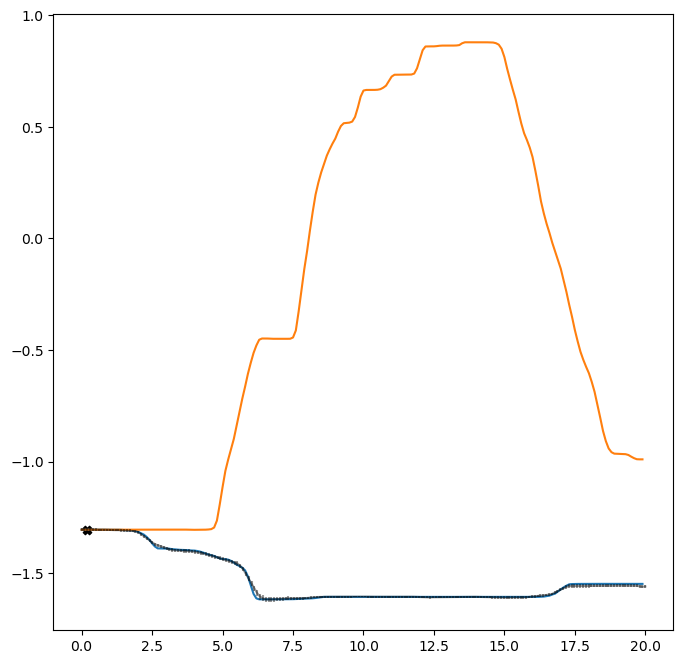

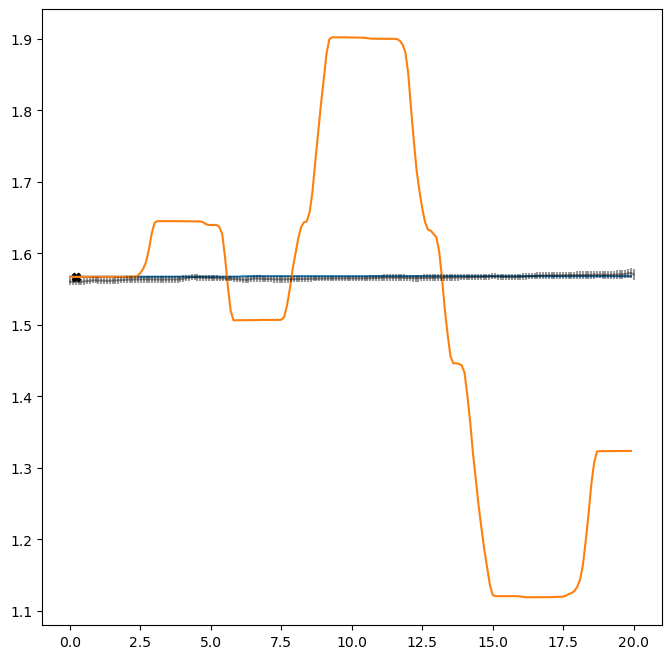

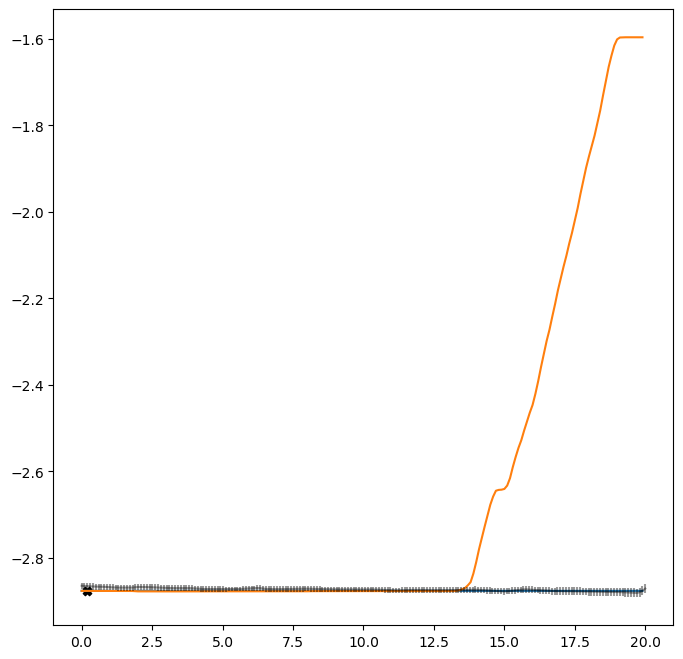

(200, 6)

Current TP, and predicitons below for all output dimensions
1.121212121212121


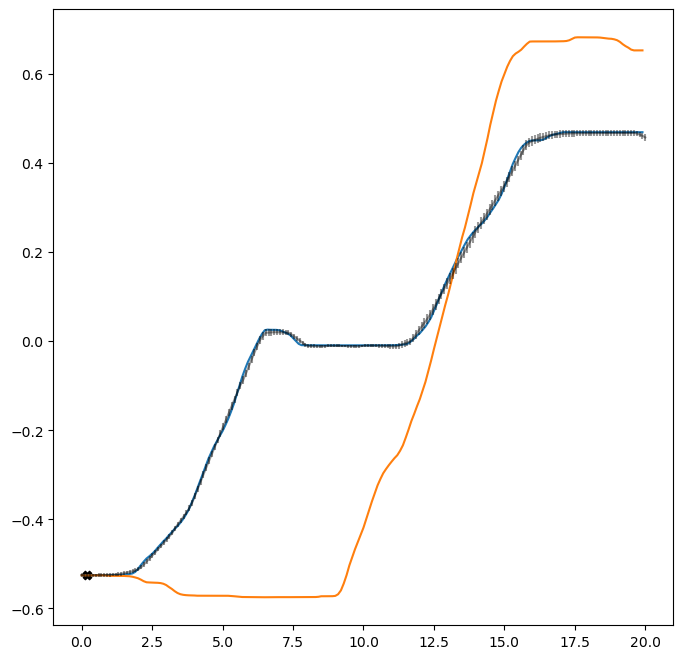

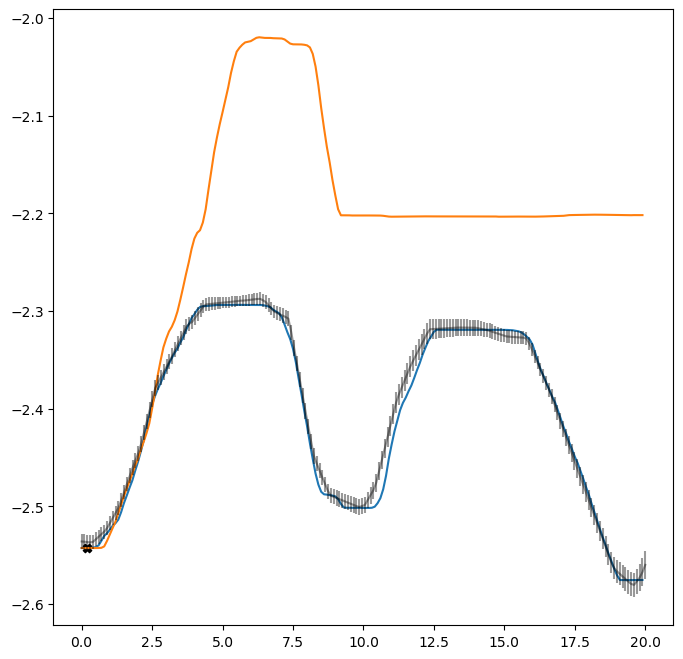

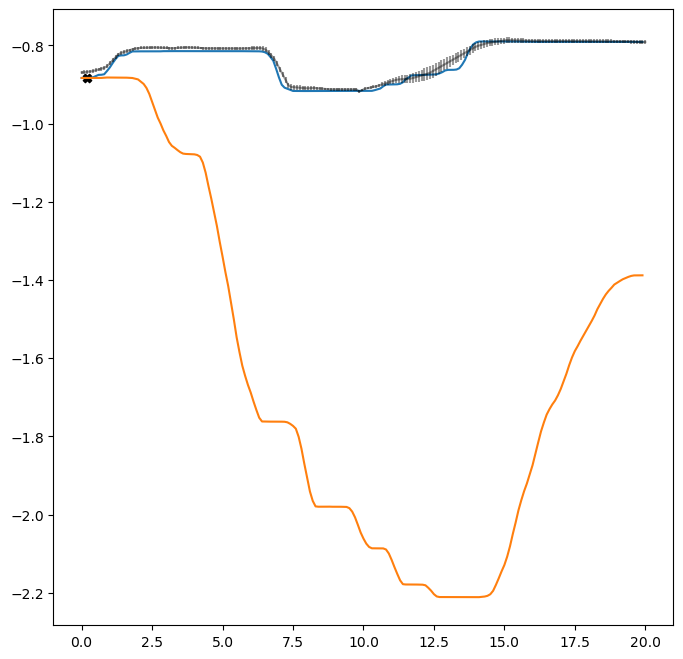

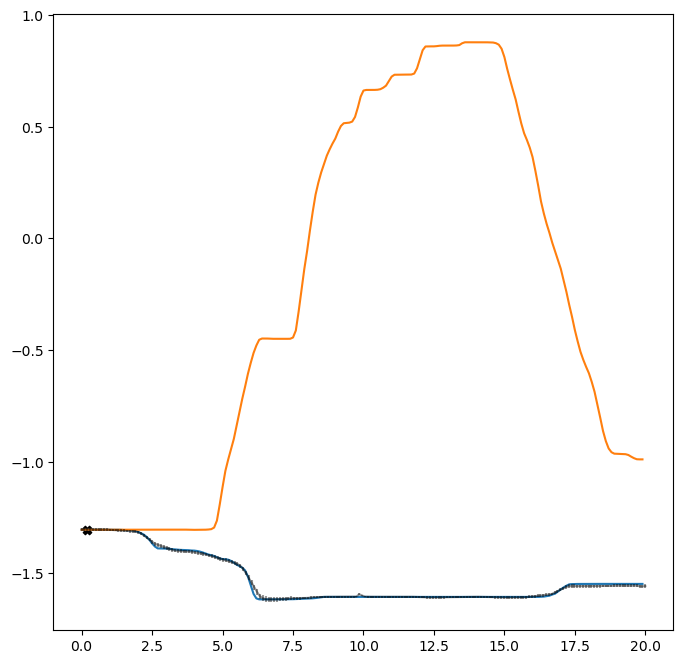

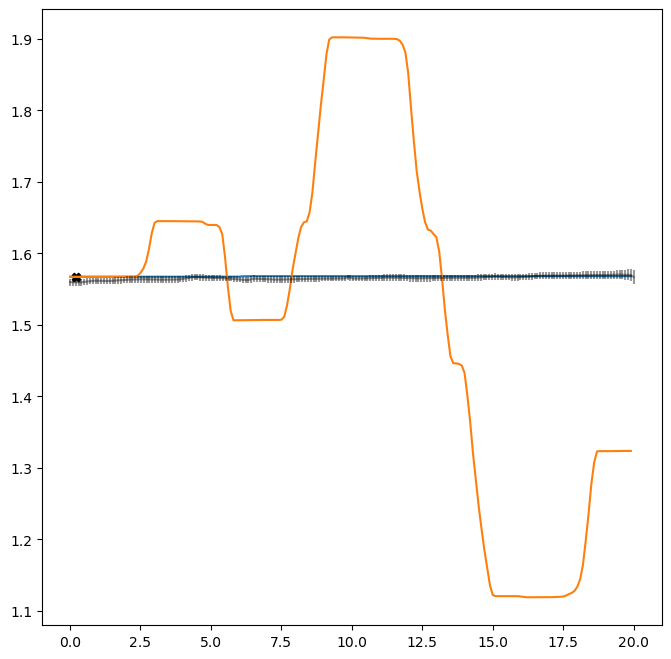

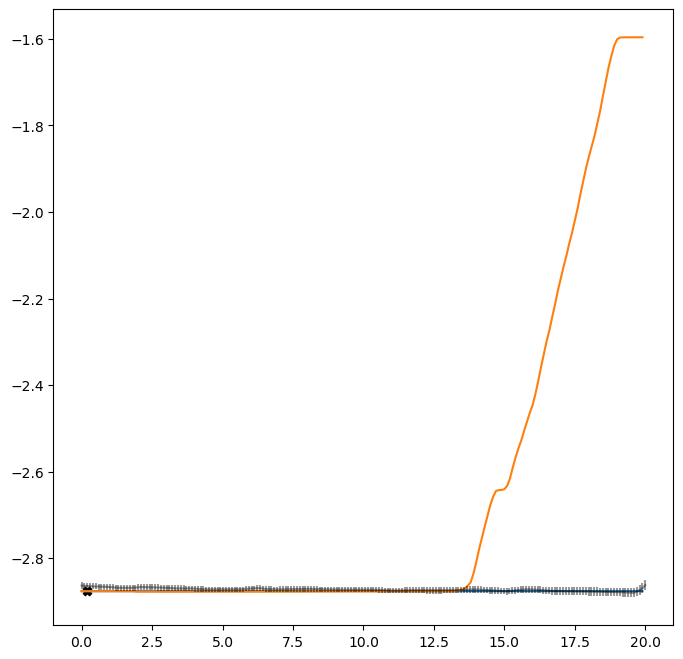

(200, 6)

Current TP, and predicitons below for all output dimensions
1.1515151515151516


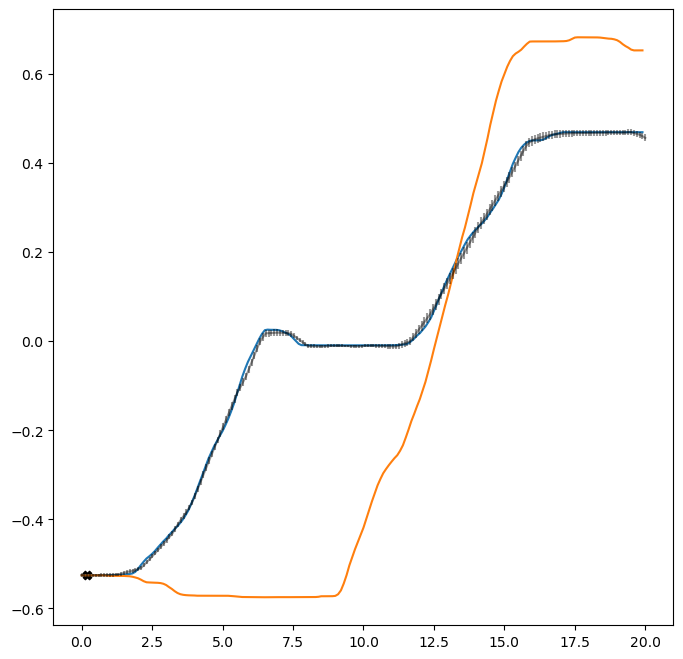

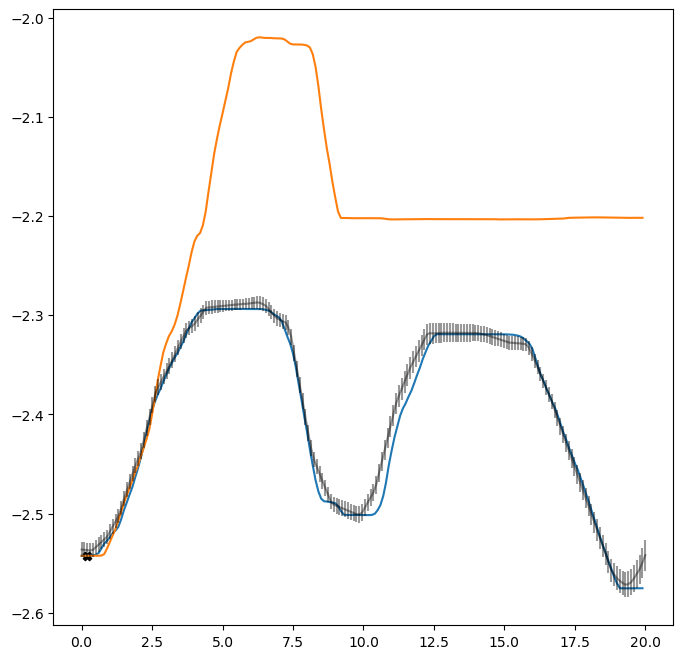

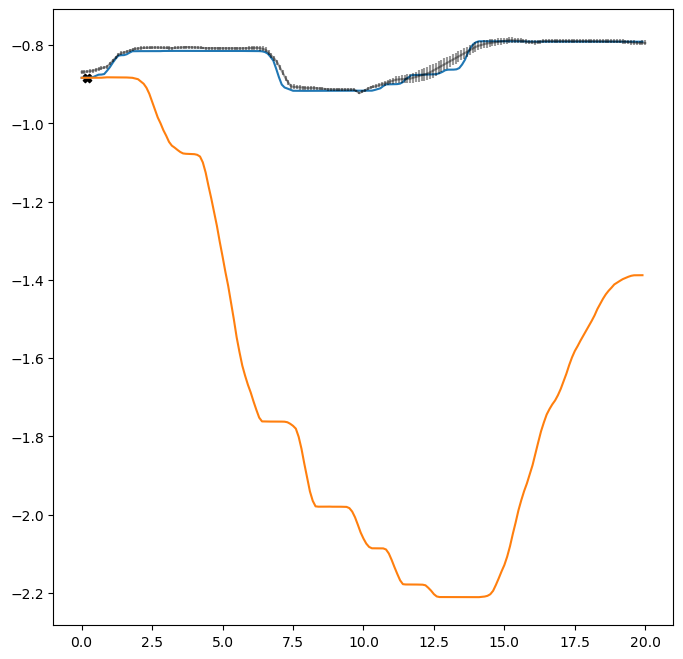

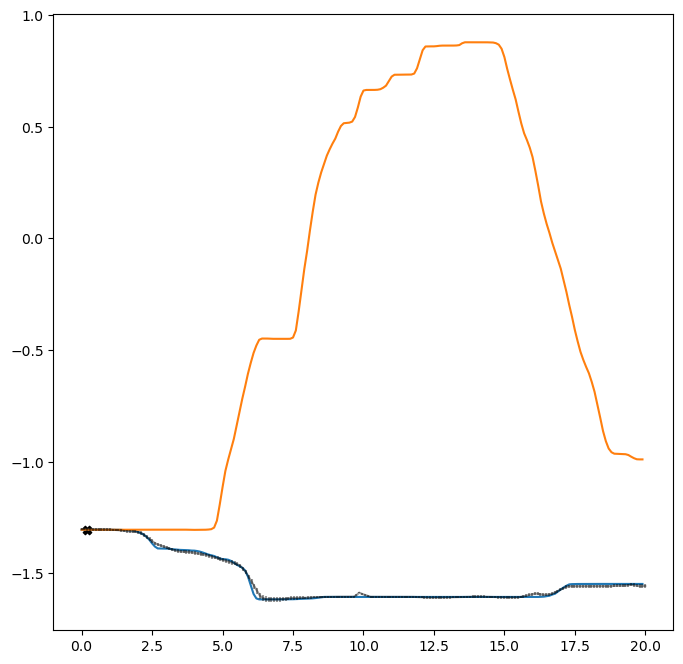

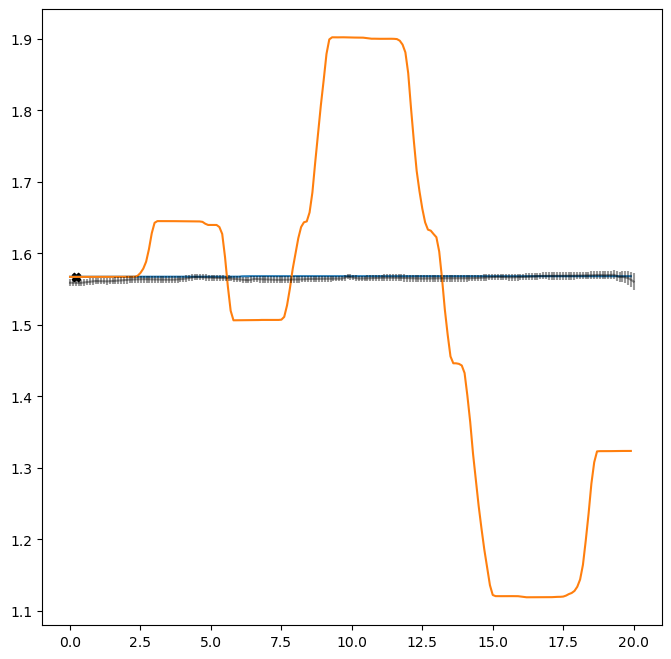

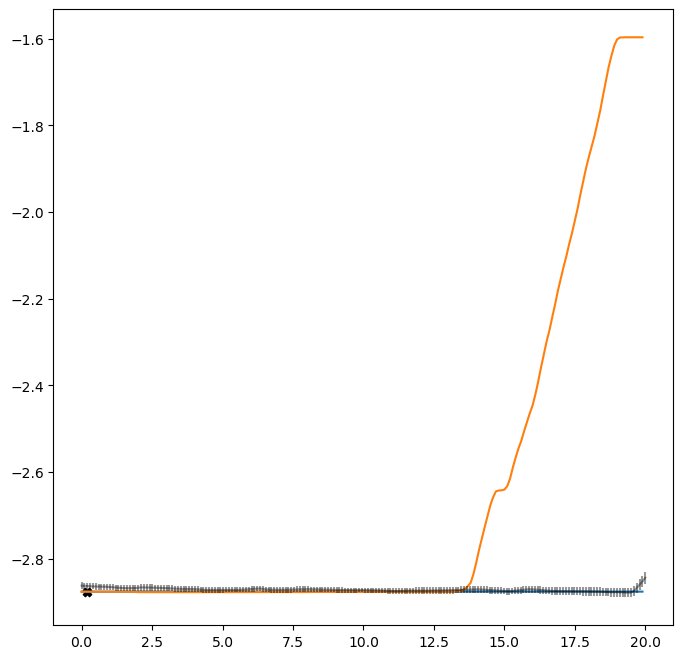

(200, 6)

Current TP, and predicitons below for all output dimensions
1.1818181818181819


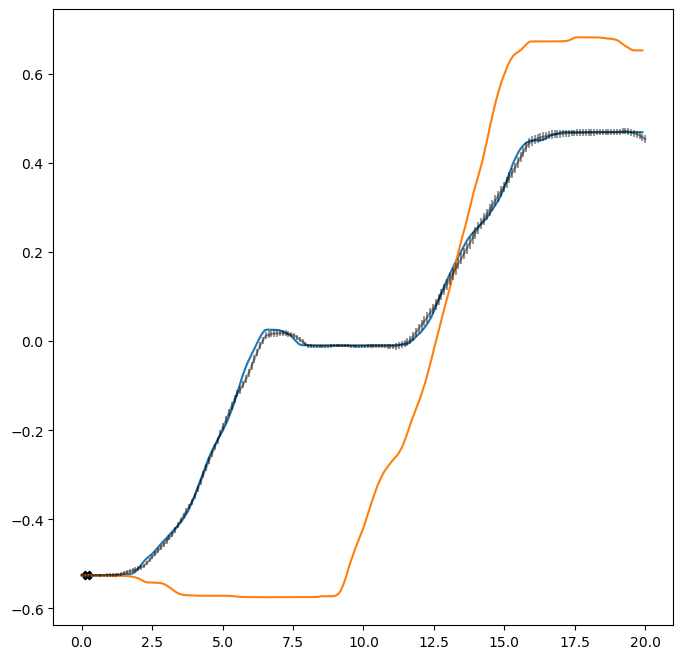

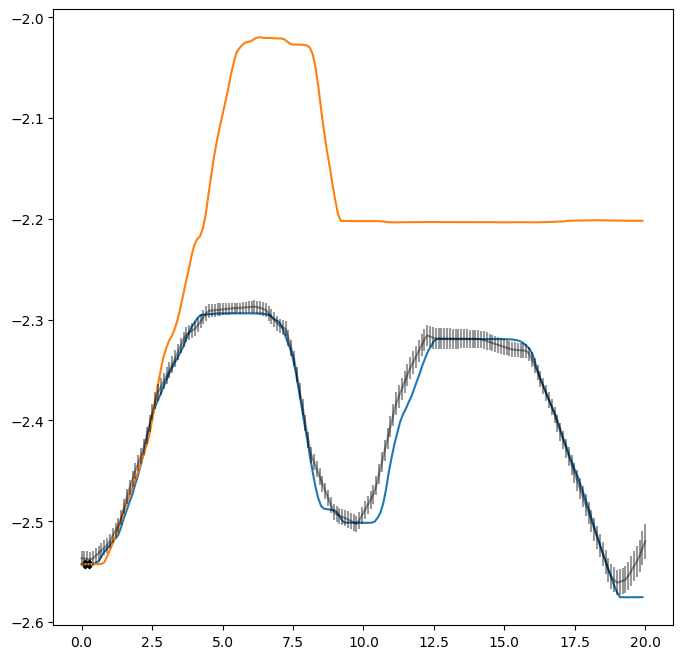

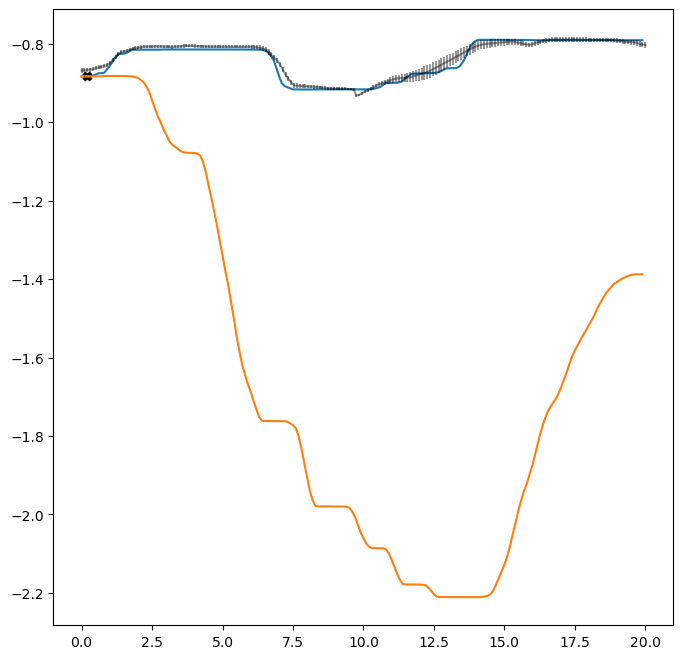

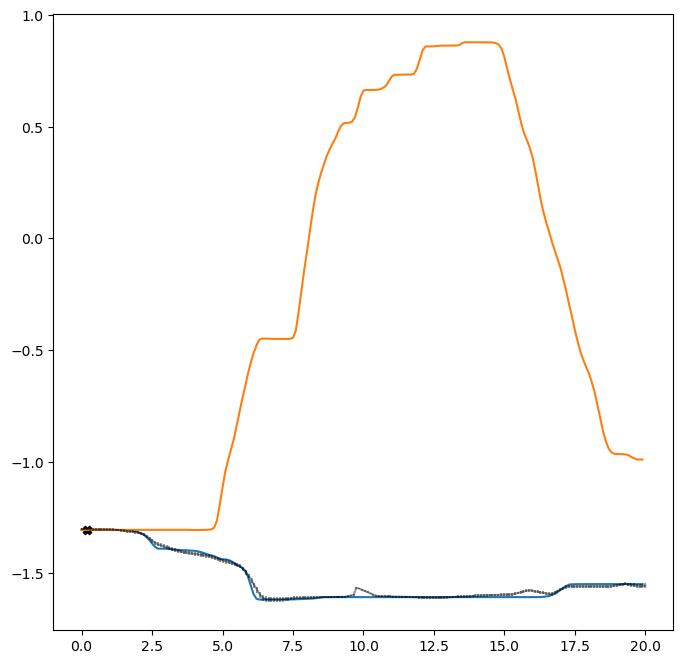

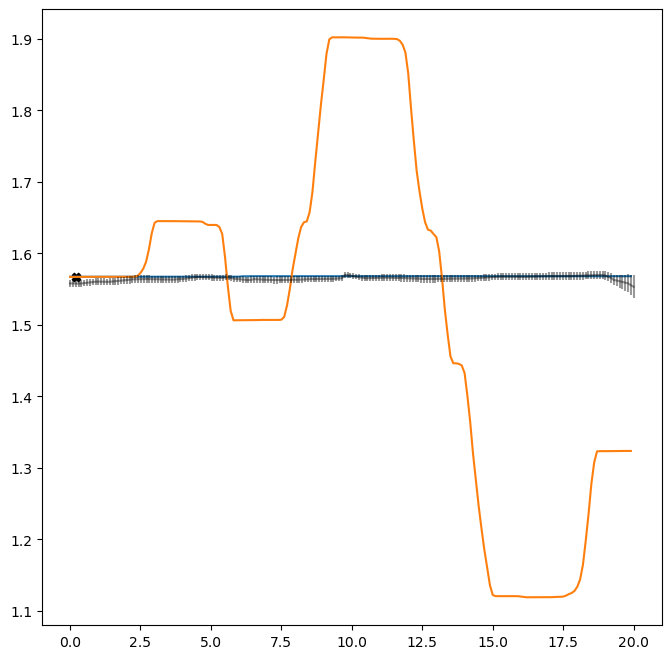

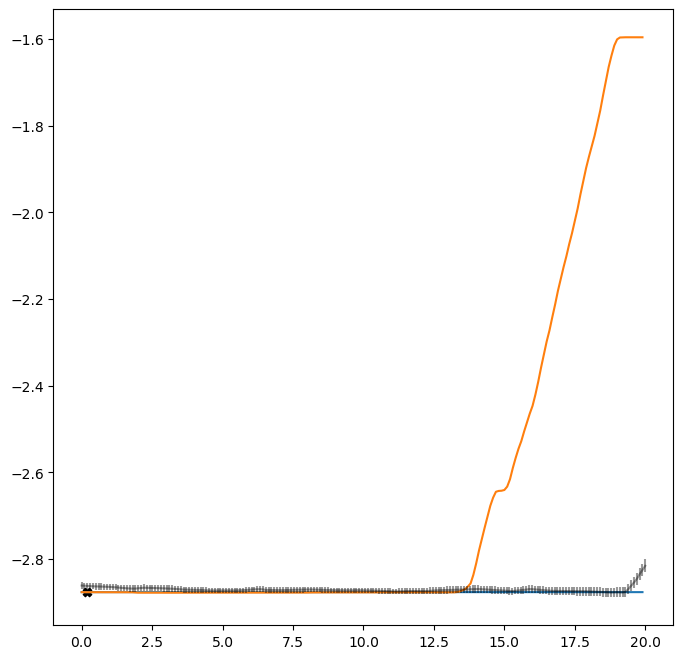

(200, 6)

Current TP, and predicitons below for all output dimensions
1.2121212121212122


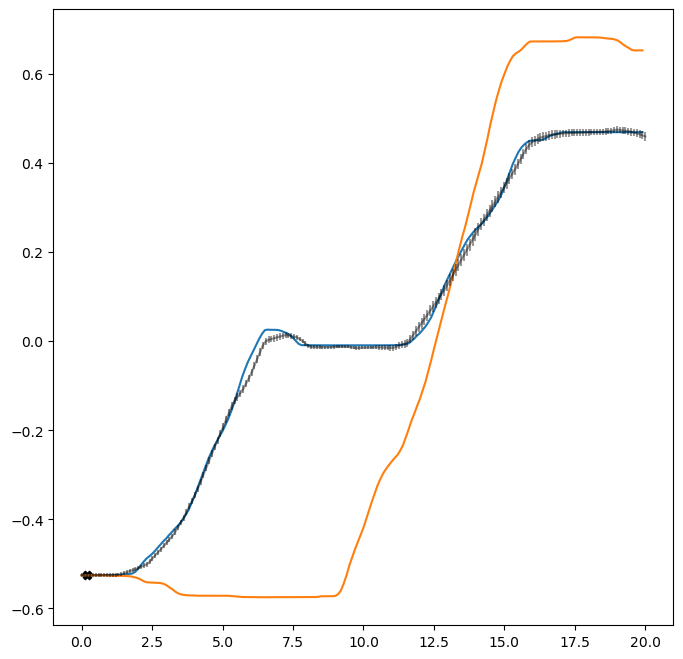

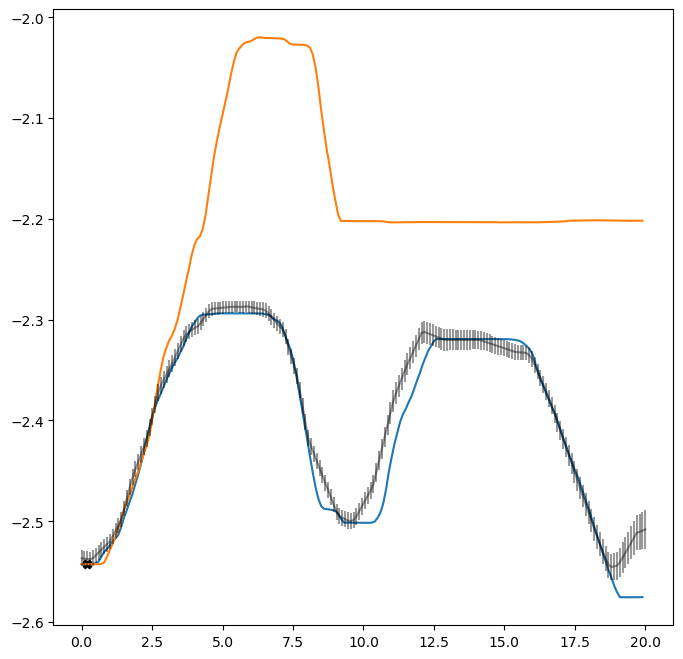

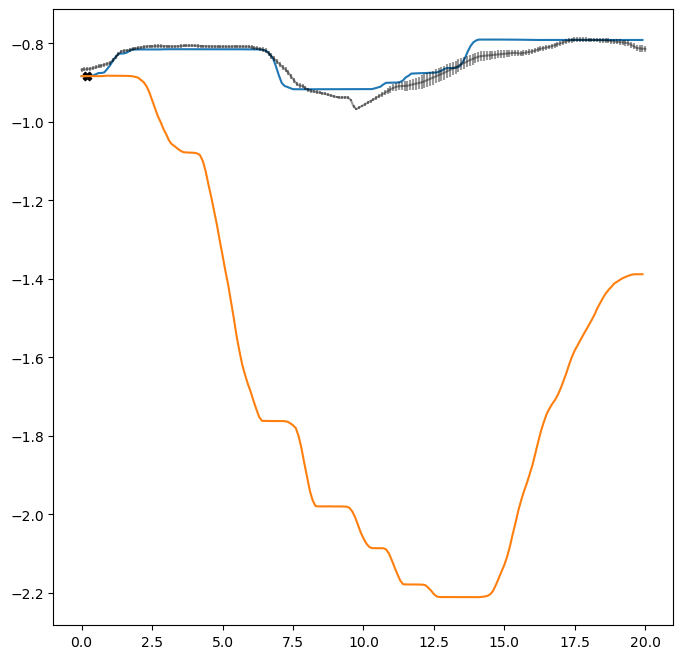

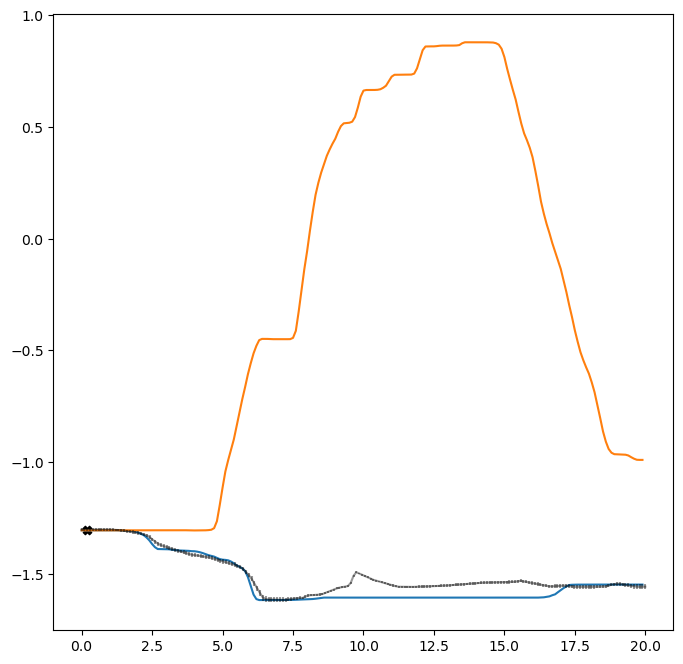

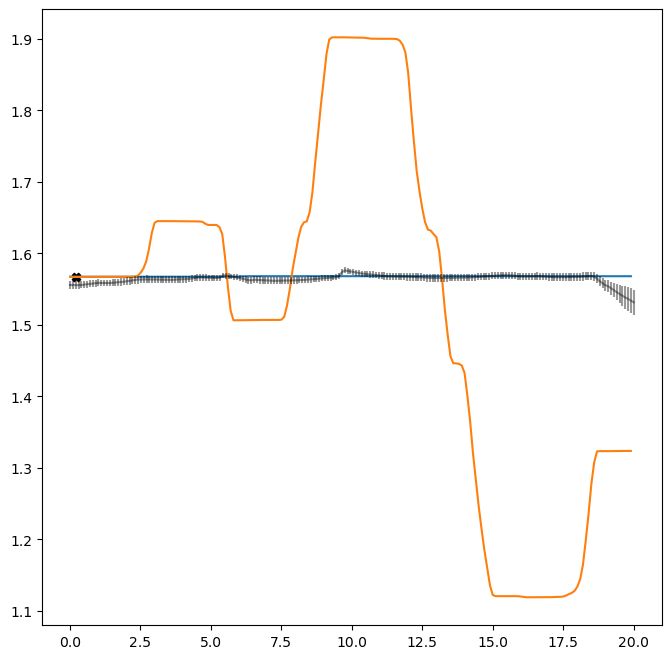

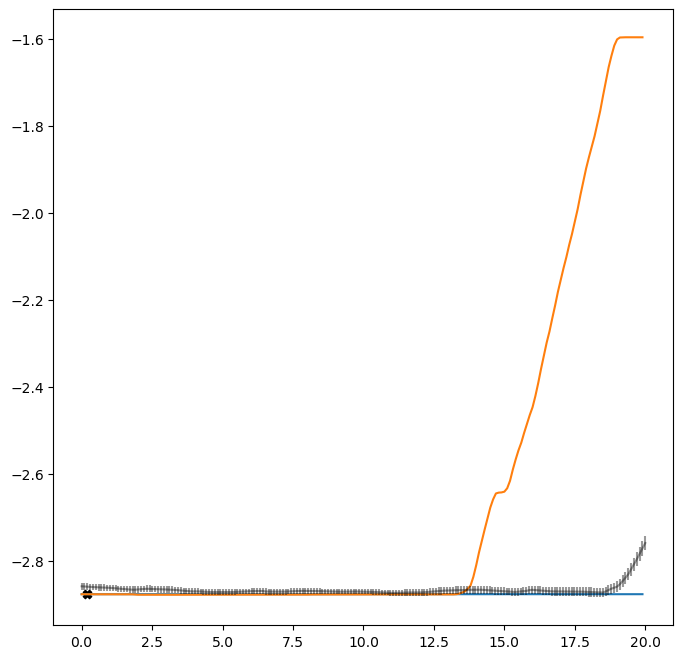

(200, 6)

Current TP, and predicitons below for all output dimensions
1.2424242424242424


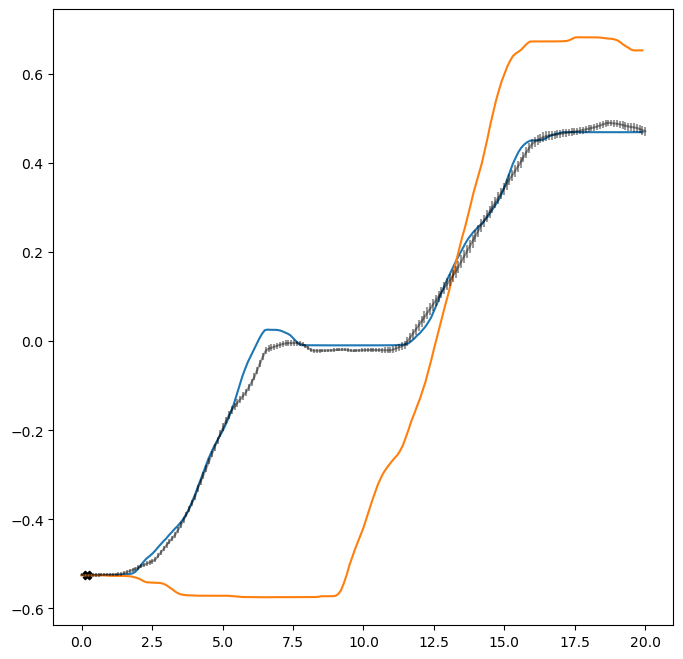

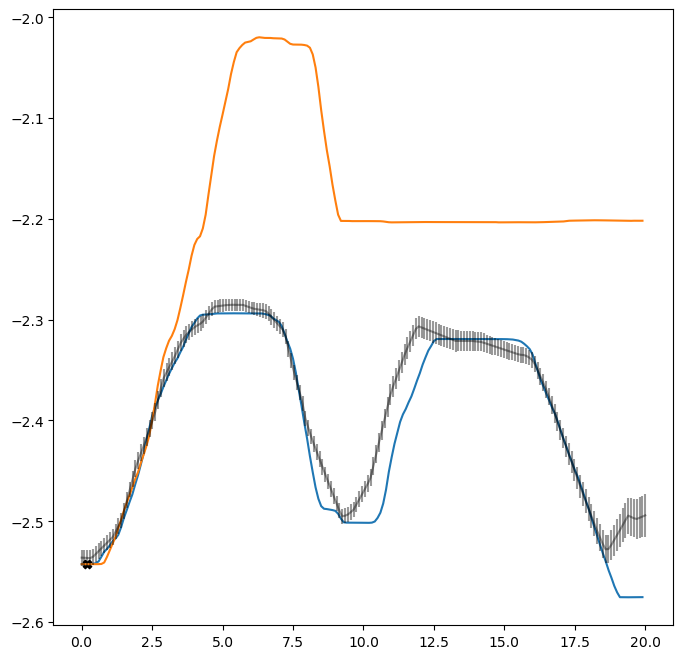

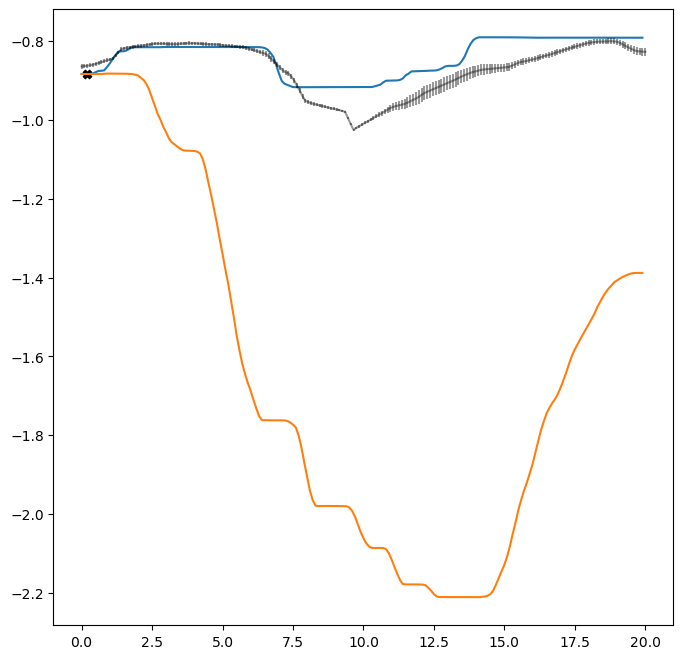

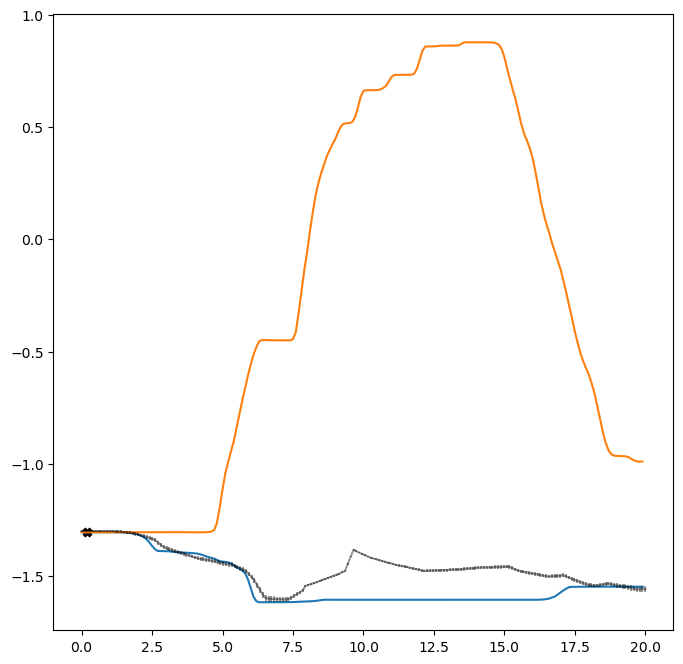

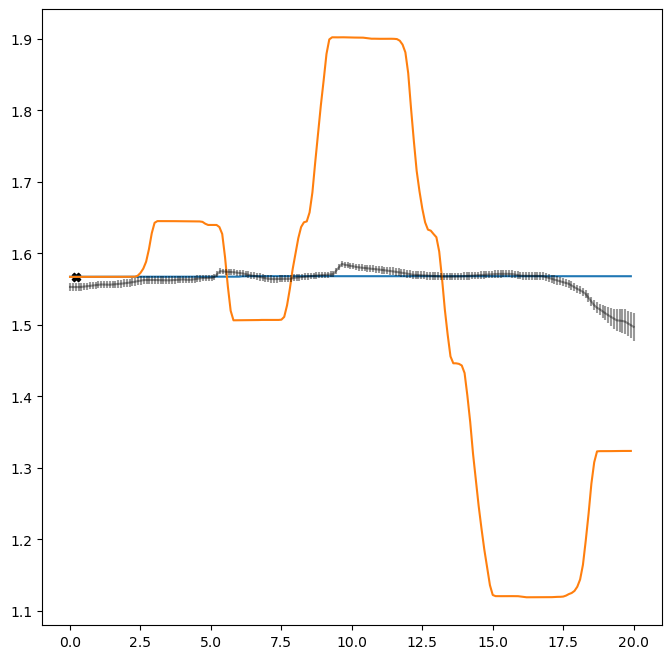

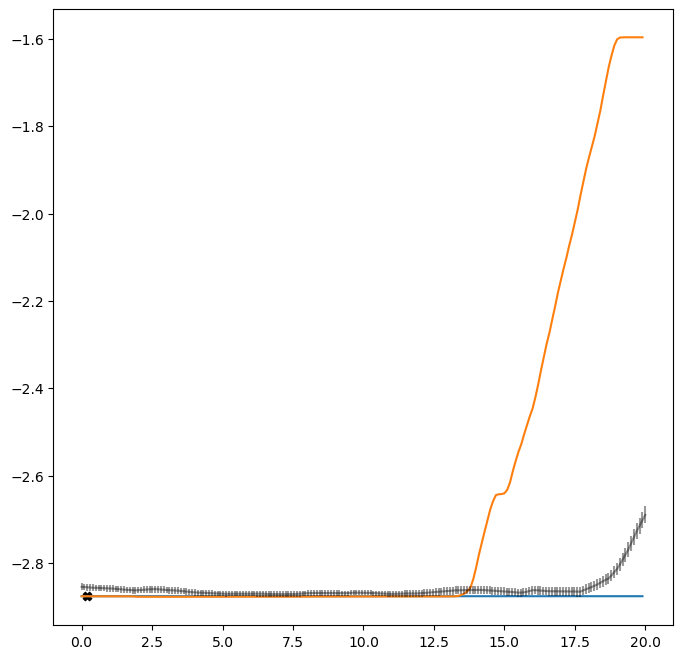

(200, 6)

Current TP, and predicitons below for all output dimensions
1.2727272727272727


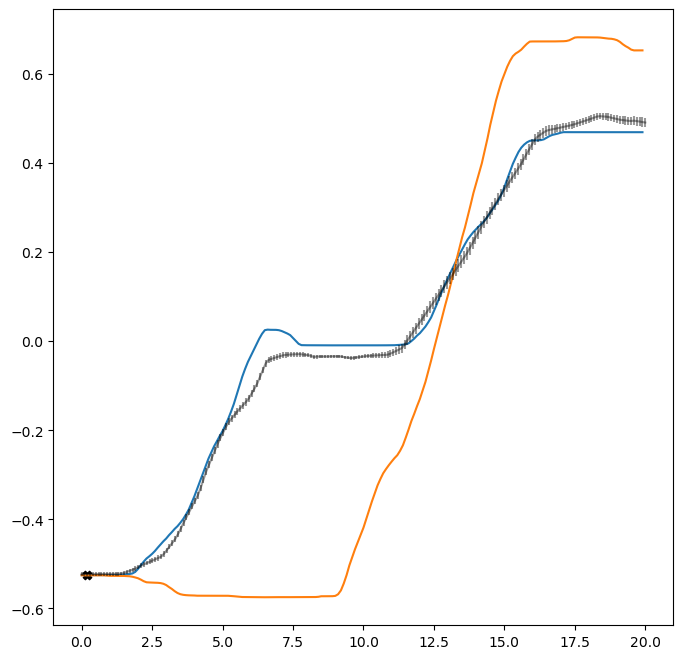

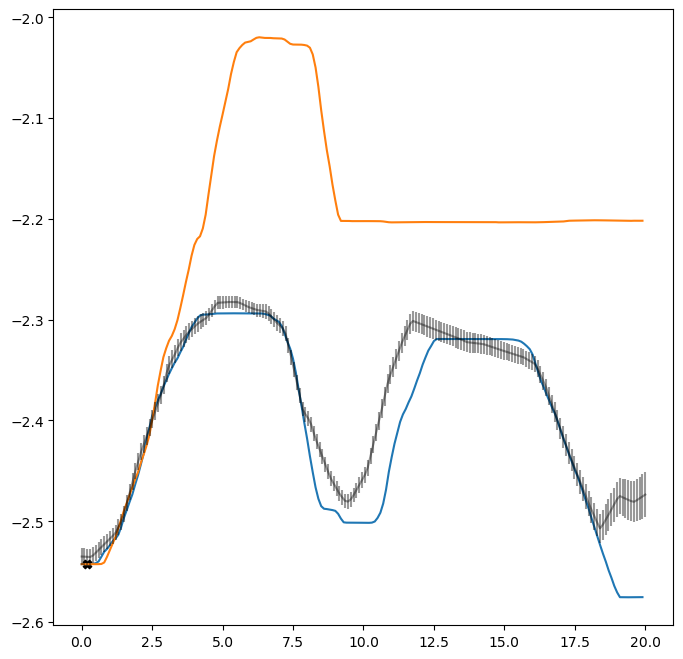

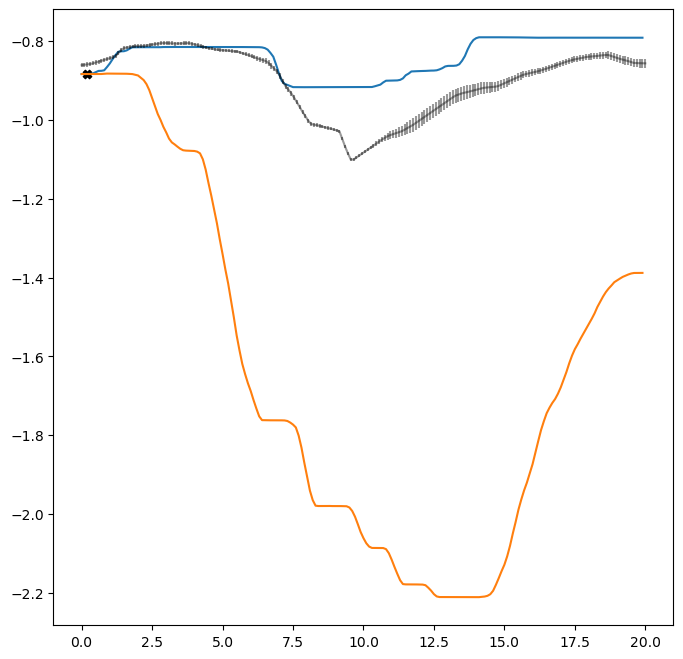

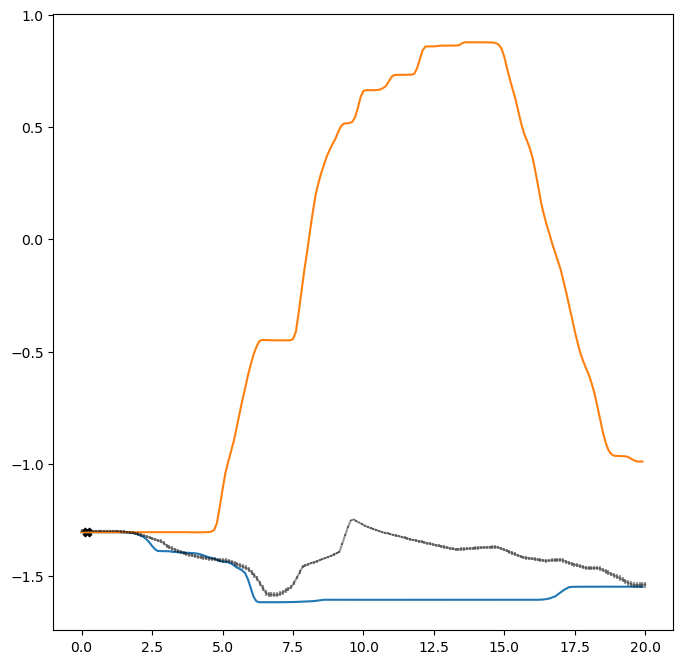

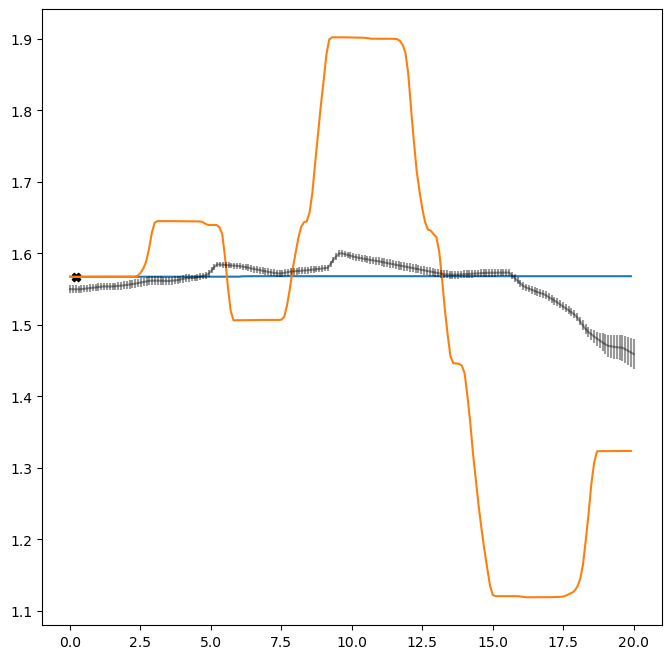

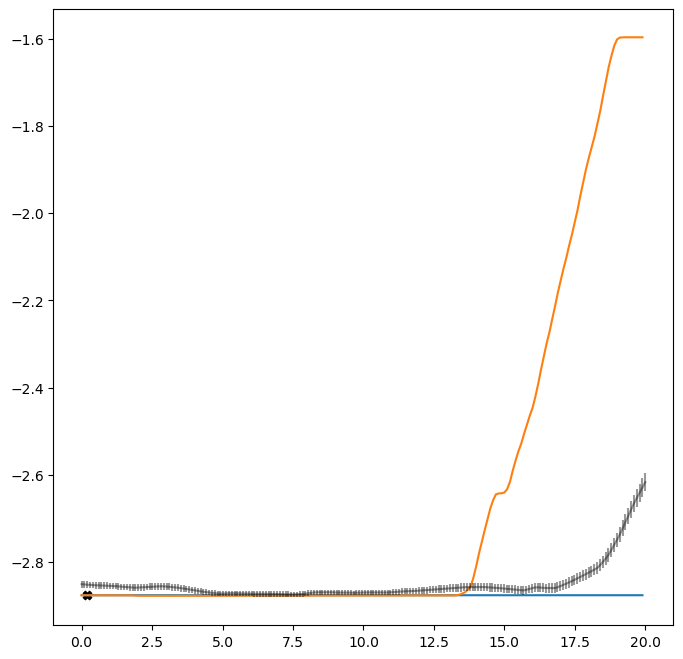

(200, 6)

Current TP, and predicitons below for all output dimensions
1.303030303030303


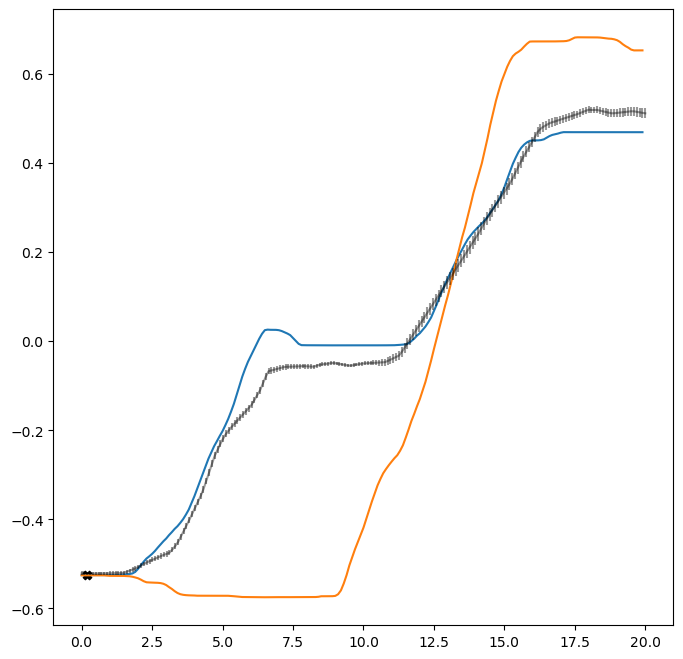

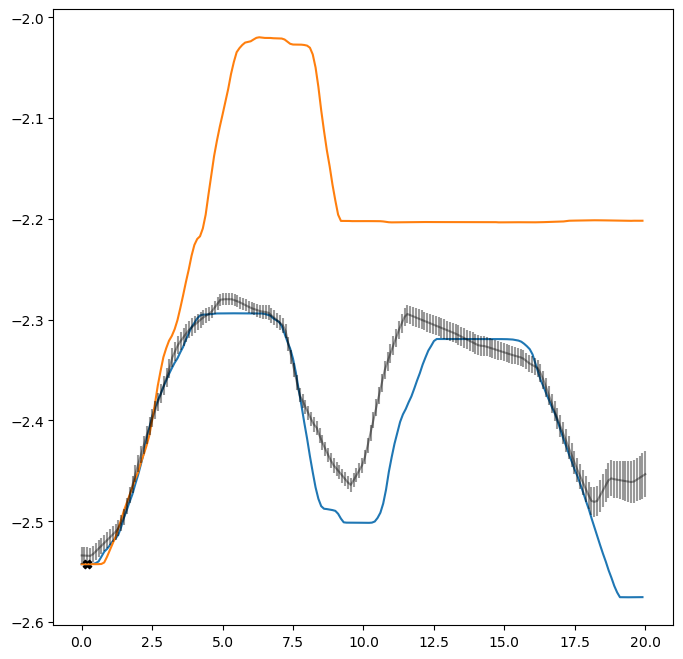

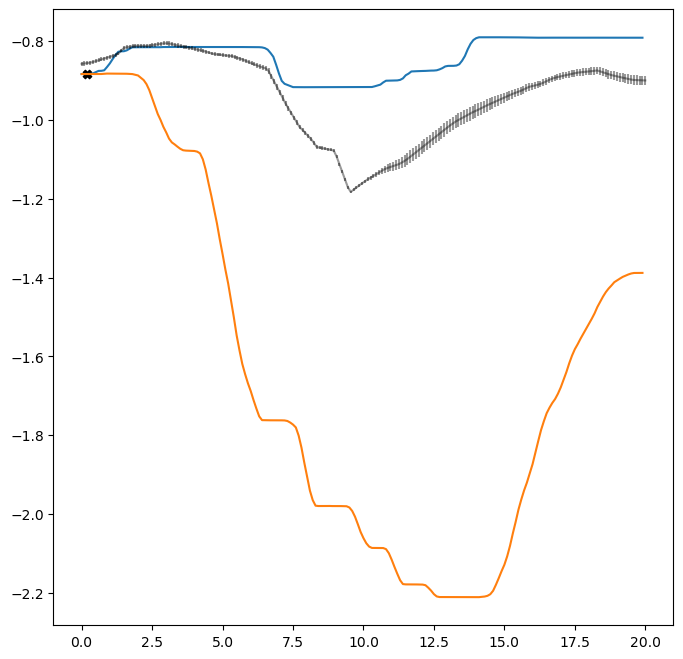

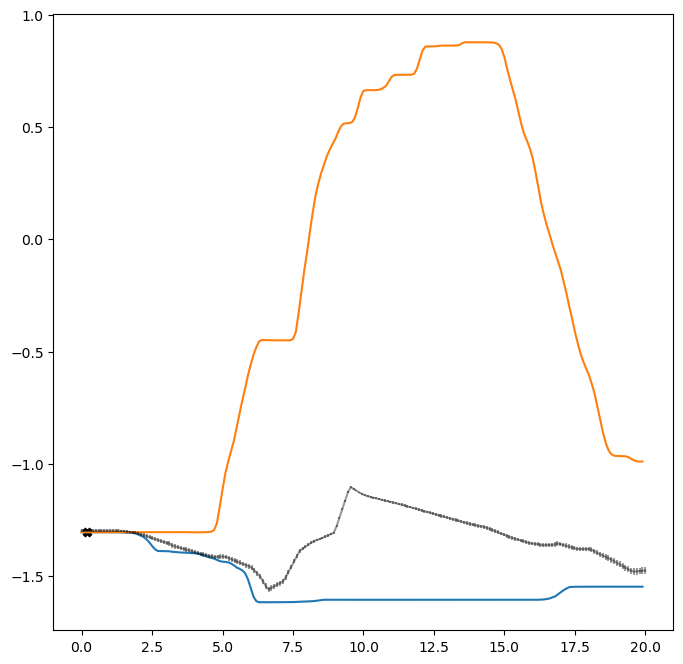

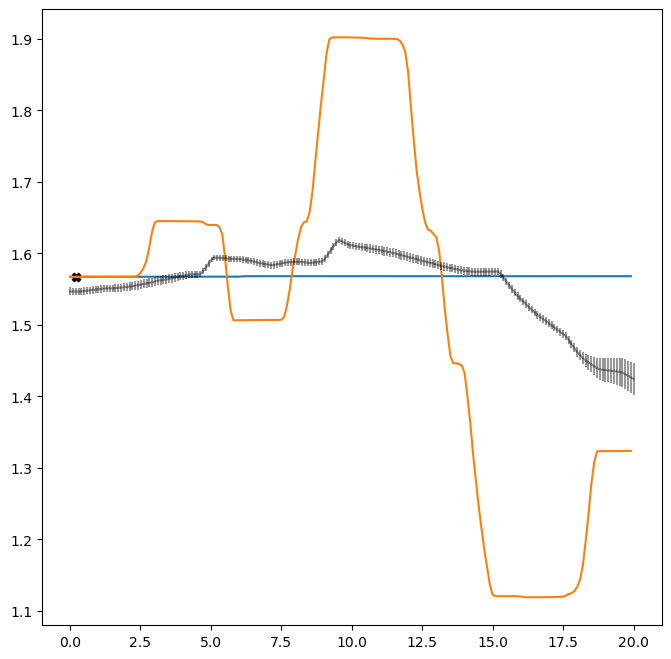

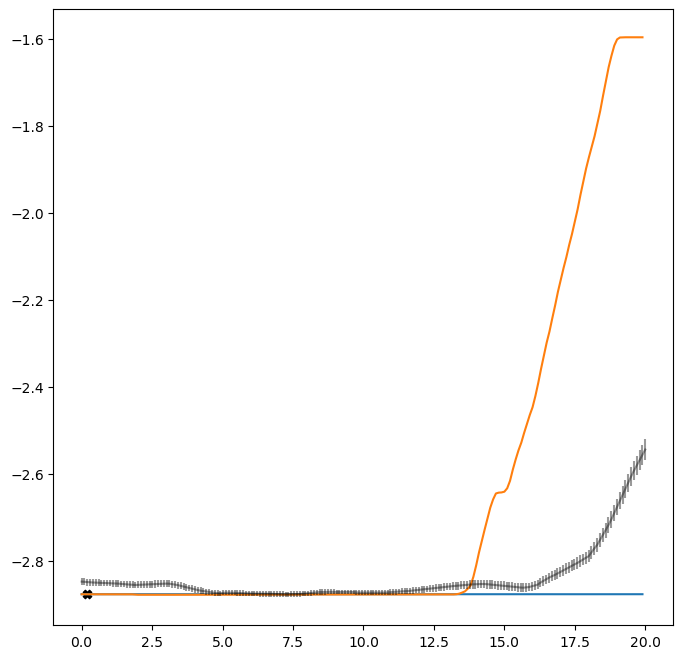

(200, 6)

Current TP, and predicitons below for all output dimensions
1.3333333333333335


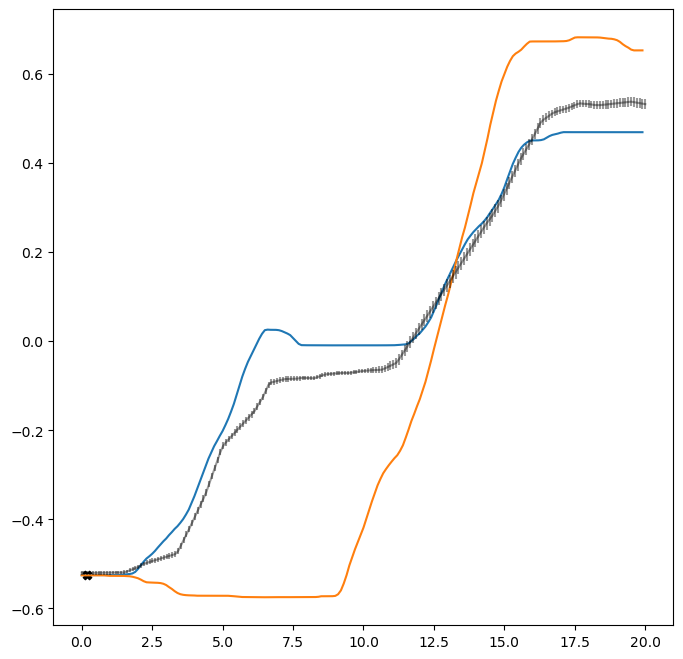

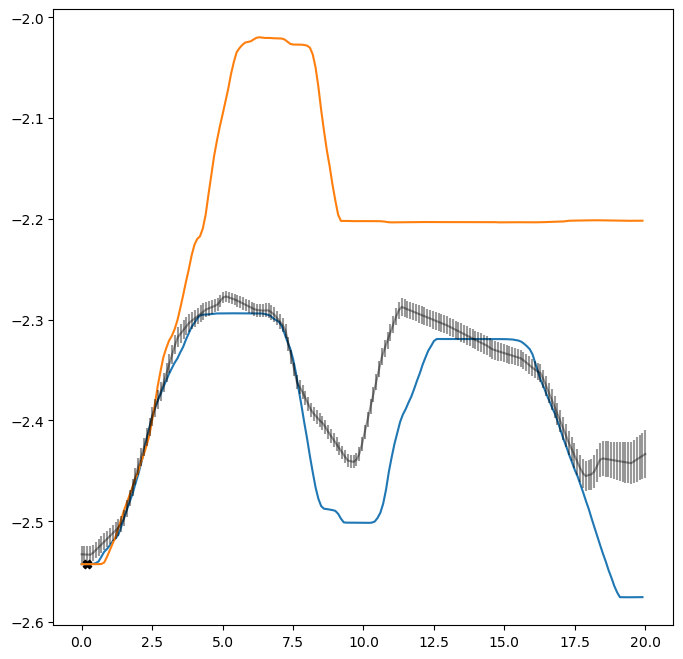

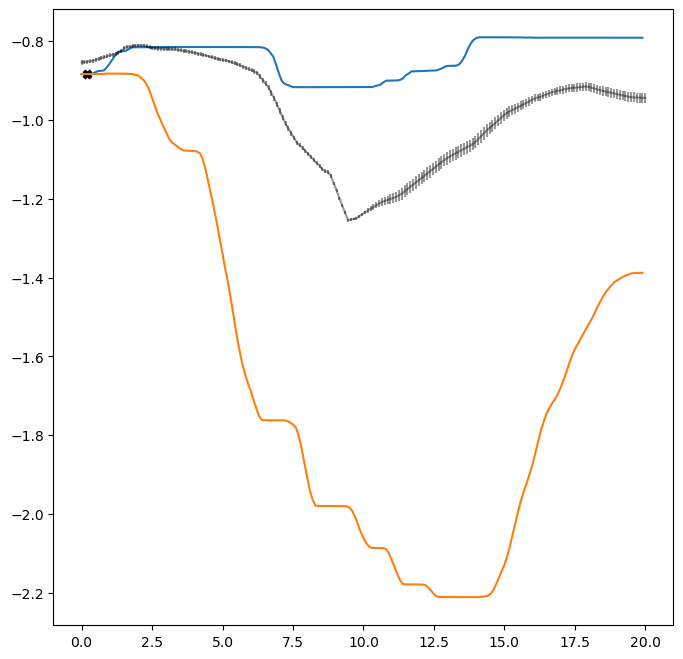

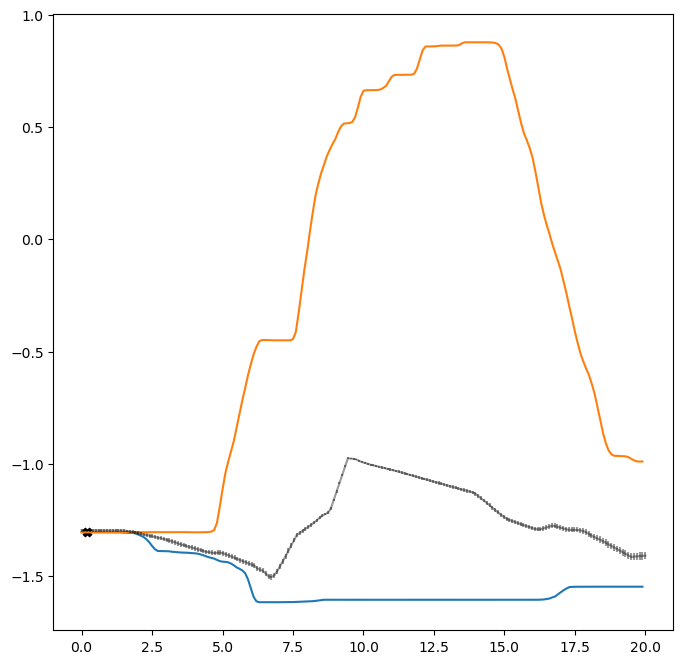

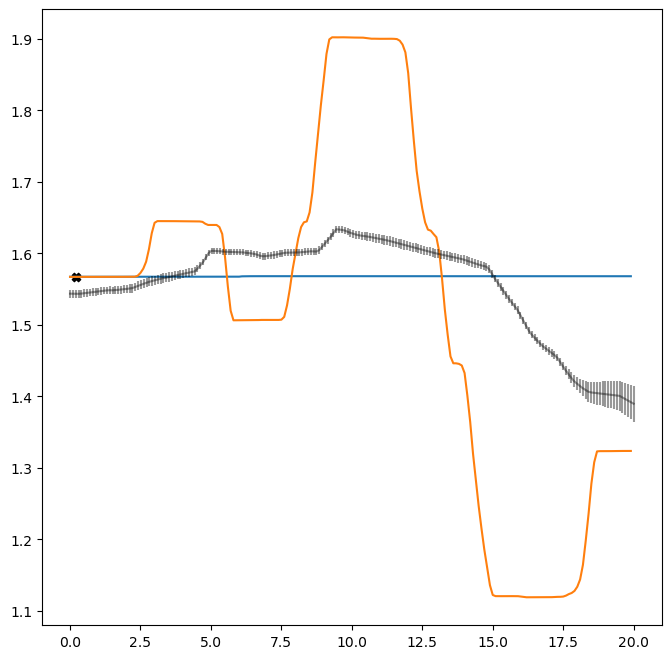

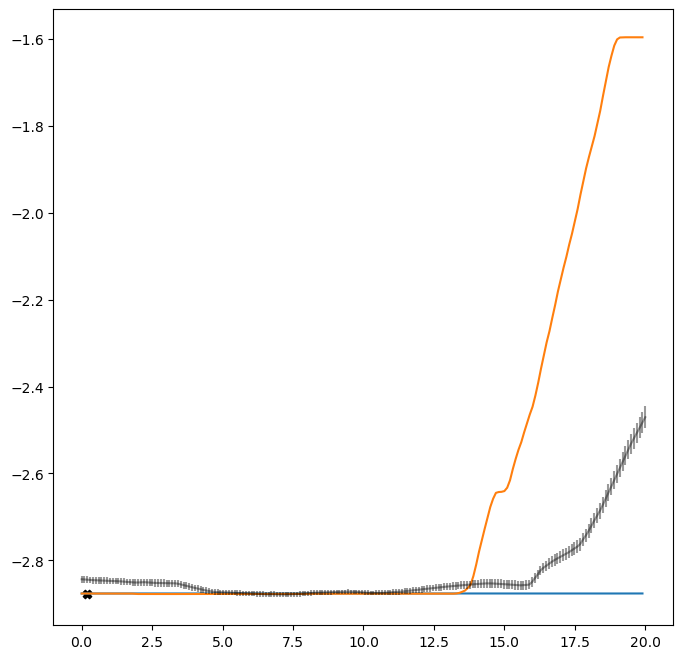

(200, 6)

Current TP, and predicitons below for all output dimensions
1.3636363636363638


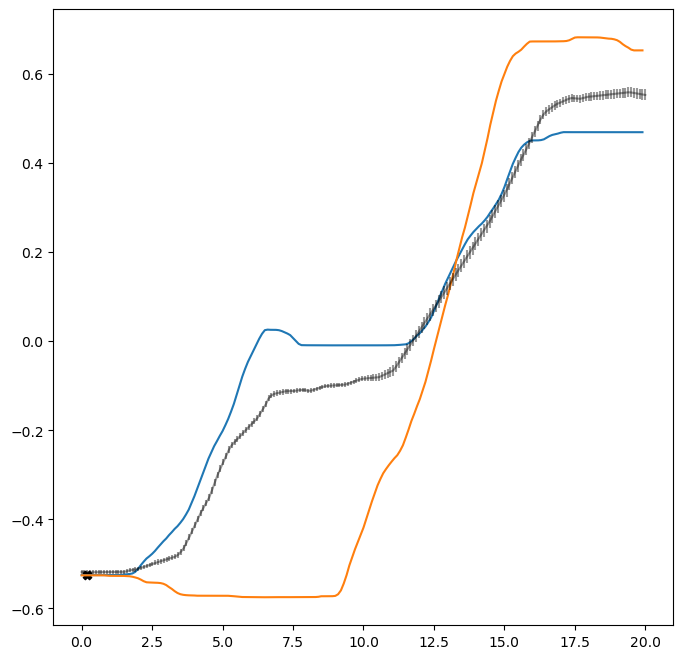

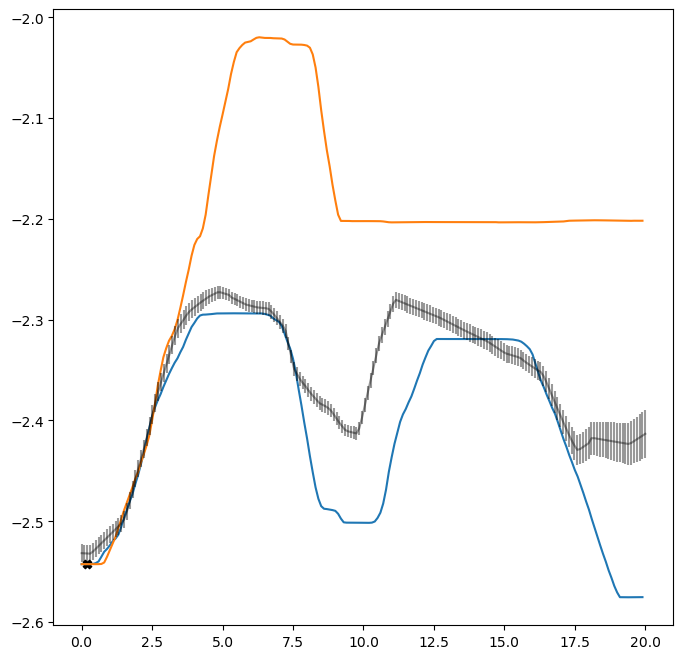

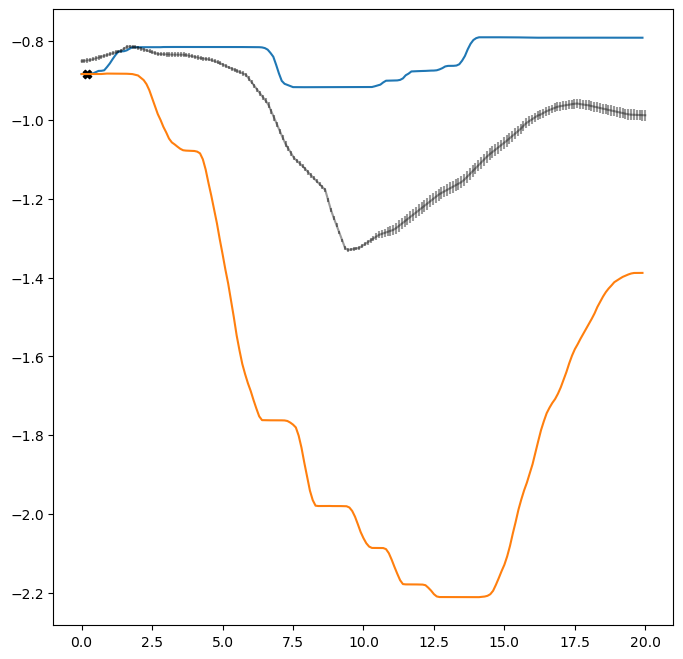

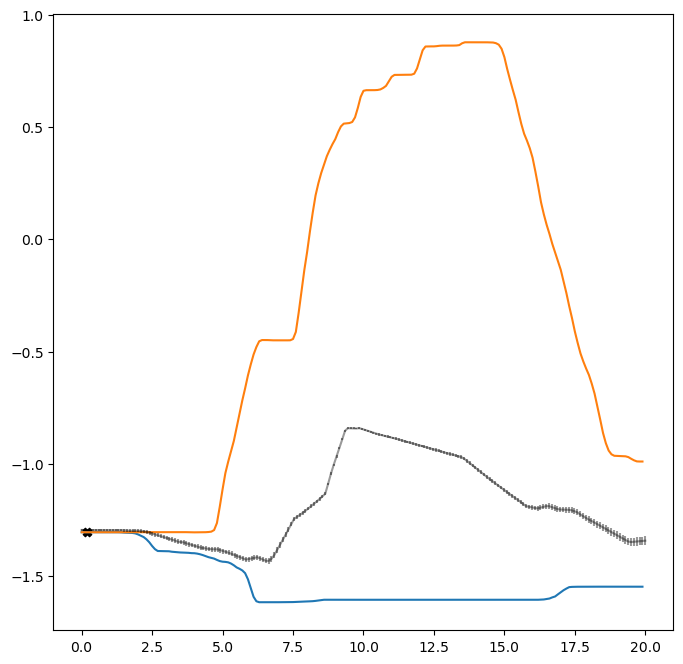

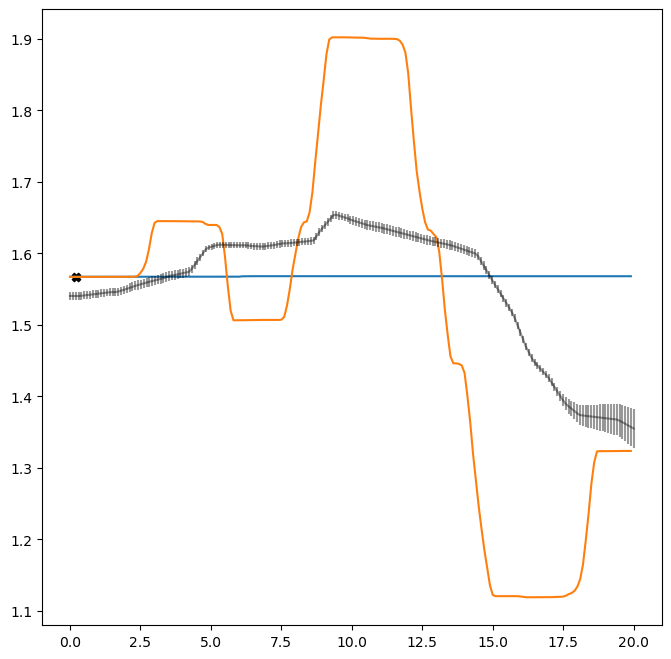

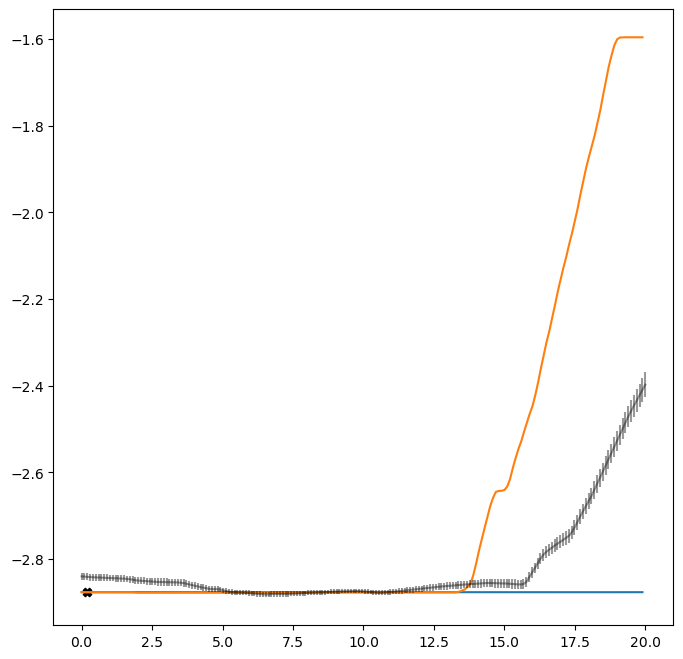

(200, 6)

Current TP, and predicitons below for all output dimensions
1.393939393939394


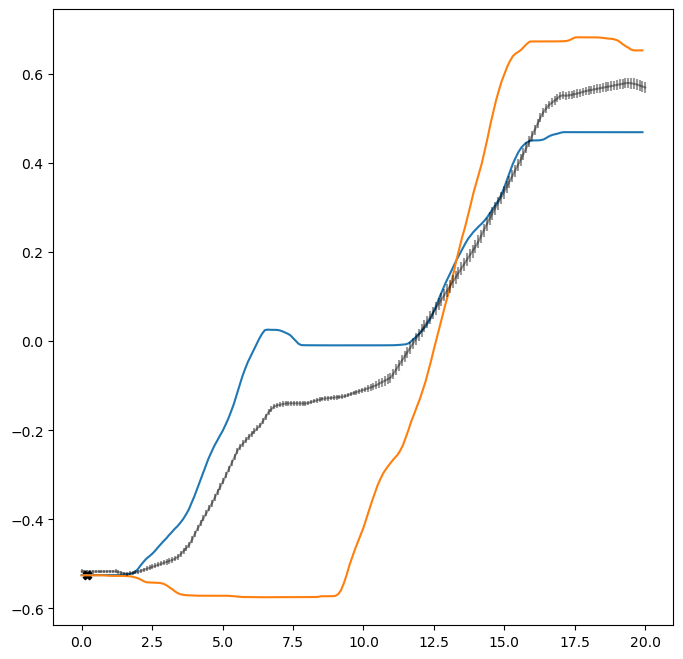

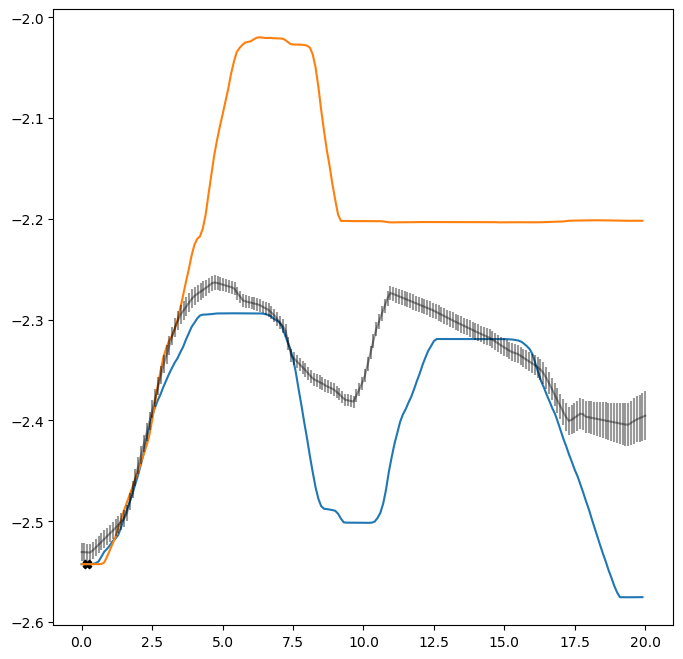

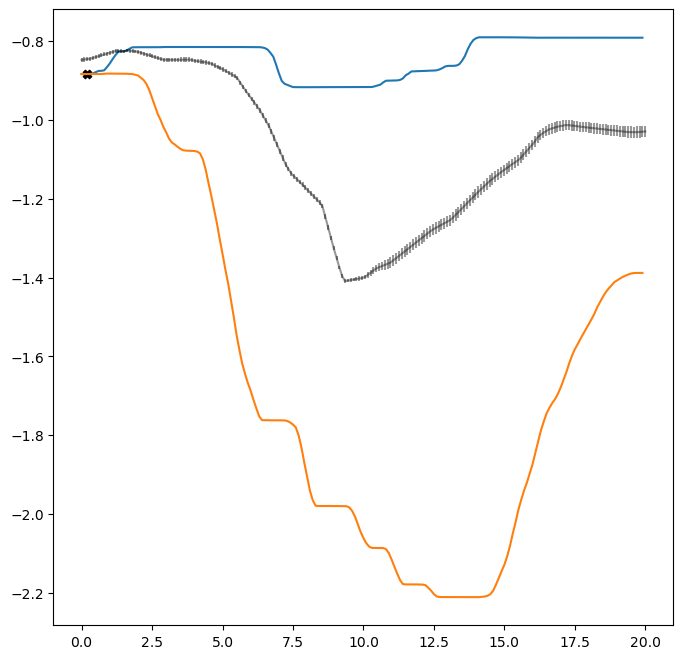

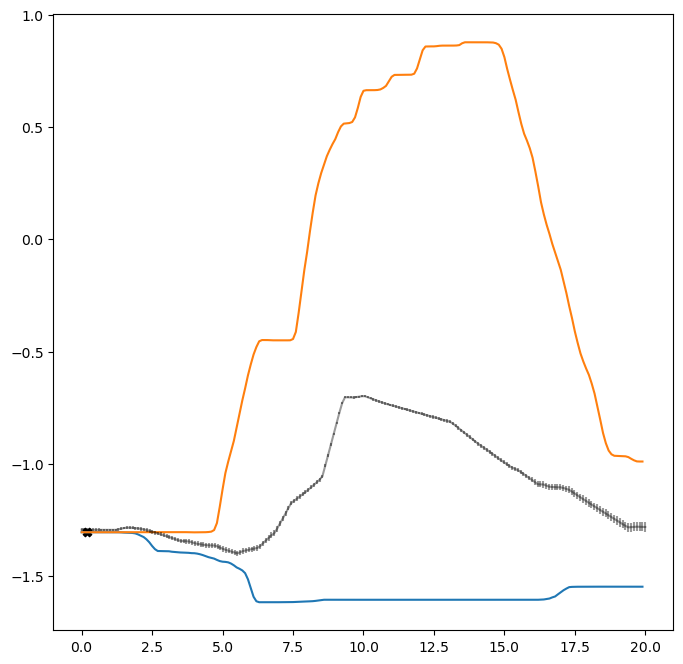

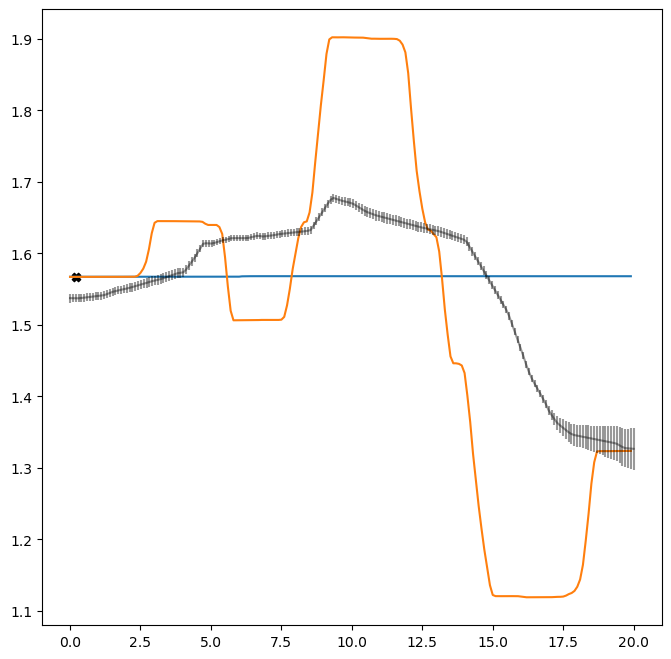

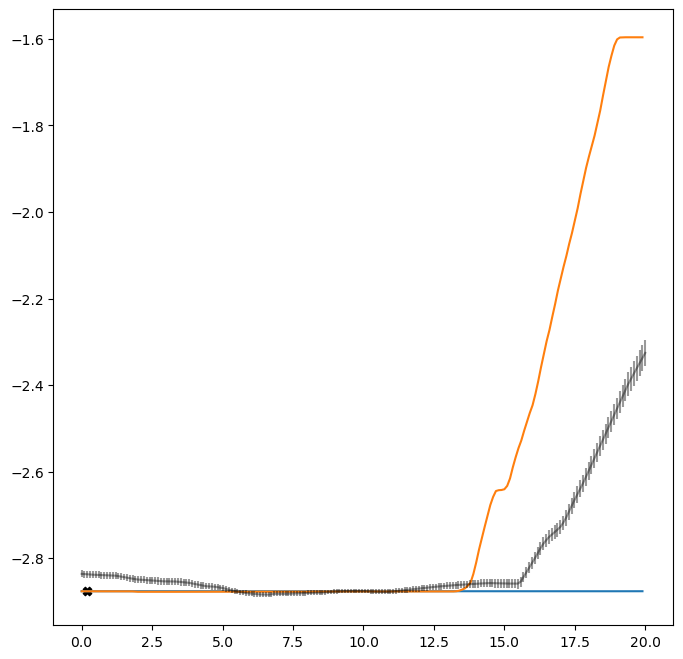

(200, 6)

Current TP, and predicitons below for all output dimensions
1.4242424242424243


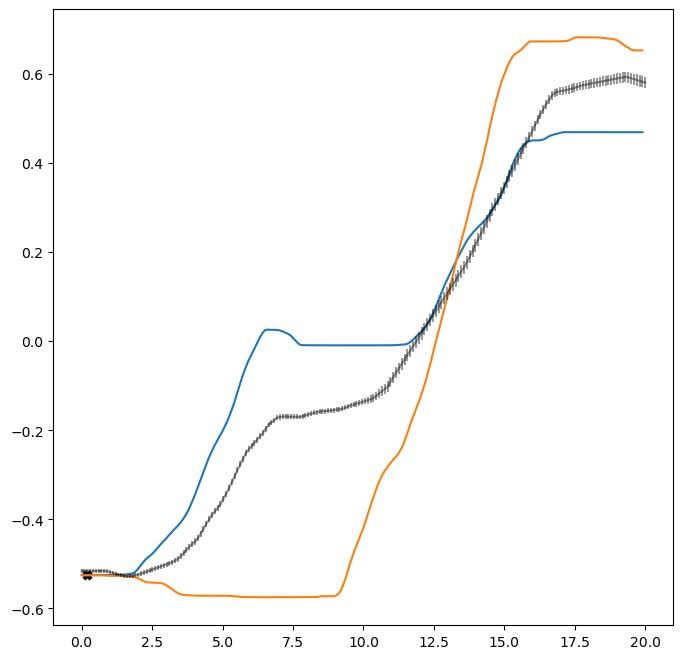

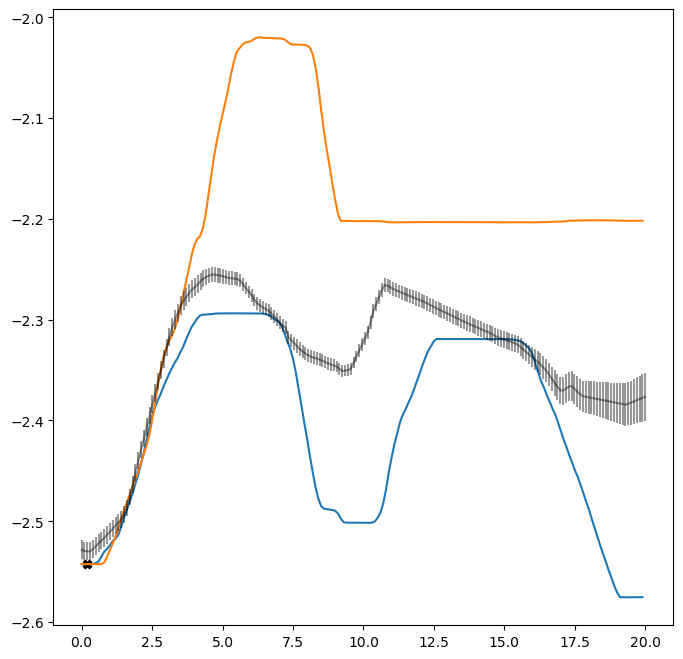

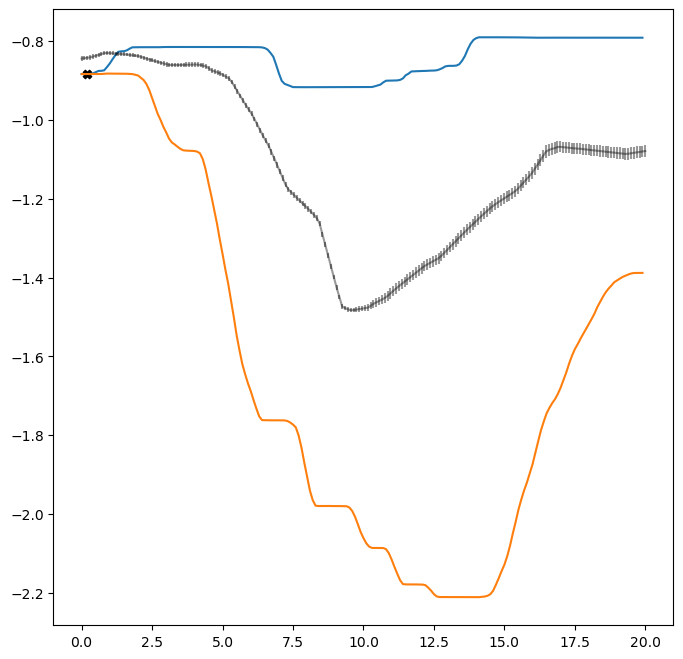

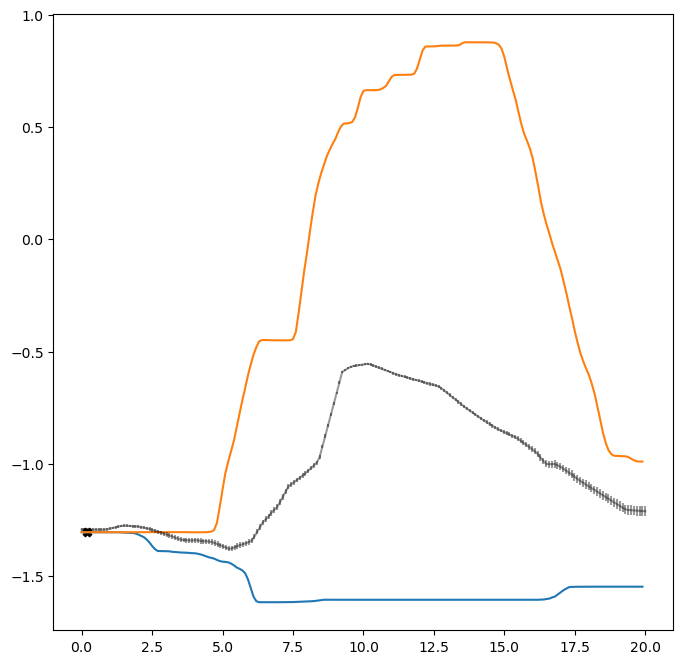

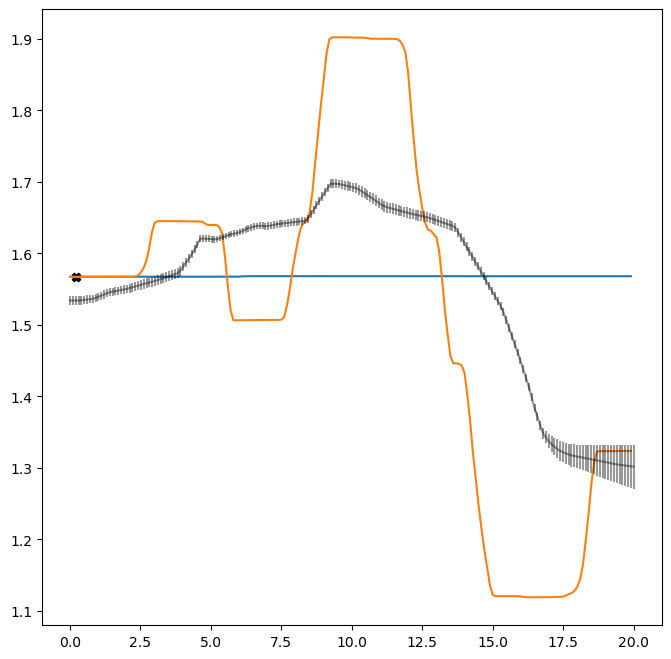

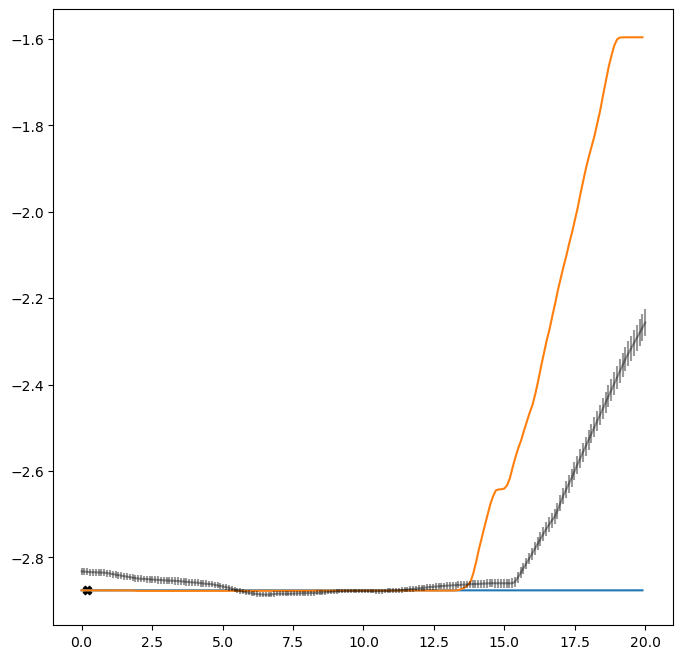

(200, 6)

Current TP, and predicitons below for all output dimensions
1.4545454545454546


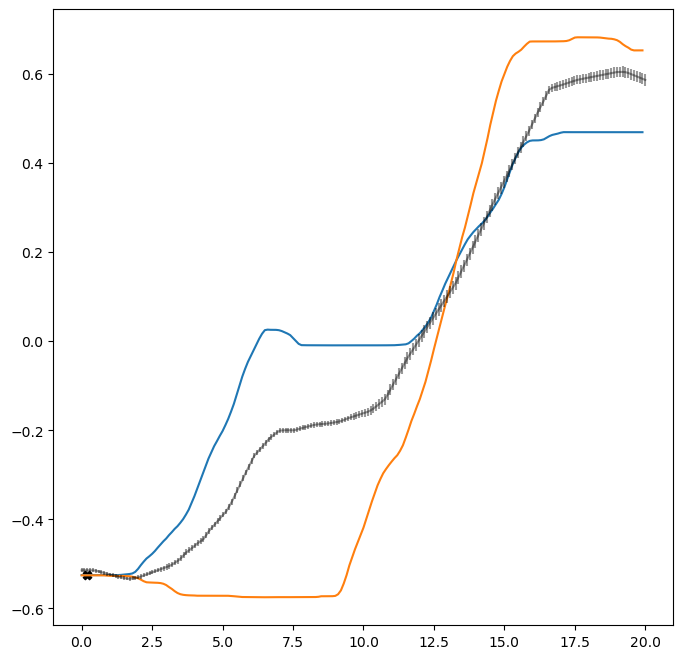

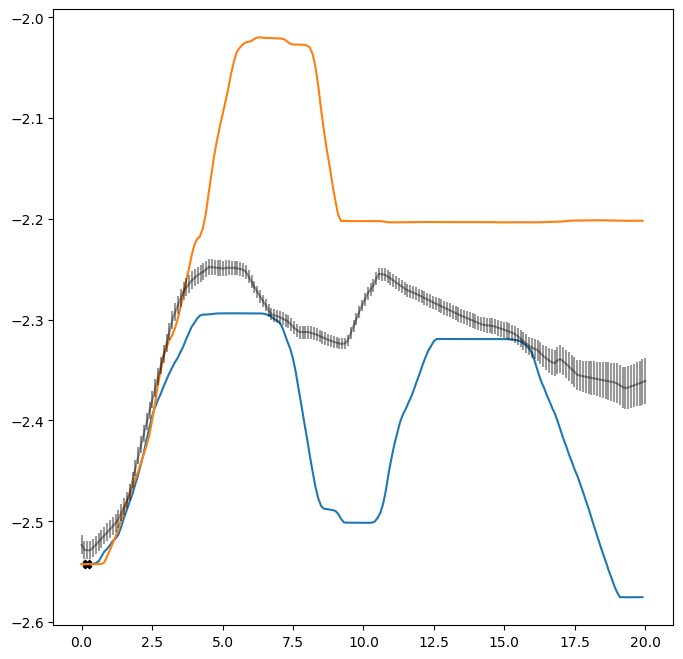

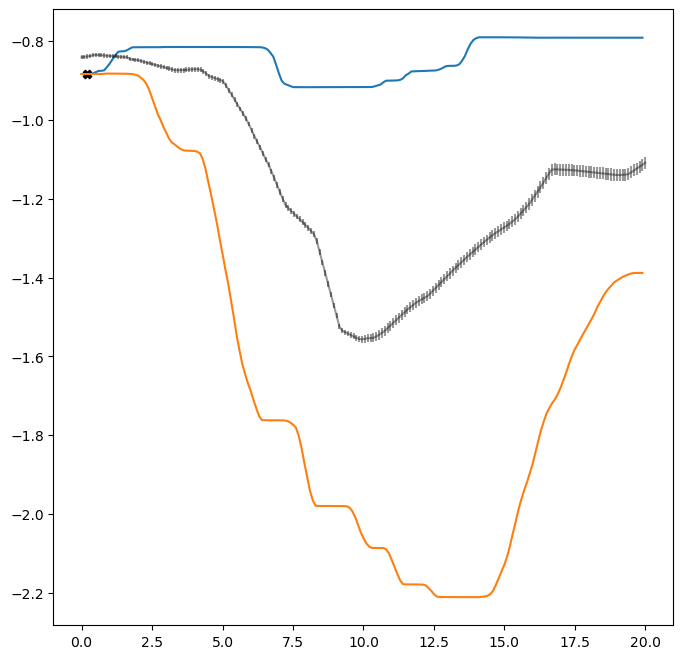

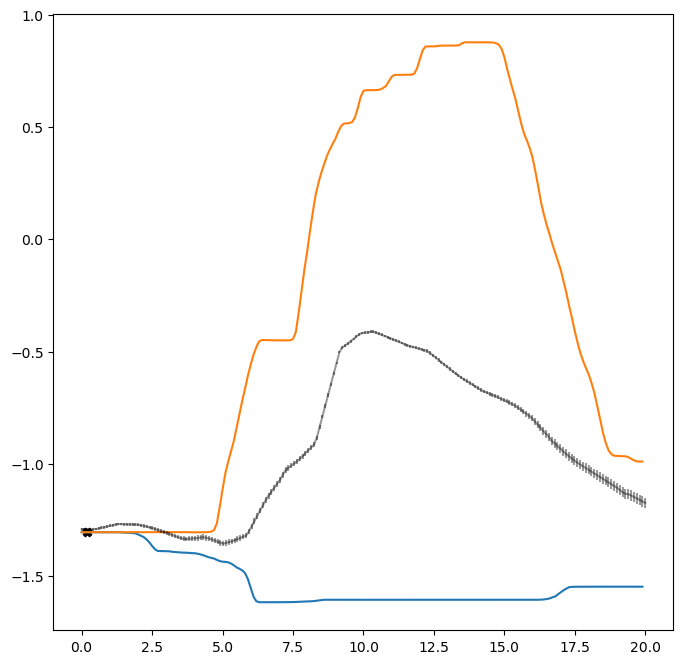

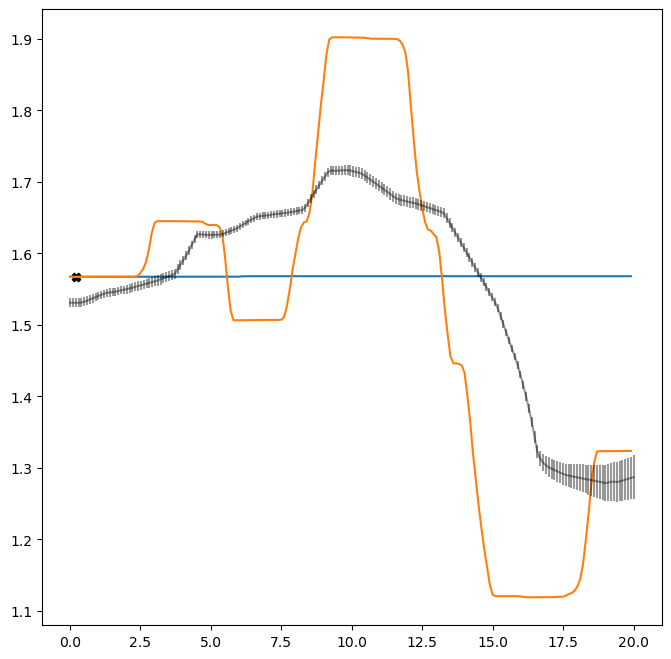

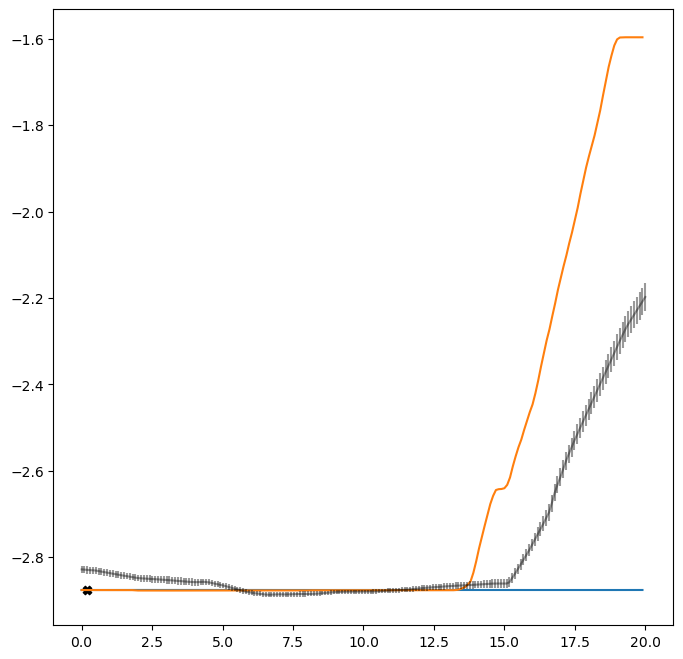

(200, 6)

Current TP, and predicitons below for all output dimensions
1.4848484848484849


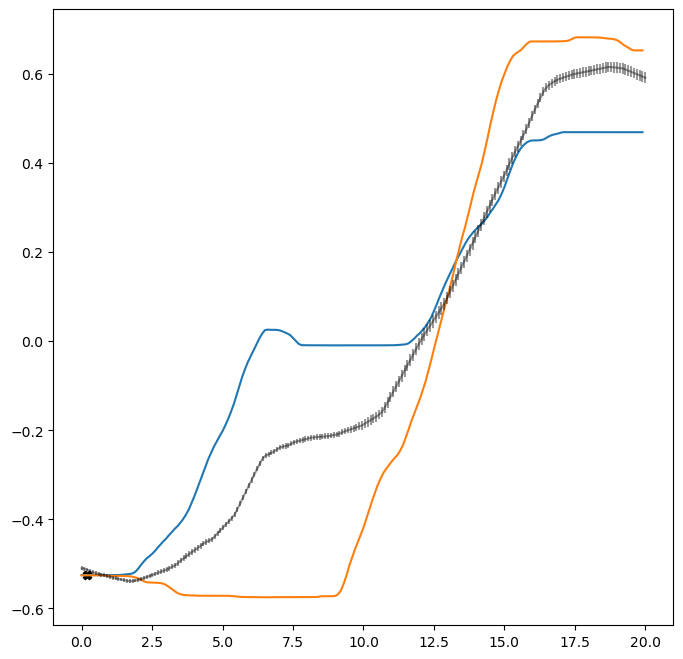

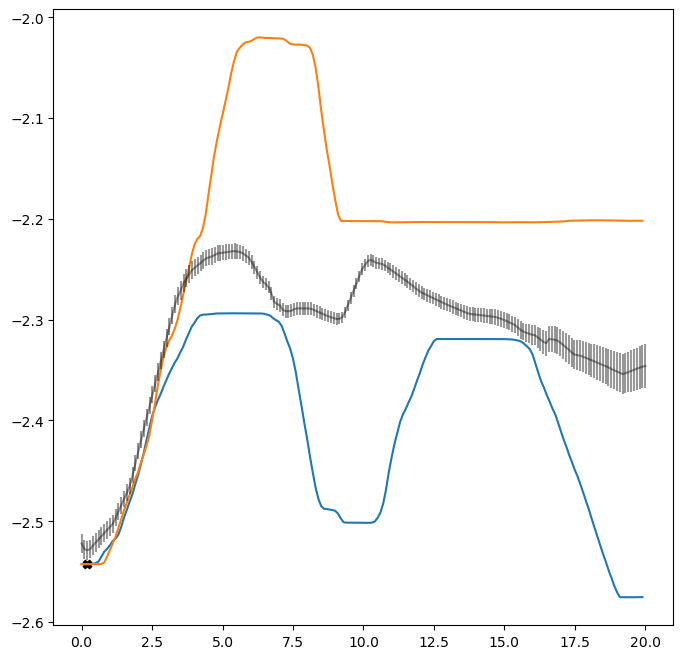

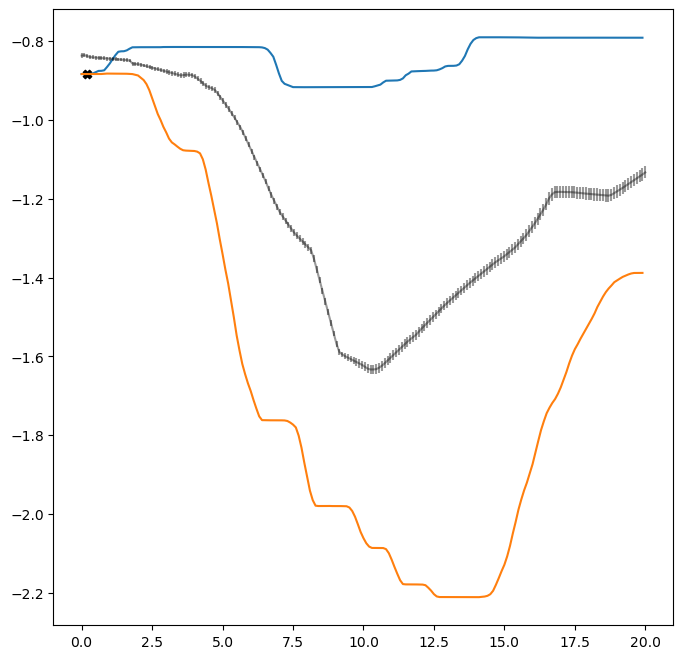

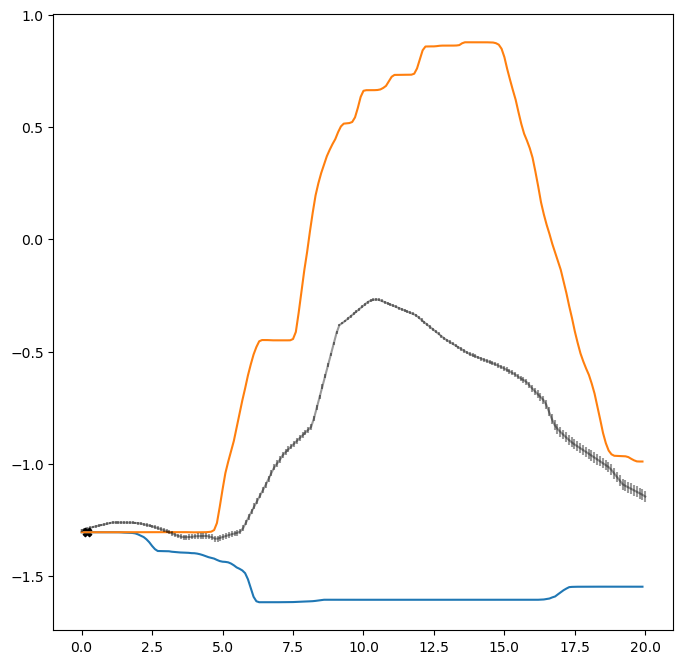

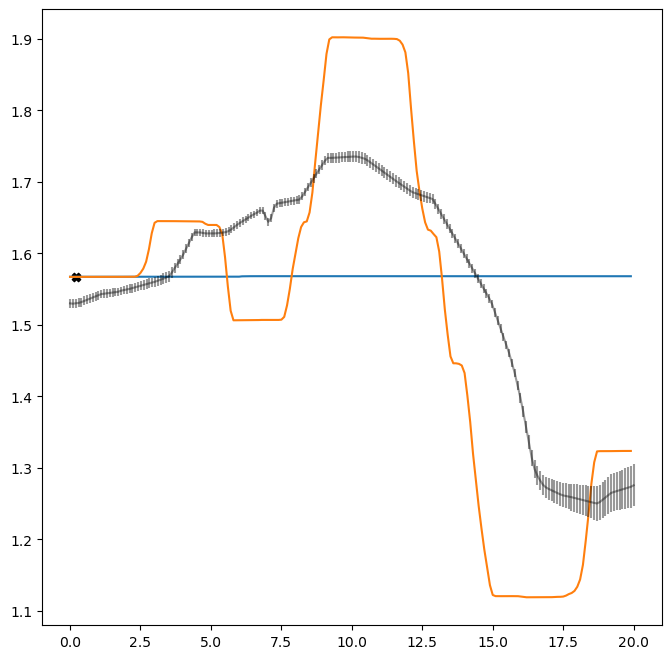

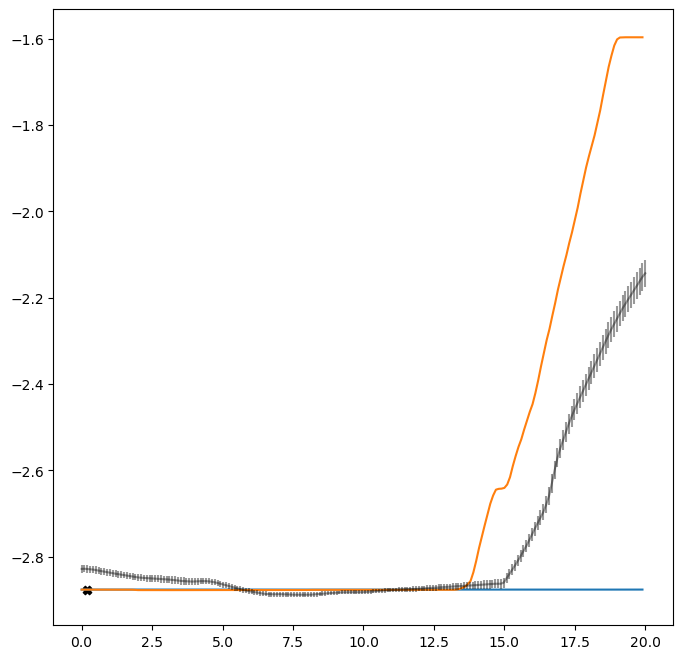

(200, 6)

Current TP, and predicitons below for all output dimensions
1.5151515151515151


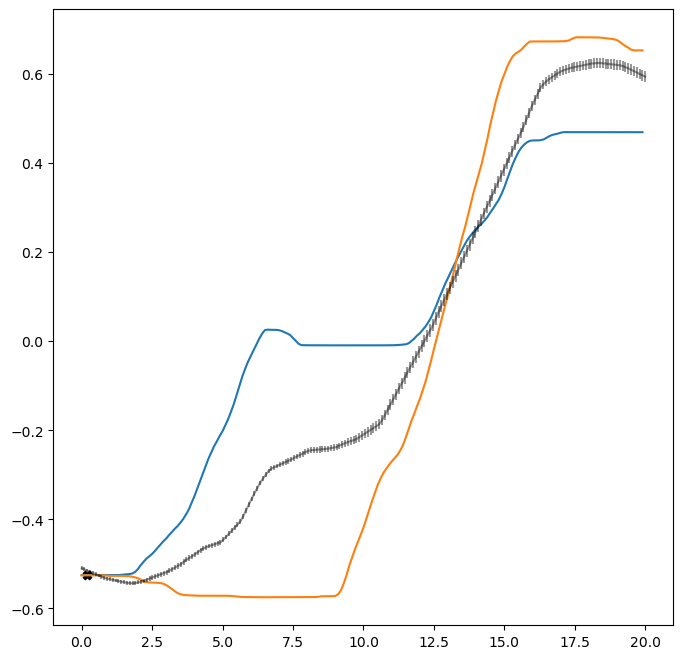

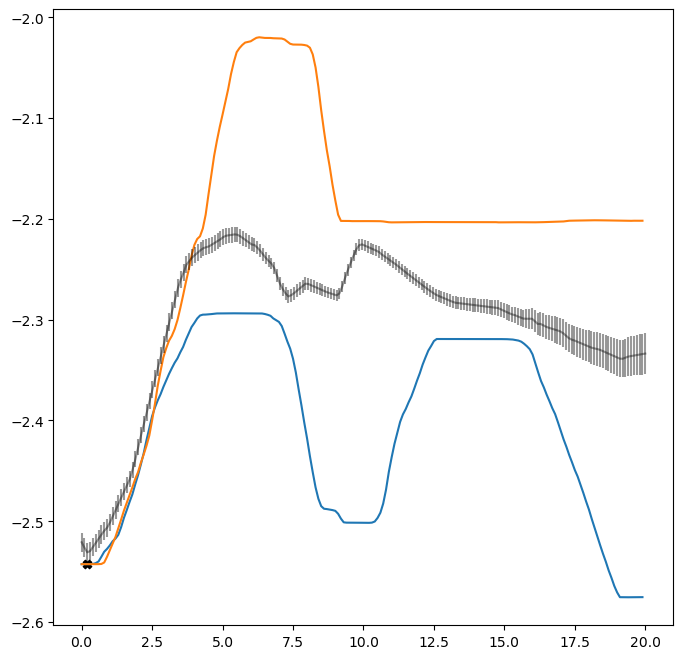

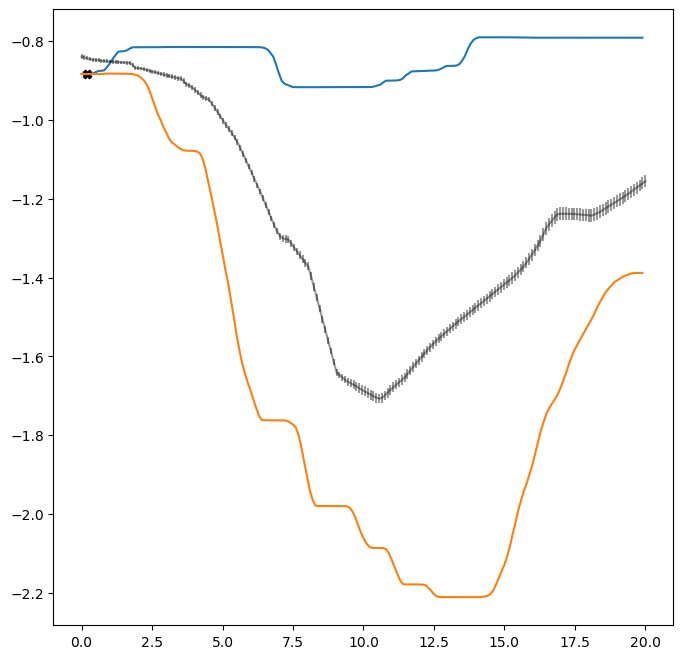

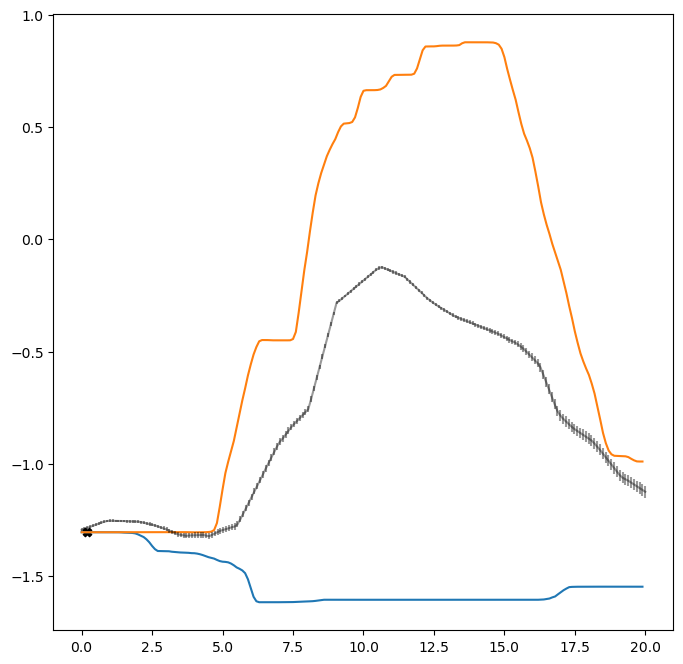

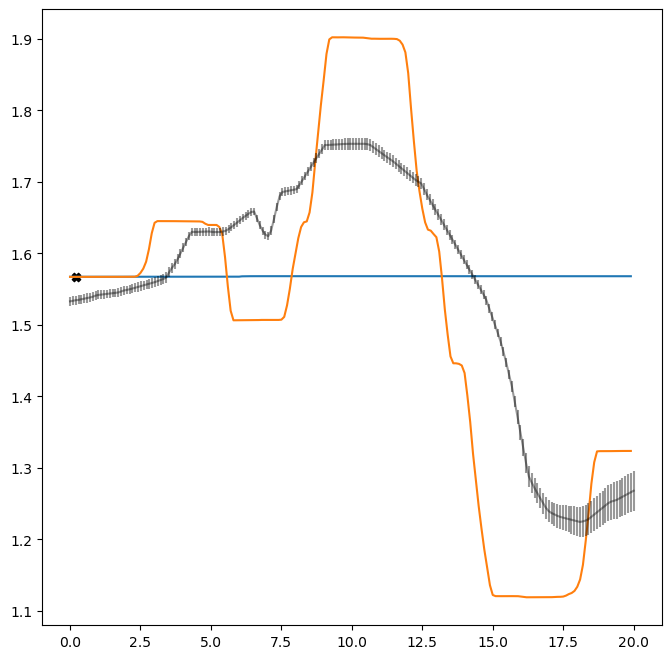

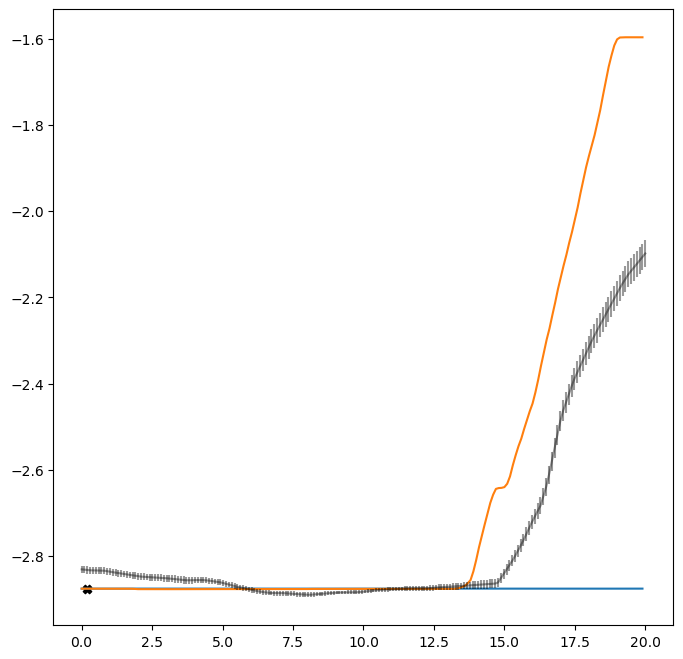

(200, 6)

Current TP, and predicitons below for all output dimensions
1.5454545454545454


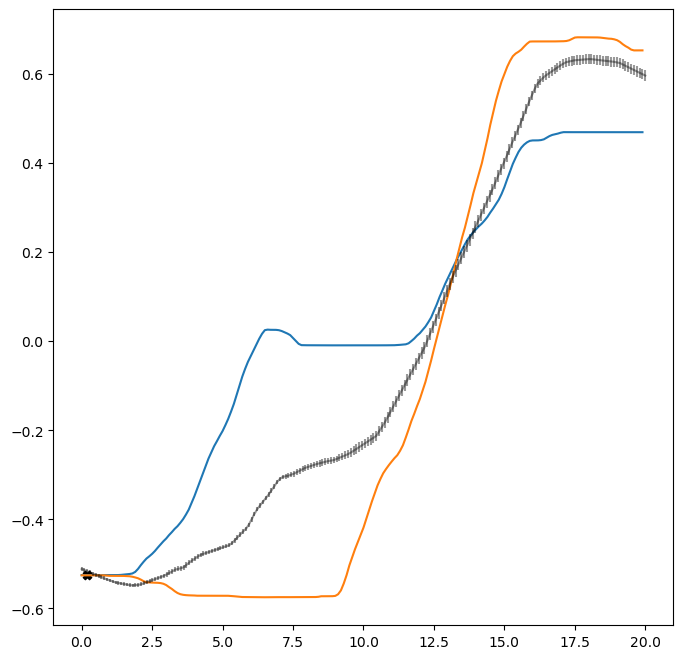

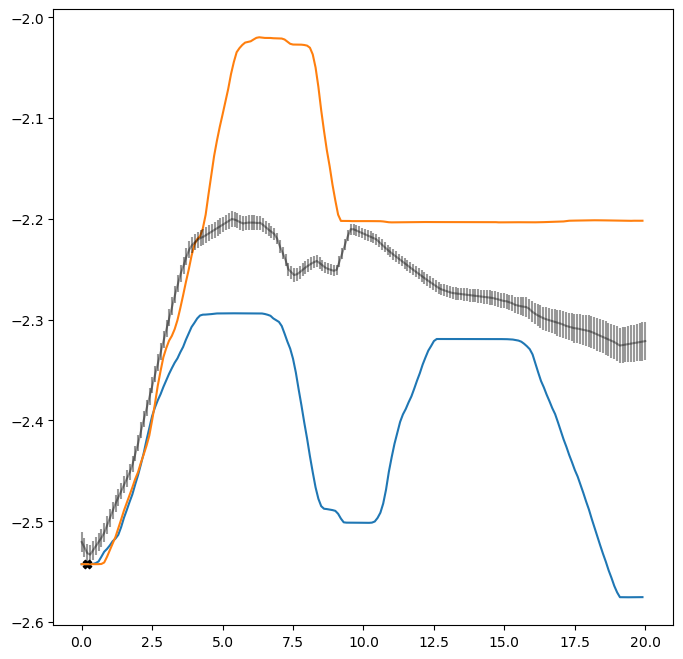

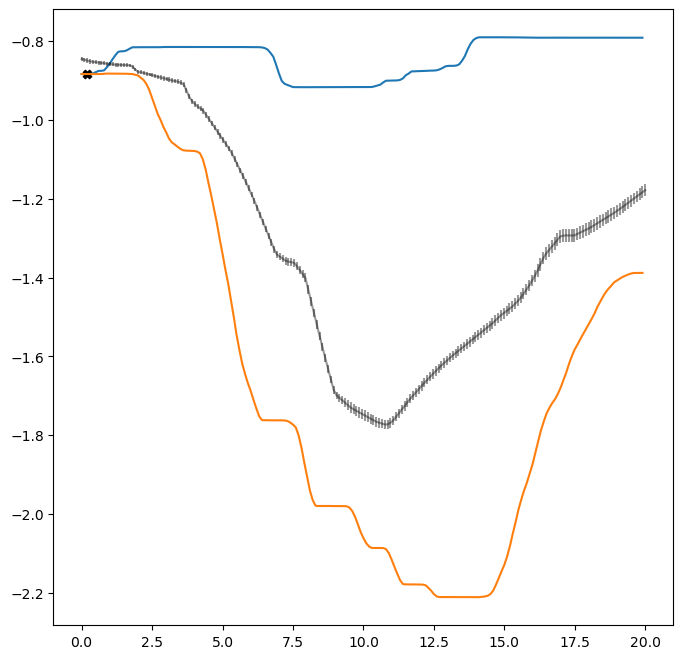

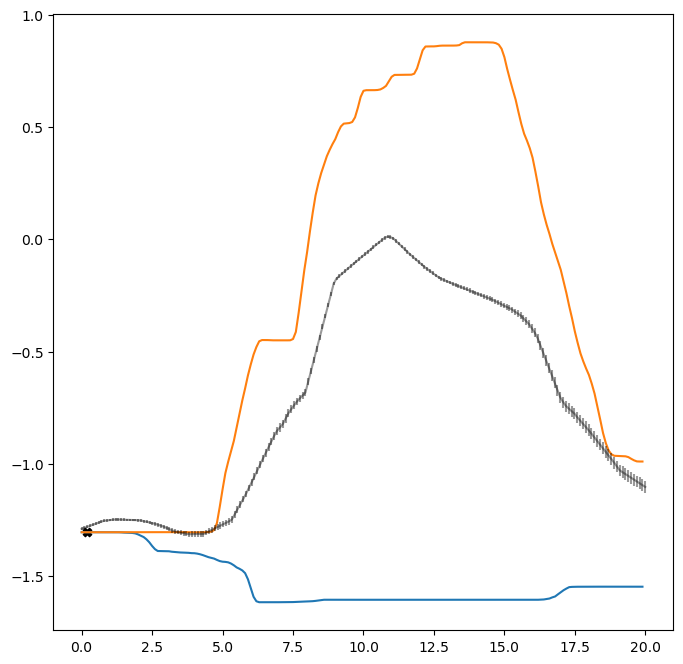

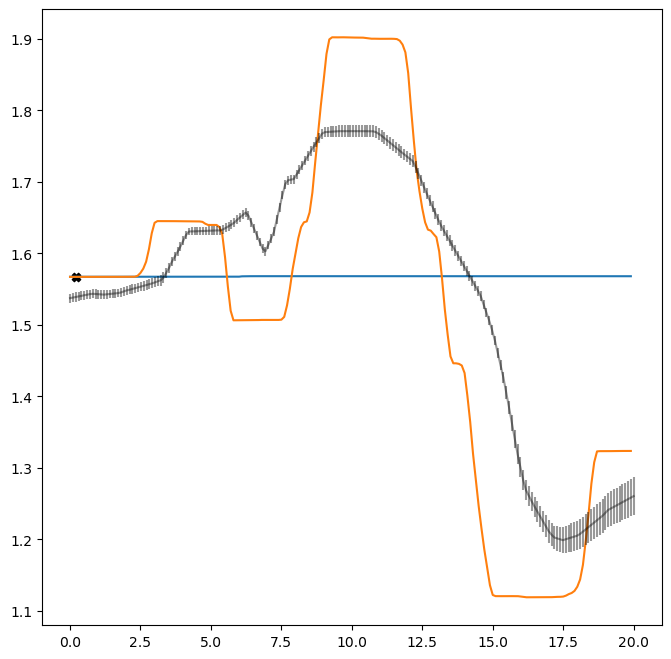

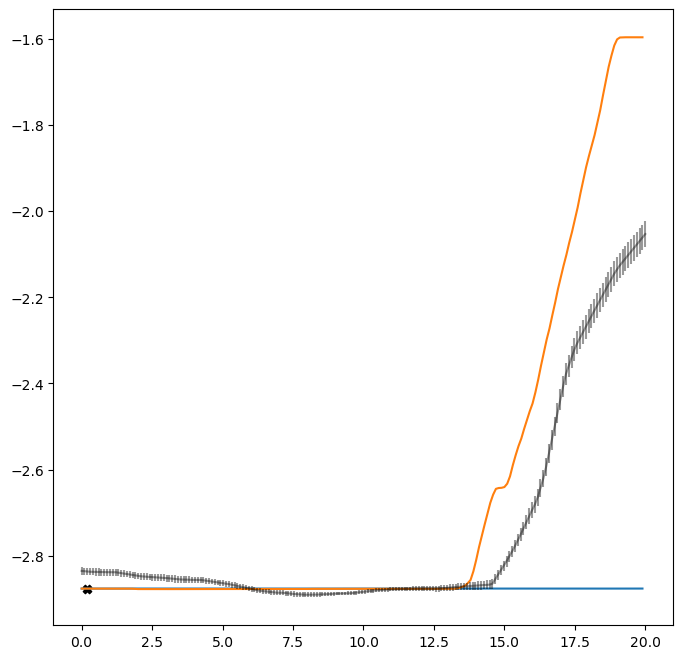

(200, 6)

Current TP, and predicitons below for all output dimensions
1.5757575757575757


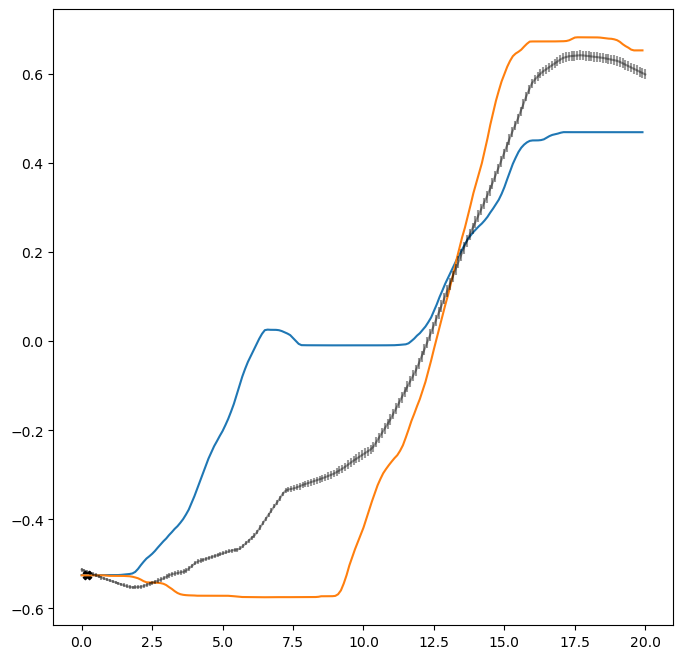

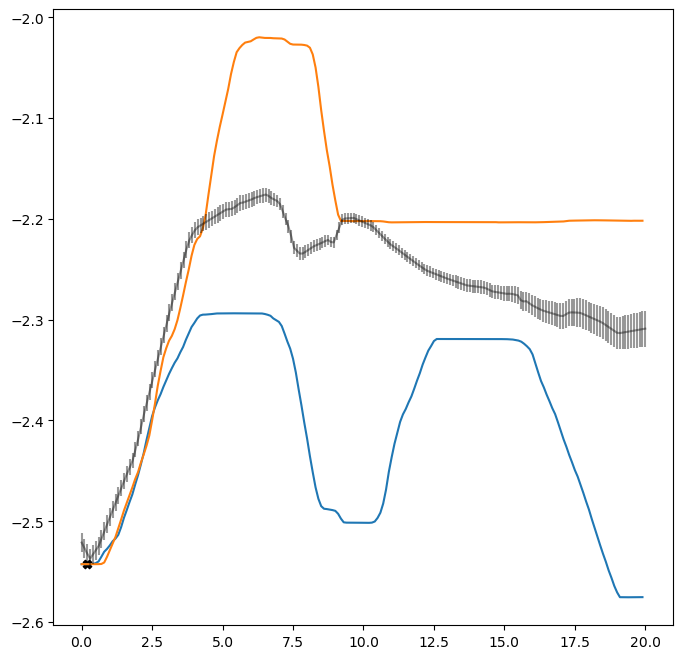

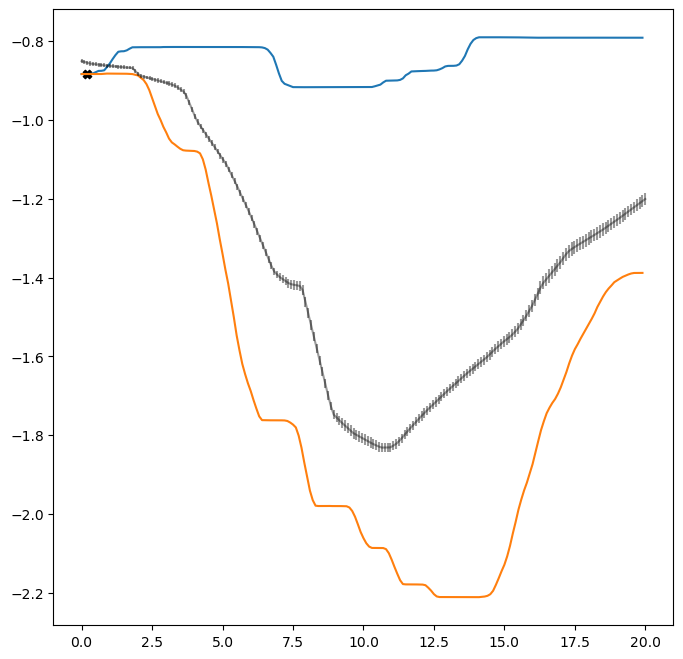

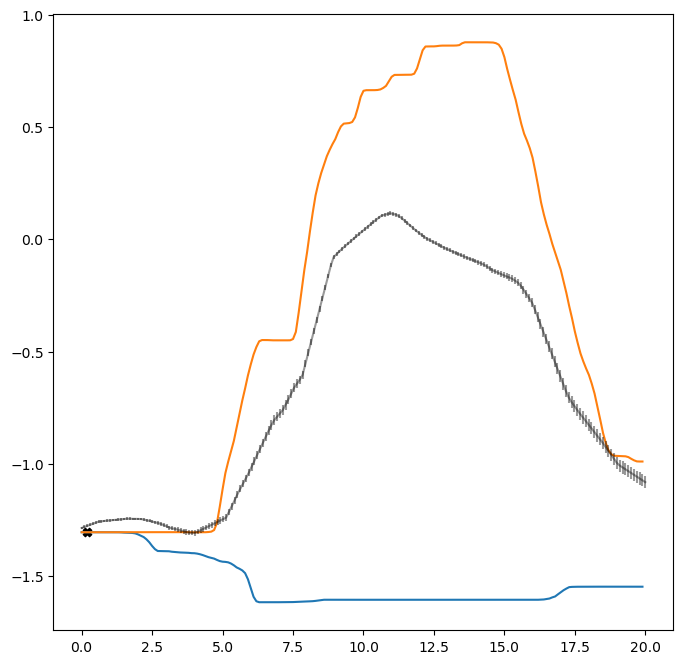

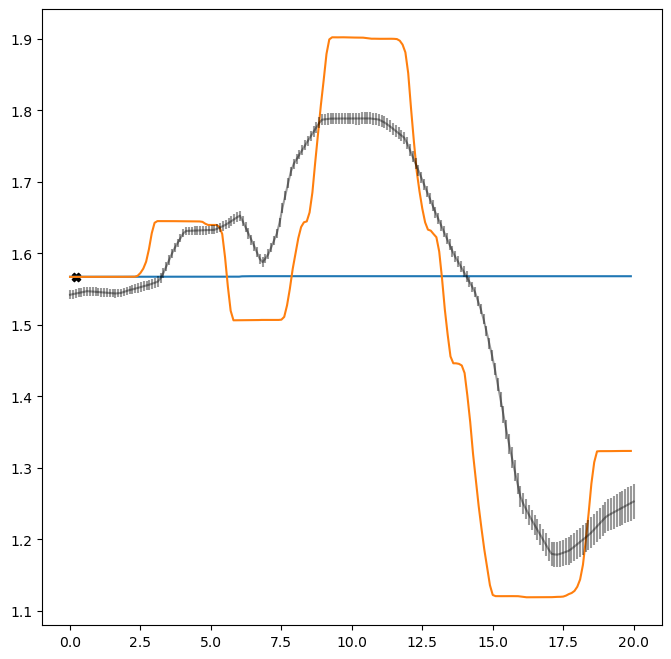

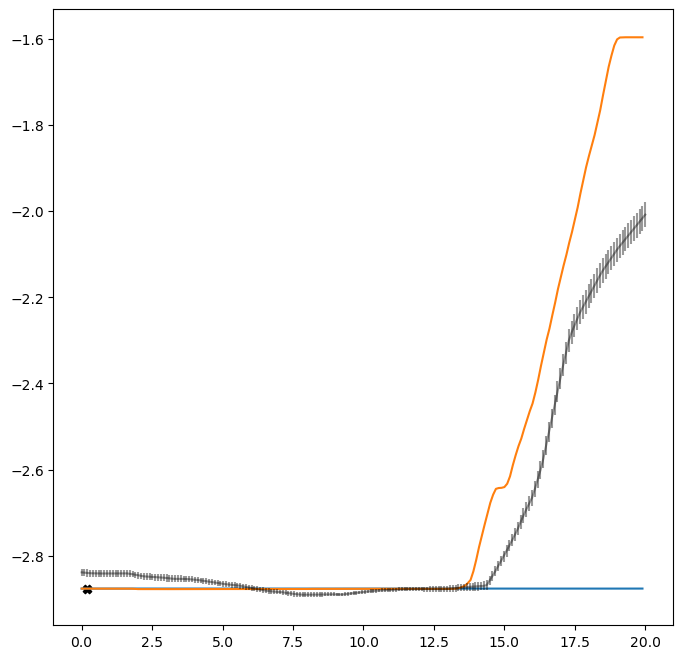

(200, 6)

Current TP, and predicitons below for all output dimensions
1.606060606060606


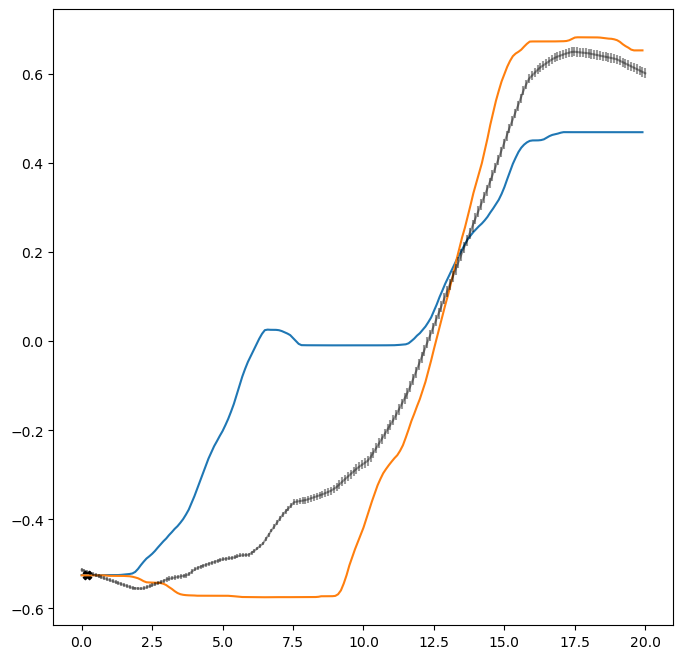

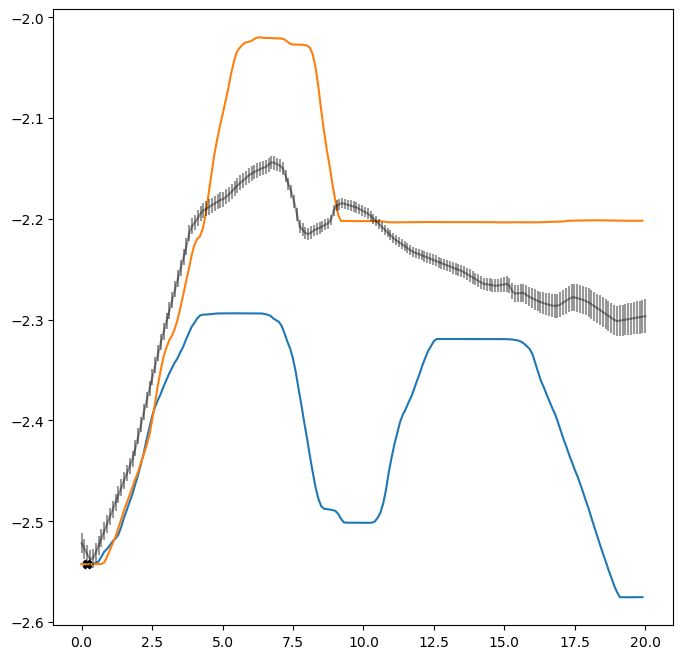

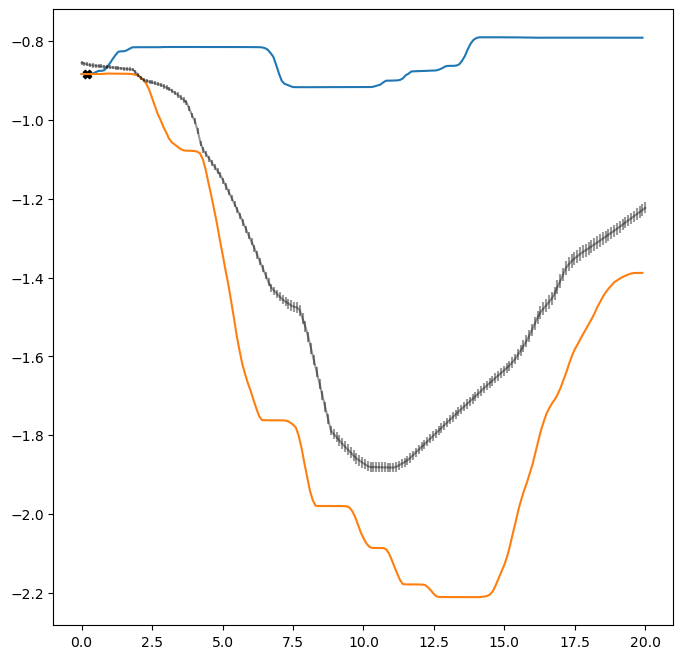

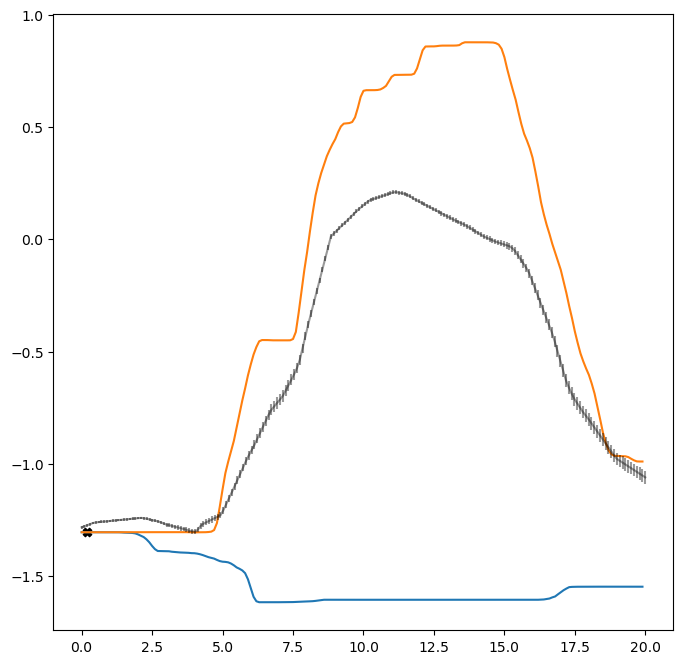

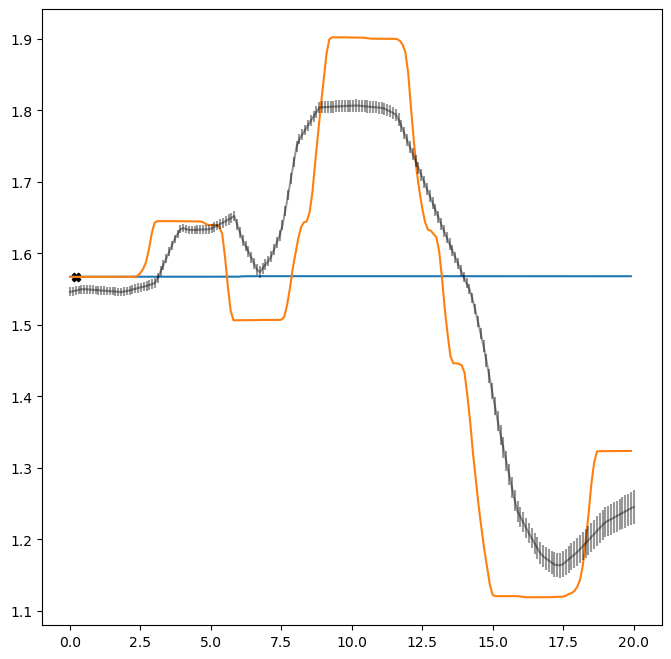

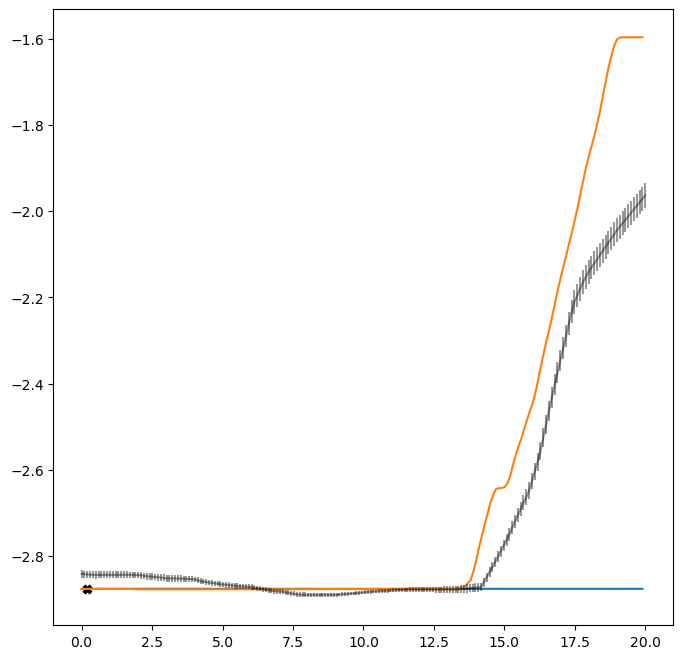

(200, 6)

Current TP, and predicitons below for all output dimensions
1.6363636363636362


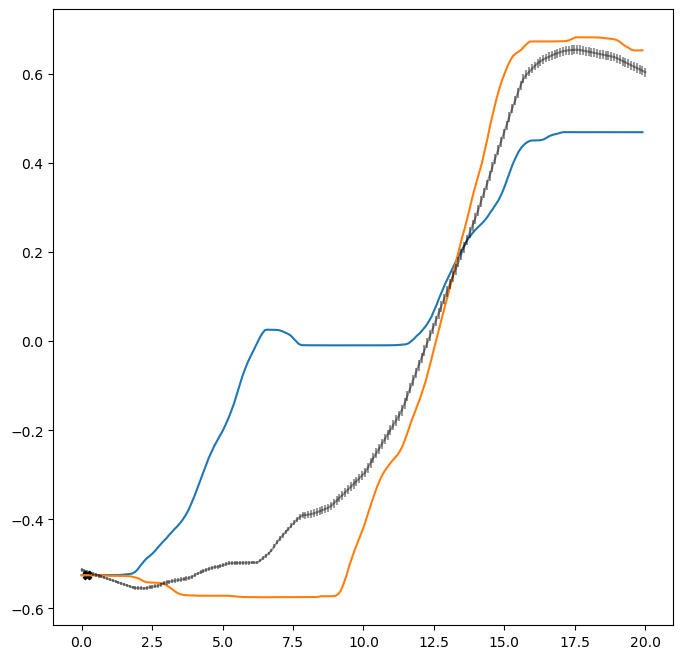

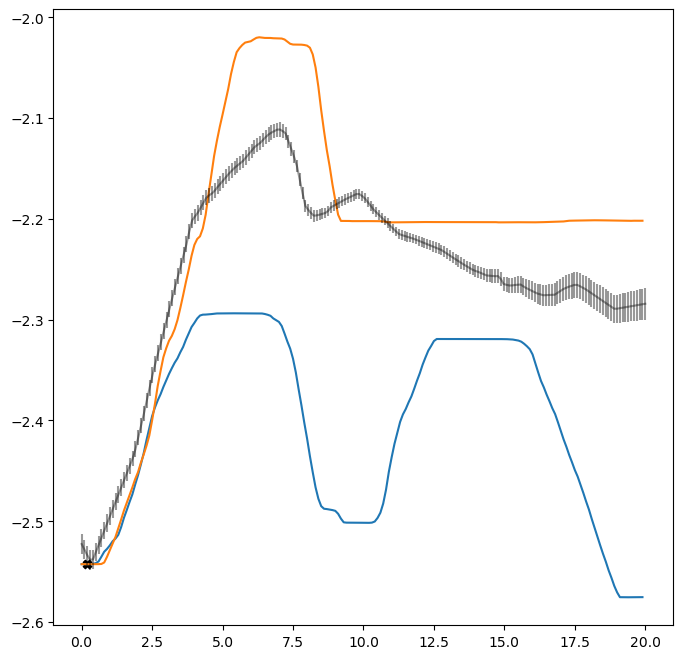

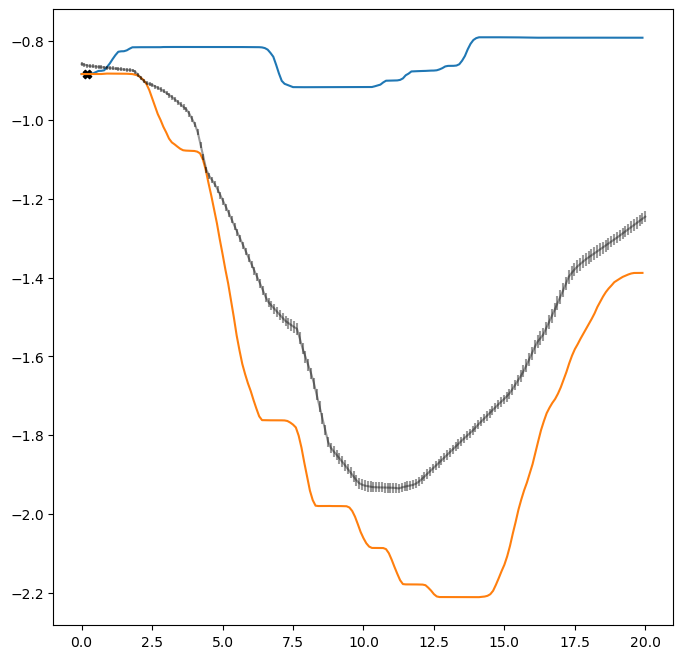

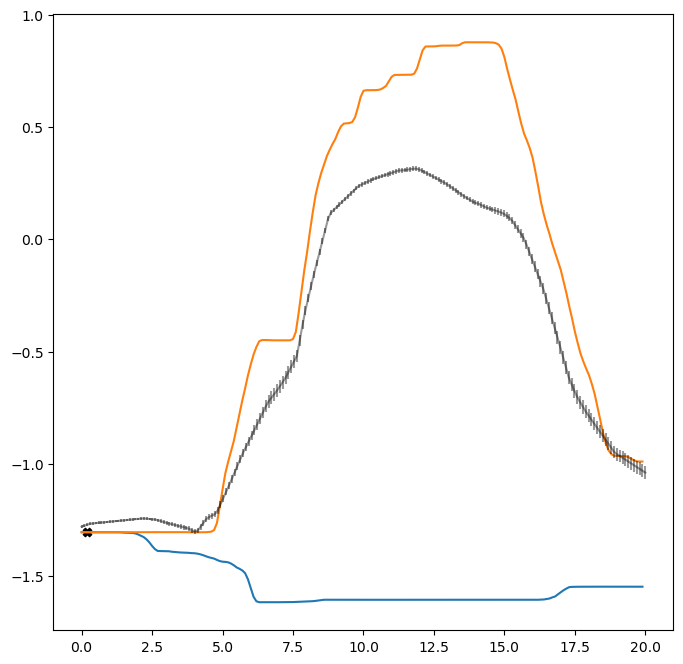

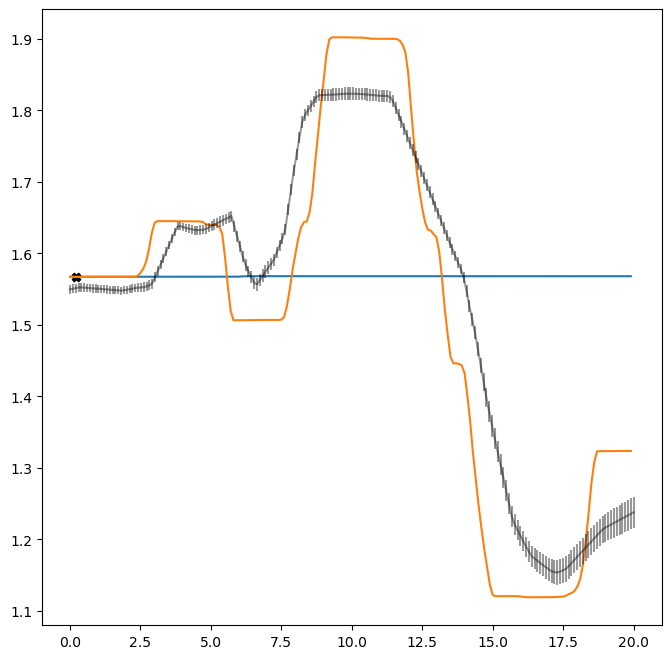

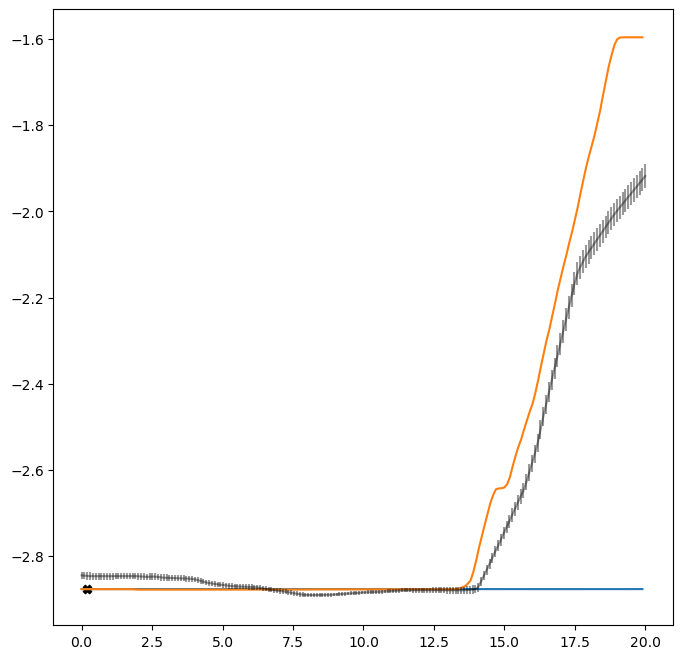

(200, 6)

Current TP, and predicitons below for all output dimensions
1.6666666666666667


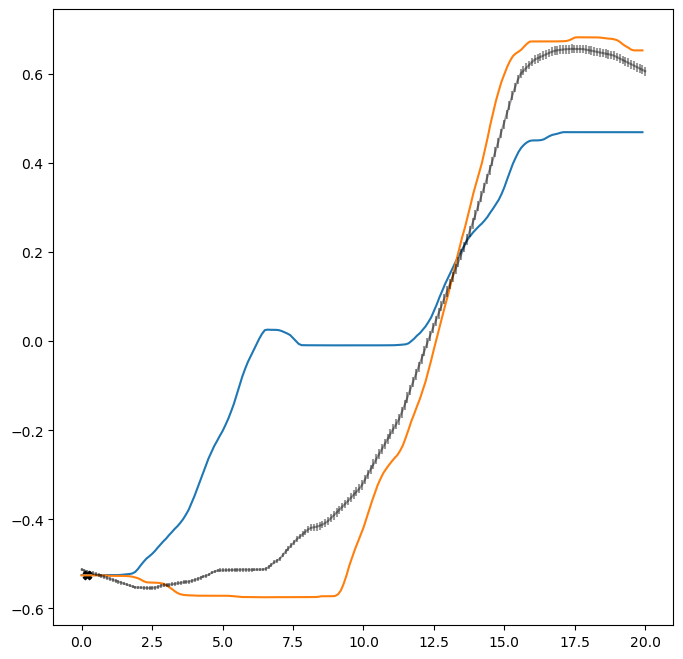

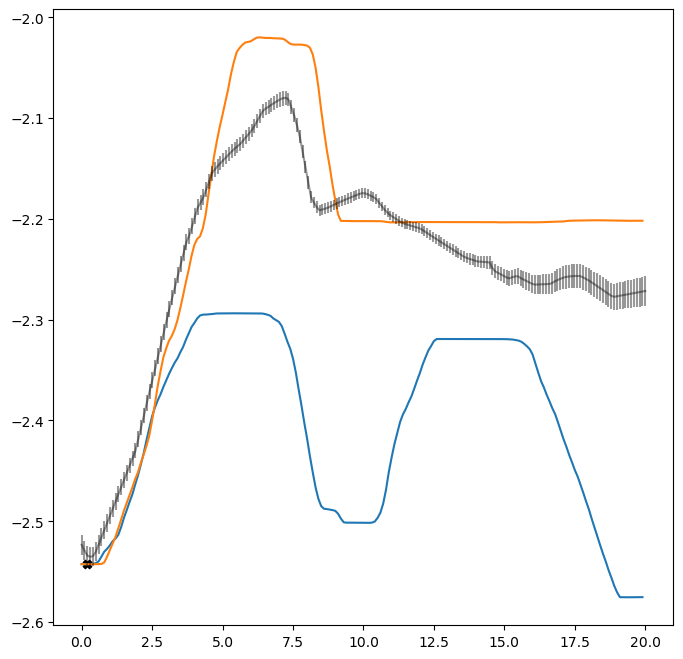

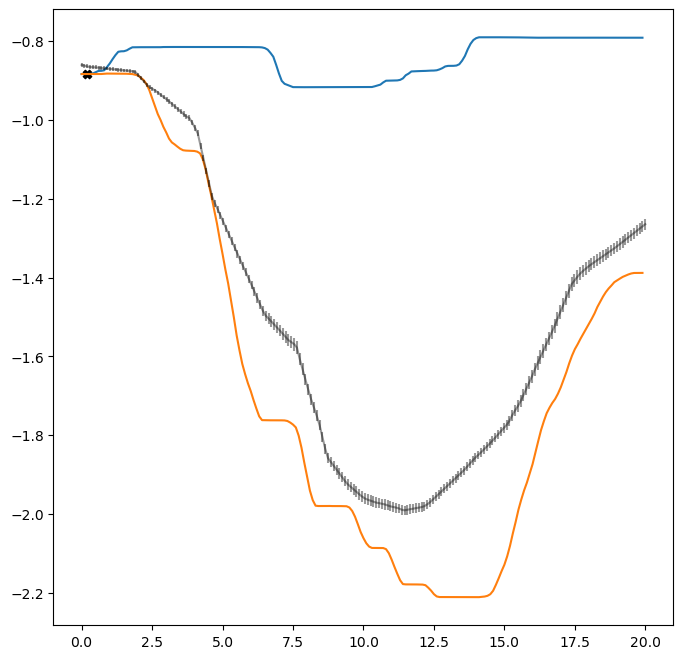

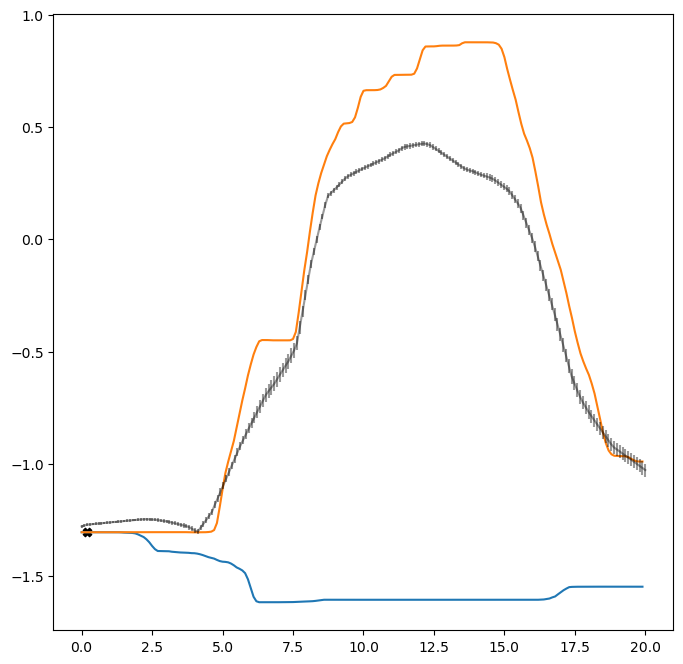

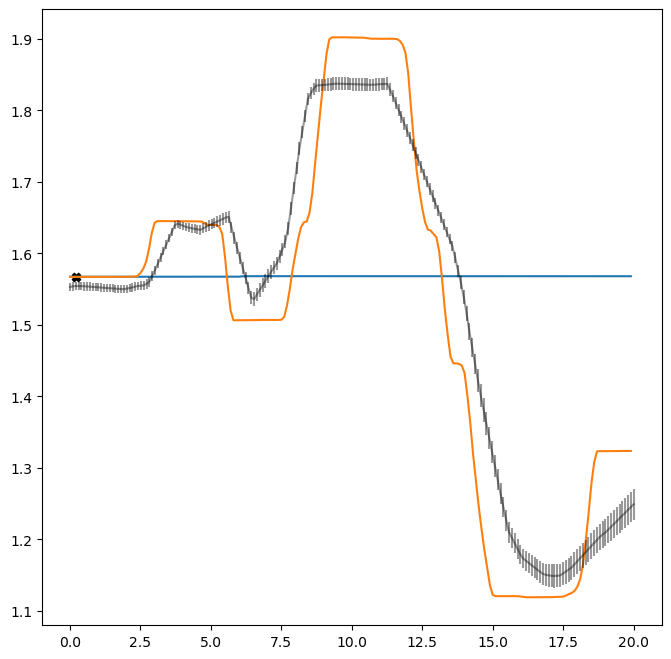

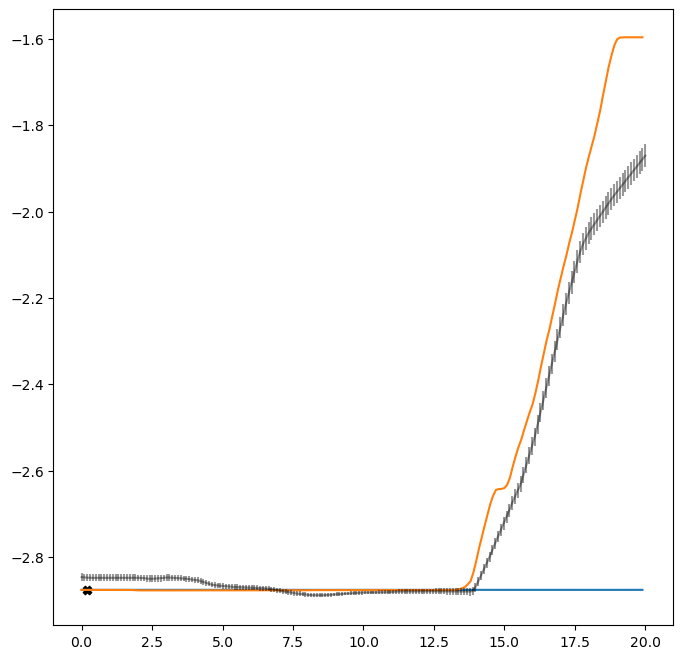

(200, 6)

Current TP, and predicitons below for all output dimensions
1.696969696969697


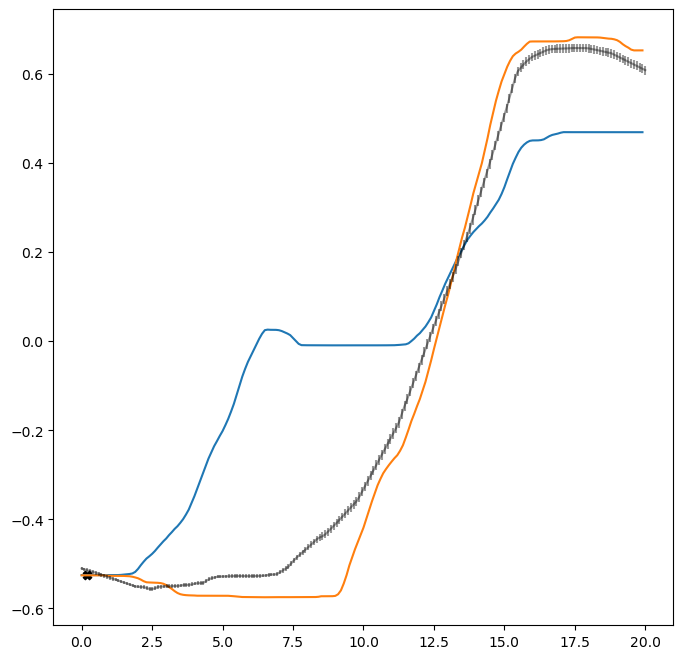

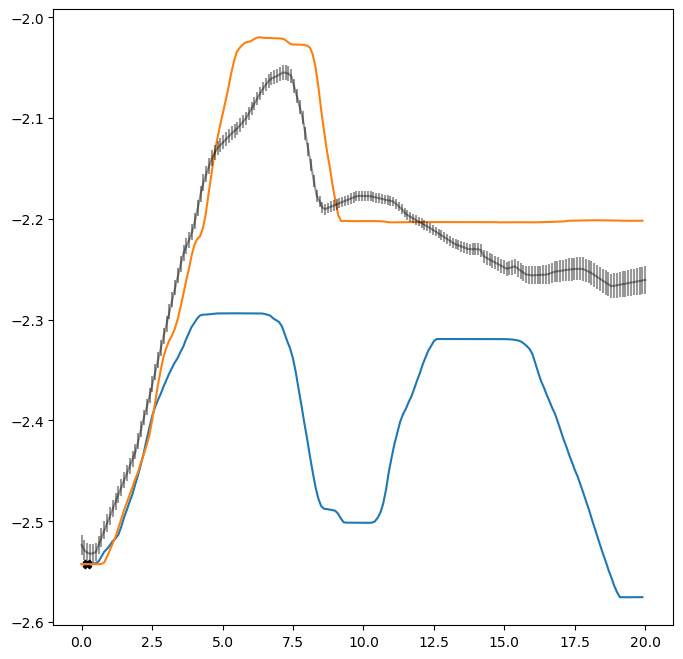

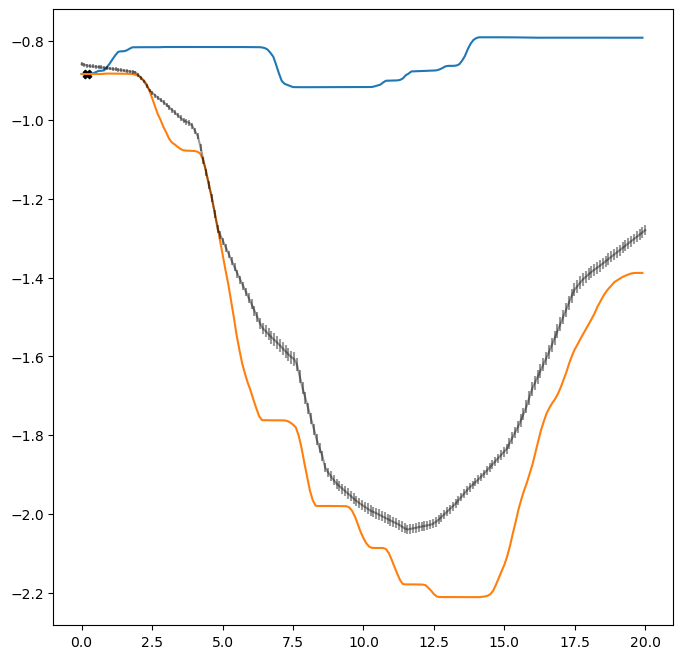

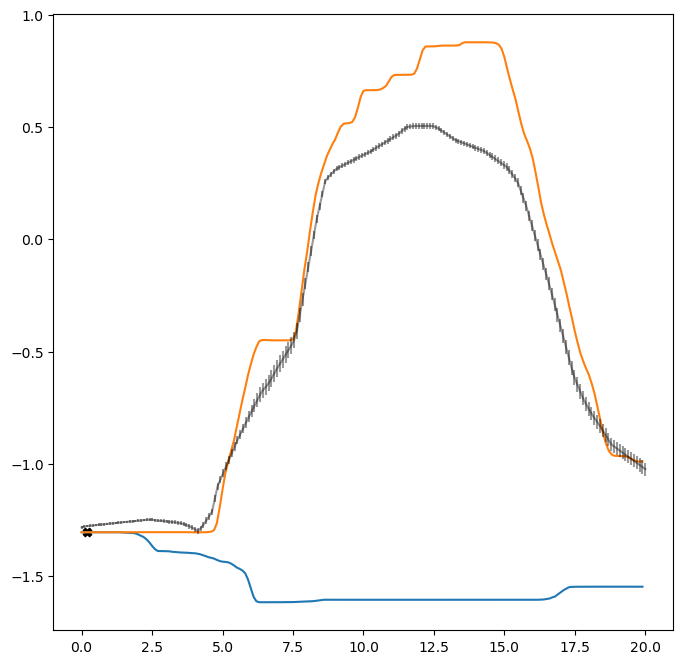

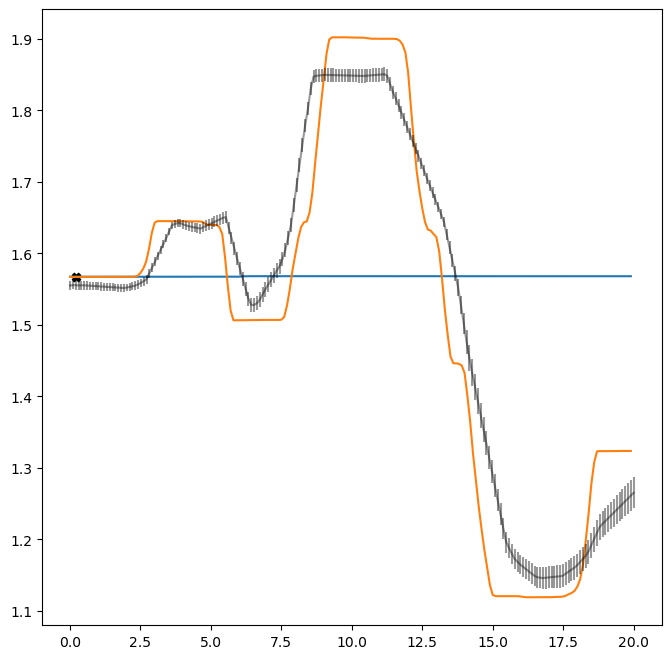

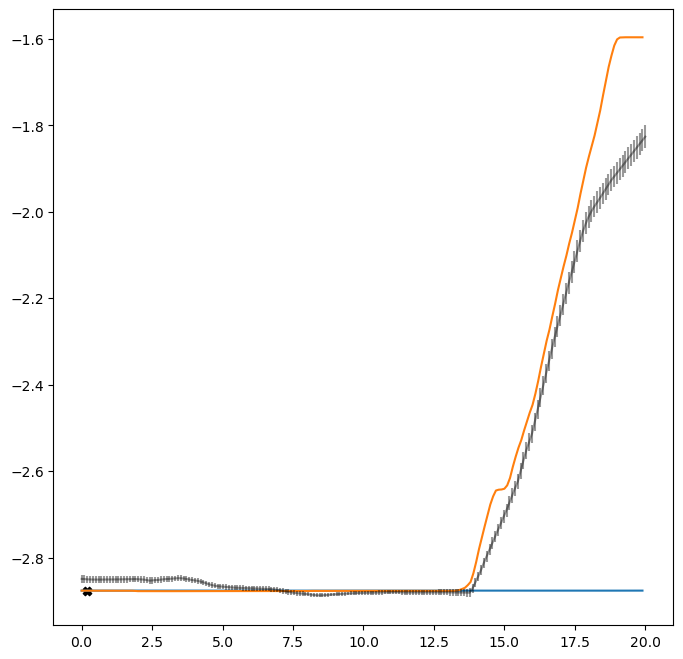

(200, 6)

Current TP, and predicitons below for all output dimensions
1.7272727272727273


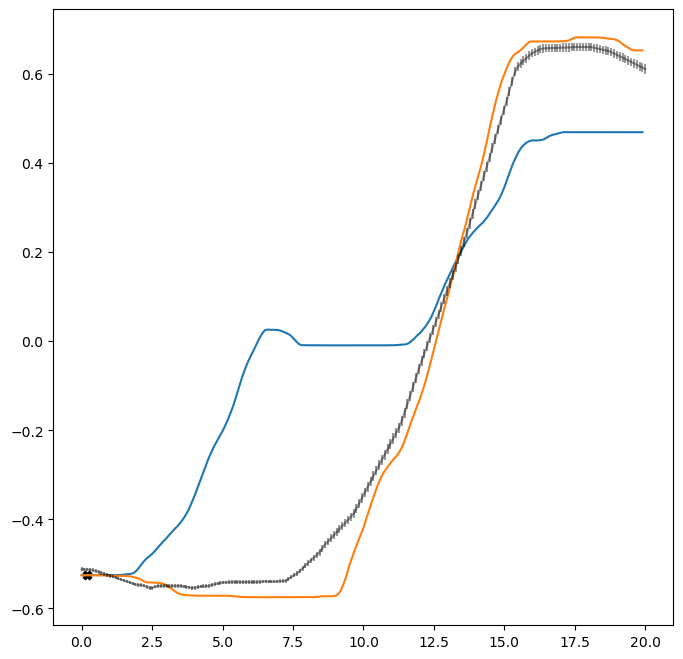

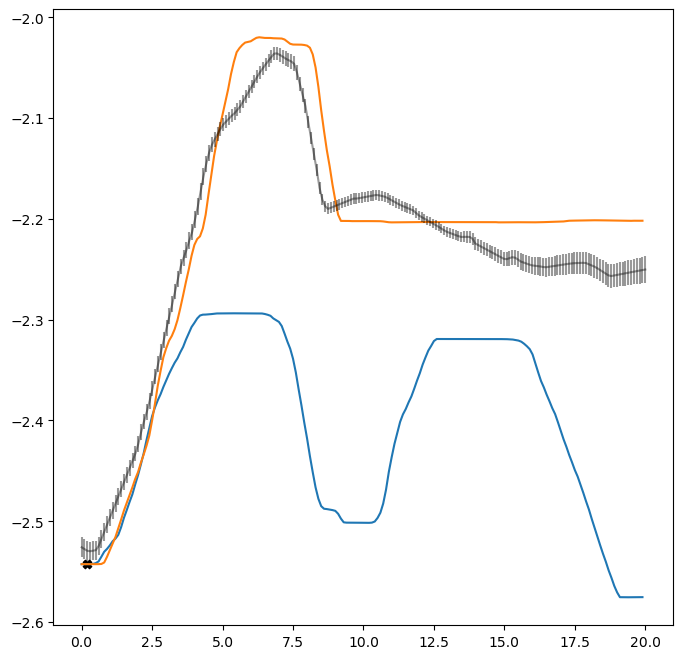

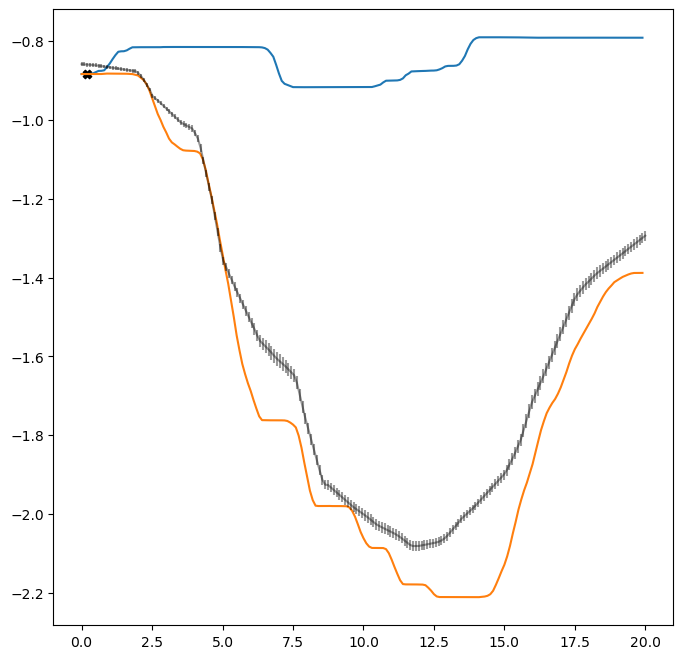

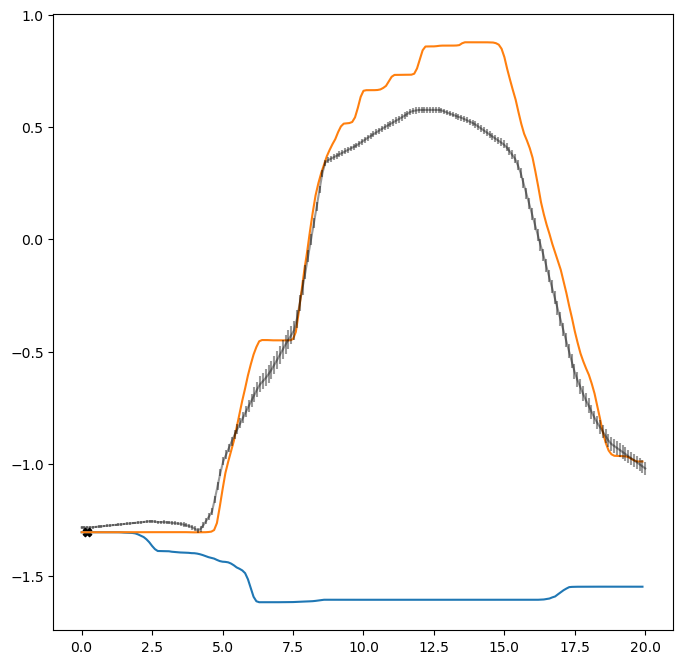

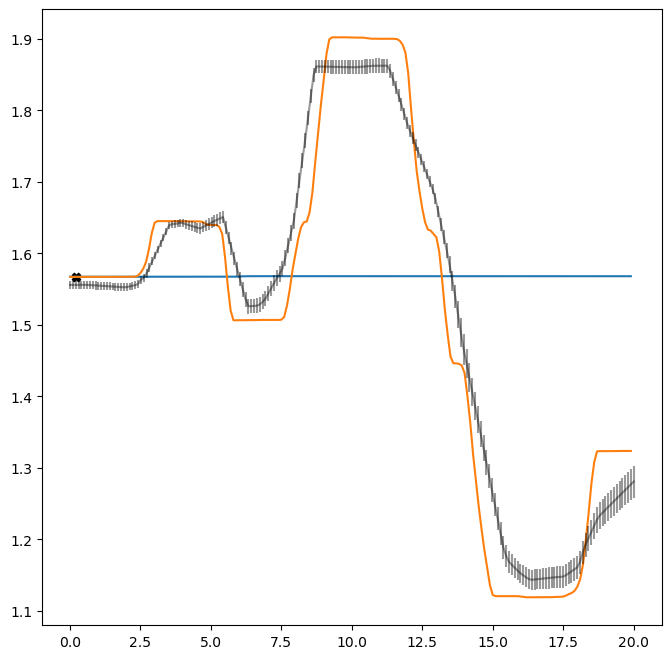

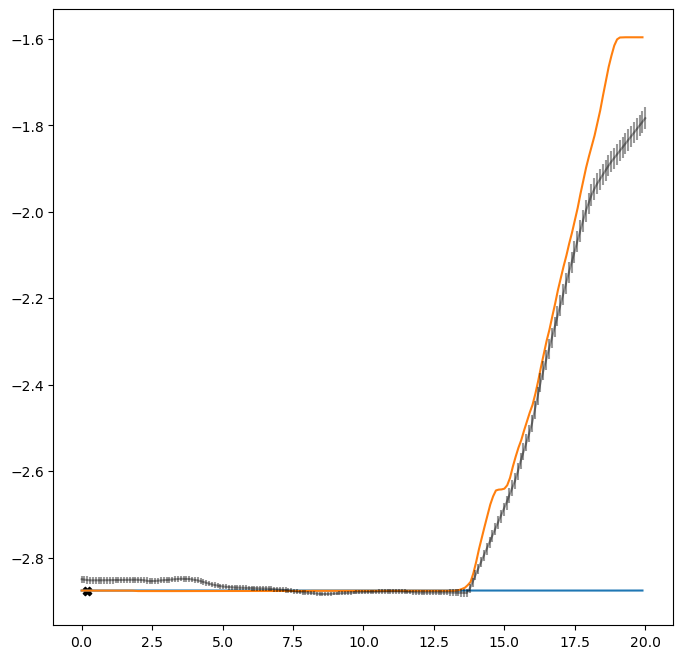

(200, 6)

Current TP, and predicitons below for all output dimensions
1.7575757575757576


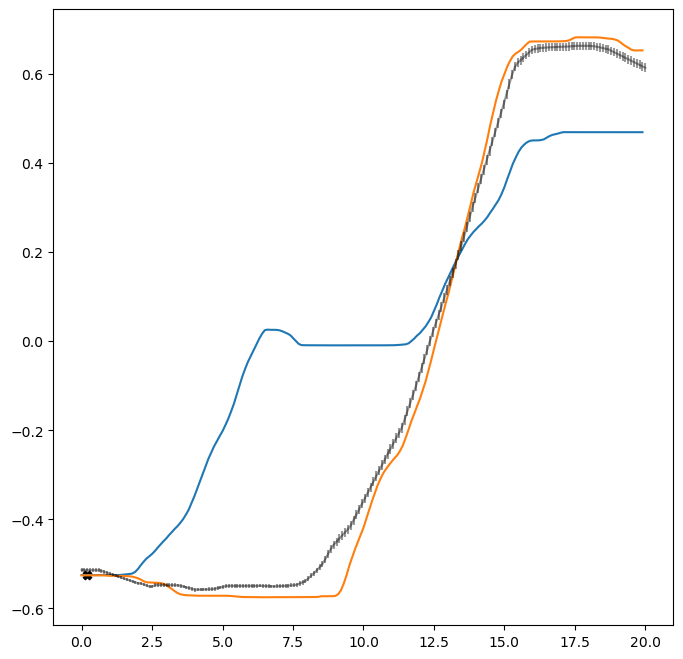

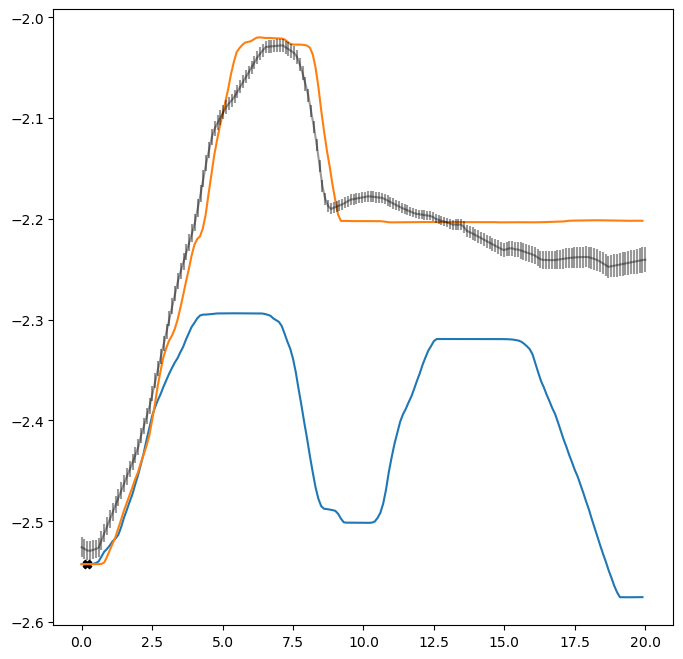

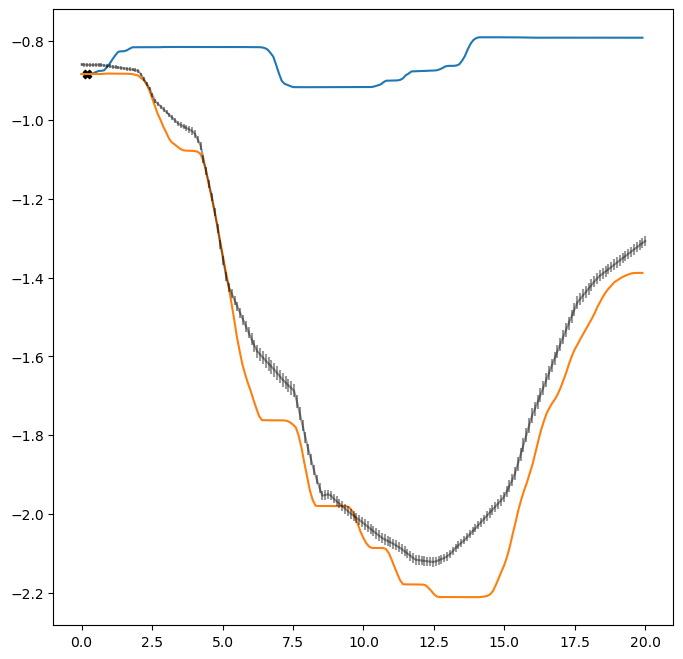

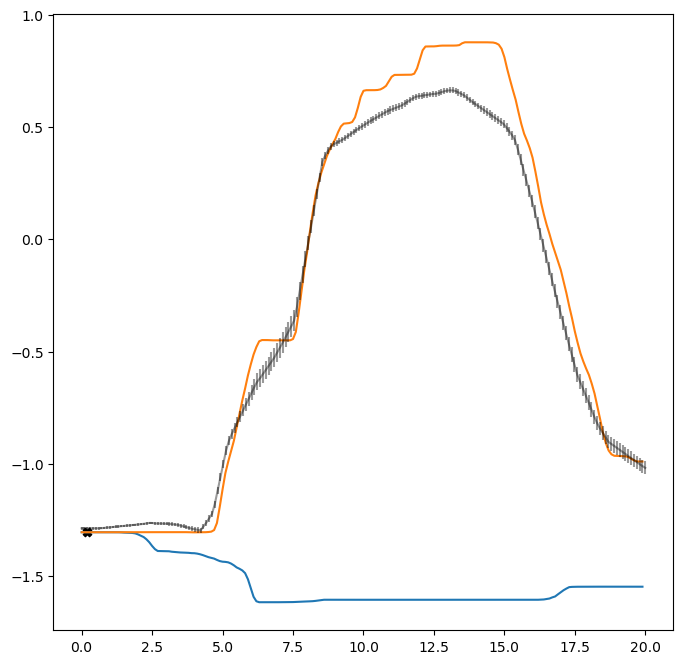

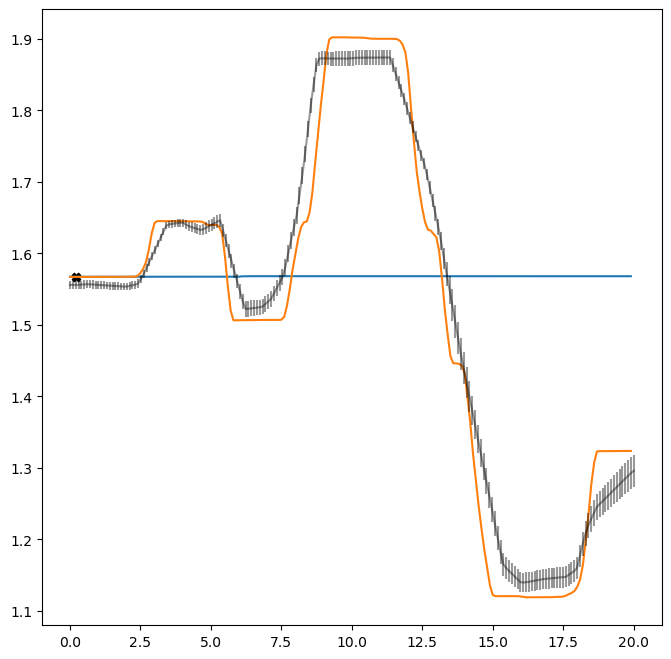

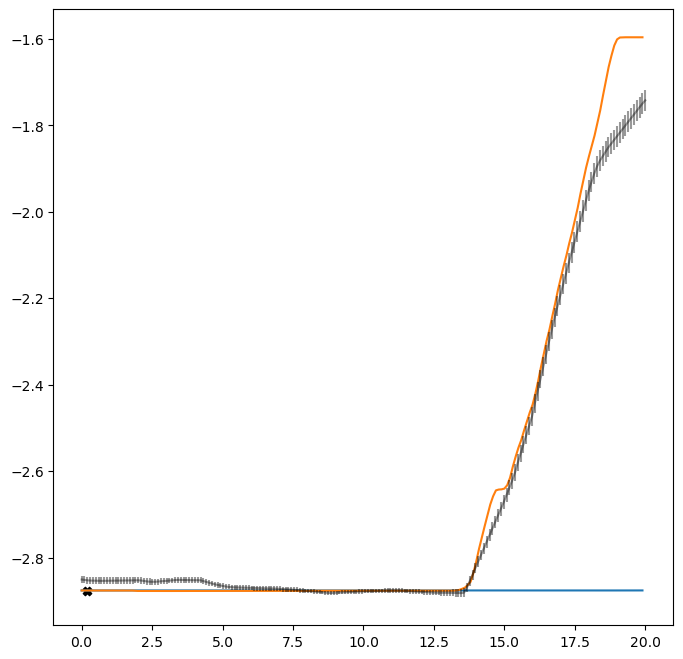

(200, 6)

Current TP, and predicitons below for all output dimensions
1.7878787878787878


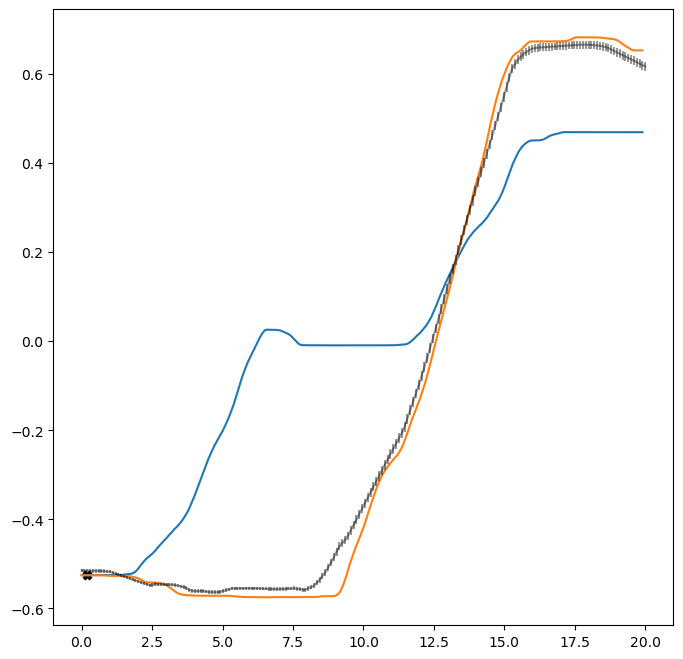

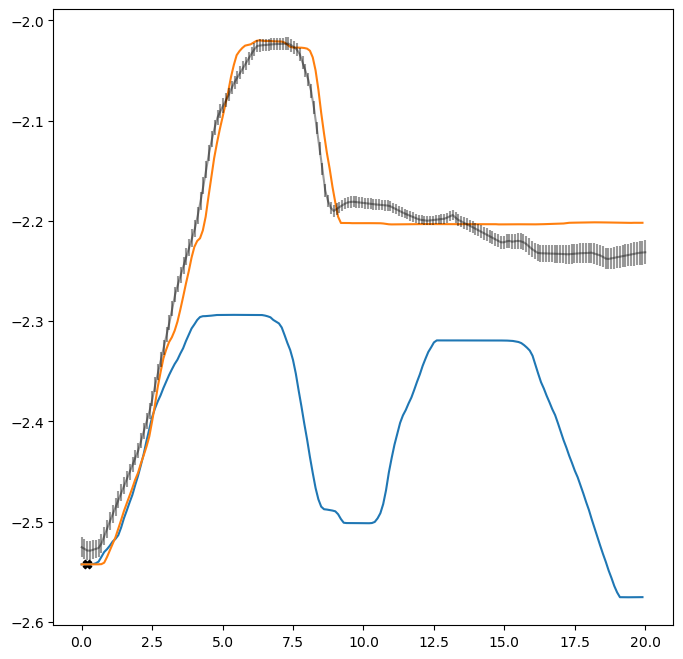

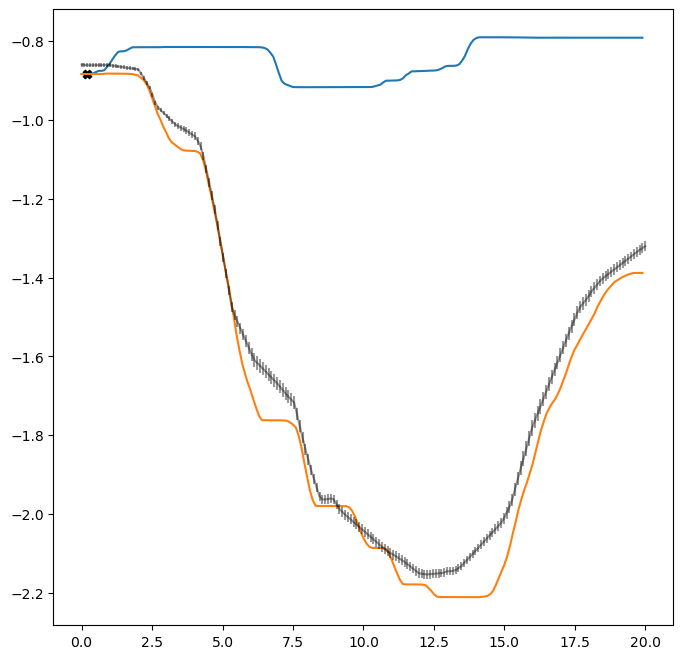

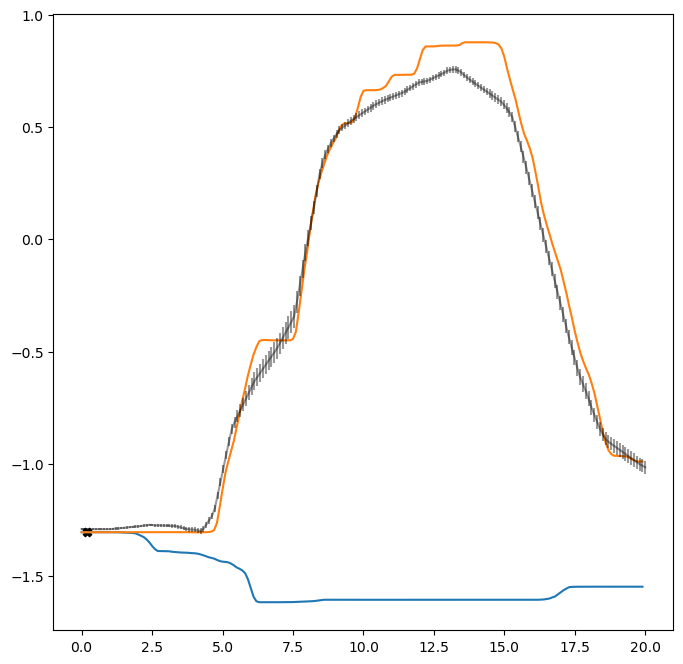

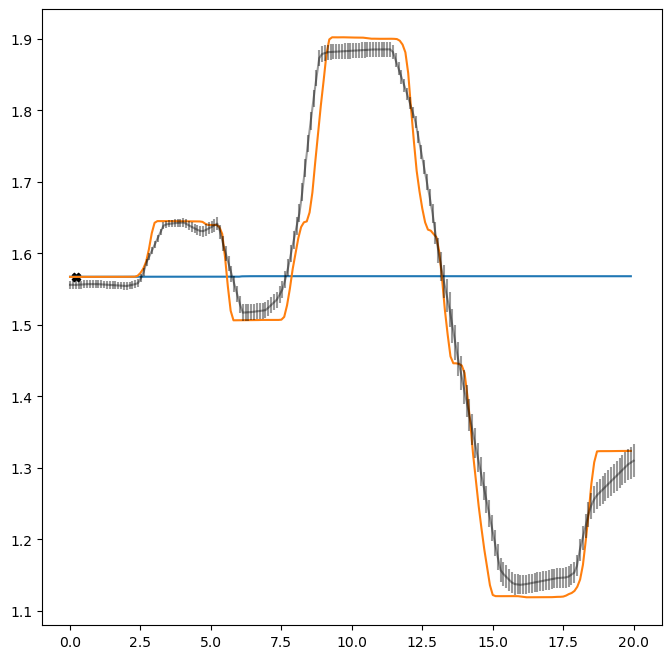

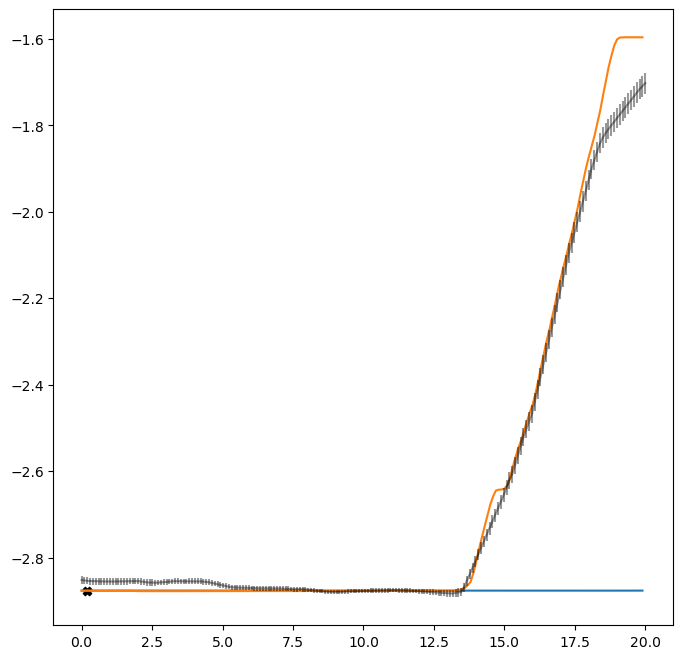

(200, 6)

Current TP, and predicitons below for all output dimensions
1.8181818181818183


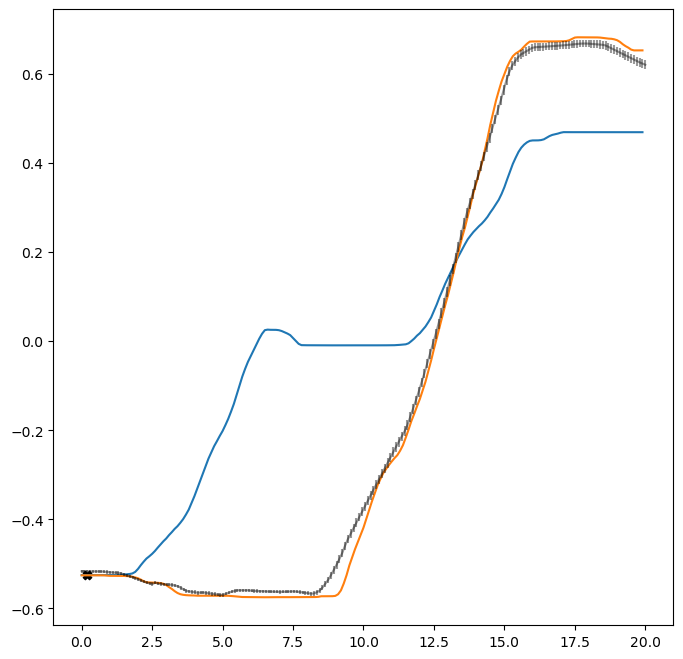

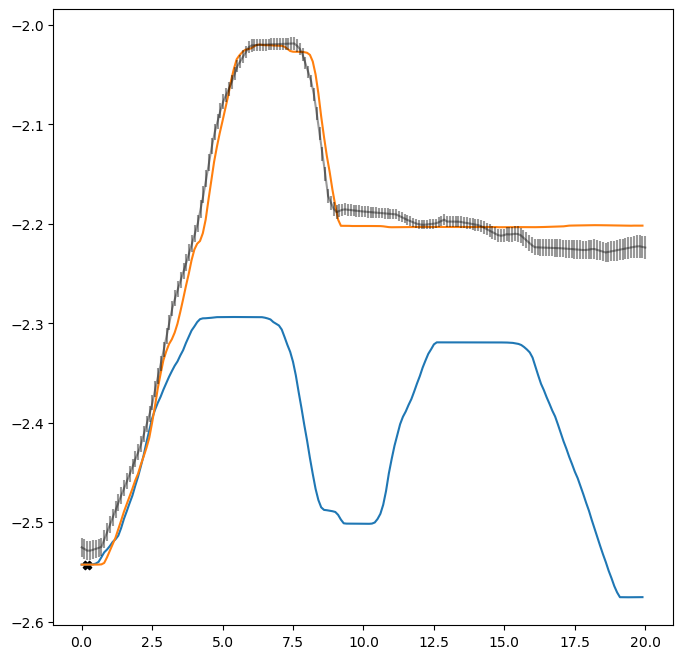

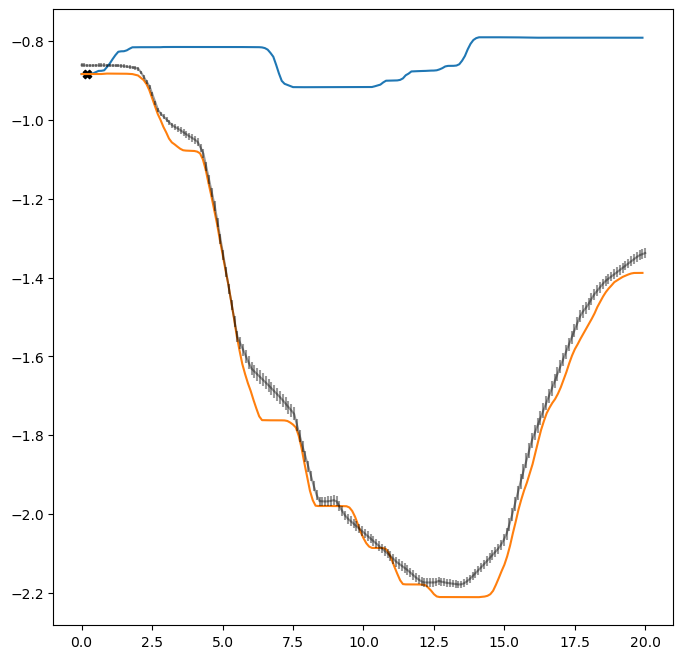

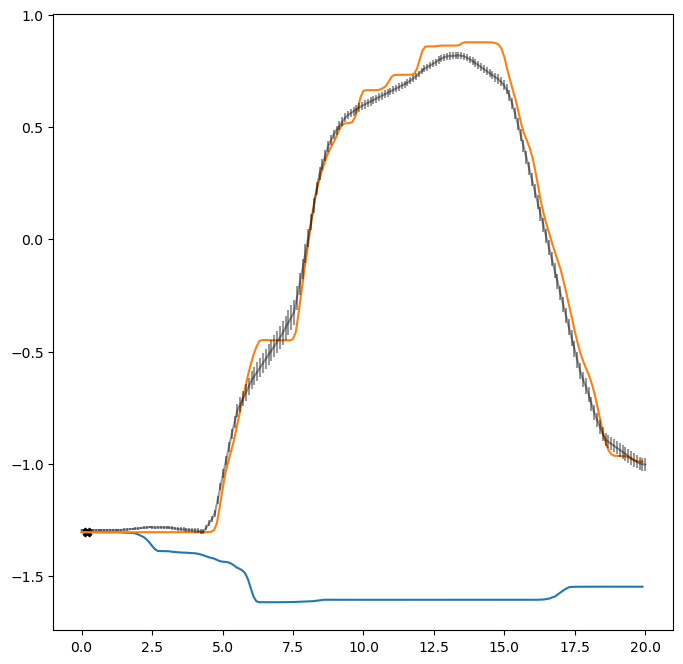

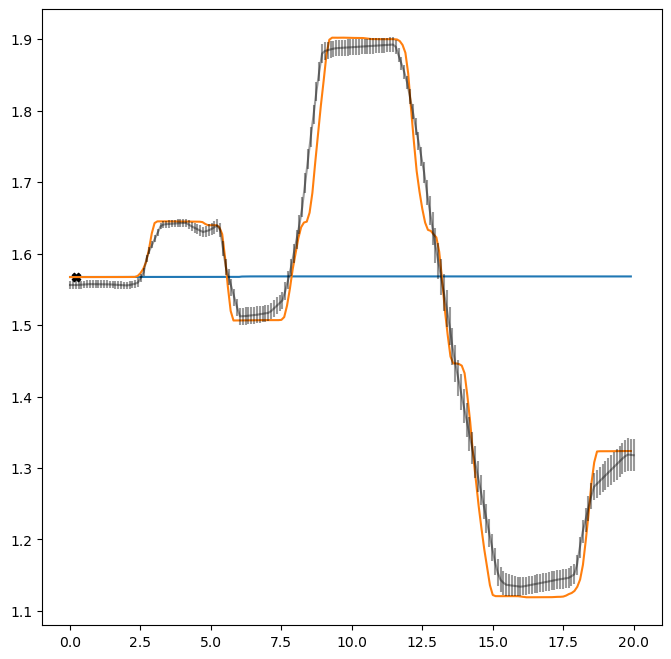

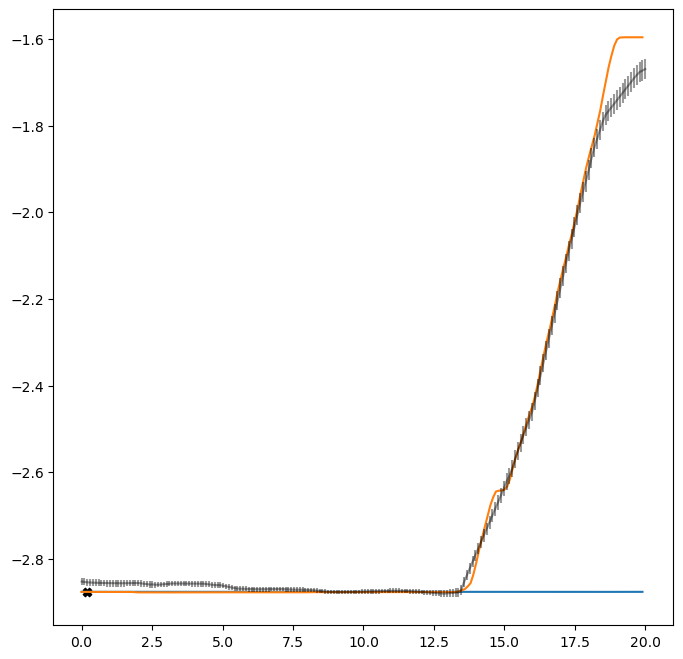

(200, 6)

Current TP, and predicitons below for all output dimensions
1.8484848484848486


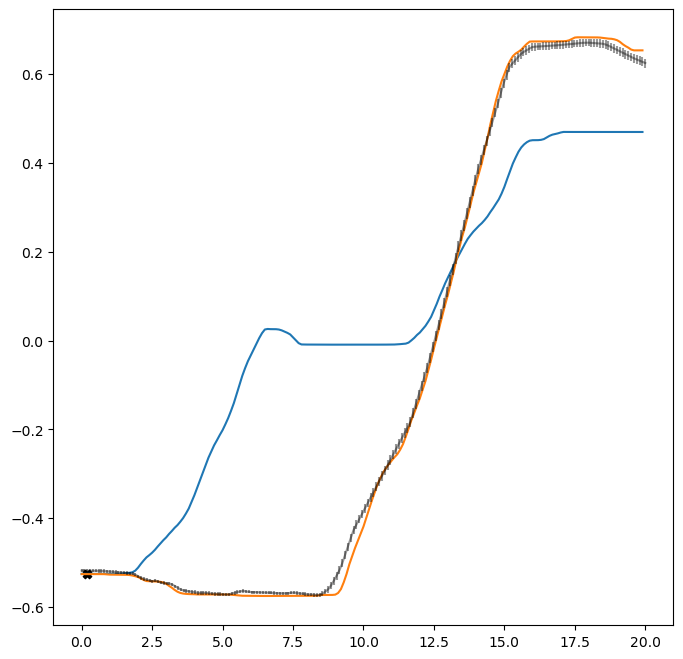

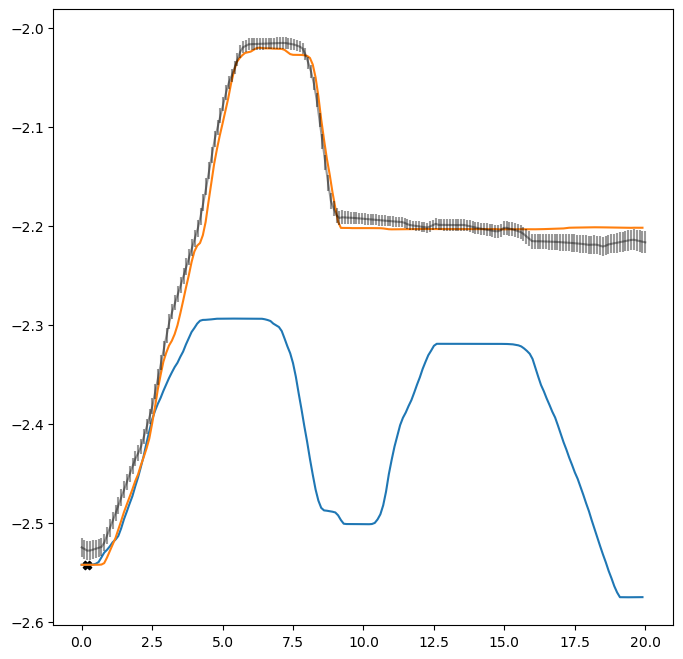

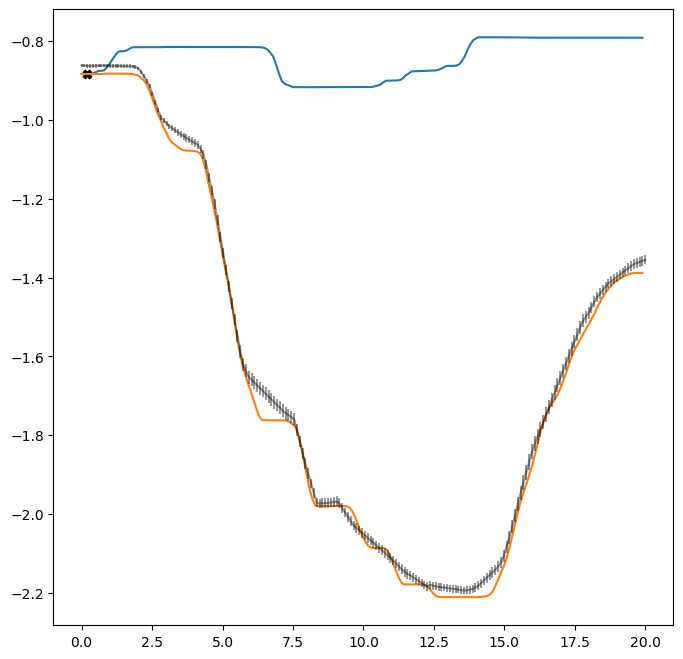

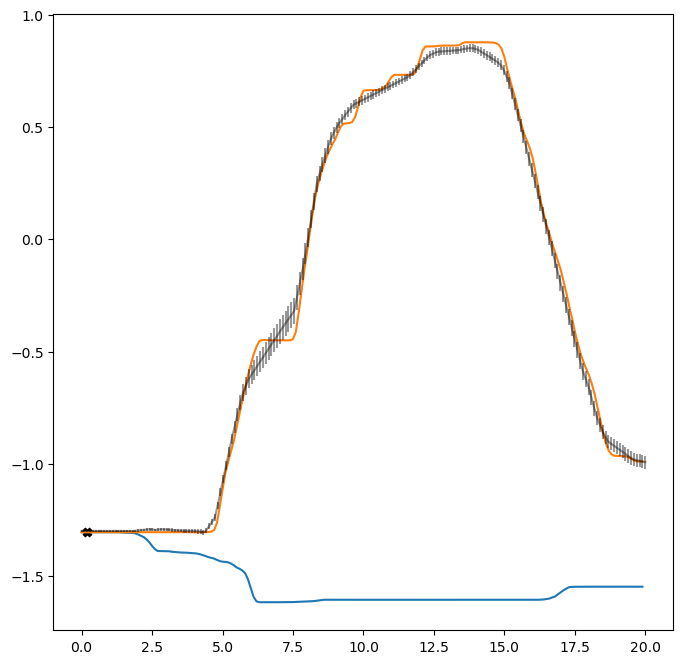

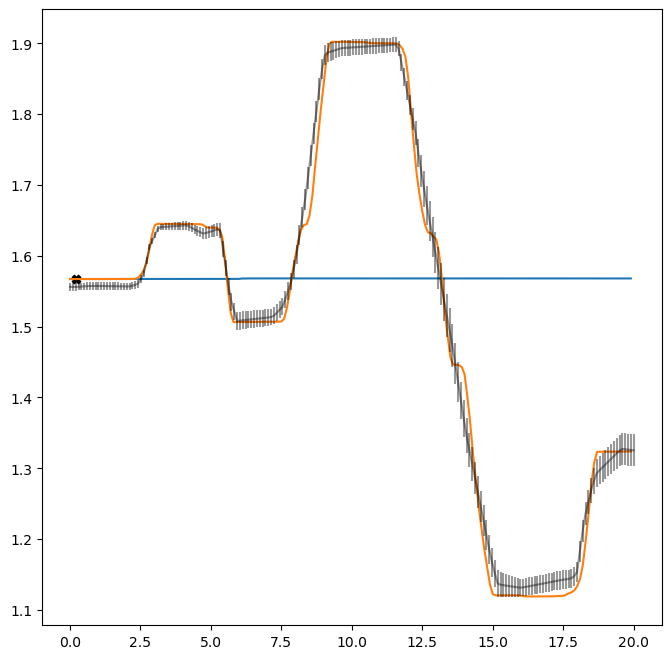

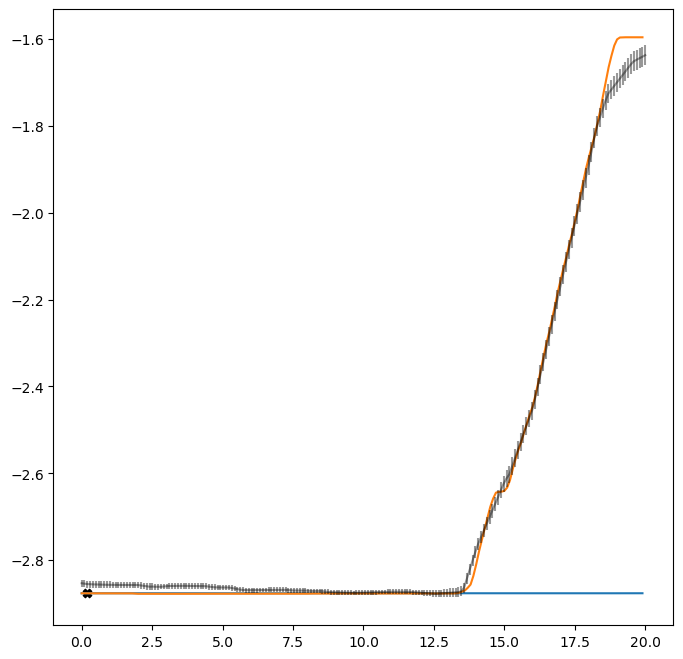

(200, 6)

Current TP, and predicitons below for all output dimensions
1.878787878787879


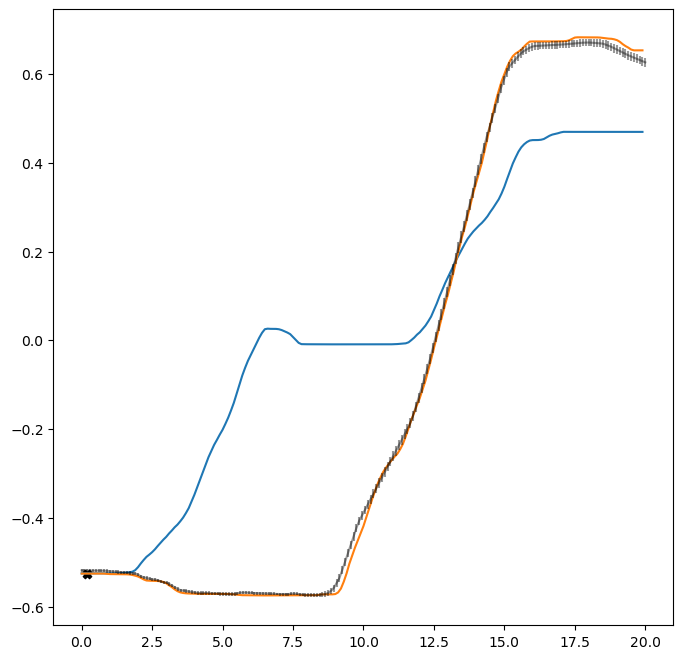

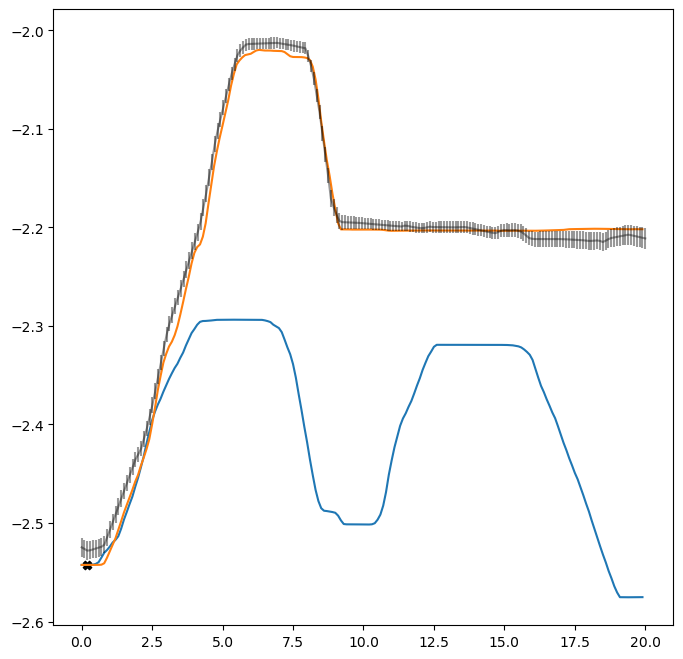

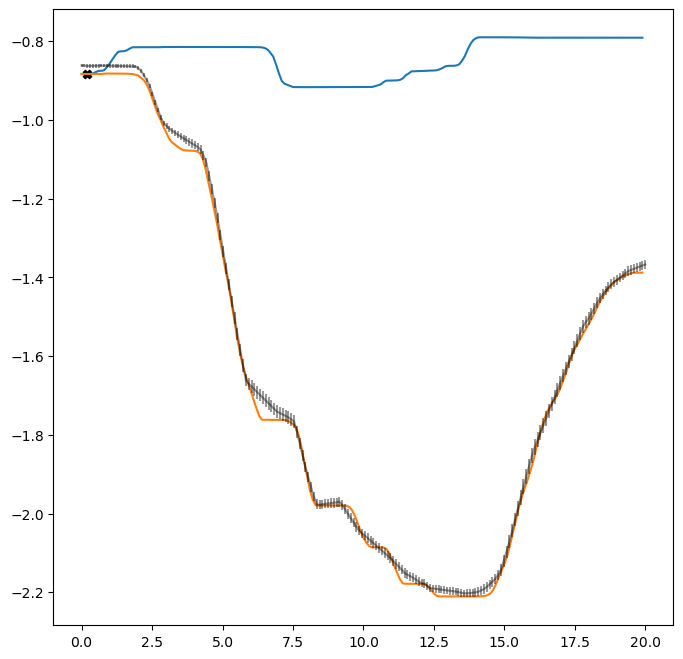

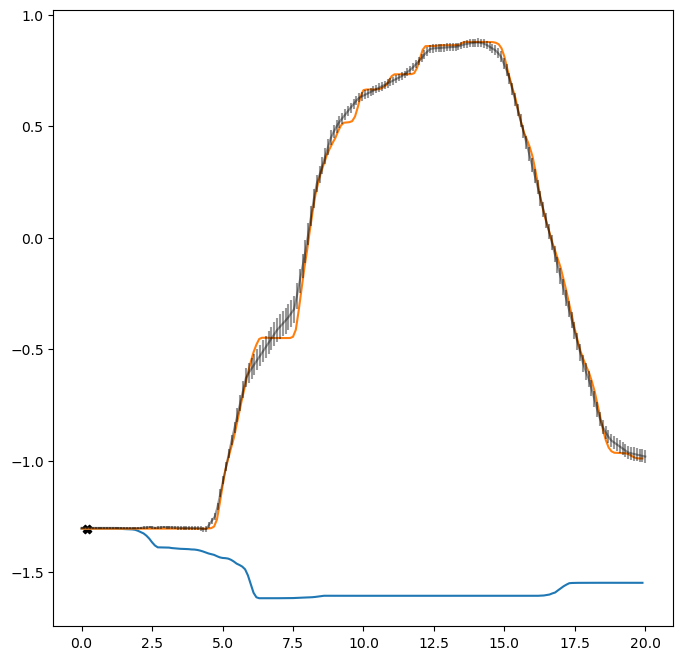

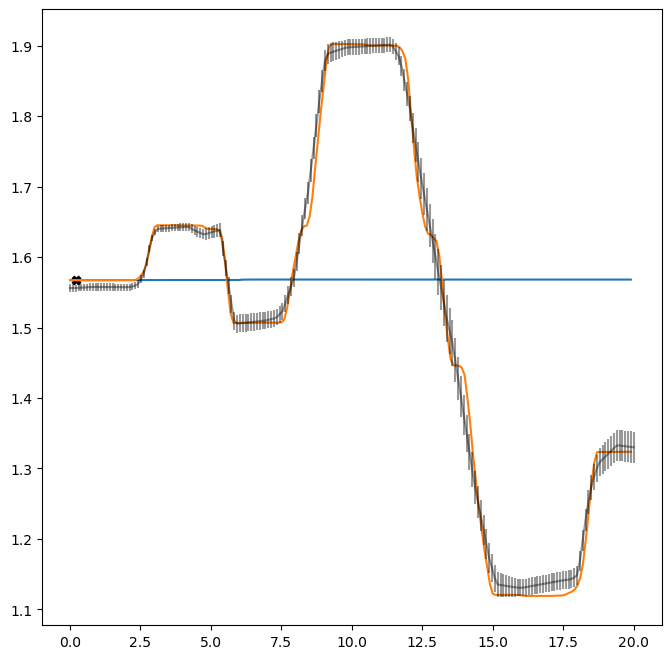

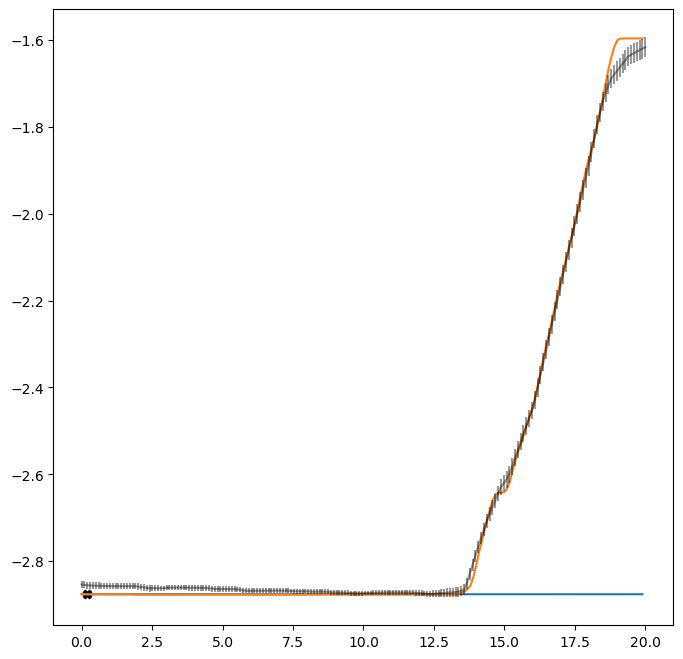

(200, 6)

Current TP, and predicitons below for all output dimensions
1.9090909090909092


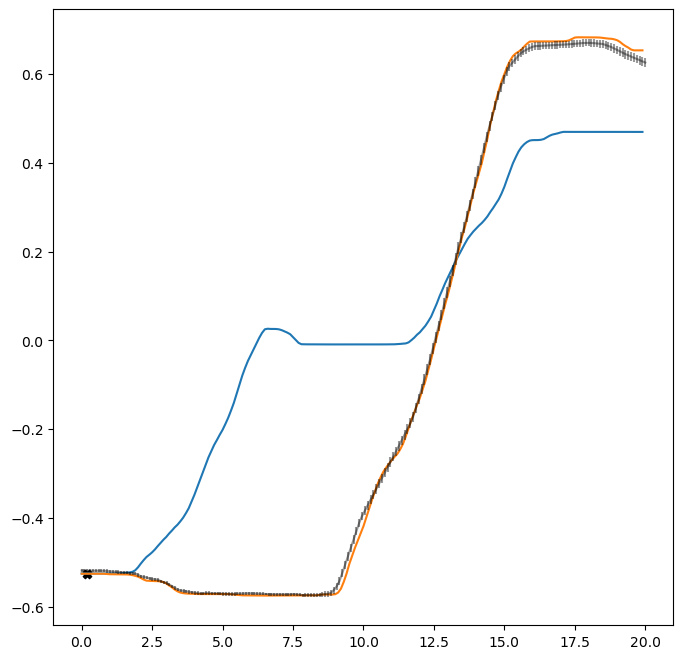

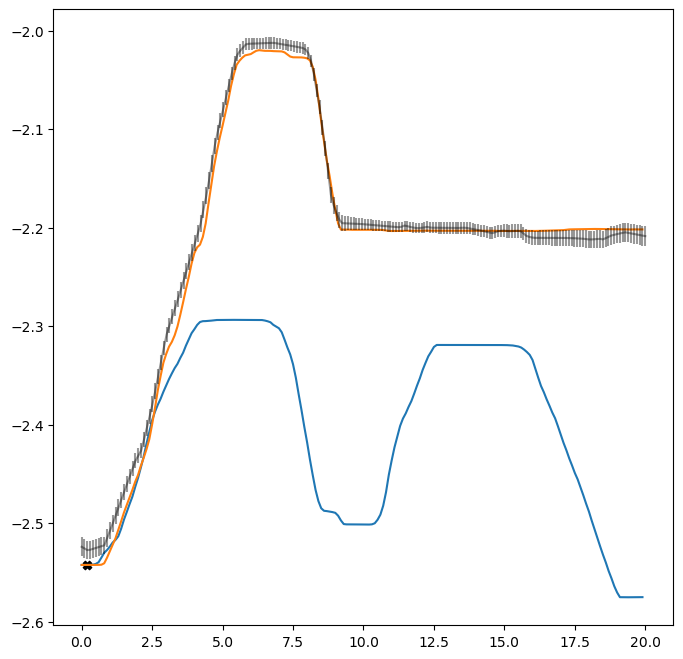

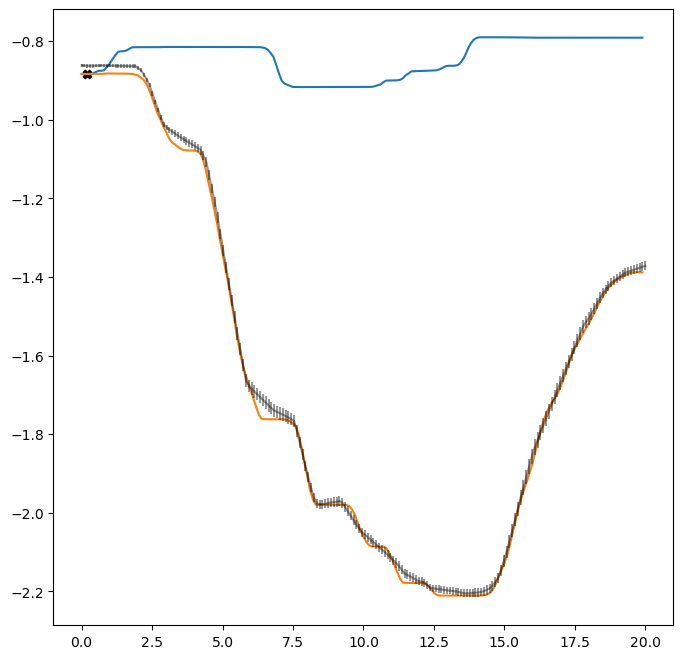

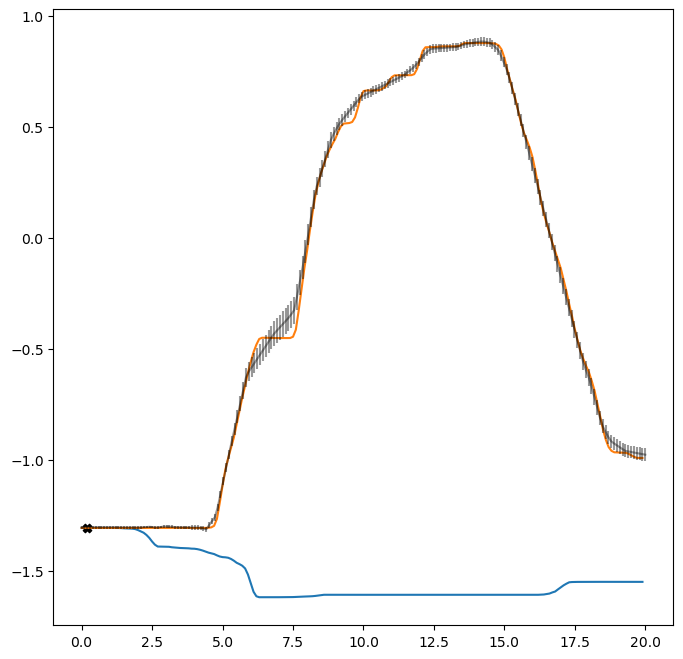

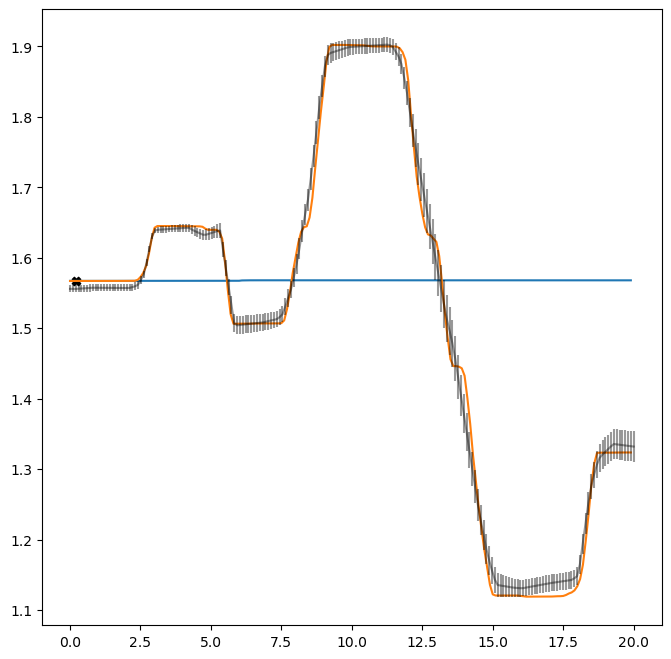

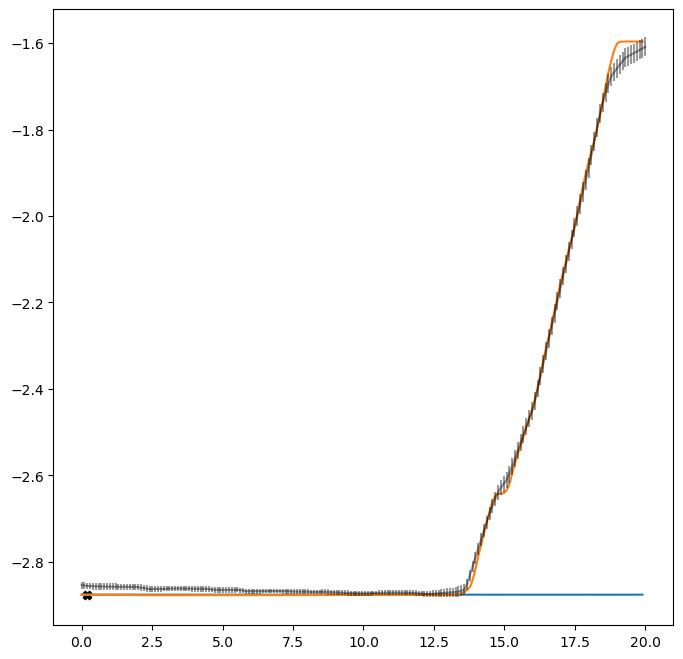

(200, 6)

Current TP, and predicitons below for all output dimensions
1.9393939393939394


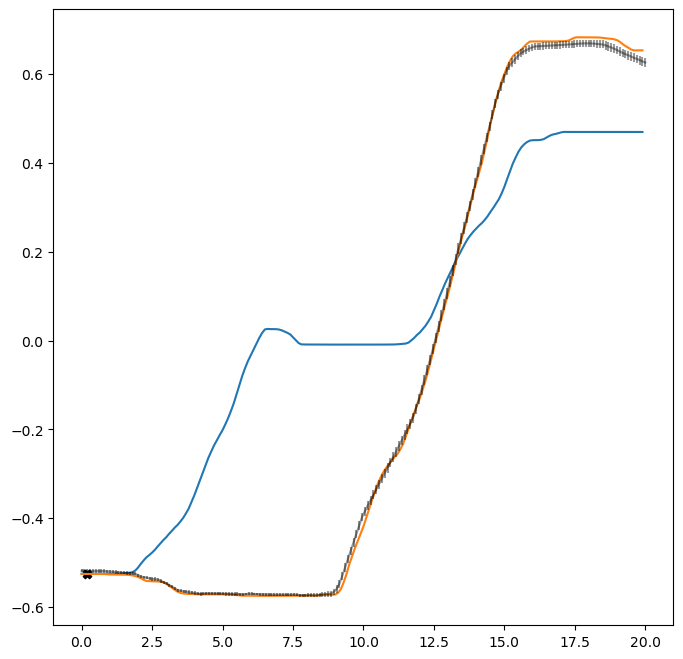

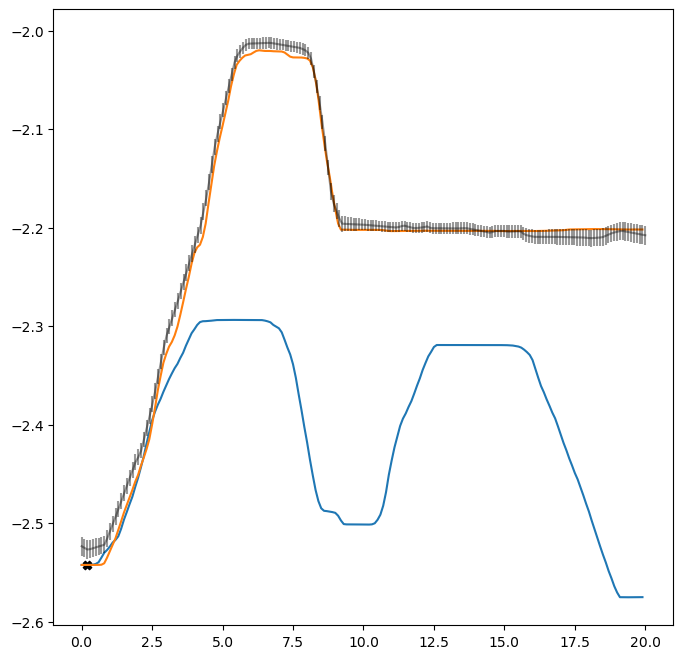

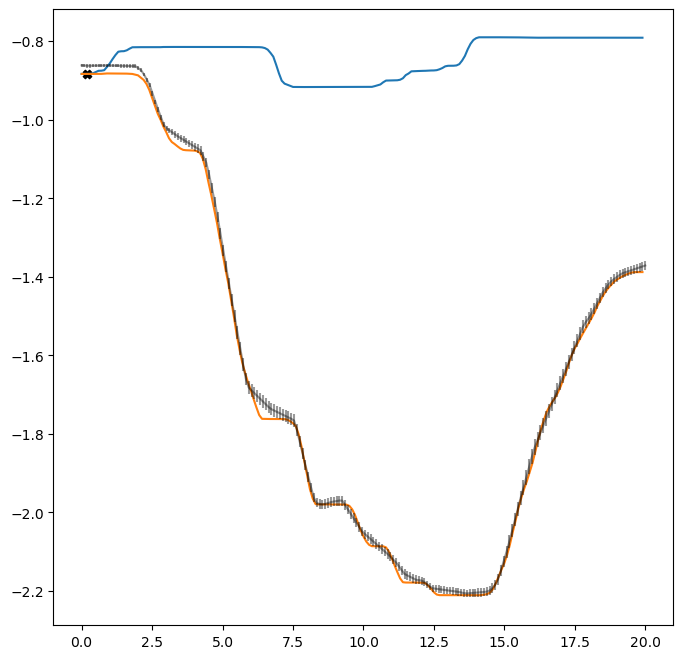

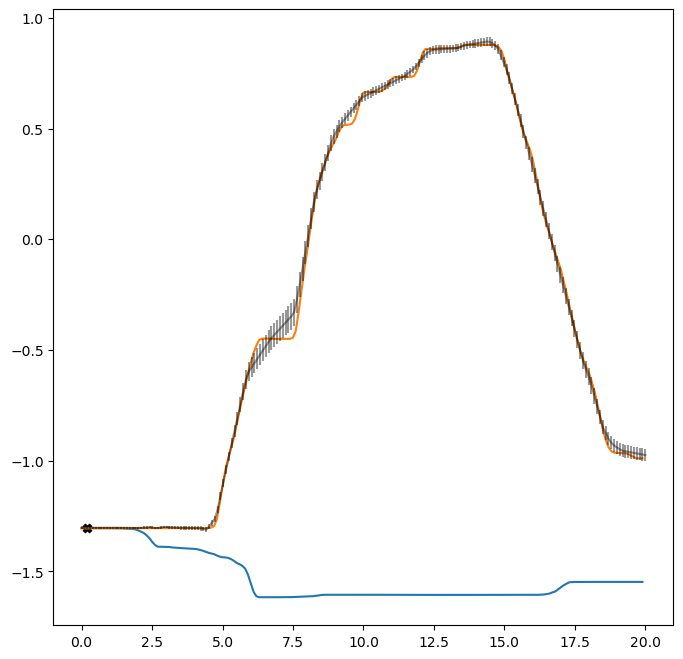

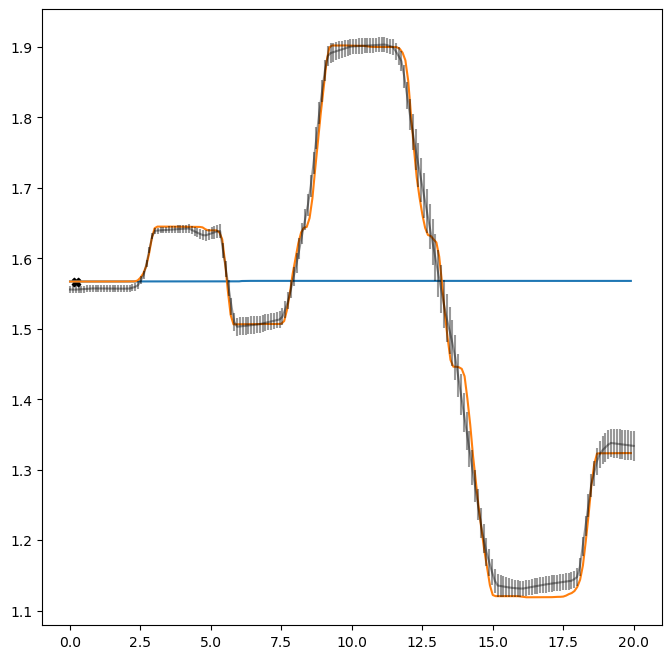

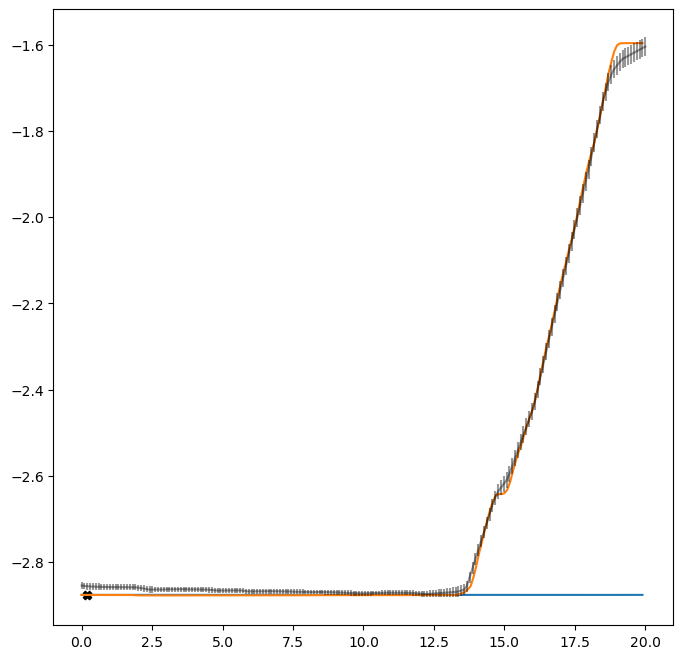

(200, 6)

Current TP, and predicitons below for all output dimensions
1.9696969696969697


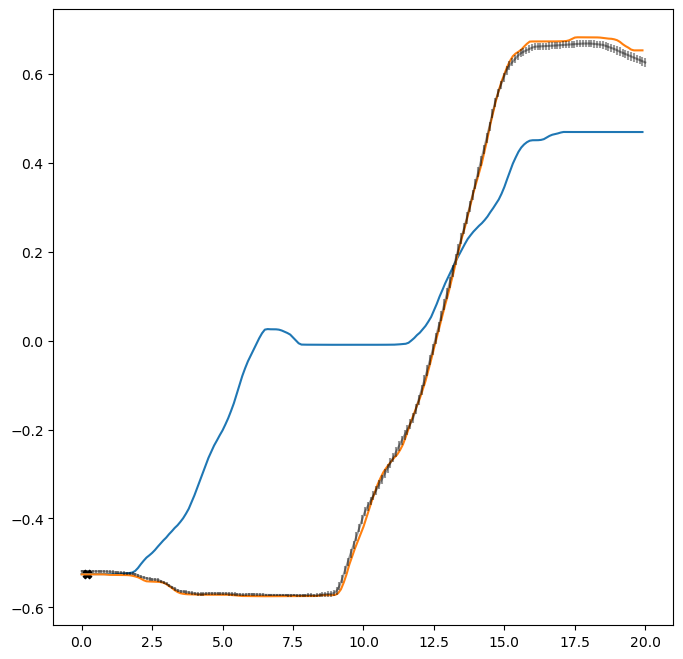

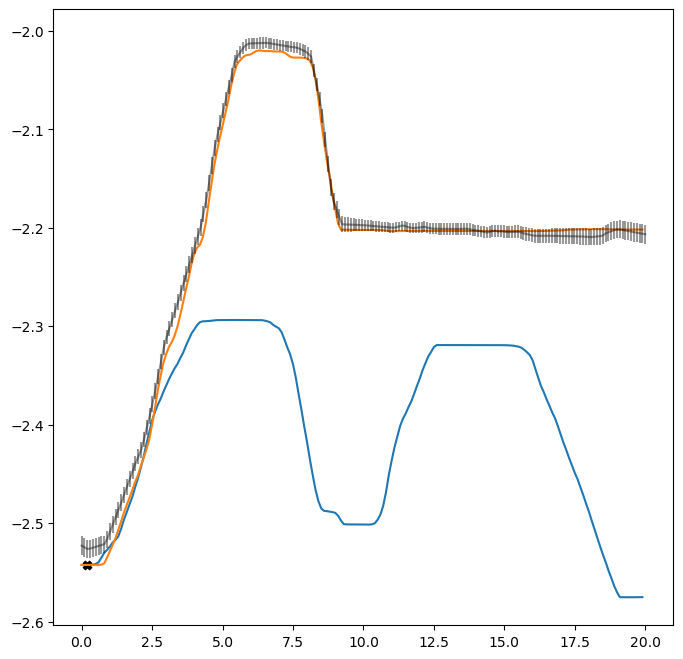

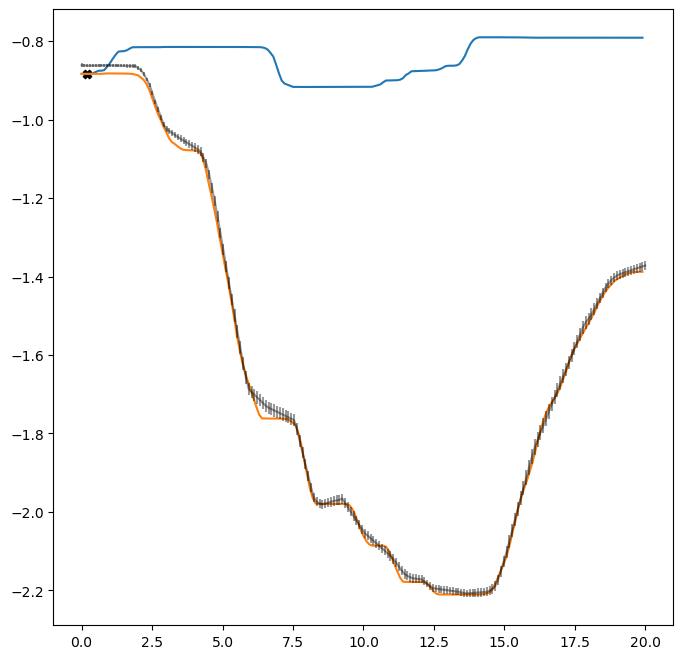

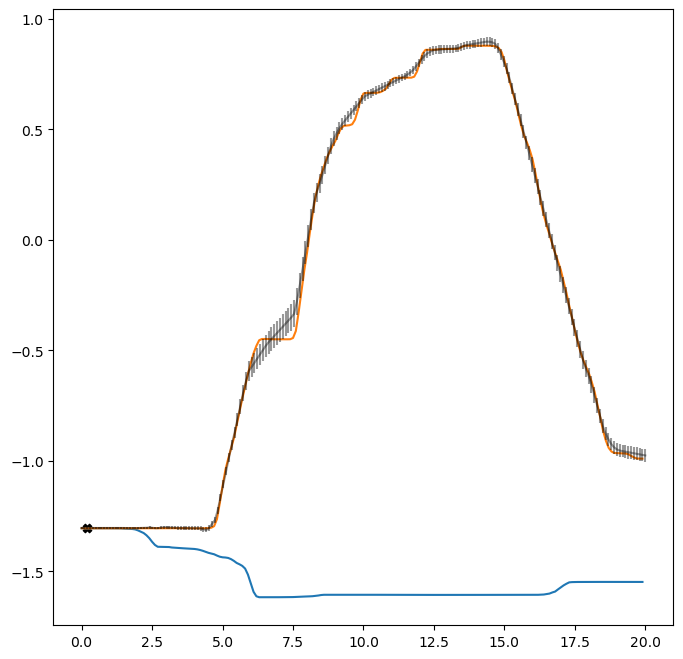

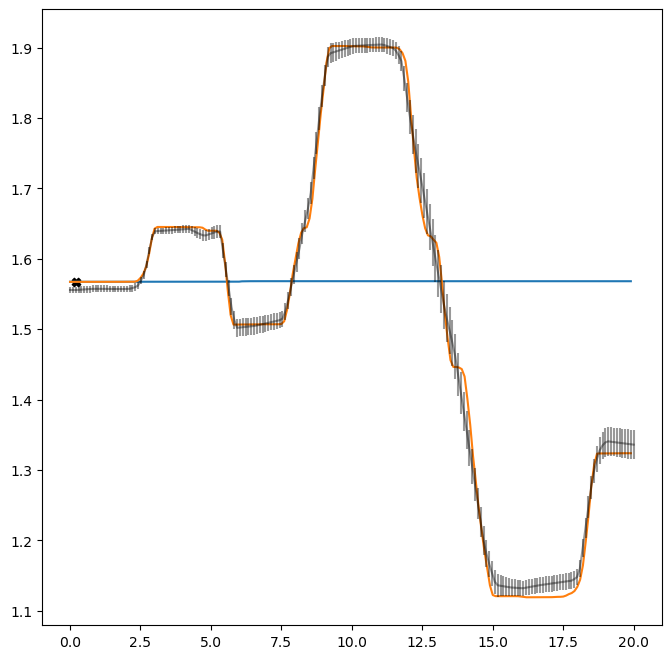

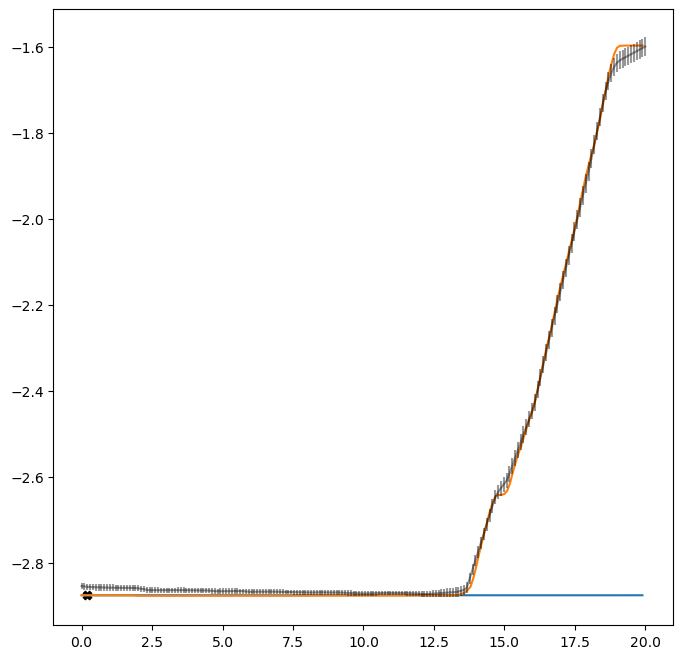

(200, 6)

Current TP, and predicitons below for all output dimensions
2.0


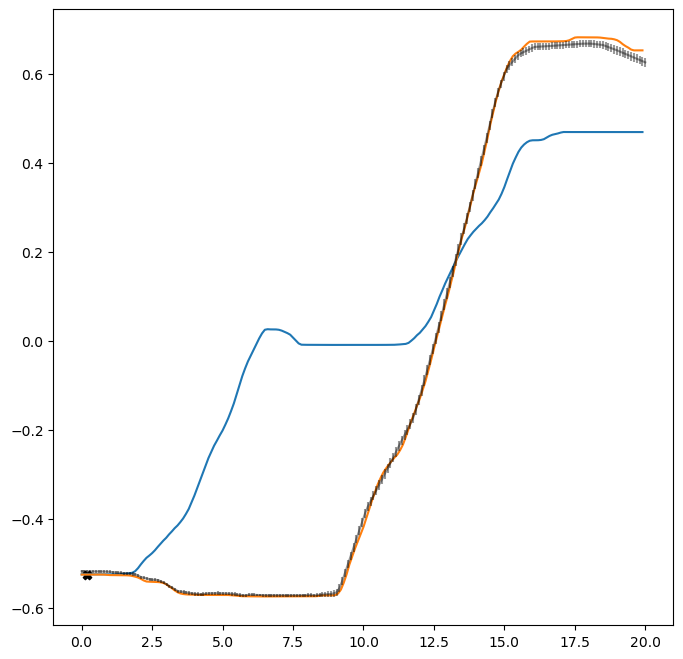

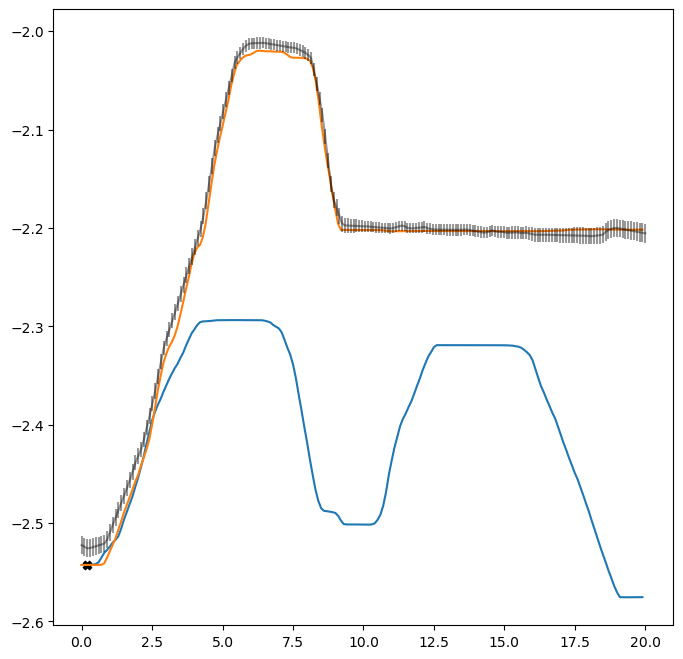

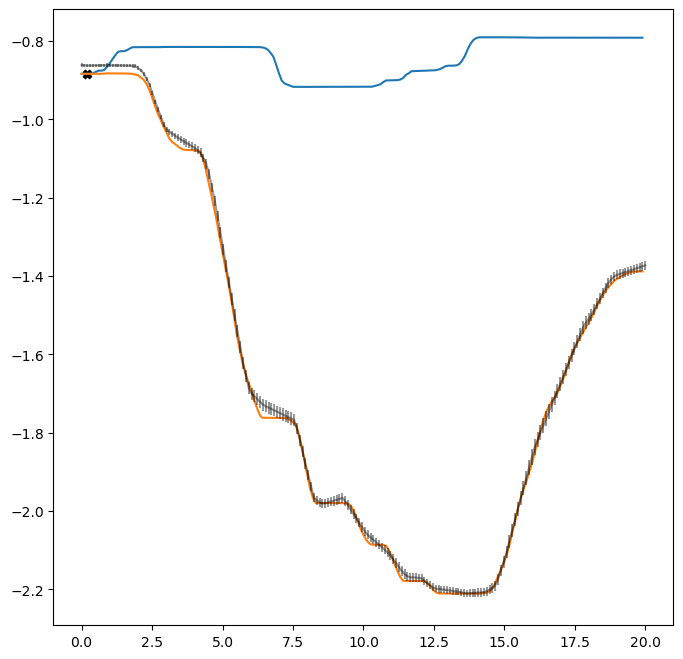

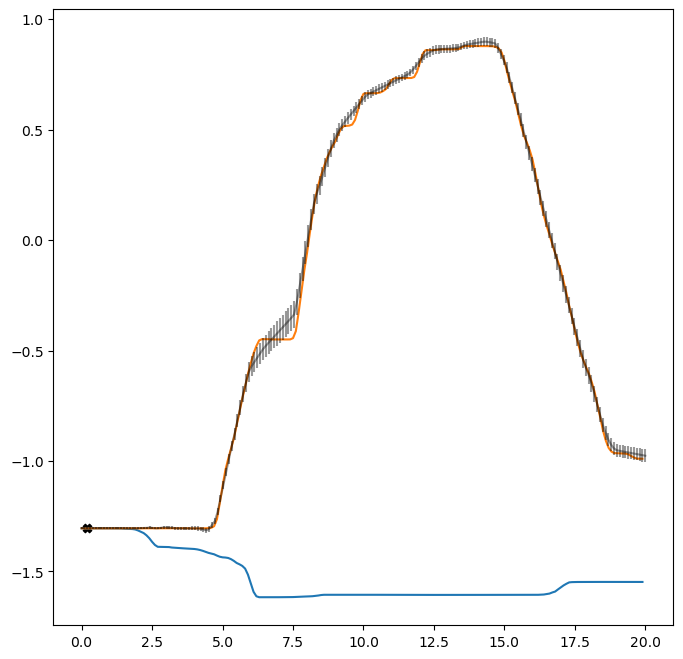

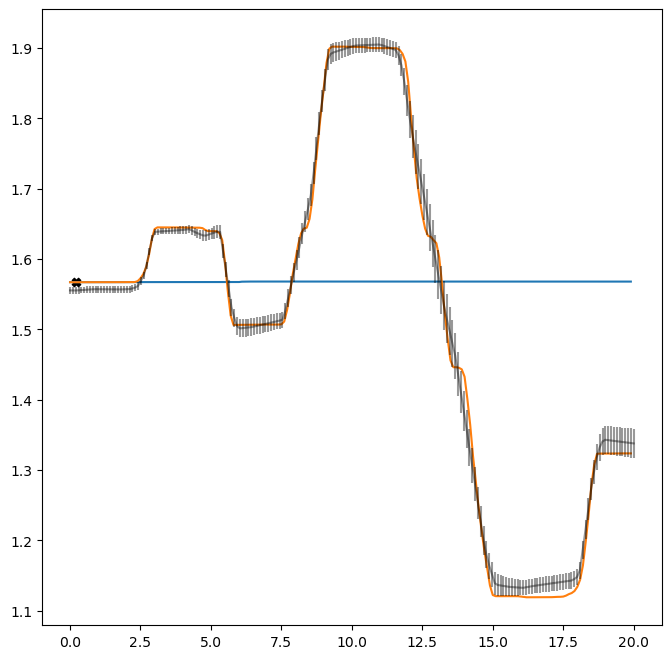

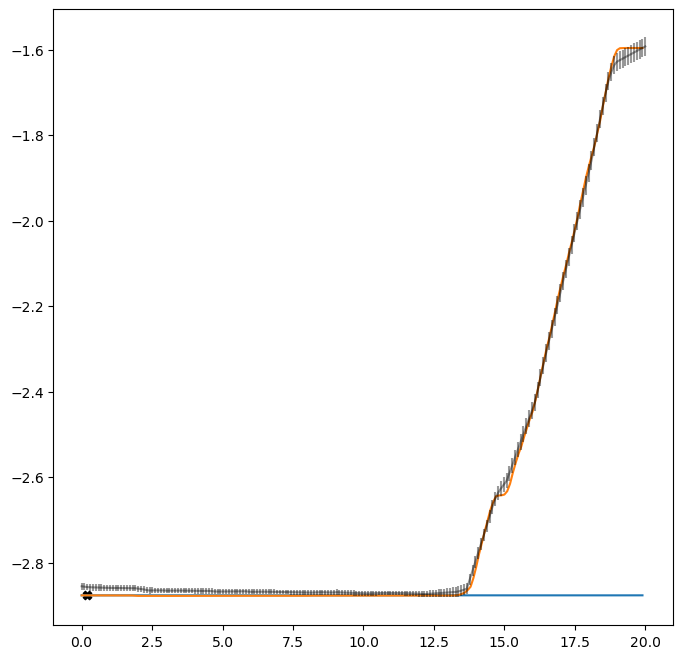

(200, 6)


In [22]:
for curr_tp in all_tp:
    curr_tp_index,curr_tp_value = curr_tp[0],curr_tp[1]
    print('\nCurrent TP, and predicitons below for all output dimensions')
    print(curr_tp_value)
    predicted_Ys,predicted_std=predict_model_free(np.array([[ 0.200,  curr_tp_value, -0.5258, -2.5425, -0.8834, -1.3051,  1.5671, -2.8763],]),time_queries)
    print(predicted_Ys.shape)
    graph[int(curr_tp_index),:, -d_y:]=predicted_Ys # fill the last columns with data predicted
    #graph_std[int(curr_tp_index),:,2]=predicted_std[:,0].reshape(200) #from 200,1 to 200 #third position value


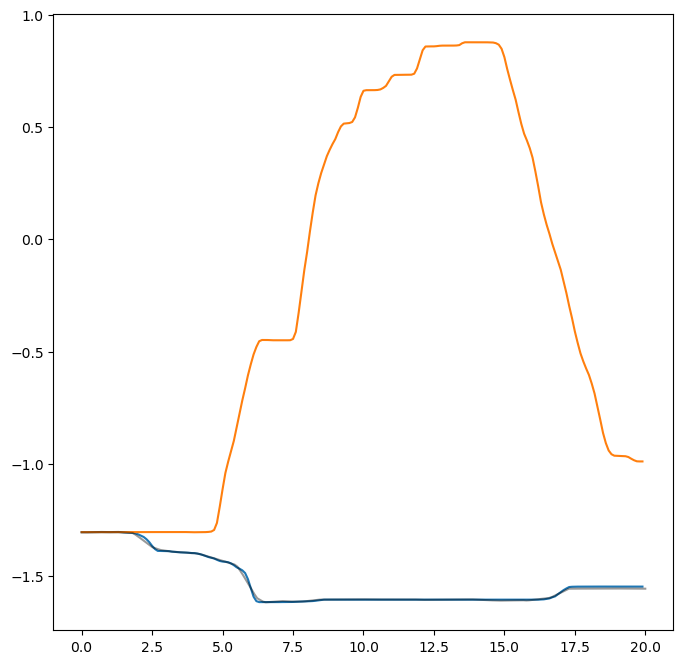

In [23]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation

dimension_index=3

# Create a figure and axis
fig = plt.figure(figsize=(8,8))
for dem in range(d_N): #for all demonstration
    plt.plot(X[dem,:,0],Y[dem,:,dimension_index]) # plot training data
#plot preditions
#plt.plot(target_Xs,predicted_Y[:,i],marker="X",color='red',markersize=2)
line,=plt.plot(graph[0,:,0],graph[0,:,2+dimension_index],color='black',alpha=0.4)
plt.show()  

def update(frame):
    line.set_ydata(graph[frame,:,2+dimension_index])
    return line,

# Create the animation
ani = FuncAnimation(fig, update, frames=range(all_tp.shape[0]), blit=True)

# Display the animation
from IPython.display import HTML
HTML(ani.to_jshtml())
#ani.save('animation_trained_v1.mp4', fps=10, extra_args=['-vcodec', 'h264','-pix_fmt', 'yuv420p'])

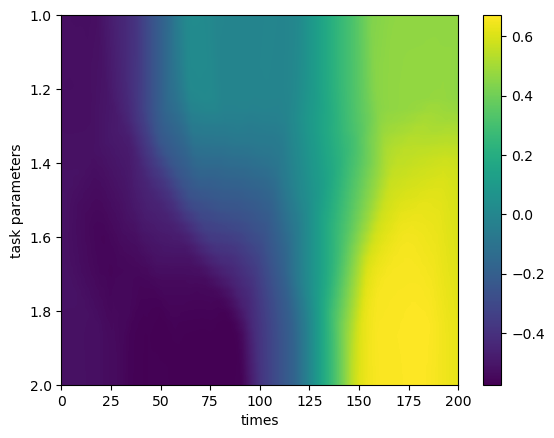

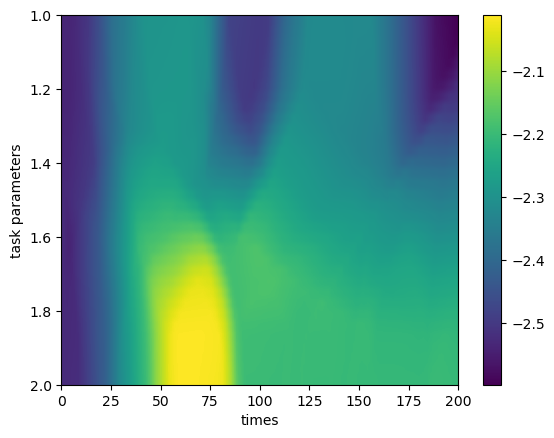

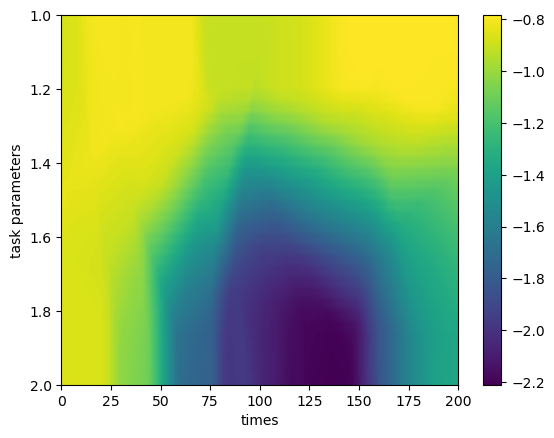

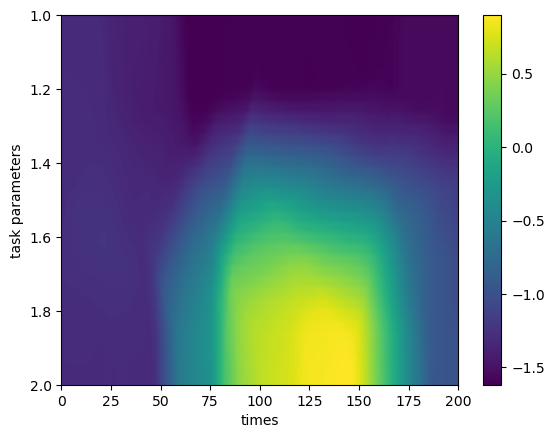

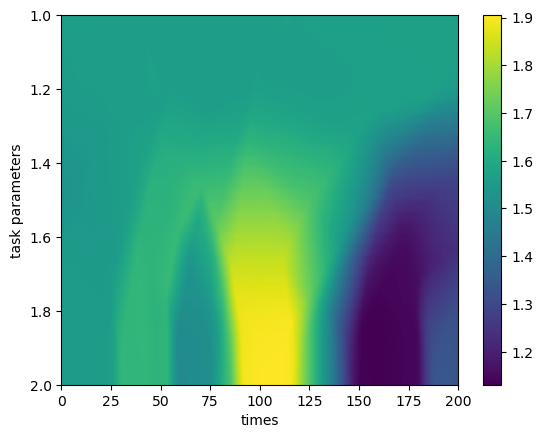

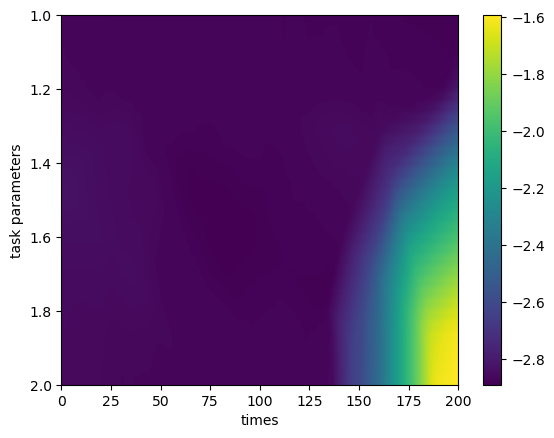

In [24]:
for dimension_index in range(d_y):
    reshaped_data = graph[:,:,2+dimension_index] #taking only the predictions in 2D

    # Create a heatmap plot
    plt.imshow(reshaped_data,extent=[0, num_time_samples, max_tp, min_tp], cmap='viridis', aspect='auto')

    # Add colorbar
    plt.colorbar()

    # Set labels for the axes
    plt.xlabel('times')
    plt.ylabel('task parameters')

    # Show the plot
    plt.show()

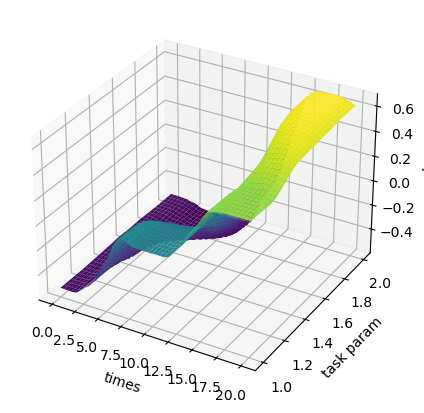

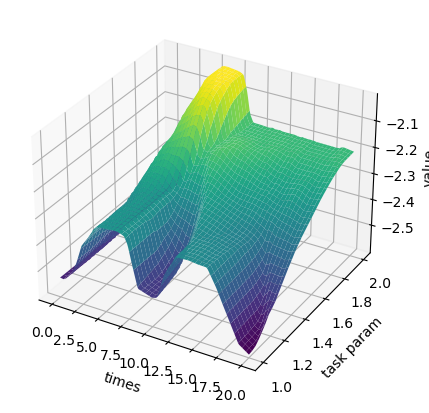

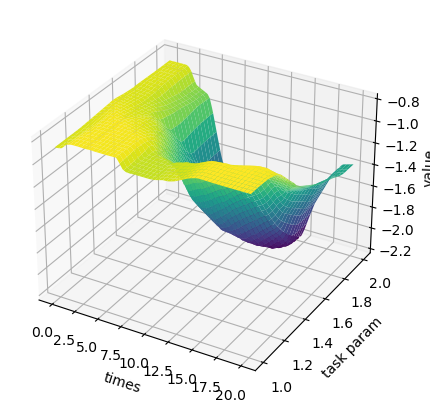

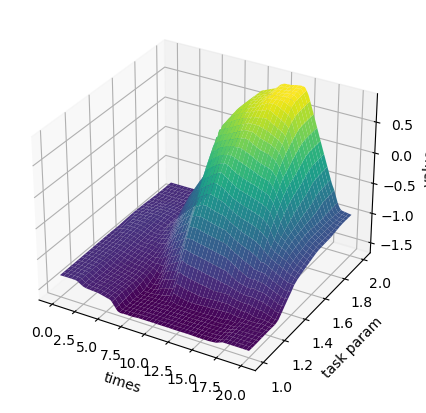

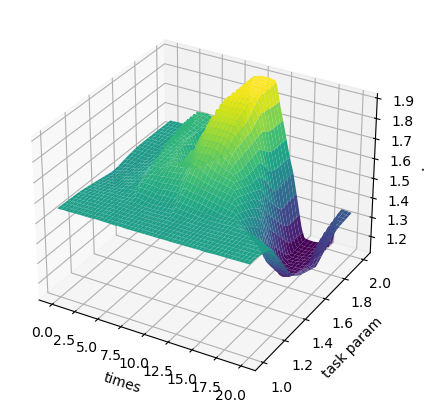

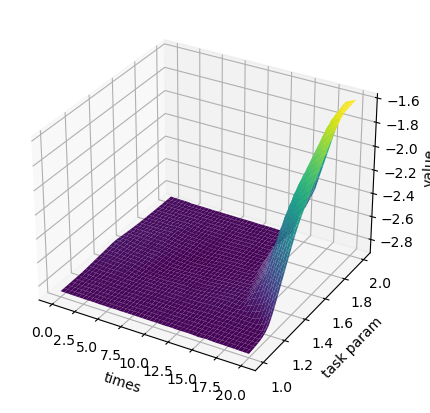

In [25]:
from mpl_toolkits import mplot3d

for dimension_index in range(d_y):
    z = graph[:, :,2+dimension_index] #z values are in the 3rd dimension of graph
    #print(z.shape)
    z=z.T #transpose
    #print(z.shape)

    # Create a meshgrid from x and y values
    TPs, TIMEs = np.meshgrid(tp_value_array, time_queries[:,0]) #repeats x array as many times as y and y array as many times as x

    # Create a 3D axes object
    fig = plt.figure(figsize=(5,5))
    ax = fig.add_subplot(111, projection='3d')

    # Create a 3D surface plot
    ax.plot_surface(TIMEs, TPs, z, cmap='viridis')
    #or simply
    #ax.plot_surface(graph[:,:,0], graph[:,:,1], graph[:, :,2], cmap='viridis')

    # Set labels for the axes
    ax.set_xlabel('times')
    ax.set_ylabel('task param')
    ax.set_zlabel('value')

    # Show the plot
    plt.show()

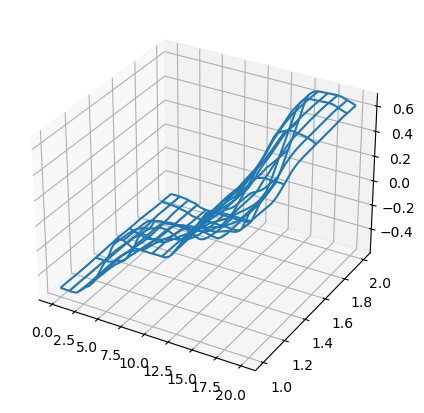

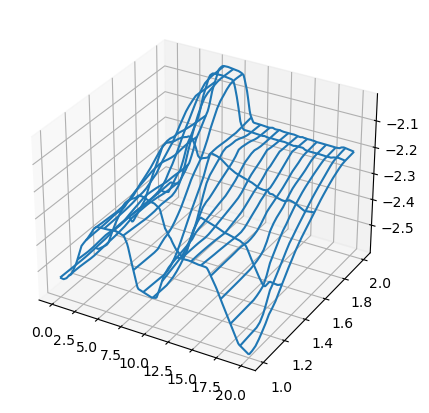

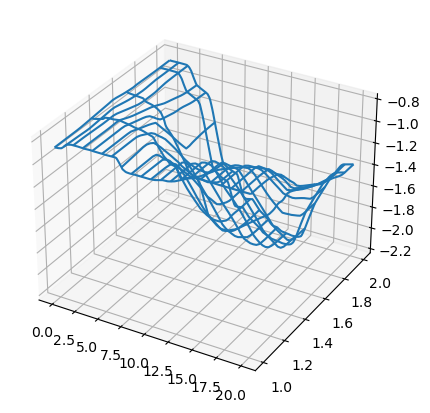

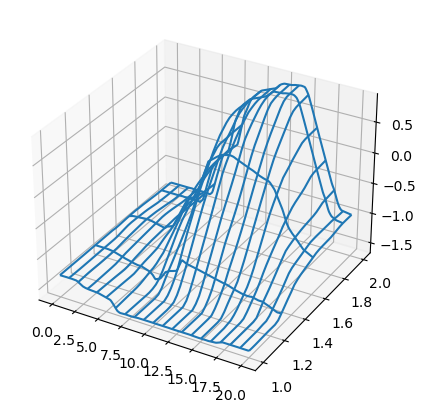

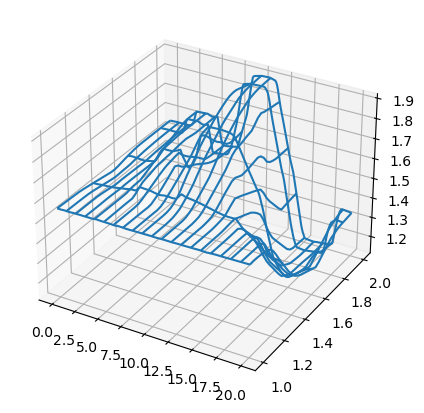

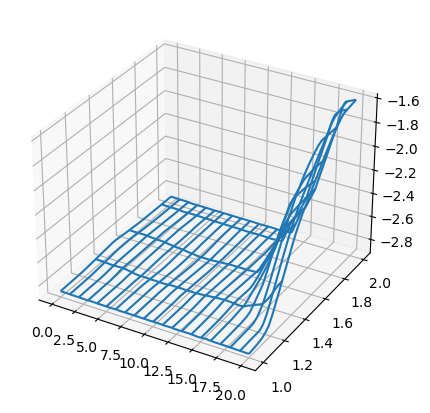

In [26]:
for dimension_index in range(d_y):
    fig = plt.figure(figsize=(5,5))
    ax = fig.add_subplot(projection='3d')


    # Plot a basic wireframe.
    ax.plot_wireframe(graph[:,:,0], graph[:,:,1], graph[:, :,2+dimension_index], rstride=10, cstride=10)

    plt.show()

## Mathematical transition of task parameters
Once condition, changes TP in time


In [27]:
#test a model prediction
with torch.no_grad():
        print(model(torch.from_numpy(np.array([[ 0.2000,  1, -0.5258, -2.5425, -0.8834, -1.3051,  1.5671, -2.8763]])),torch.from_numpy(time_queries)).numpy())

[[-0.52447032 -2.53432072 -0.87071132 ... -5.21828224 -5.42754654
  -4.96994596]
 [-0.52460047 -2.53462655 -0.86988544 ... -5.23246177 -5.44135623
  -4.97855294]
 [-0.52500861 -2.53518192 -0.86918389 ... -5.24855279 -5.45490765
  -4.98702798]
 ...
 [ 0.46535576 -2.59234713 -0.78895397 ... -5.12228604 -5.2007918
  -4.68911066]
 [ 0.46528214 -2.59488412 -0.78893443 ... -5.11817062 -5.18680611
  -4.67959922]
 [ 0.4650713  -2.59741131 -0.78885894 ... -5.11406197 -5.1728196
  -4.67020809]]


In [28]:
# test a smooth transition in time
mixed_tp=np.zeros((num_time_samples,2+d_y)) # ask the network for every time queries, store the following data:
mixed_tp[:,0]=time_queries[:,0] #first position time
mixed_tp[:,1]=np.linspace(2,1,mixed_tp.shape[0]) #second column tp
#mixed_tp[:,2]=np.linspace(0,mixed_tp.shape[0]-1,mixed_tp.shape[0]) #3d column index

for index, el in enumerate(mixed_tp):
    with torch.no_grad():
        print("now time %f and tp %f"%(el[0], el[1]))
        pred_y = model( torch.from_numpy(np.array([[ 0.2000,  el[1], -0.5258, -2.5425, -0.8834, -1.3051,  1.5671, -2.8763]])) , torch.from_numpy(np.array([[el[0]]])) ).numpy()
        #print(pred_y[0]) #network returns means and std
        mixed_tp[index,-d_y:]=pred_y[0][0:6] #last 6 values substituted with mean predicted in every dimensions
print(mixed_tp)

now time 0.000000 and tp 2.000000
now time 0.100503 and tp 1.994975
now time 0.201005 and tp 1.989950
now time 0.301508 and tp 1.984925
now time 0.402010 and tp 1.979899
now time 0.502513 and tp 1.974874
now time 0.603015 and tp 1.969849
now time 0.703518 and tp 1.964824
now time 0.804020 and tp 1.959799
now time 0.904523 and tp 1.954774
now time 1.005025 and tp 1.949749
now time 1.105528 and tp 1.944724
now time 1.206030 and tp 1.939698
now time 1.306533 and tp 1.934673
now time 1.407035 and tp 1.929648
now time 1.507538 and tp 1.924623
now time 1.608040 and tp 1.919598
now time 1.708543 and tp 1.914573
now time 1.809045 and tp 1.909548
now time 1.909548 and tp 1.904523
now time 2.010050 and tp 1.899497
now time 2.110553 and tp 1.894472
now time 2.211055 and tp 1.889447
now time 2.311558 and tp 1.884422
now time 2.412060 and tp 1.879397
now time 2.512563 and tp 1.874372
now time 2.613065 and tp 1.869347
now time 2.713568 and tp 1.864322
now time 2.814070 and tp 1.859296
now time 2.914

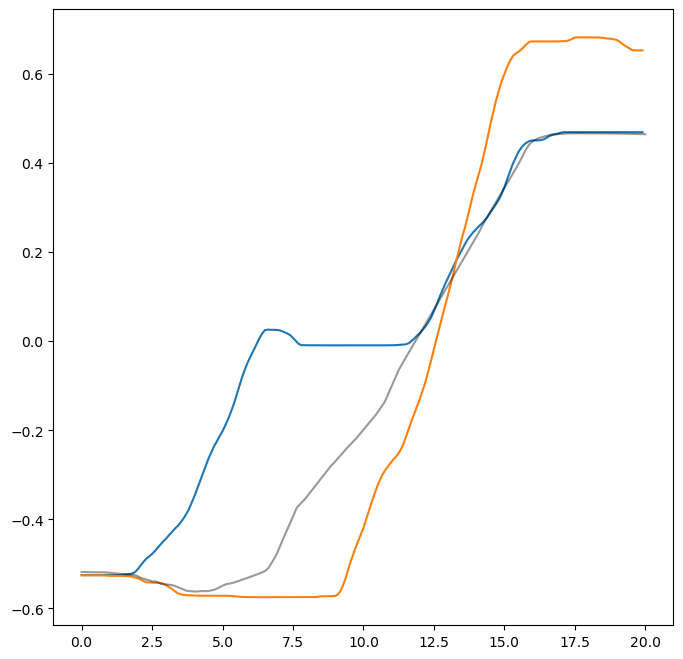

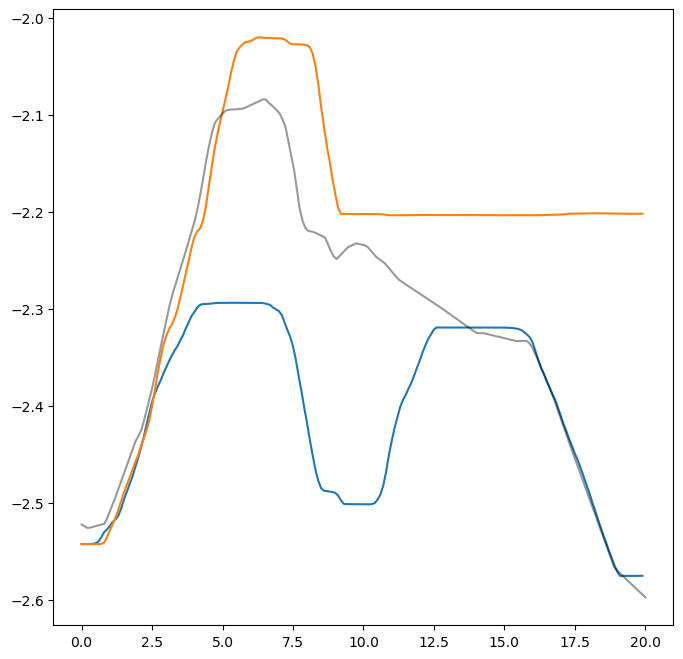

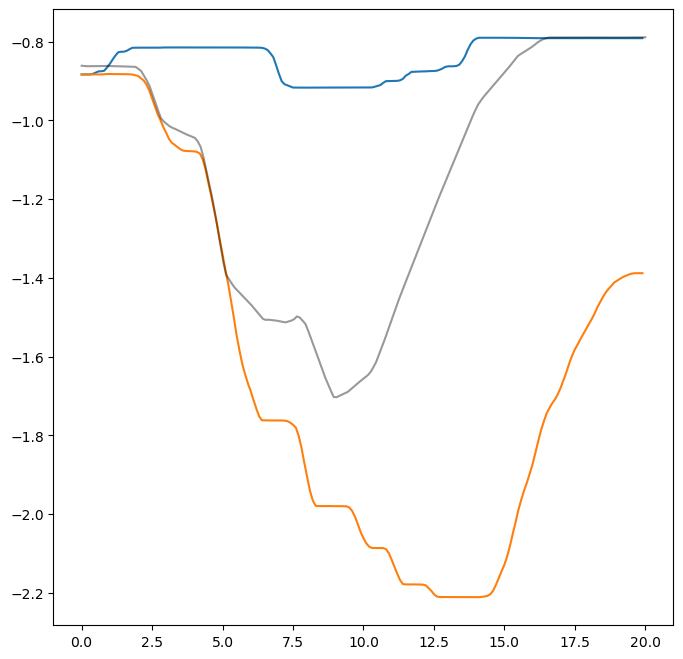

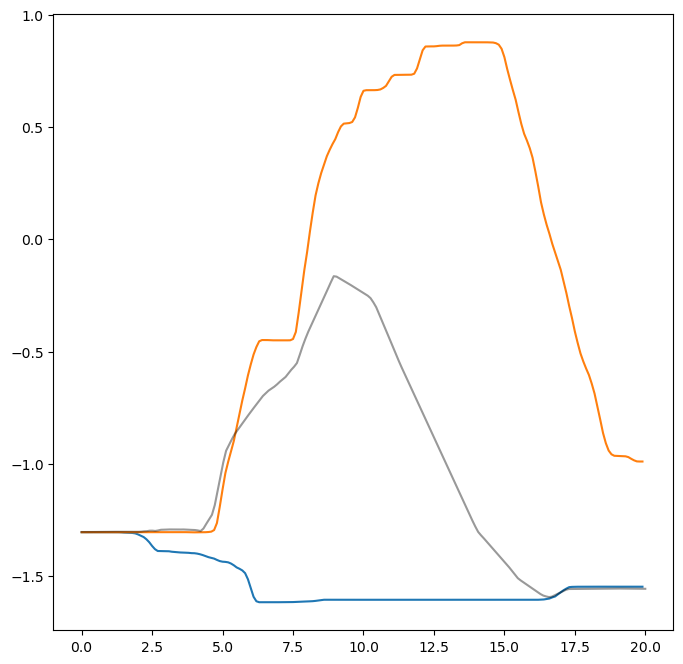

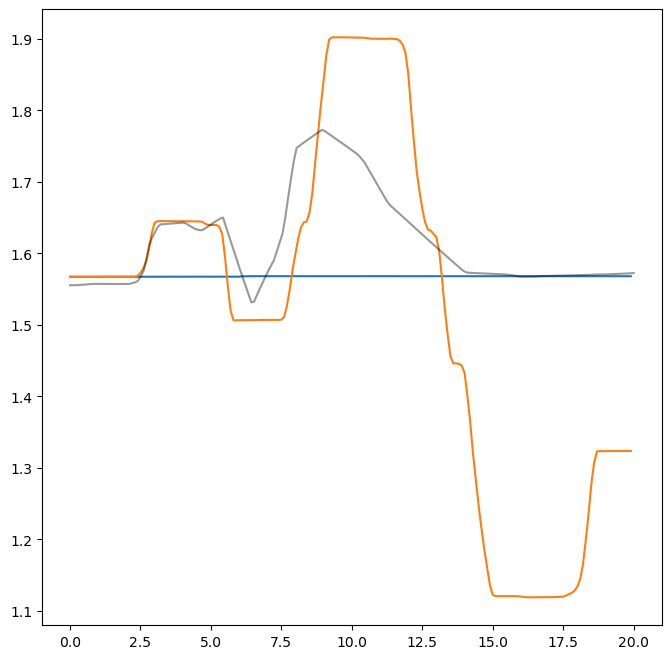

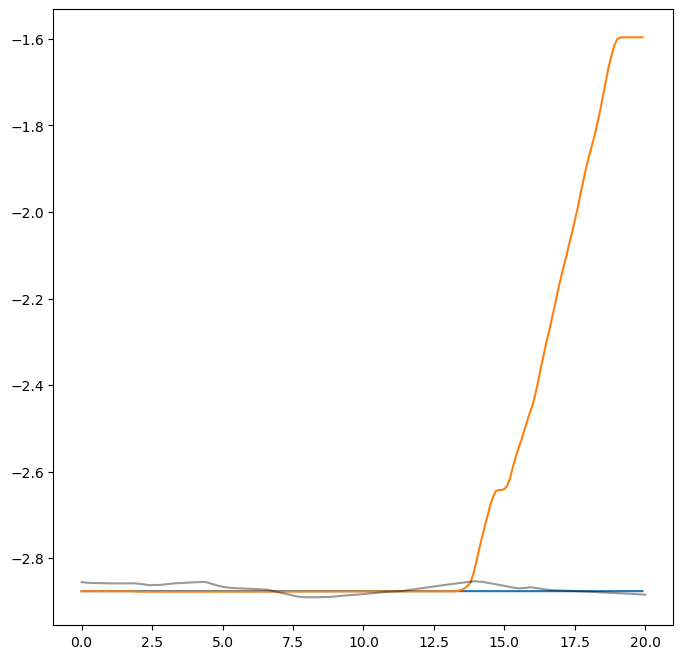

In [29]:
# Create a figure and axis
for dimension_index in range(d_y): 
    fig = plt.figure(figsize=(8,8))
    for dem in range(d_N): #for all demonstration
        plt.plot(X[dem,:,0],Y[dem,:,dimension_index]) # plot training data
    #plot preditions
    #plt.plot(0.2,-0.52,marker="X",color='red',markersize=2)
    line,=plt.plot(mixed_tp[:,0],mixed_tp[:,2+dimension_index],color='black',alpha=0.4)
    plt.show()  

transition on the intersection point works perfectly, but only when there is an intersection point in the transition period
 when there is no intersection point it's gonna create a skip

In [30]:
# test a sharp transition in time
mixed_tp=np.zeros((num_time_samples,2+d_y)) # ask the network for every time queries, store the following data:
mixed_tp[:,0]=time_queries[:,0] #first position time
mixed_tp[:100,1]=2 #second column tp
mixed_tp[100:200,1]=1 #second column tp
#mixed_tp[150:200,1]=1.5 #second column tp
#mixed_tp[:,2]=np.linspace(0,mixed_tp.shape[0]-1,mixed_tp.shape[0]) #3d column index

for index, el in enumerate(mixed_tp):
    with torch.no_grad():
        print("now time %f and tp %f"%(el[0], el[1]))
        pred_y = model( torch.from_numpy(np.array([[ 0.2000,  el[1], -0.5258, -2.5425, -0.8834, -1.3051,  1.5671, -2.8763]])) , torch.from_numpy(np.array([[el[0]]])) ).numpy()
        #print(pred_y[0]) #network returns means and std
        mixed_tp[index,-d_y:]=pred_y[0][0:6] #last 6 values substituted with mean predicted in every dimensions
print(mixed_tp)

now time 0.000000 and tp 2.000000
now time 0.100503 and tp 2.000000
now time 0.201005 and tp 2.000000
now time 0.301508 and tp 2.000000
now time 0.402010 and tp 2.000000
now time 0.502513 and tp 2.000000
now time 0.603015 and tp 2.000000
now time 0.703518 and tp 2.000000
now time 0.804020 and tp 2.000000
now time 0.904523 and tp 2.000000
now time 1.005025 and tp 2.000000
now time 1.105528 and tp 2.000000
now time 1.206030 and tp 2.000000
now time 1.306533 and tp 2.000000
now time 1.407035 and tp 2.000000
now time 1.507538 and tp 2.000000
now time 1.608040 and tp 2.000000
now time 1.708543 and tp 2.000000
now time 1.809045 and tp 2.000000
now time 1.909548 and tp 2.000000
now time 2.010050 and tp 2.000000
now time 2.110553 and tp 2.000000
now time 2.211055 and tp 2.000000
now time 2.311558 and tp 2.000000
now time 2.412060 and tp 2.000000
now time 2.512563 and tp 2.000000
now time 2.613065 and tp 2.000000
now time 2.713568 and tp 2.000000
now time 2.814070 and tp 2.000000
now time 2.914

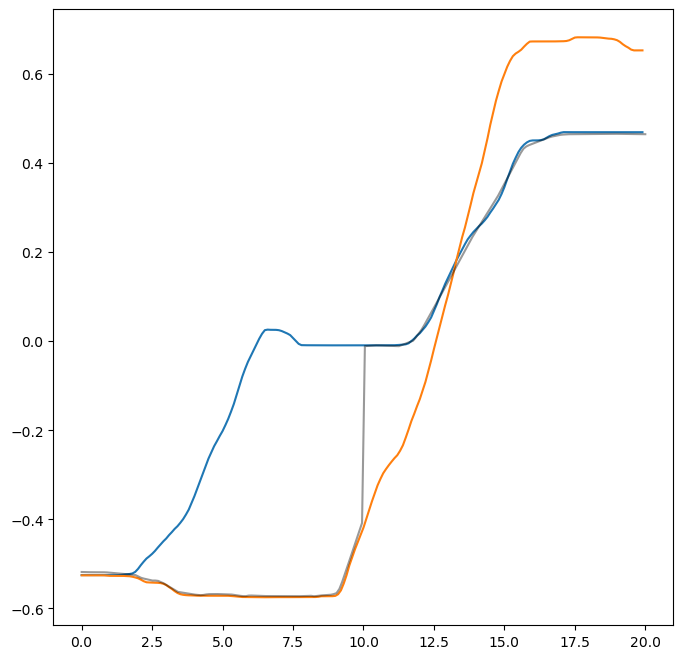

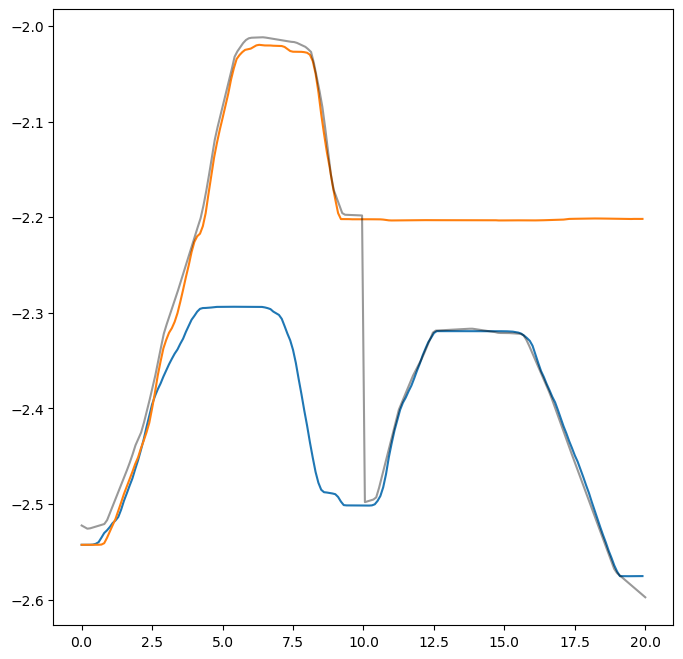

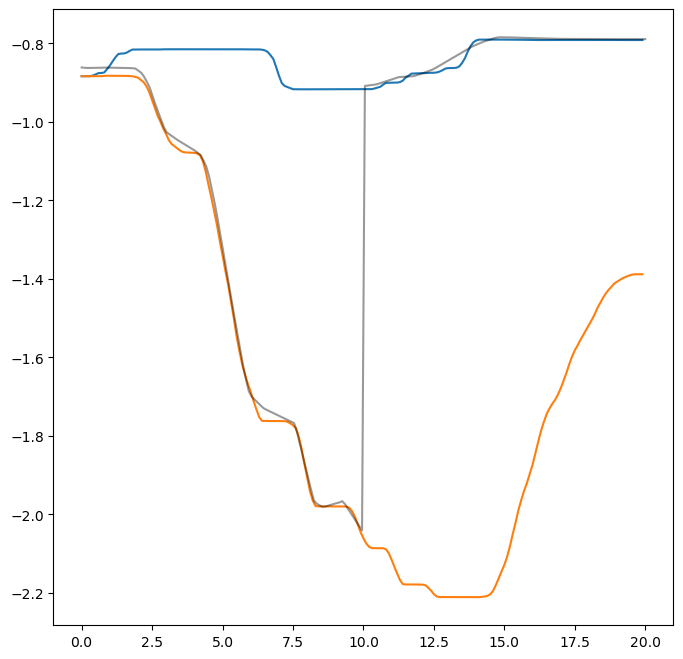

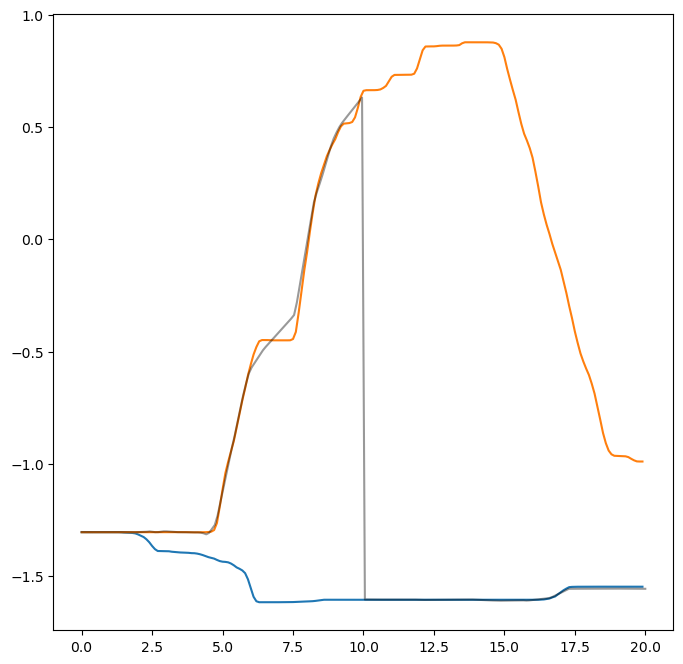

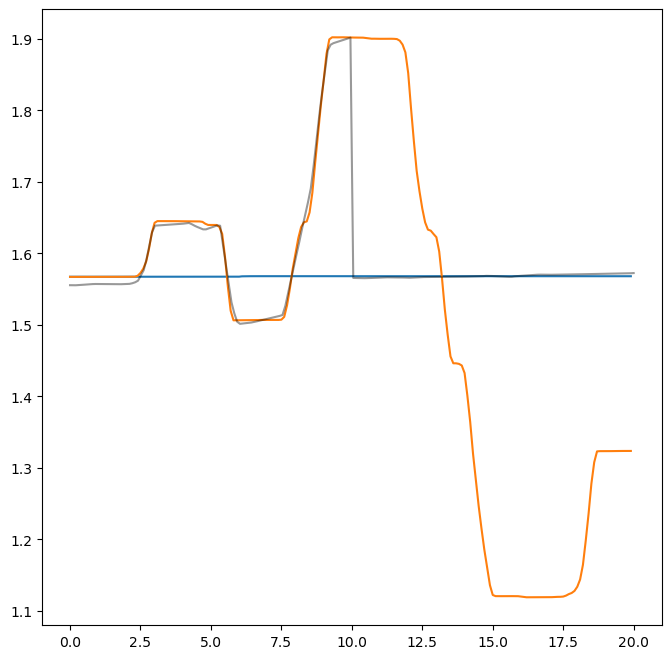

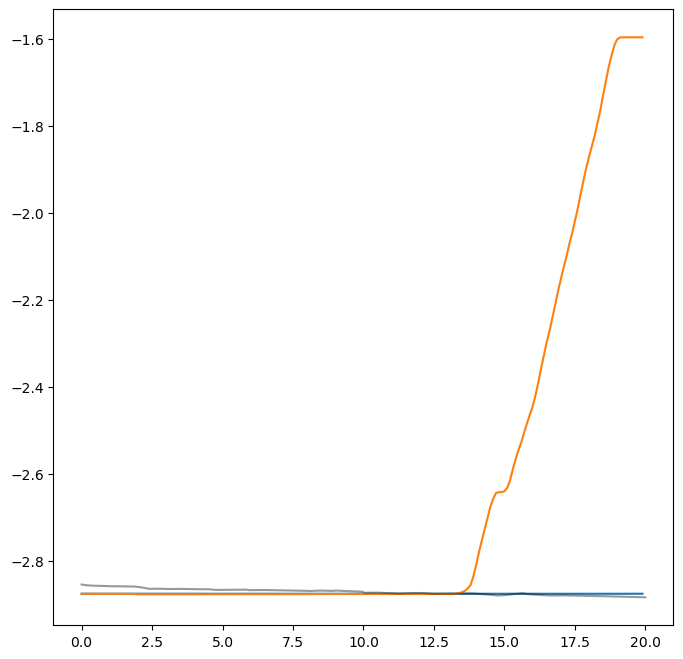

In [31]:
# Create a figure and axis
for dimension_index in range(d_y): 
    fig = plt.figure(figsize=(8,8))
    for dem in range(d_N): #for all demonstration
        plt.plot(X[dem,:,0],Y[dem,:,dimension_index]) # plot training data
    #plot preditions
    #plt.plot(0.2,-0.52,marker="X",color='red',markersize=2)
    line,=plt.plot(mixed_tp[:,0],mixed_tp[:,2+dimension_index],color='black',alpha=0.4)
    plt.show() 

# Mathematical transition function

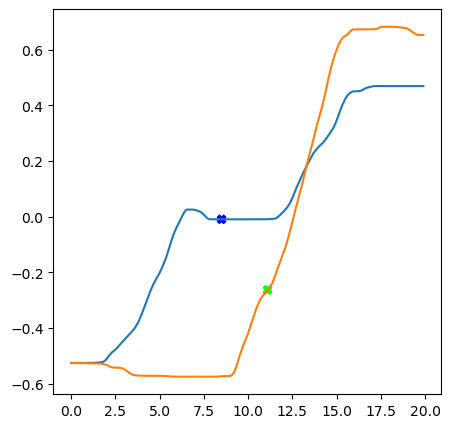

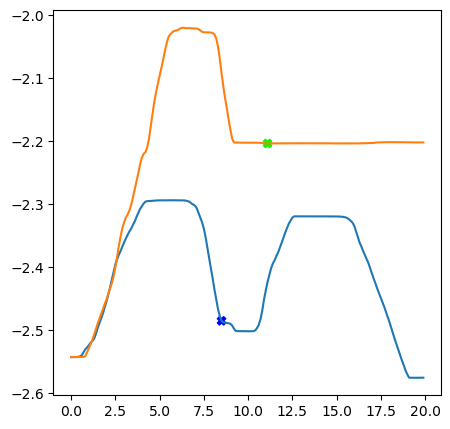

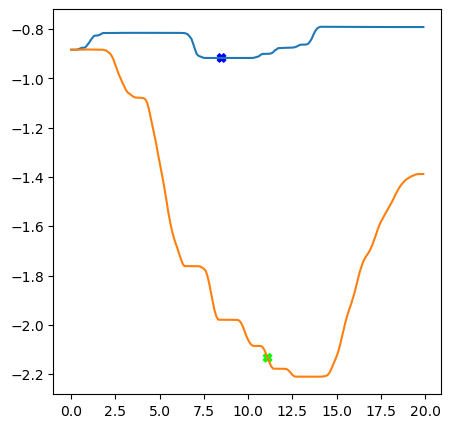

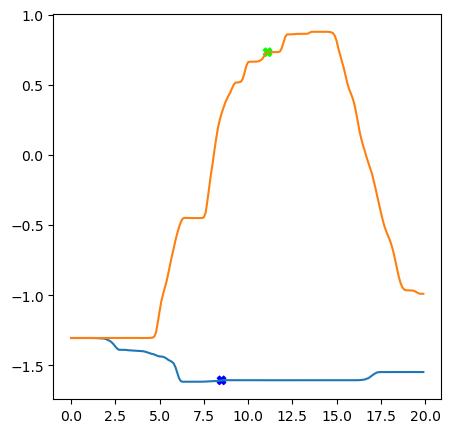

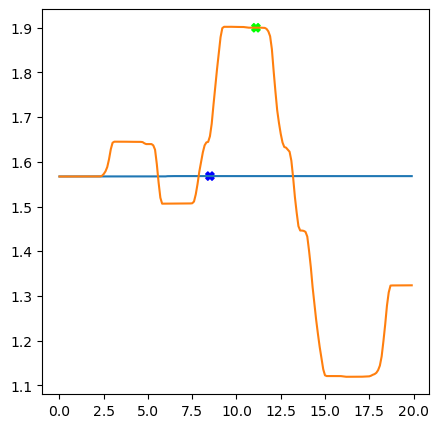

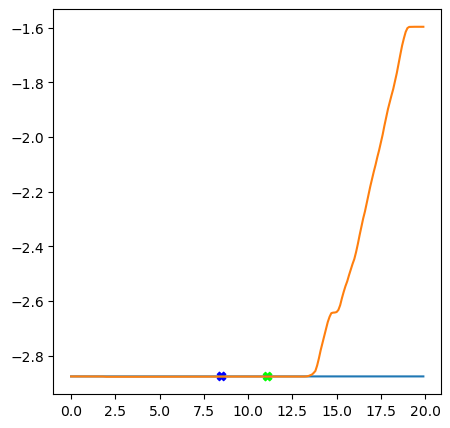

[[ 8.5000e+00  1.0000e+00 -9.1000e-03 -2.4850e+00 -9.1670e-01 -1.6070e+00
   1.5681e+00 -2.8762e+00]
 [ 1.1100e+01  2.0000e+00 -2.6260e-01 -2.2034e+00 -2.1340e+00  7.3290e-01
   1.9000e+00 -2.8767e+00]]
(200, 9)

Finding closest couple to set interpolation points to go from 1.00 TP to 2.00 TP


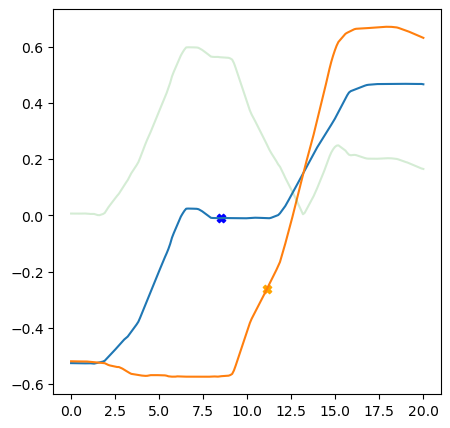

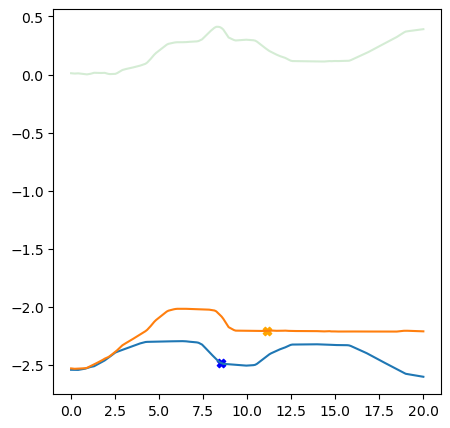

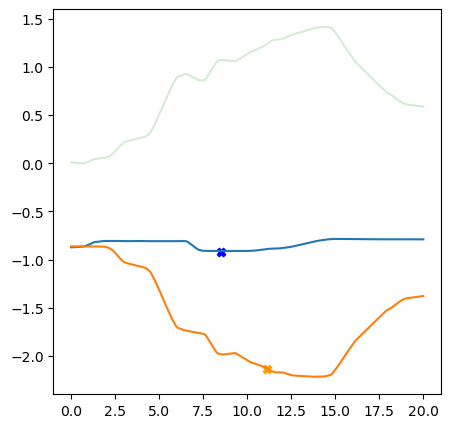

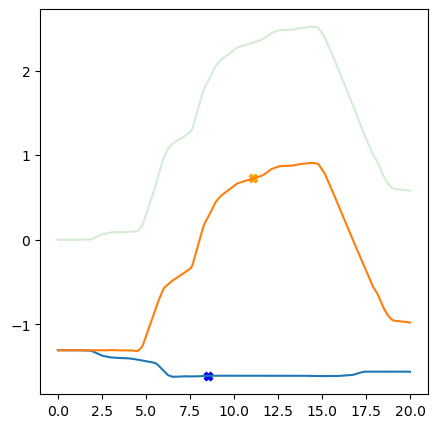

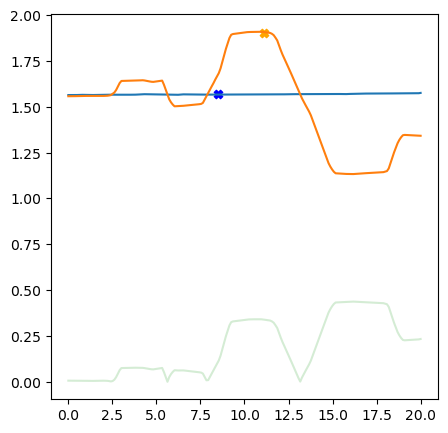

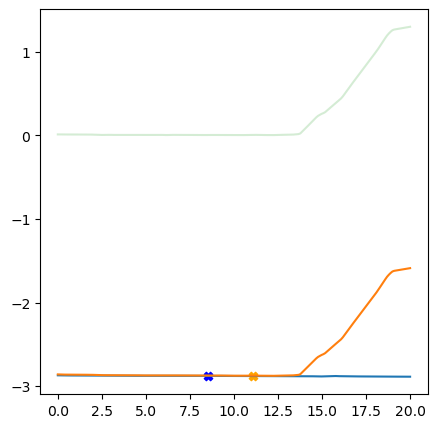

Start observation  [ 0.70351759  1.         -0.52699252 -2.53271271 -0.86313403 -1.30674247
  1.56525831 -2.87242952]
End observation    [ 0.70351759  2.         -0.52033418 -2.52651318 -0.86330798 -1.3069233
  1.55909989 -2.86276848]


In [32]:
# receives the observations, with time as first dimension, and returns the matrix with the observation for every timestep
def create_observation_timestep_matrix_math_transition_tp(observations, t_min, t_max, num_time_steps, plot=True):
    #plot
    for i in range(d_y): #for every dimension in Y vector we are plotting training data and its prediction
        fig = plt.figure(figsize=(5,5))
        for j in range(d_N):
            plt.plot(X[j,:,0],Y[j,:,i]) # plot training data
        plt.scatter(observations[:,0],observations[:,2+i],marker="X", c=observations[:,1], cmap='brg')
        plt.show() 
    # Use the sorted indices based on the first element (time of observation) to reorder the rows of the array (observations are ordered by time)
    sorted_indices = np.argsort(observations[:, 0])
    observations = observations[sorted_indices]
    print(observations)
    #building matrix
    observation_timestep_matrix=np.zeros((num_time_steps,1+observations.shape[1])) #create a matrix with queries of : time (in first position) associated to only one observation at a time
    times_array = np.linspace(t_min,t_max,num_time_steps)
    observation_timestep_matrix[:,0] = times_array #fill times in first position
    print(observation_timestep_matrix.shape)
    # fill for every time the right observation
    curr_obs_num=0
    interpolation_closest_points_found=False
    for time_index,curr_time in enumerate(times_array):
        next_obs_num = curr_obs_num+1
        # if current time is less than observation time OR this is last observation, fill current time with this obs
        if curr_time<=observations[curr_obs_num,0] or next_obs_num>=len(observations):
            #fill current observation in this time
            for i in range(observation_timestep_matrix.shape[1]-1): #for all columns except the first one (time)
                observation_timestep_matrix[time_index,i+1]=observations[curr_obs_num,i] #fill current observation column in the matrix column+1
        else:
            #in between two observations
            # should check the WHOLE time predictions of the two observations, find the two closest points, interpolate
            if not interpolation_closest_points_found:
                print("\nFinding closest couple to set interpolation points to go from %.2f TP to %.2f TP"%(observations[curr_obs_num,1],observations[next_obs_num,1]))
                with torch.no_grad():
                    pred_1ob = model( torch.from_numpy(np.array([observations[curr_obs_num,:]])) , torch.from_numpy(times_array.reshape(num_time_steps,1)) ).numpy()
                    pred_2ob = model( torch.from_numpy(np.array([observations[next_obs_num,:]])) , torch.from_numpy(times_array.reshape(num_time_steps,1)) ).numpy()
                start_param = np.zeros(observations[0].shape) # create empty observation
                end_param = np.zeros(observations[0].shape) # create empty observation
                for dimension_index in range(d_y): 
                    diff = abs(pred_1ob[:,dimension_index]-pred_2ob[:,dimension_index]) #for now only the closest couple on the y columns
                    index_min=np.argmin(diff)
                    fig = plt.figure(figsize=(5,5))
                    plt.plot(times_array,pred_1ob[:,dimension_index])
                    plt.scatter(observations[curr_obs_num,0],observations[curr_obs_num,dimension_index+2],marker="X",color='blue')
                    plt.plot(times_array,pred_2ob[:,dimension_index])
                    plt.scatter(observations[next_obs_num,0],observations[next_obs_num,dimension_index+2],marker="X",color='orange')
                    plt.plot(times_array,diff, alpha=0.2)
                    plt.show()
                diff_sum = np.sum(abs(pred_1ob[:,0:d_y]-pred_2ob[:,0:d_y]) ,axis=1) #for now only the closest couple on the y columns
                index_min=np.argmin(diff_sum)
                start_param[0] = times_array[index_min]
                end_param[0] = times_array[index_min]
                # in second column put the TP
                start_param[1] = observations[curr_obs_num,1]
                end_param[1] = observations[next_obs_num,1]
                for dimension_index in range(d_y): # fill the rest dimensitons with the values
                    start_param[dimension_index+2] = pred_1ob[index_min,dimension_index] 
                    end_param[dimension_index+2] = pred_2ob[index_min,dimension_index] 
                print("Start observation ",start_param)
                print("End observation   ",end_param)
                interpolation_closest_points_found=True
            # calculate fraction of interpolation
            fraction = (curr_time - observations[curr_obs_num,0]) / (observations[next_obs_num,0] - observations[curr_obs_num,0])
            #interpolated_param = start_param + fraction * (end_param - start_param)
            for dim in range(observation_timestep_matrix.shape[1]-1):
                observation_timestep_matrix[time_index,dim+1]=start_param[dim]+ fraction * (end_param[dim] - start_param[dim])
            #if time is same or more than the second observations
            if curr_time>=observations[next_obs_num,0]:
                curr_obs_num = curr_obs_num+1
                next_obs_num = curr_obs_num+1
                interpolation_closest_points_found=False

    return observation_timestep_matrix
        
    
observations=np.array([ [ 8.5000,  1.0000, -0.0091, -2.4850, -0.9167, -1.6070,  1.5681, -2.8762] , [11.1000,  2.0000, -0.2626, -2.2034, -2.1340,  0.7329,  1.9000, -2.8767], ])
observation_timestep_matrix=create_observation_timestep_matrix_math_transition_tp( observations=observations , t_min=0, t_max=20, num_time_steps=200 )
#print("FULL MATRIX")
#print("--- TIME --- X cond --- TP cond --- Y cond")
#print(observation_timestep_matrix)

Matrix shape
(200, 9)
X of the observations in time:


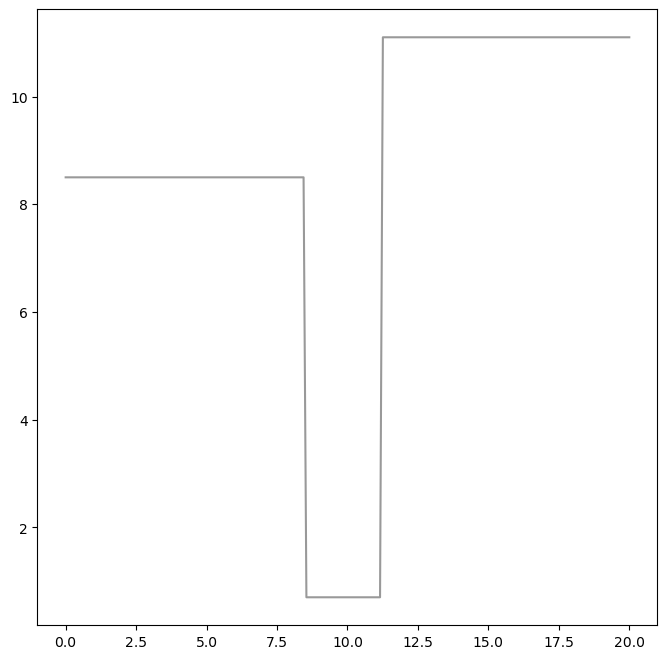

TP of the observations in time:


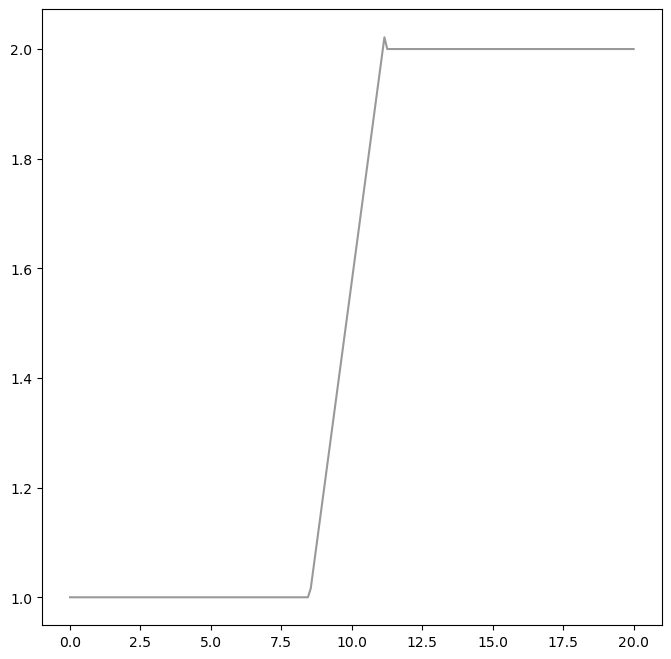

Y of the observations in time:


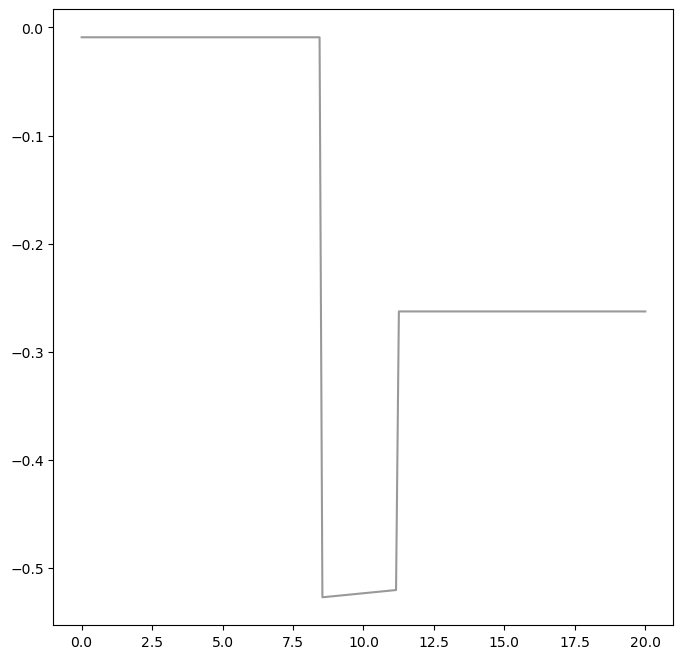

FULL graph observations in time
(blue initial time, pink final time)


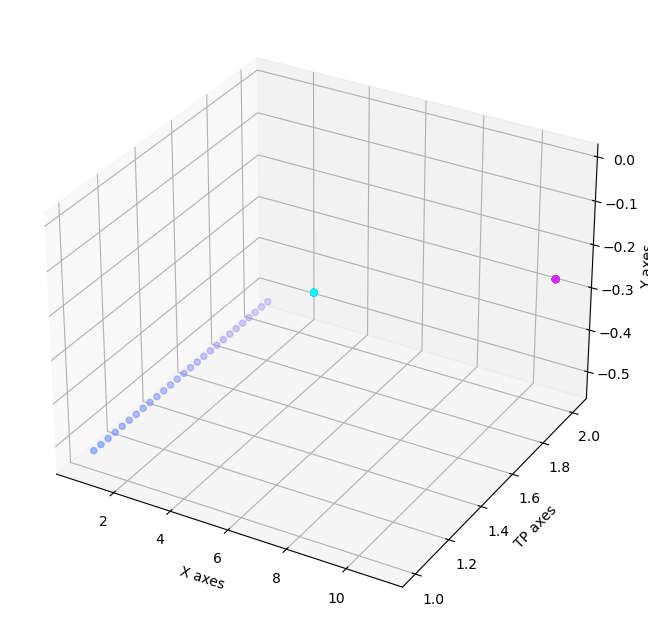

In [33]:
# plot change of condition point in time
def plot_observation_timestep_matrix(observation_timestep_matrix):
    print("Matrix shape")
    print(observation_timestep_matrix.shape)
    print("X of the observations in time:")
    fig = plt.figure(figsize=(8,8))
    line,=plt.plot(observation_timestep_matrix[:,0],observation_timestep_matrix[:,1],color='black',alpha=0.4)
    plt.show()  
    print("TP of the observations in time:")
    fig = plt.figure(figsize=(8,8))
    line,=plt.plot(observation_timestep_matrix[:,0],observation_timestep_matrix[:,2],color='black',alpha=0.4)
    plt.show()  
    print("Y of the observations in time:")
    fig = plt.figure(figsize=(8,8))
    line,=plt.plot(observation_timestep_matrix[:,0],observation_timestep_matrix[:,3],color='black',alpha=0.4)
    plt.show()  
    print("FULL graph observations in time")
    print("(blue initial time, pink final time)")
    fig = plt.figure(figsize=(8,8))
    ax = fig.add_subplot(111, projection='3d')
    ax.scatter(observation_timestep_matrix[:,1],observation_timestep_matrix[:,2],observation_timestep_matrix[:,3], c=observation_timestep_matrix[:,0], cmap='cool', marker='o')
    ax.set_xlabel('X axes')
    ax.set_ylabel('TP axes')
    ax.set_zlabel('Y axes')
    plt.show()

plot_observation_timestep_matrix(observation_timestep_matrix)

(200, 6)
(2, 200, 2) (2, 200, 6)
(2, 200, 2) (2, 200, 6)


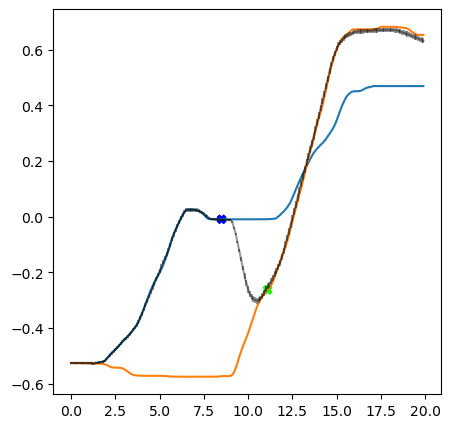

(2, 200, 2) (2, 200, 6)
(2, 200, 2) (2, 200, 6)


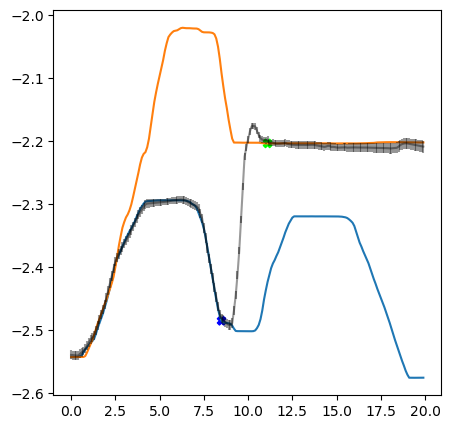

(2, 200, 2) (2, 200, 6)
(2, 200, 2) (2, 200, 6)


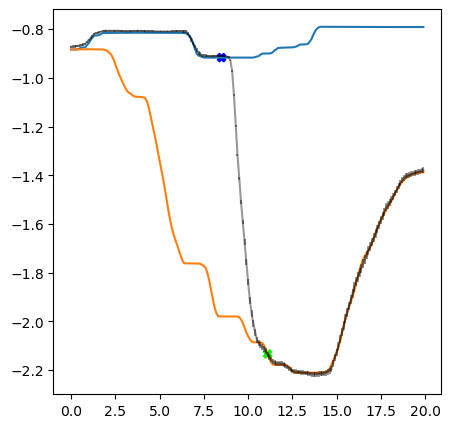

(2, 200, 2) (2, 200, 6)
(2, 200, 2) (2, 200, 6)


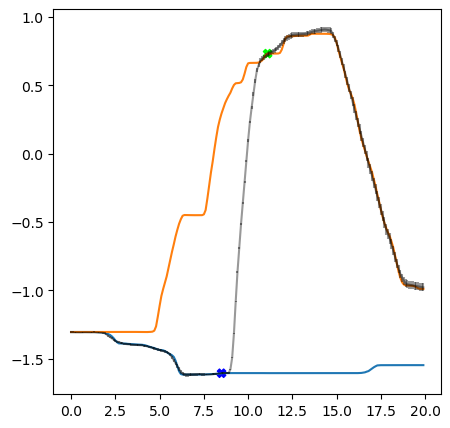

(2, 200, 2) (2, 200, 6)
(2, 200, 2) (2, 200, 6)


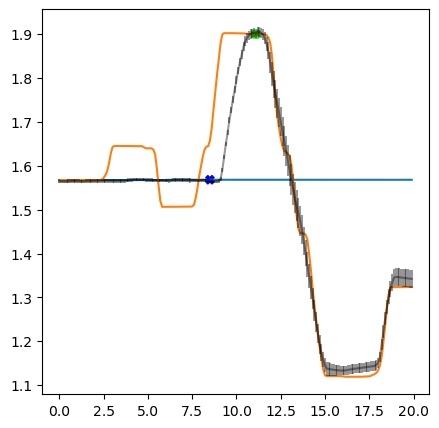

(2, 200, 2) (2, 200, 6)
(2, 200, 2) (2, 200, 6)


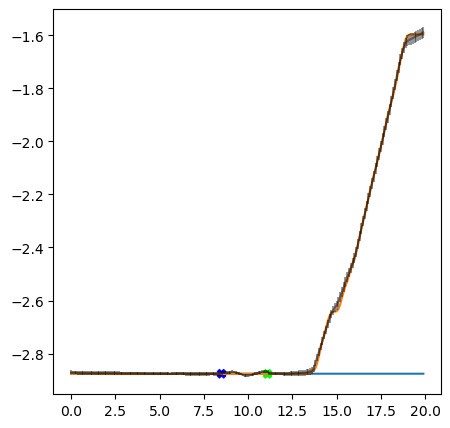

In [34]:
def predict_model_observation_for_timestep(array_observation_for_time, target_X, plot=True):
    #instead of passing the array of multiple observations, pass the computed array with a single observation of every time step
    predicted_Y = np.zeros((len(target_X),d_y))
    print(predicted_Y.shape)
    predicted_std = np.zeros((len(target_X),d_y))
    for time_index, time in enumerate(target_X):
        with torch.no_grad():
            prediction = model( torch.from_numpy(np.array([ array_observation_for_time[time_index] ])) , torch.from_numpy(np.array([[time]])) ).numpy()
            #print(time_index, time, array_observation_for_time[time_index])
            #print(prediction)
            predicted_Y[time_index] = prediction[:,:d_y]
            predicted_std[time_index] = np.log(1+np.exp(prediction[:,d_y:]))
    if plot: # We highly recommend that you customize your own plot function, but you can use this function as default
        for i in range(d_y): #for every feature in Y vector we are plotting training data and its prediction
            fig = plt.figure(figsize=(5,5))
            for j in range(d_N):
                print(X.shape, Y.shape)
                plt.plot(X[j,:,0],Y[j,:,i]) # plot training data assuming X[j,:,0] is time
            #plt.plot(X[j,:,0],predicted_Y[:,i],marker="o",color='red')
            plt.errorbar(X[j,:,0],predicted_Y[:,i],yerr=predicted_std[:,i],color='black',alpha=0.4)
            plt.scatter(observations[:,0],observations[:,d_x+i],marker="X", c=observations[:,1], cmap='brg')
            plt.show()  
    return predicted_Y, predicted_std

predicted_Y, predicted_std = predict_model_observation_for_timestep(observation_timestep_matrix[:, 1:],observation_timestep_matrix[:,0]) #passing the observations without the first column that is time with TP, passing time array aside WITHOUT TP

In [35]:
step=100
np.concatenate((X[1,step],Y[1,step]), axis=0)

array([10.        ,  2.        , -0.41872102, -2.20221073, -2.06107456,
        0.66206133,  1.90193808, -2.87669069])

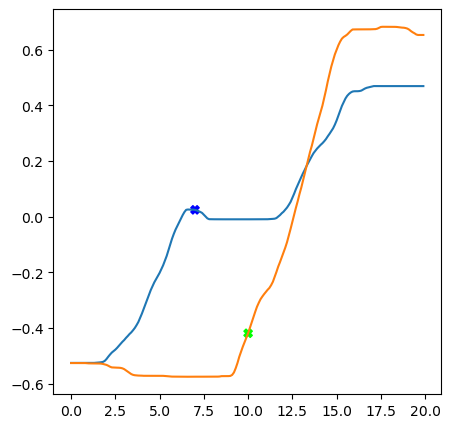

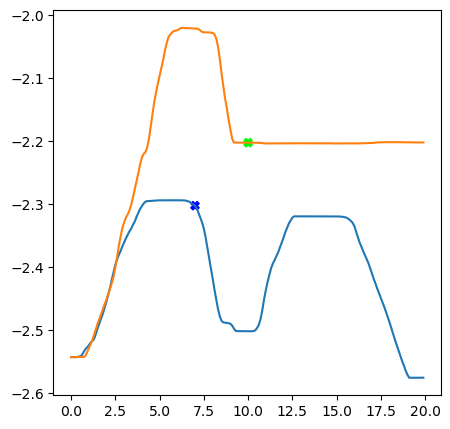

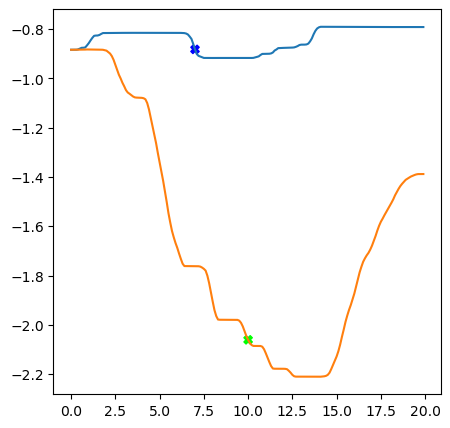

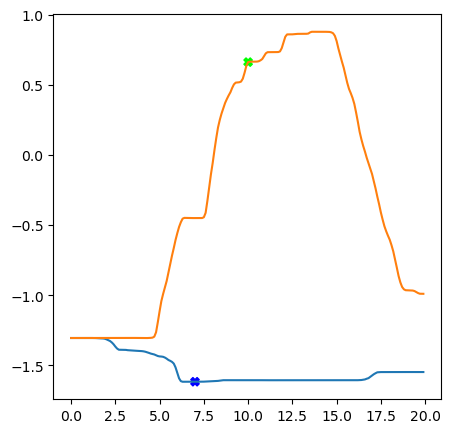

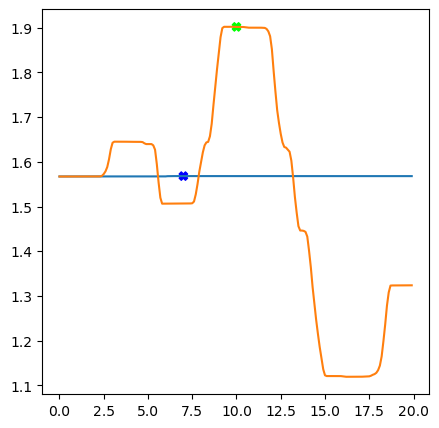

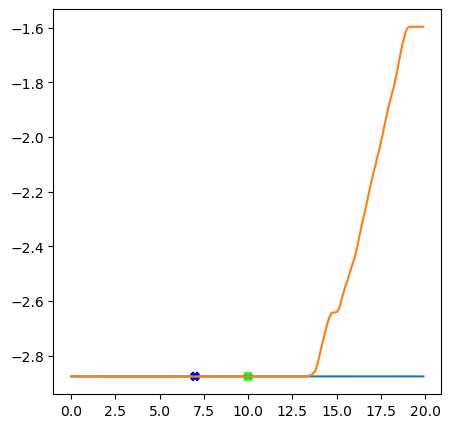

[[ 7.          1.          0.02484592 -2.30220443 -0.88180715 -1.61691314
   1.56809616 -2.87615139]
 [10.          2.         -0.41872102 -2.20221073 -2.06107456  0.66206133
   1.90193808 -2.87669069]]
(200, 9)

Finding closest couple to set interpolation points to go from 1.00 TP to 2.00 TP


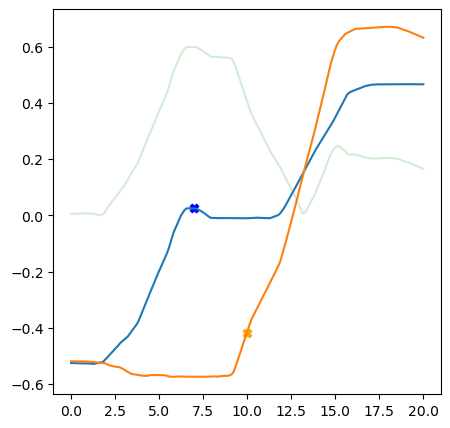

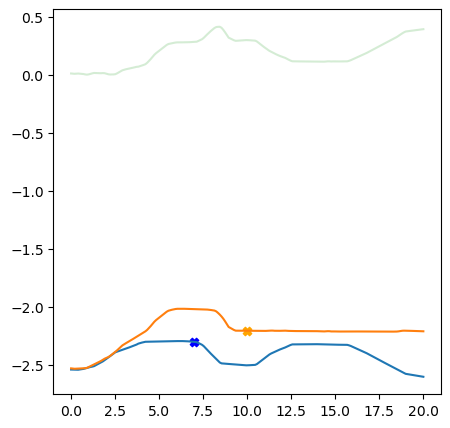

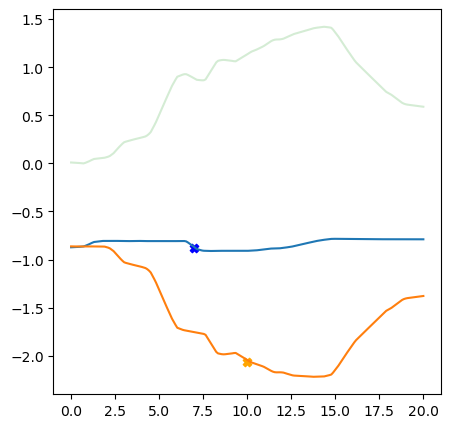

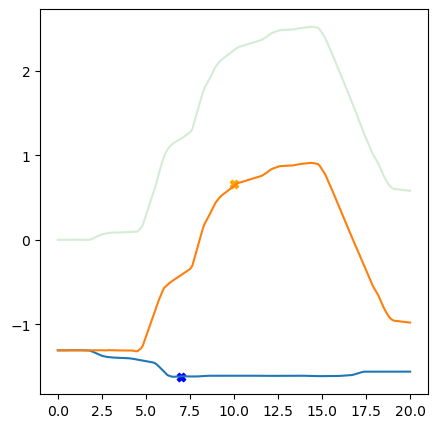

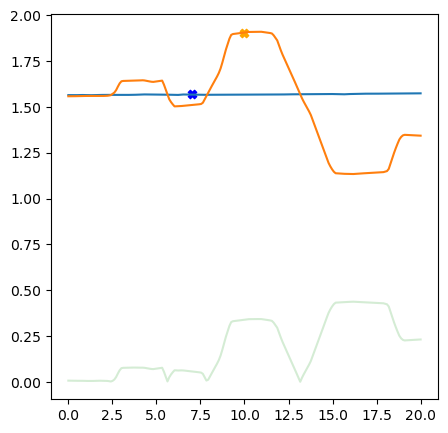

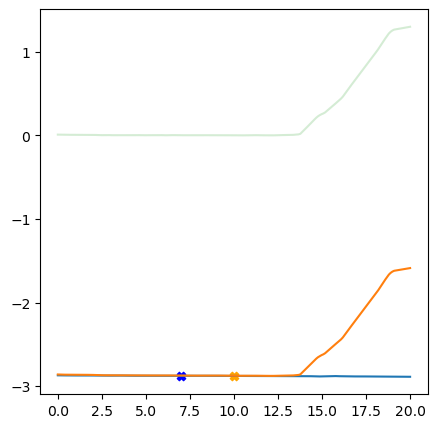

Start observation  [ 0.70351759  1.         -0.52741647 -2.53214016 -0.86356349 -1.30532519
  1.5650159  -2.87152585]
End observation    [ 0.70351759  2.         -0.52033617 -2.52679651 -0.86331363 -1.30736606
  1.55933701 -2.86349393]
(200, 6)
(2, 200, 2) (2, 200, 6)
(2, 200, 2) (2, 200, 6)


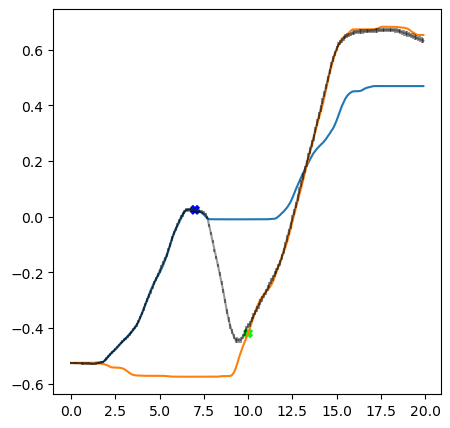

(2, 200, 2) (2, 200, 6)
(2, 200, 2) (2, 200, 6)


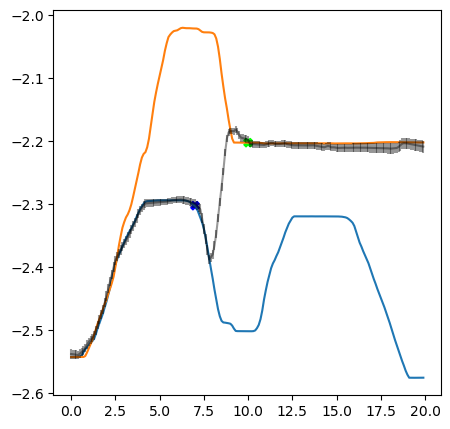

(2, 200, 2) (2, 200, 6)
(2, 200, 2) (2, 200, 6)


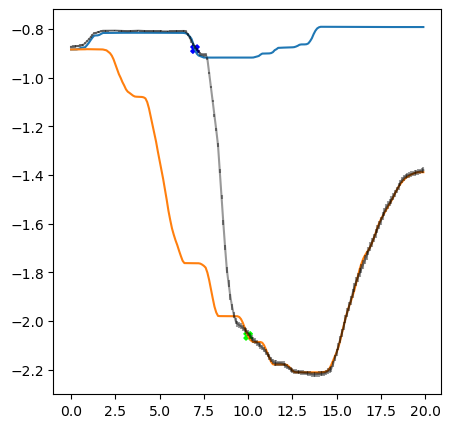

(2, 200, 2) (2, 200, 6)
(2, 200, 2) (2, 200, 6)


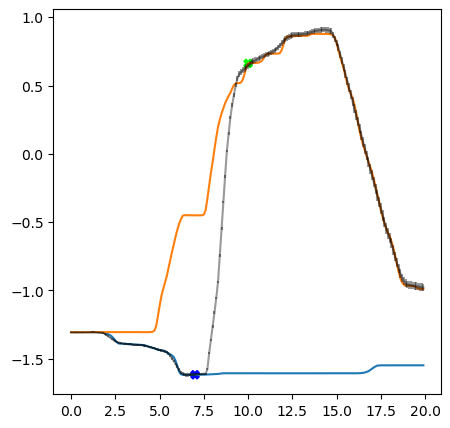

(2, 200, 2) (2, 200, 6)
(2, 200, 2) (2, 200, 6)


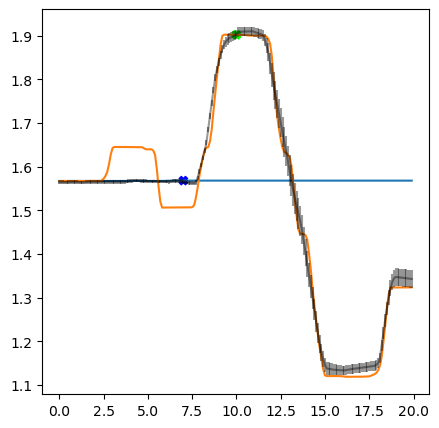

(2, 200, 2) (2, 200, 6)
(2, 200, 2) (2, 200, 6)


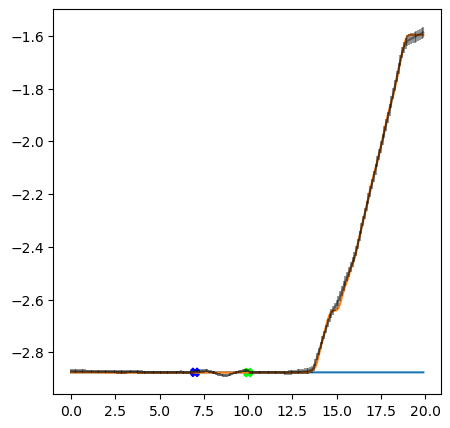

In [36]:
# Another compact test
observations=np.array([ [ 7,  1,  0.02484592, -2.30220443, -0.88180715, -1.61691314,  1.56809616, -2.87615139] ,
                        [10.        ,  2.        , -0.41872102, -2.20221073, -2.06107456,     0.66206133,  1.90193808, -2.87669069], 
                      ])
observation_timestep_matrix=create_observation_timestep_matrix_math_transition_tp( observations=observations , t_min=0, t_max=20, num_time_steps=200 )
predicted_Y, predicted_std=predict_model_observation_for_timestep(observation_timestep_matrix[:, 1:],observation_timestep_matrix[:,0]) #passing the observations without the first column that is time with TP, passing time array aside WITHOUT TP

In [379]:
print(predicted_Y.shape)

(200, 6)


In [47]:
header = 'Time,ROS secs,ROS nsecs,________p_x________,________p_y________,________p_z________,________q_x________,________q_y________,________q_z________,________q_w________,gripper_position,gripper_force,shoulder_pan_joint,shoulder_lift_joint,elbow_joint,wrist_1_joint,wrist_2_joint,wrist_3_joint'

In [65]:
result_array = np.concatenate((times_original_ms_array.reshape(200,1),np.zeros((200,11)),predicted_Y), axis=1)
print(result_array.shape)
np.savetxt('output3.csv',result_array,delimiter=',',header=header,comments='')
print('exported')

(200, 18)
exported
